# **Analysis LegendPLex Serum Cytokines ANTICIPATE Covid**


# Install and import packages

In [1]:
#pip install imgaug==0.2.5

In [2]:
#pip install matplotlib==3.4.3

In [3]:
#pip install squarify

In [4]:
#pip install lifelines

In [5]:
#pip install statsmodels

In [6]:
#import
import pandas as pd
import matplotlib.colors as colors
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import scipy.stats
from scipy.spatial import distance
from scipy.cluster import hierarchy

In [7]:
def corr_cov_matrix_cluster(df, markers=['all_markers'], metric='pearson',clustering_method = 'average', linkage_distance=0.75):
    'calculate a covariance/correlation matrix with flattened hierarchical clustering'
    #define markers to correlate
    if markers == ['all_markers']:
        markers = list(df.columns)
    # Filter out genes not present data
    marker_cytokines_filtered = []
    for marker in markers:
        if marker in df.columns:   
            marker_cytokines_filtered.append(marker)
            
    # Filter out genes not present in data
    a = np.std(df.loc[:,df.columns.isin(marker_cytokines_filtered)], axis=0)
    b = pd.DataFrame(a.T, index=a[df.columns.isin(marker_cytokines_filtered)].index)
    c = b[0]!=0
    d = b[c]
    e = b[0]==0
    f = b[e]
    marker_cytokines_filtered_nonzeroSD = d

    #marker gene list
    marker_cytokines_filtered_nonzeroSD = list(marker_cytokines_filtered_nonzeroSD.index)
    
    #calculate covariance or corrcoef 
    if metric == 'pearson':             
        subsetcluster_cov = np.corrcoef(df.loc[:,marker_cytokines_filtered_nonzeroSD].T)
    elif metric == 'covariance':            
        subsetcluster_cov = np.cov(df.loc[:,marker_cytokines_filtered_nonzeroSD].T)
    else:
        print('please set variable <subsetcluster_cov> to either: pearson, covariance or covariance_log')
        subsetcluster_df = pd.DataFrame(subsetcluster_cov, index=marker_cytokines_filtered_nonzeroSD, columns=marker_cytokines_filtered_nonzeroSD)
    
    #hierarchically cluster rows and columns   
    if True not in np.isnan(subsetcluster_cov):
        #define hierachical clustering
        row_linkage= hierarchy.linkage(scipy.spatial.distance.squareform(1-subsetcluster_cov, force='tovector', checks=False), method=clustering_method)
        col_linkage = hierarchy.linkage(scipy.spatial.distance.squareform(1-subsetcluster_cov.T, force='tovector', checks=False), method=clustering_method)
        #color side bar according to flat clustering
    
    else:
        print('dataframe contains NaNs')
    row_col = []
    col_col = []
    hierarchical_cluster = scipy.cluster.hierarchy.fcluster(row_linkage, linkage_distance, criterion='distance')
    for j in hierarchical_cluster:
        a = color_map_clusters_nogrey[j]
        row_col.append(a)
        col_col.append(a)
        
    return pd.DataFrame(hierarchical_cluster, index=df.columns, columns=['cluster'])


In [8]:
def boot_corr_cov_matrix_cluster(cov_df, n_iters = 100,replacement=True,metric='pearson',clustering_method = 'average', linkage_distance=0.75):
  'calculate a correlation matrix then hierarchically cluster and flatten clustering according to copheneitic distance, bootstrap to obtain probabilties of clustering \
  for each pair of columns from the initial dataframe'

  #first step: bootstrap to produce flat clusterings
  counter =0
  df_list = [] #store results here

  print('bootstrapping')
  while counter <n_iters:
    cov_df_sampling = cov_df.sample(frac=1, replace=replacement, weights=None, axis=0)
    cov_df_sampled = corr_cov_matrix_cluster(cov_df_sampling,metric=metric,clustering_method = clustering_method, linkage_distance=linkage_distance)
    df_list.append(cov_df_sampled)
    counter = counter +1
  print('bootstrapping completed')
  #df containing the flat clusters of each iteration
  clustering_boot_df = pd.concat(df_list, axis=1, join='outer', ignore_index=False, keys=None, levels=None, names=None, verify_integrity=False, sort=False, copy=True)

  #second step: now we count the cooccurence of cytokines in each clustering and aggregate this information in a new dataframe

  boots_trap_df_cytokines = pd.DataFrame(index=marker_cytokines, columns=marker_cytokines)
  boots_trap_df_cytokines = boots_trap_df_cytokines.fillna(value=0, method=None, axis=None, inplace=False, limit=None, downcast=None)
  print('aggregating data')
  #iterate over each sampled clustering
  for h in range(len(clustering_boot_df.columns)):
    clustering_boot_df_subset = clustering_boot_df.iloc[:,h]
    #iterate over each cluster
    for i in set(clustering_boot_df_subset):
      cytokines_in_cluster = clustering_boot_df_subset[clustering_boot_df_subset==i].index
      #set cytokines falling into one cluster to 1 in new dataframe merging the results
      for j in cytokines_in_cluster:
        for k in cytokines_in_cluster:
          boots_trap_df_cytokines.loc[j,k] = boots_trap_df_cytokines.loc[j,k]+1
          
  return boots_trap_df_cytokines

In [9]:
def custom_sort_pandas(df, column_name, column_levels):
  #sort dataframe by custom list
  df_mapping = pd.DataFrame({
    column_name: column_levels})
  sort_mapping = df_mapping.reset_index().set_index(column_name)
  df['num'] = df[column_name].map(sort_mapping['index'])
  df = df.sort_values('num')
  df = df.drop(columns='num')
  return df

In [10]:
#pip install pymatch

# Load data

In [14]:
#paths

#enter the directory path containing the data here
DATA_DIR = 'ANTICIPATE_COVID-19_final/ANTICIPATE_COVID-19/data/'
figure_save_path = 'ANTICIPATE_COVID-19_final/ANTICIPATE_COVID-19/data/figures/'
figure_source_path = 'ANTICIPATE_COVID-19_final/ANTICIPATE_COVID-19/data/figures/source/'

#cytokine data
JK210728_panel1_path = DATA_DIR+ 'JK4-1-1-210728_panel1.csv'
JK210728_panel2_path = DATA_DIR+ 'JK4-1-1-210728_panel2.csv'
JK210803_panel1_path = DATA_DIR+ 'JK4-1-2-210803_Panel1_clean.csv'
JK210803_panel2_path = DATA_DIR+ 'JK4-1-2-210803_Panel2_clean.csv'
JK210810_panel1_path = DATA_DIR+ 'JK4-1-3-210810_Panel1_clean.csv'
JK210810_panel2_path = DATA_DIR+ 'JK4-1-3-210810_Panel2_clean.csv'

#antibody data
covid_antibodies_path = DATA_DIR+ 'covid_vacc_antibodies.csv'

#lab data3
covid_1st_dose_crp_path = DATA_DIR+ 'covid_1st_dose_crp.csv'
covid_2nd_dose_crp_path = DATA_DIR+ 'covid_2nd_dose_crp_v2.csv'
covid_1st_dose_platelets_path = DATA_DIR+ 'covid_1st_dose_platelets.csv'
covid_2nd_dose_platelets_path = DATA_DIR+ 'covid_2nd_dose_platelets_v2.csv'

#metadata
#patient_table_path = DATA_DIR + 'ANTICIPATE_cohort1_patient_info_all_v4.csv'
#patient_table_path = DATA_DIR + 'ANTICIPATE_cohort1_patient_info_all_v6.csv'
patient_table_path = DATA_DIR + 'ANTICIPATE_cohort1_patient_info_all_v7.csv'

sample_table_path = DATA_DIR + 'sample_list_v2.csv'
#long_term_ae_path = DATA_DIR + 'ANTICIPATE_cohort1_longterm_AE_all_v5.csv'
long_term_ae_path = DATA_DIR + 'ANTICIPATE_cohort1_longterm_AE_all_v6.csv'

#post_vaccine_ae_path = DATA_DIR + 'ANTICIPATE_cohort1_post_vaccine_AE_v4.csv'
post_vaccine_ae_path = DATA_DIR + 'ANTICIPATE_cohort1_post_vaccine_AE_v5.csv'

#patients to remove because vaccination before ICT
patients_to_remove = ['3LPKO0',
'N8V2OD' ,
'ZGNF1D'  ,
'0SSMCL',
'9R3KE7',
'688HB6']

In [15]:
#metadata and colors

#patients
patient_table = pd.read_csv(patient_table_path, index_col='Patient_ID')
patient_table = patient_table[~patient_table.index.isin(patients_to_remove)]
patient_table = patient_table[~patient_table.index.isna()] #remove nan rows introduced by excel
patient_color_dict = patient_table['color_code'].to_dict()

#samples
sample_table = pd.read_csv(sample_table_path, index_col='sample_id')
sample_table['patient_id'] = sample_table.index.str.slice(stop=-3)
sample_table = sample_table[~sample_table['patient_id'].isin(patients_to_remove)]
sample_table = sample_table.drop(columns=['patient_id'])
time_dict = sample_table['timepoint'].to_dict()

#colors
blue_red_grey = ['#1452f9','#f92214','#bfbfbf']
blue_blue_red_grey = ['#1452f9','#85a5fa','#f92214','#bfbfbf']
timepoint_color_dict = {'pre':'#000000', 'post1':'#c8c8c8', 'post2':'#afdc20'}
time_color_dict = {x:timepoint_color_dict[time_dict[x]] for x in time_dict}
color_map_clusters_nogrey = ["#FFFF00", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
"#5A0007", "#809693", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
"#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
"#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
"#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
"#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
"#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
"#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
"#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
"#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
"#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
"#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72", "#6A3A4C"]

#color dict cytokines
color_dict_cyt = {'CCL2':'#FFFF00',
 'CCL3': '#1CE6FF',
 'CCL4': '#FF34FF',
 'CSF2': '#FF4A46',
 'CSF3':'#008941',
 'CXCL10':'#006FA6',
 'CXCL8':'#A30059',
 'IFN-a2':'#7A4900',
 'IFN-g': '#0000A6',
 'IL-10':'#63FFAC',
 'IL-12p70':'#B79762',
 'IL-13': '#004D43',
 'IL-15':'#8FB0FF',
 'IL-17a':'#997D87',
 'IL-18': '#5A0007',
 'IL-1b':'#809693',
 'IL-2':'#1B4400',
 'IL-4': '#4FC601',
 'IL-5': '#3B5DFF',
 'IL-6':'#4A3B53',
 'IL-7':'#FF2F80',
 'TNF-a': '#61615A',
 'VEGF':'#BA0900',
 'sIL-1RA':'#6B7900',
 'sIL-2RA':'#00C2A0'}


In [16]:
def isna(x):
  return x!=x


## lab data

In [14]:
#read AE
long_term_ae = pd.read_csv(long_term_ae_path)
long_term_ae = long_term_ae[~long_term_ae['Patient_ID'].isin(patients_to_remove)]
long_term_ae

post_vacc_ae = pd.read_csv(post_vaccine_ae_path) 
post_vacc_ae = post_vacc_ae[~post_vacc_ae.isna().all(axis=1)]
post_vacc_ae = post_vacc_ae.loc[:,~post_vacc_ae.isna().all(axis=0)]
post_vacc_ae = post_vacc_ae[~post_vacc_ae['Patient_ID'].isin(patients_to_remove)]
post_vacc_ae

,Patient_ID,Post_vacc_AE,Date_AE,CTCAE_grade
0,19U0MP,Creatinine_Increase,5/26/2021,1.0
1,19U0MP,Fever,6/8/2021,1.0
2,19U0MP,Headache,6/8/2021,1.0
3,1K9IAN,Anemia,6/14/2021,2.0
4,1K9IAN,Bilirubin_Increase,6/14/2021,1.0
...,...,...,...,...
63,W0D7T8,Sepsis,4/14/2021,3.0
64,W1CYGF,Fatigue,6/23/2021,1.0
65,X9H3PX,Bilirubin_Increase,6/4/2021,1.0
66,YJYW3T,Fatigue,4/25/2021,1.0


In [15]:
#count grade 3 and overall AE (long term AE)
patient_AEs = pd.DataFrame()
patients_with_AE = list(set(long_term_ae['Patient_ID']))

for i in set(patient_table[patient_table['vaccinated']==True].index):
  if i in patients_with_AE:
    long_term_ae_subset = long_term_ae[long_term_ae['Patient_ID']==i]
    long_term_ae_max =  max(long_term_ae_subset['CTCAE_grade'])
    del long_term_ae_subset
    if long_term_ae_max >= 3:
      long_term_ae_max_bin = 3
    elif long_term_ae_max < 3:
      long_term_ae_max_bin = long_term_ae_max
    elif isna(long_term_ae_max):
      long_term_ae_max_bin = 0
  else:
    long_term_ae_max_bin = 0
  patient_AEs.loc[i,'max_CTCAE'] = long_term_ae_max_bin

print('all patients analyzed:',len(patient_AEs))
print('patients with any AE:',len(patient_AEs[patient_AEs['max_CTCAE']>0].index))
print('frequency any AE is:', len(patient_AEs[patient_AEs['max_CTCAE']>0].index)/len(patient_AEs.index))
print('patients with grade >=3 AE:',len(patient_AEs[patient_AEs['max_CTCAE']>=3].index))
print('frequency grade >=3 AE is:', len(patient_AEs[patient_AEs['max_CTCAE']>=3].index)/len(patient_AEs.index))

all patients analyzed: 64
patients with any AE: 61
frequency any AE is: 0.953125
patients with grade >=3 AE: 30
frequency grade >=3 AE is: 0.46875


In [16]:
#count grade 3 and overall AE (postvacc AE)
patient_AEs = pd.DataFrame()
patients_with_AE = list(set(post_vacc_ae['Patient_ID']))

for i in set(patient_table[patient_table['vaccinated']==True].index):
  if i in patients_with_AE:
    post_vacc_ae_subset = post_vacc_ae[post_vacc_ae['Patient_ID']==i]
    post_vacc_ae_max =  max(post_vacc_ae_subset['CTCAE_grade'])
    del post_vacc_ae_subset
    if post_vacc_ae_max >= 3:
      post_vacc_ae_max_bin = 3
    elif post_vacc_ae_max < 3:
      post_vacc_ae_max_bin = post_vacc_ae_max
    elif isna(post_vacc_ae_max):
      post_vacc_ae_max_bin = 0
  else:
    post_vacc_ae_max_bin = 0
  patient_AEs.loc[i,'max_CTCAE'] = post_vacc_ae_max_bin

print('patients with any AE:',len(patient_AEs[patient_AEs['max_CTCAE']>0].index))
print('frequency any AE is:', len(patient_AEs[patient_AEs['max_CTCAE']>0].index)/len(patient_AEs.index))
print('patients with grade >=3 AE:',len(patient_AEs[patient_AEs['max_CTCAE']>=3].index))
print('frequency grade >=3 AE is:', len(patient_AEs[patient_AEs['max_CTCAE']>=3].index)/len(patient_AEs.index))

patients with any AE: 39
frequency any AE is: 0.609375
patients with grade >=3 AE: 8
frequency grade >=3 AE is: 0.125


In [17]:
#read lab data

#crp after dose 1
covid_crp_1st_dose_df = pd.read_csv(covid_1st_dose_crp_path)
covid_crp_1st_dose_df = covid_crp_1st_dose_df[~covid_crp_1st_dose_df['patient_id'].isin(patients_to_remove)]
#crp after dose 2
covid_crp_2nd_dose_df = pd.read_csv(covid_2nd_dose_crp_path)
covid_crp_2nd_dose_df = covid_crp_2nd_dose_df[~covid_crp_2nd_dose_df['patient_id'].isin(patients_to_remove)]
covid_crp_2nd_dose_df 


,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0,Unnamed: 0.1,patient_id,vaccine_type,timepoint,Value
0,0,0,0,0,IZO4HU,Comirnaty,0,2.0
1,1,1,1,1,FKLSVO,Comirnaty,0,2.0
2,2,2,2,2,E61BKL,Comirnaty,0,8.0
3,3,3,3,3,KUDJHR,Comirnaty,0,2.8
4,4,4,4,4,F81VCA,Comirnaty,0,2.3
...,...,...,...,...,...,...,...,...
134,142,146,146,146,KWO5UQ,Astra Zeneca,24,22.9
135,143,147,147,147,G8ZRBI,Astra Zeneca,51,2.0
136,144,148,148,148,KWO5UQ,Astra Zeneca,43,21.7
137,145,149,149,149,SVXZIG,Comirnaty,0,7.5


In [18]:
#read lab data

#platelets after dose 1
covid_platelets_1st_dose_df = pd.read_csv(covid_1st_dose_platelets_path)
covid_platelets_1st_dose_df = covid_platelets_1st_dose_df[~covid_platelets_1st_dose_df['patient_id'].isin(patients_to_remove)]
#platelets after dose 2
covid_platelets_2nd_dose_df = pd.read_csv(covid_2nd_dose_platelets_path)
covid_platelets_2nd_dose_df = covid_platelets_2nd_dose_df[~covid_platelets_2nd_dose_df['patient_id'].isin(patients_to_remove)]
covid_platelets_2nd_dose_df 

,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,patient_id,vaccine_type,timepoint,Value
0,0,0,0,0,0,VMQLNV,Comirnaty,0,255
1,1,1,1,1,1,IZO4HU,Comirnaty,0,290
2,2,2,2,2,2,FKLSVO,Comirnaty,0,290
3,3,3,3,3,3,E61BKL,Comirnaty,0,203
4,4,4,4,4,4,KUDJHR,Comirnaty,0,226
...,...,...,...,...,...,...,...,...,...
150,157,162,162,162,162,EC6DJA,Comirnaty,12,40
151,158,163,163,163,163,EC6DJA,Comirnaty,19,86
152,159,164,164,164,164,EC6DJA,Comirnaty,25,183
153,160,165,165,165,165,SVXZIG,Comirnaty,0,371


In [19]:
df =covid_platelets_2nd_dose_df 
df_save_path = covid_2nd_dose_platelets_path
#function to define nans

vaccine_type = {}
for i in patient_table.index: 
  a = patient_table.loc[i,'First_dose_vaccine']
  b = patient_table.loc[i,'Second_dose_vaccine']
  if isna(a):
    vaccine_type[i]='NA'
  elif isna(b):
    vaccine_type[i]=a
  elif a==b:
      vaccine_type[i]=a
  else:
    vaccine_type[i]='heterologous'

df['vaccine_type'] = df['patient_id'].map(vaccine_type)
#df.to_csv(df_save_path)
df

,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,patient_id,vaccine_type,timepoint,Value
0,0,0,0,0,0,VMQLNV,Comirnaty,0,255
1,1,1,1,1,1,IZO4HU,Comirnaty,0,290
2,2,2,2,2,2,FKLSVO,Comirnaty,0,290
3,3,3,3,3,3,E61BKL,Comirnaty,0,203
4,4,4,4,4,4,KUDJHR,Comirnaty,0,226
...,...,...,...,...,...,...,...,...,...
150,157,162,162,162,162,EC6DJA,Comirnaty,12,40
151,158,163,163,163,163,EC6DJA,Comirnaty,19,86
152,159,164,164,164,164,EC6DJA,Comirnaty,25,183
153,160,165,165,165,165,SVXZIG,Comirnaty,0,371


## antibody data

In [20]:
#read antibody data
covid_antibody_df = pd.read_csv(covid_antibodies_path,index_col=0)
covid_antibody_df = covid_antibody_df[~covid_antibody_df['patient'].isin(patients_to_remove)]
covid_antibody_df = covid_antibody_df.groupby('sample').agg('mean')
covid_antibody_df

,neut_antibody_pg_ml
sample,
0ZTE2L_T3,3848559.0
0ZTE2L_T4,7231127.0
13N151_T0,5959513.0
13N151_T1,52690692.0
13N151_T2,8442583.0
...,...
VMQLNV_T7,12061851.5
X65WDO_T1,25620432.0
X65WDO_T3,8506702.5


In [21]:
#read antibody timepoints and convert to dict
covid_antibody_timepoints_df = pd.read_csv(sample_table_path,index_col='sample_id')
covid_antibody_timepoints_df['patient_id'] = covid_antibody_timepoints_df.index.str.slice(stop=-3)
covid_antibody_timepoints_df = covid_antibody_timepoints_df[~covid_antibody_timepoints_df['patient_id'].isin(patients_to_remove)]
covid_antibody_timepoints_df = covid_antibody_timepoints_df.drop(columns=['patient_id'])
covid_antibody_timepoints_time_dict = covid_antibody_timepoints_df['time_from_first'].to_dict()
covid_antibody_timepoints_timepoint_dict = covid_antibody_timepoints_df['timepoint'].to_dict()

In [22]:
#add timepoints to antibody data
covid_antibody_df['timepoint'] =  covid_antibody_df.index.map(covid_antibody_timepoints_timepoint_dict)
covid_antibody_df['time_from_vacc'] =  covid_antibody_df.index.map(covid_antibody_timepoints_time_dict)
covid_antibody_df

,neut_antibody_pg_ml,timepoint,time_from_vacc
sample,,,
0ZTE2L_T3,3848559.0,pre,-6
0ZTE2L_T4,7231127.0,post2,50
13N151_T0,5959513.0,pre,-9
13N151_T1,52690692.0,post2,33
13N151_T2,8442583.0,post2,162
...,...,...,...
VMQLNV_T7,12061851.5,post2,75
X65WDO_T1,25620432.0,pre,-81
X65WDO_T3,8506702.5,post2,106


## cytokine plex data

In [23]:
#read data, aggregate, fill nan (not detected) with 0s
JK210728_panel1 = pd.read_csv(JK210728_panel1_path, index_col=0)
JK210728_panel1['patient_id'] = JK210728_panel1['sample_id'].str.slice(stop=-3)
JK210728_panel1 = JK210728_panel1[~JK210728_panel1['patient_id'].isin(patients_to_remove)]
JK210728_panel1 = JK210728_panel1.drop(columns=['patient_id'])
JK210728_panel1 = JK210728_panel1.drop(columns='experiment')
JK210728_panel1 = JK210728_panel1.drop(columns='sample_type')
JK210728_panel1_mean = JK210728_panel1.groupby('sample_id').agg('mean')
JK210728_panel1_mean =  JK210728_panel1_mean.fillna(value=0)
JK210728_panel1_mean


,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10
sample_id,,,,,,,,,,,,,
2JJ523_T2,0.002650,0.488808,0.016810,0.001488,0.000316,0.000910,0.005456,0.211265,0.008540,0.000930,0.318752,0.006385,0.000835
2JJ523_T3,0.026955,0.907744,0.026560,0.001220,0.000924,0.003140,0.004868,0.539480,0.456795,0.000830,0.532683,0.006657,0.000930
2JJ523_T4,0.086625,0.321022,0.031870,0.001302,0.000102,0.000000,0.011186,0.315895,0.001834,0.000320,0.145320,0.006830,0.000590
39H11P_T1,0.013130,0.337564,0.071865,0.006496,0.007225,0.030030,0.011756,0.442580,0.012064,0.018190,0.224313,0.027177,0.005760
39H11P_T2,0.021395,0.328287,0.096350,0.012617,0.016002,0.042840,0.018211,0.664240,0.032115,0.023310,0.324601,0.093914,0.007595
A8SRJO_T1,0.026010,0.141701,0.046290,0.004665,0.003589,0.025790,0.009542,0.416260,0.011428,0.015820,0.232117,0.013157,0.006275
A8SRJO_T3,0.022570,0.241727,0.050005,0.007533,0.003455,0.031835,0.015387,0.516580,0.013383,0.021475,0.424998,0.009387,0.009605
F81VCA_T2,0.003480,0.218582,0.038920,0.000467,0.001040,0.003505,0.014075,0.219130,0.003891,0.001595,0.383545,0.000000,0.001965
F81VCA_T3,0.000970,0.196750,0.089980,0.000535,0.001312,0.001405,0.009409,0.281470,0.002112,0.001400,0.105959,0.000000,0.001340


In [24]:
#read data, aggregate, fill nan (not detected) with 0s
JK210728_panel2 = pd.read_csv(JK210728_panel2_path, index_col=0)
JK210728_panel2['patient_id'] = JK210728_panel2['sample_id'].str.slice(stop=-3)
JK210728_panel2 = JK210728_panel2[~JK210728_panel2['patient_id'].isin(patients_to_remove)]
JK210728_panel2 = JK210728_panel2.drop(columns=['patient_id'])
JK210728_panel2 = JK210728_panel2.drop(columns='experiment')
JK210728_panel2 = JK210728_panel2.drop(columns='sample_type')
JK210728_panel2_mean = JK210728_panel2.groupby('sample_id').agg('mean')
JK210728_panel2_mean =  JK210728_panel2_mean.fillna(value=0)
JK210728_panel2_mean

,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70
sample_id,,,,,,,,,,,,
2JJ523_T2,0.000000,0.000000,0.000000,0.001640,0.296690,0.000000,0.003220,0.000000,0.133463,0.011265,0.000000,0.000000
2JJ523_T3,0.000000,0.000000,0.003320,0.000460,0.396370,0.000000,0.000000,0.000313,0.161766,0.022593,0.000000,0.000000
2JJ523_T4,0.000000,0.000000,0.000000,0.000000,0.520625,0.000000,0.003220,0.000157,0.161380,0.005986,0.000000,0.000000
39H11P_T1,0.040465,0.010287,0.018920,0.038785,0.450180,0.073140,0.143585,0.011035,0.085582,0.008900,0.429450,0.008344
39H11P_T2,0.060400,0.009795,0.025285,0.045280,0.552260,0.105910,0.180045,0.023146,0.105254,0.011369,0.477810,0.006368
A8SRJO_T1,0.047255,0.001808,0.012000,0.028845,0.249000,0.039220,0.126515,0.001101,0.038367,0.005313,0.326255,0.005735
A8SRJO_T3,0.047675,0.006358,0.018645,0.047720,0.291685,0.057155,0.205275,0.008512,0.066012,0.014859,0.393285,0.019065
F81VCA_T2,0.000000,0.000000,0.000060,0.002800,1.002290,0.000000,0.000000,0.000000,0.156390,0.010367,0.000000,0.000000
F81VCA_T3,0.000000,0.000000,0.000000,0.013340,0.482415,0.003470,0.000000,0.000002,0.077338,0.011916,0.128825,0.000000


In [25]:
#read data, aggregate, fill nan (not detected) with 0s
JK210803_panel1 = pd.read_csv(JK210803_panel1_path, index_col=0)
JK210803_panel1['patient_id'] = JK210803_panel1['sample_id'].str.slice(stop=-3)
JK210803_panel1 = JK210803_panel1[~JK210803_panel1['patient_id'].isin(patients_to_remove)]
JK210803_panel1 = JK210803_panel1.drop(columns=['patient_id'])
JK210803_panel1 = JK210803_panel1.drop(columns='experiment')
JK210803_panel1 = JK210803_panel1.drop(columns='sample_type')
JK210803_panel1_mean = JK210803_panel1.groupby('sample_id').agg('mean')
JK210803_panel1_mean =  JK210803_panel1_mean.fillna(value=0)
JK210803_panel1_mean


,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10
sample_id,,,,,,,,,,,,,
0ZTE2L_T3,0.017115,0.466319,0.175920,0.052752,0.006504,0.058320,0.038241,1.653510,0.031629,0.018125,0.655300,0.103029,0.015160
0ZTE2L_T4,0.053600,8.700627,0.163585,0.054987,0.016939,0.066745,0.024423,4.285820,5.423519,0.020885,0.625408,0.133418,0.013240
1K9IAN_T2,0.003370,0.162248,0.000000,0.001499,0.001066,0.002910,0.007126,0.213435,0.001188,0.001240,0.097379,0.000000,0.000540
1K9IAN_T3,0.007345,0.270732,0.019425,0.003935,0.002106,0.005860,0.012486,0.467095,0.021584,0.004335,0.112573,0.000000,0.001590
25D2CD_T2,0.076380,0.635619,0.067935,0.003719,0.005121,0.325245,0.034304,9.181705,0.077122,0.009620,4.850570,0.118846,0.033140
25D2CD_T3,0.012510,0.248696,0.014130,0.000927,0.002249,0.003525,0.023098,0.294370,0.005250,0.002390,0.187928,0.043924,0.007270
261EK3_T2,0.017355,0.465506,0.002785,0.003361,0.001571,0.005745,0.010787,0.541300,0.116745,0.001880,0.645673,0.000000,0.002235
261EK3_T3,0.070360,0.286844,0.032280,0.000789,0.001029,0.003765,0.010520,1.155470,0.180083,0.001165,0.590106,0.000000,0.002420
2CC0BM_T1,0.001840,0.420621,0.022980,0.000464,0.001295,0.005390,0.008156,0.283025,0.009441,0.004910,0.280009,0.000000,0.002835


In [26]:
#read data, aggregate, fill nan (not detected) with 0s
JK210803_panel2 = pd.read_csv(JK210803_panel2_path, index_col=0)
JK210803_panel2['patient_id'] = JK210803_panel2['sample_id'].str.slice(stop=-3)
JK210803_panel2 = JK210803_panel2[~JK210803_panel2['patient_id'].isin(patients_to_remove)]
JK210803_panel2 = JK210803_panel2.drop(columns=['patient_id'])
JK210803_panel2 = JK210803_panel2.drop(columns='experiment')
JK210803_panel2 = JK210803_panel2.drop(columns='sample_type')
JK210803_panel2_mean = JK210803_panel2.groupby('sample_id').agg('mean')
JK210803_panel2_mean =  JK210803_panel2_mean.fillna(value=0)
JK210803_panel2_mean


,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70
sample_id,,,,,,,,,,,,
0ZTE2L_T3,0.020440,0.001202,0.043560,0.030040,1.918220,0.173760,0.115200,0.003075,0.499070,0.024032,0.278730,0.004672
0ZTE2L_T4,0.021125,0.001202,0.044505,0.016565,1.849765,0.135330,0.236860,0.002518,0.568333,0.024092,0.243665,0.002494
1K9IAN_T2,0.003365,0.001202,0.001795,0.004440,0.029015,0.000060,0.008530,0.000000,0.000000,0.000000,0.165555,0.000000
1K9IAN_T3,0.001525,0.001202,0.001265,0.002670,0.098635,0.001940,0.010090,0.000000,0.000852,0.001086,0.165740,0.000000
25D2CD_T2,0.029295,0.001202,0.010875,0.051500,8.495565,0.001940,0.279880,0.009781,3.218332,0.034014,0.154450,0.046697
25D2CD_T3,0.008740,0.001202,0.003915,0.029345,1.278875,0.000060,0.168910,0.004878,0.173450,0.005040,0.090545,0.024224
261EK3_T2,0.000000,0.001202,0.001795,0.003250,5.205930,0.003930,0.105490,0.000336,0.412861,0.031502,0.132200,0.000000
261EK3_T3,0.000000,0.001202,0.001030,0.000805,5.353200,0.000800,0.131425,0.004322,0.555381,0.040481,0.000000,0.000000
2CC0BM_T1,0.000000,0.001202,0.000770,0.001670,0.953905,0.005680,0.061650,0.000000,0.283050,0.013463,0.000000,0.004365


In [27]:
#read data, aggregate, fill nan (not detected) with 0s
JK210810_panel1 = pd.read_csv(JK210810_panel1_path, index_col=0)
JK210810_panel1['patient_id'] = JK210810_panel1['sample_id'].str.slice(stop=-3)
JK210810_panel1 = JK210810_panel1[~JK210810_panel1['patient_id'].isin(patients_to_remove)]
JK210810_panel1 = JK210810_panel1.drop(columns=['patient_id'])
JK210810_panel1 = JK210810_panel1.drop(columns='experiment')
JK210810_panel1 = JK210810_panel1.drop(columns='sample_type')
JK210810_panel1_mean = JK210810_panel1.groupby('sample_id').agg('mean')
JK210810_panel1_mean =  JK210810_panel1_mean.fillna(value=0)
JK210810_panel1_mean


,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10
sample_id,,,,,,,,,,,,,
13N151_T0,0.011755,0.270775,0.094995,0.002792,0.002791,0.011835,0.023607,0.506465,0.020038,0.008210,0.268804,0.024814,0.004240
13N151_T1,0.007775,0.273195,0.137665,0.008733,0.007171,0.028415,0.042572,0.817375,0.045745,0.014610,0.434121,0.097940,0.012330
44KQ3O_T0,0.030185,0.149881,0.113305,0.000027,0.002560,0.018140,0.041899,1.351190,0.033417,0.008090,0.394491,0.049355,0.005150
44KQ3O_T2,0.005585,0.142585,0.089405,0.000027,0.001618,0.014725,0.015789,0.711480,0.014134,0.006390,0.458969,0.018071,0.003740
4WTCUA_T1,0.056665,0.172215,0.174825,0.014946,0.012275,0.116770,0.040541,1.279270,0.054083,0.052170,0.336111,0.144973,0.026270
4WTCUA_T2,0.138935,0.387223,0.229265,0.022046,0.015366,0.125750,0.071300,1.762000,0.096987,0.064815,0.426335,0.218180,0.034880
7Z9V9Q_T0,0.064595,0.461481,0.127255,0.001232,0.002122,0.017970,0.039874,1.557820,0.030732,0.002410,0.447241,0.051186,0.001115
7Z9V9Q_T1,0.007330,0.327350,0.021290,0.004564,0.001141,0.001370,0.016943,0.612630,0.001249,0.002505,0.210145,0.000000,0.000860
IOQ3FO_T1,0.009990,0.318768,0.066920,0.005976,0.002932,0.038865,0.033453,0.711795,0.015452,0.010150,0.257507,0.042846,0.009405


In [28]:
#read data, aggregate, fill nan (not detected) with 0s
JK210810_panel2 = pd.read_csv(JK210810_panel2_path, index_col=0)
JK210810_panel2['patient_id'] = JK210810_panel2['sample_id'].str.slice(stop=-3)
JK210810_panel2 = JK210810_panel2[~JK210810_panel2['patient_id'].isin(patients_to_remove)]
JK210810_panel2 = JK210810_panel2.drop(columns=['patient_id'])
JK210810_panel2 = JK210810_panel2.drop(columns='experiment')
JK210810_panel2 = JK210810_panel2.drop(columns='sample_type')
JK210810_panel2_mean = JK210810_panel2.groupby('sample_id').agg('mean')
JK210810_panel2_mean =  JK210810_panel2_mean.fillna(value=0)
JK210810_panel2_mean


,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70
sample_id,,,,,,,,,,,,
13N151_T0,0.011005,0.003846,0.011165,0.010275,0.410010,0.057300,0.272545,0.007820,0.536154,0.018004,0.198380,0.008096
13N151_T1,0.026100,0.010845,0.018110,0.033400,1.236000,0.134460,0.386880,0.014136,0.775088,0.024878,0.307880,0.014047
44KQ3O_T0,0.000000,0.000831,0.003605,0.007190,2.532605,0.011755,0.212485,0.000315,0.436724,0.018224,0.091140,0.001994
44KQ3O_T2,0.010735,0.012581,0.014065,0.031025,8.282235,0.072560,0.263375,0.008057,1.606178,0.057726,0.205065,0.048766
4WTCUA_T1,0.023755,0.068734,0.097805,0.182780,2.142100,0.341885,0.362625,0.036607,0.387618,0.023182,0.810565,0.153383
4WTCUA_T2,0.016700,0.010770,0.020760,0.031250,1.399685,0.103080,0.329270,0.006706,0.267558,0.009760,0.331715,0.028583
7Z9V9Q_T0,0.010325,0.003155,0.002190,0.003780,2.327355,0.011830,0.018570,0.001350,0.208329,0.091297,0.073510,0.007142
7Z9V9Q_T1,0.009760,0.000442,0.007345,0.005085,0.238385,0.009060,0.159965,0.000561,0.151162,0.006196,0.172825,0.002482
IOQ3FO_T1,0.043265,0.053030,0.058680,0.105635,3.272090,0.209045,0.493825,0.021528,0.949908,0.050008,0.577975,0.088035


In [29]:
#merge dataframes
df_list_1 = [JK210728_panel1_mean, JK210728_panel2_mean]
df_list_2 = [JK210803_panel1_mean, JK210803_panel2_mean]
df_list_3 = [JK210810_panel1_mean, JK210810_panel2_mean]

JK210728_panel_merge = df_list_1[0].merge(df_list_1[1], how='inner',on='sample_id')
print('shape of first experiment data is:', JK210728_panel_merge.shape)
JK210803_panel_merge = df_list_2[0].merge(df_list_2[1], how='inner',on='sample_id')
print('shape of first experiment data is:', JK210803_panel_merge.shape)
JK210810_panel_merge = df_list_3[0].merge(df_list_3[1], how='inner',on='sample_id')
print('shape of first experiment data is:', JK210803_panel_merge.shape)

JK210728_panel1_2_merge = pd.concat([JK210728_panel_merge, JK210803_panel_merge, JK210810_panel_merge])
JK210728_panel1_2_merge.shape
JK210728_panel1_2_merge

shape of first experiment data is: (21, 25)
shape of first experiment data is: (40, 25)
shape of first experiment data is: (40, 25)


,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,...,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70
sample_id,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,0.002650,0.488808,0.016810,0.001488,0.000316,0.000910,0.005456,0.211265,0.008540,0.000930,...,0.000000,0.001640,0.296690,0.00000,0.003220,0.000000,0.133463,0.011265,0.000000,0.000000
2JJ523_T3,0.026955,0.907744,0.026560,0.001220,0.000924,0.003140,0.004868,0.539480,0.456795,0.000830,...,0.003320,0.000460,0.396370,0.00000,0.000000,0.000313,0.161766,0.022593,0.000000,0.000000
2JJ523_T4,0.086625,0.321022,0.031870,0.001302,0.000102,0.000000,0.011186,0.315895,0.001834,0.000320,...,0.000000,0.000000,0.520625,0.00000,0.003220,0.000157,0.161380,0.005986,0.000000,0.000000
39H11P_T1,0.013130,0.337564,0.071865,0.006496,0.007225,0.030030,0.011756,0.442580,0.012064,0.018190,...,0.018920,0.038785,0.450180,0.07314,0.143585,0.011035,0.085582,0.008900,0.429450,0.008344
39H11P_T2,0.021395,0.328287,0.096350,0.012617,0.016002,0.042840,0.018211,0.664240,0.032115,0.023310,...,0.025285,0.045280,0.552260,0.10591,0.180045,0.023146,0.105254,0.011369,0.477810,0.006368
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SVXZIG_T1,0.001455,0.033035,0.026905,0.000147,0.003135,0.000000,0.013229,0.357515,0.001690,0.000090,...,0.002190,0.004410,2.261435,0.00000,0.190665,0.004860,0.409598,0.020600,0.000000,0.000530
SVXZIG_T2,0.003145,0.057835,0.052635,0.000266,0.002560,0.005700,0.031280,1.041020,0.027422,0.001345,...,0.006810,0.006700,12.865555,0.02250,0.652345,0.014731,2.119182,0.032514,0.116115,0.005992
ULKZFC_T0,0.008225,0.390920,0.006460,0.000120,0.002061,0.006425,0.021977,0.594630,0.005943,0.002410,...,0.000050,0.004110,1.796125,0.00629,0.220120,0.000630,0.402736,0.008372,0.059330,0.000220


In [30]:
#multiply by factor 1000 for pg/ml (only JK210728_panel1_2_merge, all other files are already in pg/ml)
JK210728_panel1_2_merge = JK210728_panel1_2_merge.multiply(1000)

In [31]:
#map timepoint
JK210728_panel1_2_merge['timepoint'] = JK210728_panel1_2_merge.index.map(time_dict)
JK210728_panel1_2_merge

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,...,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
sample_id,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,2.650,488.8080,16.810,1.4880,0.3160,0.910,5.4560,211.265,8.5400,0.930,...,1.640,296.690,0.00,3.220,0.0000,133.4630,11.2650,0.000,0.0000,pre
2JJ523_T3,26.955,907.7435,26.560,1.2200,0.9240,3.140,4.8675,539.480,456.7955,0.830,...,0.460,396.370,0.00,0.000,0.3130,161.7660,22.5930,0.000,0.0000,post1
2JJ523_T4,86.625,321.0220,31.870,1.3025,0.1015,0.000,11.1860,315.895,1.8335,0.320,...,0.000,520.625,0.00,3.220,0.1565,161.3795,5.9860,0.000,0.0000,post2
39H11P_T1,13.130,337.5640,71.865,6.4960,7.2250,30.030,11.7565,442.580,12.0640,18.190,...,38.785,450.180,73.14,143.585,11.0350,85.5825,8.8995,429.450,8.3445,pre
39H11P_T2,21.395,328.2870,96.350,12.6170,16.0025,42.840,18.2110,664.240,32.1150,23.310,...,45.280,552.260,105.91,180.045,23.1460,105.2545,11.3685,477.810,6.3680,post2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SVXZIG_T1,1.455,33.0345,26.905,0.1465,3.1350,0.000,13.2290,357.515,1.6900,0.090,...,4.410,2261.435,0.00,190.665,4.8595,409.5985,20.6000,0.000,0.5300,pre
SVXZIG_T2,3.145,57.8355,52.635,0.2660,2.5600,5.700,31.2795,1041.020,27.4220,1.345,...,6.700,12865.555,22.50,652.345,14.7315,2119.1825,32.5140,116.115,5.9915,post1
ULKZFC_T0,8.225,390.9200,6.460,0.1200,2.0610,6.425,21.9770,594.630,5.9435,2.410,...,4.110,1796.125,6.29,220.120,0.6295,402.7365,8.3715,59.330,0.2205,pre


In [32]:
df_mod = JK210728_panel1_2_merge.copy()
df_mod['patient_id'] = df_mod.index.str.slice(stop=-3)
JK210728_panel1_2_merge_flat_pre = df_mod.melt(id_vars=['timepoint','patient_id'])
JK210728_panel1_2_merge_flat_pre

,timepoint,patient_id,variable,value
0,pre,2JJ523,IL-6,2.6500
1,post1,2JJ523,IL-6,26.9550
2,post2,2JJ523,IL-6,86.6250
3,pre,39H11P,IL-6,13.1300
4,post2,39H11P,IL-6,21.3950
...,...,...,...,...
2045,pre,SVXZIG,IL-12p70,0.5300
2046,post1,SVXZIG,IL-12p70,5.9915
2047,pre,ULKZFC,IL-12p70,0.2205
2048,post1,ULKZFC,IL-12p70,4.5485


/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/400246879.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  single_patient_df['value']= single_patient_df['value'].map(lambda x: math.log(x+1,10))
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/400246879.py:18: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/400246879.py:18: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.sa

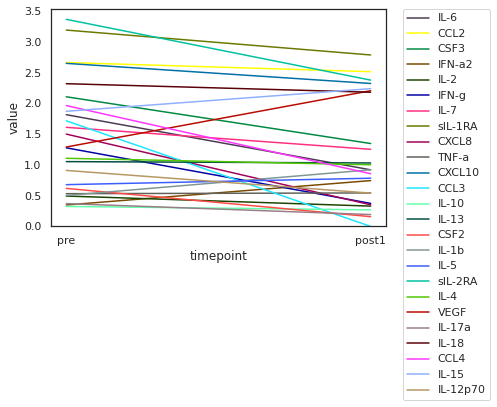

In [33]:
#plot for specific patients log trans
patient_of_interest = '7Z9V9Q'#'OI9CSG'#'32PHU4'#'SVXZIG'
source_path_final = figure_source_path + patient_of_interest +'_source_data.csv'
fig_save_path_complete = figure_save_path + patient_of_interest + '.svg'


single_patient_df = JK210728_panel1_2_merge_flat_pre[JK210728_panel1_2_merge_flat_pre['patient_id']==patient_of_interest]
single_patient_df['value']= single_patient_df['value'].map(lambda x: math.log(x+1,10))
sns.set(font_scale=1)
sns.set_style('white')
sns.lineplot(
    data=single_patient_df,
    x="timepoint", y="value", hue="variable",
    markers=False, dashes=False,palette=color_dict_cyt
)
plt.ylim(0,)
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
single_patient_df.to_csv(source_path_final)

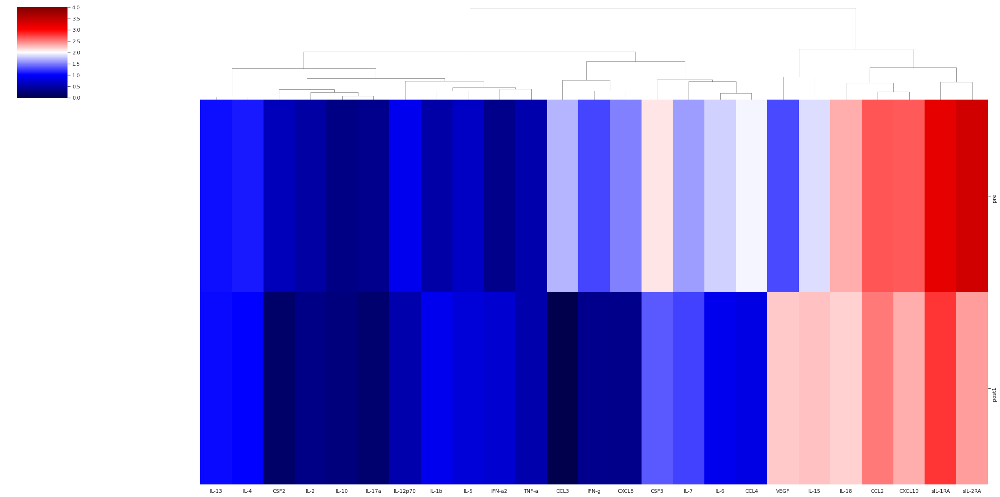

In [34]:
pre = list(single_patient_df[single_patient_df['timepoint']=='pre']['value'])
post1 = list(single_patient_df[single_patient_df['timepoint']=='post1']['value'])
variables = list(single_patient_df[single_patient_df['timepoint']=='pre']['variable'])

df_wide = pd.DataFrame([pre,post1],index=['pre','post1'],columns =variables)
g = sns.clustermap(df_wide, cmap='seismic', col_cluster=True,row_cluster=False, figsize=(30,15), vmin=0,center=2,vmax=4, z_score= None) 

/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/2193852323.py:18: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/2193852323.py:18: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',


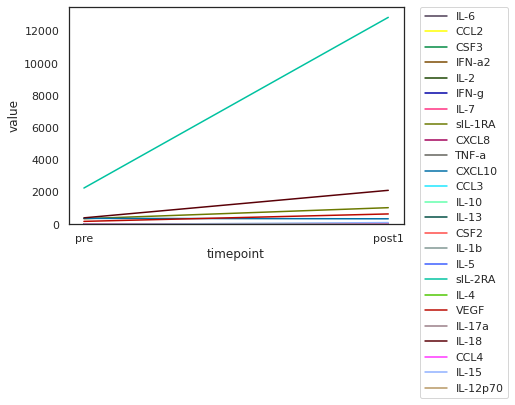

In [35]:
#plot for specific patients non log trans
patient_of_interest = 'SVXZIG'
source_path_final = figure_source_path + patient_of_interest +'nonlogged_source_data.csv'
fig_save_path_complete = figure_save_path + patient_of_interest + 'nonlogged.svg'


single_patient_df = JK210728_panel1_2_merge_flat_pre[JK210728_panel1_2_merge_flat_pre['patient_id']==patient_of_interest]
#single_patient_df['value']= single_patient_df['value'].map(lambda x: math.log(x+1,10))
sns.set(font_scale=1)
sns.set_style('white')
sns.lineplot(
    data=single_patient_df,
    x="timepoint", y="value", hue="variable",
    markers=False, dashes=False,palette=color_dict_cyt
)
plt.ylim(0,)
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
single_patient_df.to_csv(source_path_final)

In [36]:
#remove patient 25D2CD  who had a grade III irae at 'pre' timepoint (before vaccination), EK6BCT for which no post vaccination samples were available (samples were mislabeled as 2021 instead of 2020 in the database)
#IOQ3FO was removed because T1 sample was mislabeled as pre but really was post1 --> no pre sample analyzed for this patient
#SVXZIG remove bc post1 outside time window
JK210728_panel1_2_merge['patient_id'] = JK210728_panel1_2_merge.index.str.slice(stop=-3)
JK210728_panel1_2_merge = JK210728_panel1_2_merge[~JK210728_panel1_2_merge['patient_id'].isin(['SVXZIG','25D2CD','EK6BCT','IOQ3FO'])]
JK210728_panel1_2_merge = JK210728_panel1_2_merge.drop(columns=['patient_id'])
JK210728_panel1_2_merge

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,...,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
sample_id,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,2.650,488.8080,16.810,1.4880,0.3160,0.910,5.4560,211.265,8.5400,0.930,...,1.640,296.690,0.000,3.220,0.0000,133.4630,11.2650,0.00,0.0000,pre
2JJ523_T3,26.955,907.7435,26.560,1.2200,0.9240,3.140,4.8675,539.480,456.7955,0.830,...,0.460,396.370,0.000,0.000,0.3130,161.7660,22.5930,0.00,0.0000,post1
2JJ523_T4,86.625,321.0220,31.870,1.3025,0.1015,0.000,11.1860,315.895,1.8335,0.320,...,0.000,520.625,0.000,3.220,0.1565,161.3795,5.9860,0.00,0.0000,post2
39H11P_T1,13.130,337.5640,71.865,6.4960,7.2250,30.030,11.7565,442.580,12.0640,18.190,...,38.785,450.180,73.140,143.585,11.0350,85.5825,8.8995,429.45,8.3445,pre
39H11P_T2,21.395,328.2870,96.350,12.6170,16.0025,42.840,18.2110,664.240,32.1150,23.310,...,45.280,552.260,105.910,180.045,23.1460,105.2545,11.3685,477.81,6.3680,post2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SO7XOB_T1,1.860,320.7190,66.920,1.1960,0.8730,11.480,17.1470,399.530,4.4625,3.935,...,7.940,1069.270,17.165,138.010,2.2160,481.1675,12.1550,135.24,5.8590,pre
SO7XOB_T2,25.465,515.6860,61.255,0.9365,1.1315,3.280,9.4210,356.605,23.0245,1.025,...,8.005,1667.605,6.290,167.525,3.4345,705.1825,15.5485,110.11,3.8595,post2
ULKZFC_T0,8.225,390.9200,6.460,0.1200,2.0610,6.425,21.9770,594.630,5.9435,2.410,...,4.110,1796.125,6.290,220.120,0.6295,402.7365,8.3715,59.33,0.2205,pre


In [37]:
len(set(JK210728_panel1_2_merge.index.str.slice(stop=-3)))

35

# Plot data

## Sorted z scored

In [38]:
#sort dataframe by custom list
column_levels = ['pre','post1','post2']
JK210728_panel1_2_merge = custom_sort_pandas(JK210728_panel1_2_merge, 'timepoint', column_levels)

In [39]:
JK210728_panel1_2_merge

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,...,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
sample_id,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,2.650,488.8080,16.810,1.4880,0.3160,0.910,5.4560,211.265,8.5400,0.930,...,1.640,296.690,0.000,3.220,0.0000,133.4630,11.2650,0.000,0.000,pre
261EK3_T2,17.355,465.5065,2.785,3.3615,1.5710,5.745,10.7870,541.300,116.7450,1.880,...,3.250,5205.930,3.930,105.490,0.3360,412.8610,31.5020,132.200,0.000,pre
4WTCUA_T1,56.665,172.2150,174.825,14.9455,12.2750,116.770,40.5410,1279.270,54.0830,52.170,...,182.780,2142.100,341.885,362.625,36.6070,387.6175,23.1820,810.565,153.383,pre
2CC0BM_T1,1.840,420.6210,22.980,0.4640,1.2950,5.390,8.1560,283.025,9.4415,4.910,...,1.670,953.905,5.680,61.650,0.0000,283.0505,13.4635,0.000,4.365,pre
32PHU4_T1,7.350,220.2825,49.300,3.4130,1.9255,20.810,11.7625,1017.605,14.1130,1.595,...,5.810,4373.180,3.930,60.290,6.9550,315.6115,20.2830,239.920,4.625,pre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
339ZEM_T2,6.915,466.2790,63.500,21.1130,5.9595,27.710,30.9525,1505.335,46.4035,12.560,...,28.610,2624.300,46.430,196.375,8.8035,677.9160,39.7390,527.635,34.061,post2
ARU8T1_T2,0.190,548.2515,21.860,0.5395,1.5275,4.510,37.5850,330.495,36.5230,1.135,...,0.000,3044.340,0.000,106.655,2.7830,806.2995,16.1555,45.535,0.000,post2
EMHL0E_T5,8.660,166.0630,92.945,6.9830,4.7440,48.135,33.9105,703.310,42.6005,19.005,...,20.810,439.710,46.655,130.500,2.2890,104.7640,16.1800,269.520,18.745,post2


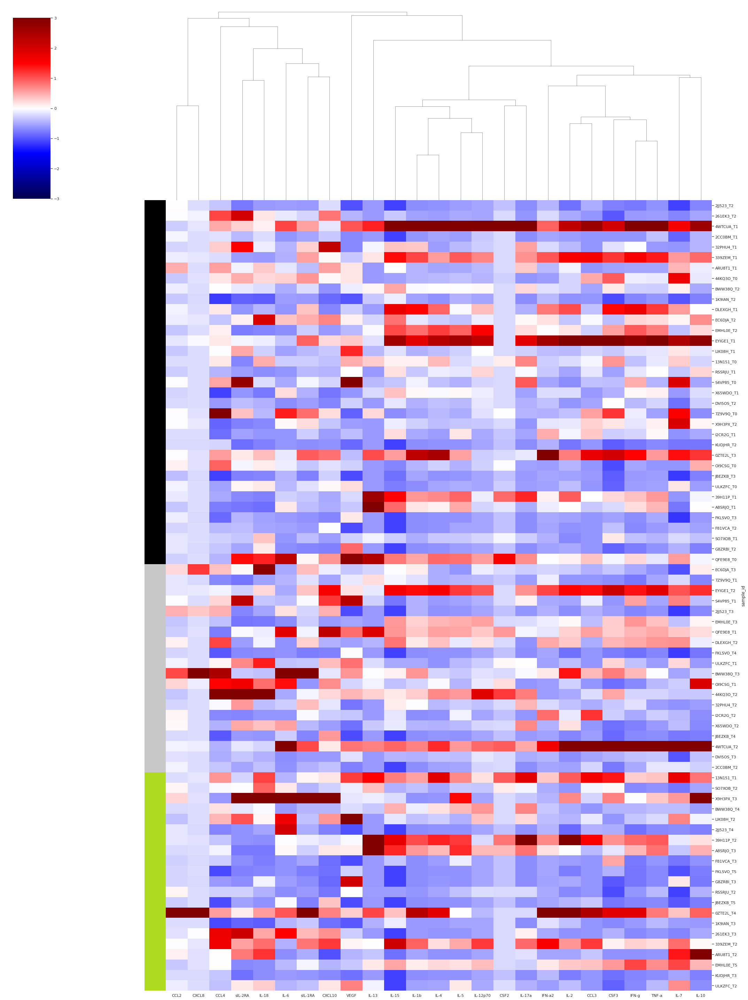

In [40]:
#plot
sns.set(font_scale = 1) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib
g = sns.clustermap(JK210728_panel1_2_merge.drop(columns=['timepoint']), cmap='seismic', col_cluster=True,row_cluster=False, figsize=(30,40), 
                   row_colors = JK210728_panel1_2_merge.index.map(time_color_dict), vmin=-3,center=0,vmax=3, z_score= 1) 

In [41]:
JK210728_panel1_2_merge

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,...,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
sample_id,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,2.650,488.8080,16.810,1.4880,0.3160,0.910,5.4560,211.265,8.5400,0.930,...,1.640,296.690,0.000,3.220,0.0000,133.4630,11.2650,0.000,0.000,pre
261EK3_T2,17.355,465.5065,2.785,3.3615,1.5710,5.745,10.7870,541.300,116.7450,1.880,...,3.250,5205.930,3.930,105.490,0.3360,412.8610,31.5020,132.200,0.000,pre
4WTCUA_T1,56.665,172.2150,174.825,14.9455,12.2750,116.770,40.5410,1279.270,54.0830,52.170,...,182.780,2142.100,341.885,362.625,36.6070,387.6175,23.1820,810.565,153.383,pre
2CC0BM_T1,1.840,420.6210,22.980,0.4640,1.2950,5.390,8.1560,283.025,9.4415,4.910,...,1.670,953.905,5.680,61.650,0.0000,283.0505,13.4635,0.000,4.365,pre
32PHU4_T1,7.350,220.2825,49.300,3.4130,1.9255,20.810,11.7625,1017.605,14.1130,1.595,...,5.810,4373.180,3.930,60.290,6.9550,315.6115,20.2830,239.920,4.625,pre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
339ZEM_T2,6.915,466.2790,63.500,21.1130,5.9595,27.710,30.9525,1505.335,46.4035,12.560,...,28.610,2624.300,46.430,196.375,8.8035,677.9160,39.7390,527.635,34.061,post2
ARU8T1_T2,0.190,548.2515,21.860,0.5395,1.5275,4.510,37.5850,330.495,36.5230,1.135,...,0.000,3044.340,0.000,106.655,2.7830,806.2995,16.1555,45.535,0.000,post2
EMHL0E_T5,8.660,166.0630,92.945,6.9830,4.7440,48.135,33.9105,703.310,42.6005,19.005,...,20.810,439.710,46.655,130.500,2.2890,104.7640,16.1800,269.520,18.745,post2


## Hierarchically clustered z scored

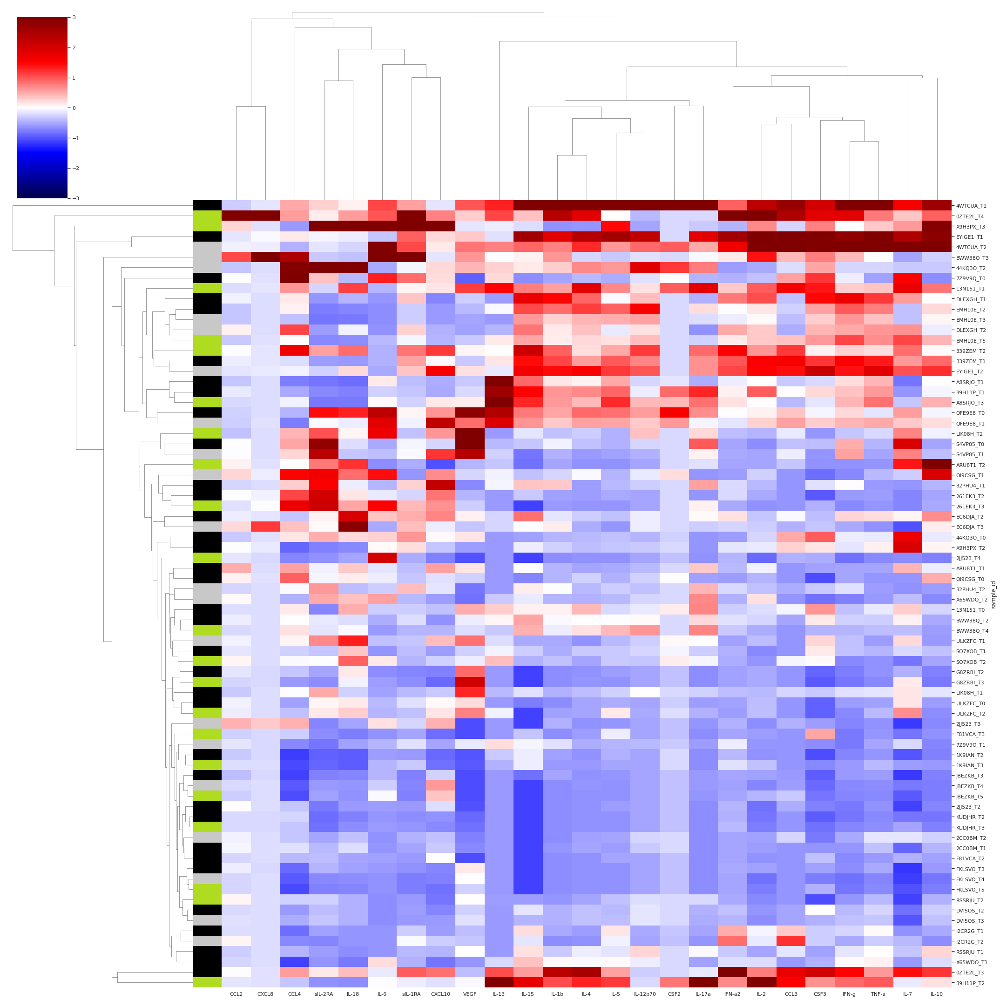

In [42]:
#plot hierarchically clustered
sns.set(font_scale = 1) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib
g = sns.clustermap(JK210728_panel1_2_merge.drop(columns=['timepoint']), cmap='seismic', col_cluster=True,row_cluster=True, figsize=(30,30), 
                   row_colors = JK210728_panel1_2_merge.index.map(time_color_dict), vmin=-3,center=0,vmax=3, z_score= 1 )


## log1p transformed hierarchically clustered

In [43]:
JK210728_panel1_2_merge

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,...,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
sample_id,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,2.650,488.8080,16.810,1.4880,0.3160,0.910,5.4560,211.265,8.5400,0.930,...,1.640,296.690,0.000,3.220,0.0000,133.4630,11.2650,0.000,0.000,pre
261EK3_T2,17.355,465.5065,2.785,3.3615,1.5710,5.745,10.7870,541.300,116.7450,1.880,...,3.250,5205.930,3.930,105.490,0.3360,412.8610,31.5020,132.200,0.000,pre
4WTCUA_T1,56.665,172.2150,174.825,14.9455,12.2750,116.770,40.5410,1279.270,54.0830,52.170,...,182.780,2142.100,341.885,362.625,36.6070,387.6175,23.1820,810.565,153.383,pre
2CC0BM_T1,1.840,420.6210,22.980,0.4640,1.2950,5.390,8.1560,283.025,9.4415,4.910,...,1.670,953.905,5.680,61.650,0.0000,283.0505,13.4635,0.000,4.365,pre
32PHU4_T1,7.350,220.2825,49.300,3.4130,1.9255,20.810,11.7625,1017.605,14.1130,1.595,...,5.810,4373.180,3.930,60.290,6.9550,315.6115,20.2830,239.920,4.625,pre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
339ZEM_T2,6.915,466.2790,63.500,21.1130,5.9595,27.710,30.9525,1505.335,46.4035,12.560,...,28.610,2624.300,46.430,196.375,8.8035,677.9160,39.7390,527.635,34.061,post2
ARU8T1_T2,0.190,548.2515,21.860,0.5395,1.5275,4.510,37.5850,330.495,36.5230,1.135,...,0.000,3044.340,0.000,106.655,2.7830,806.2995,16.1555,45.535,0.000,post2
EMHL0E_T5,8.660,166.0630,92.945,6.9830,4.7440,48.135,33.9105,703.310,42.6005,19.005,...,20.810,439.710,46.655,130.500,2.2890,104.7640,16.1800,269.520,18.745,post2


In [44]:
#log transform
#JK210728_panel1_2_merge = JK210728_panel1_2_merge.drop(columns=['sample_id'])
JK210728_panel1_2_merge_log = JK210728_panel1_2_merge.drop(columns=['timepoint']).applymap(lambda x: math.log(x+1,10))

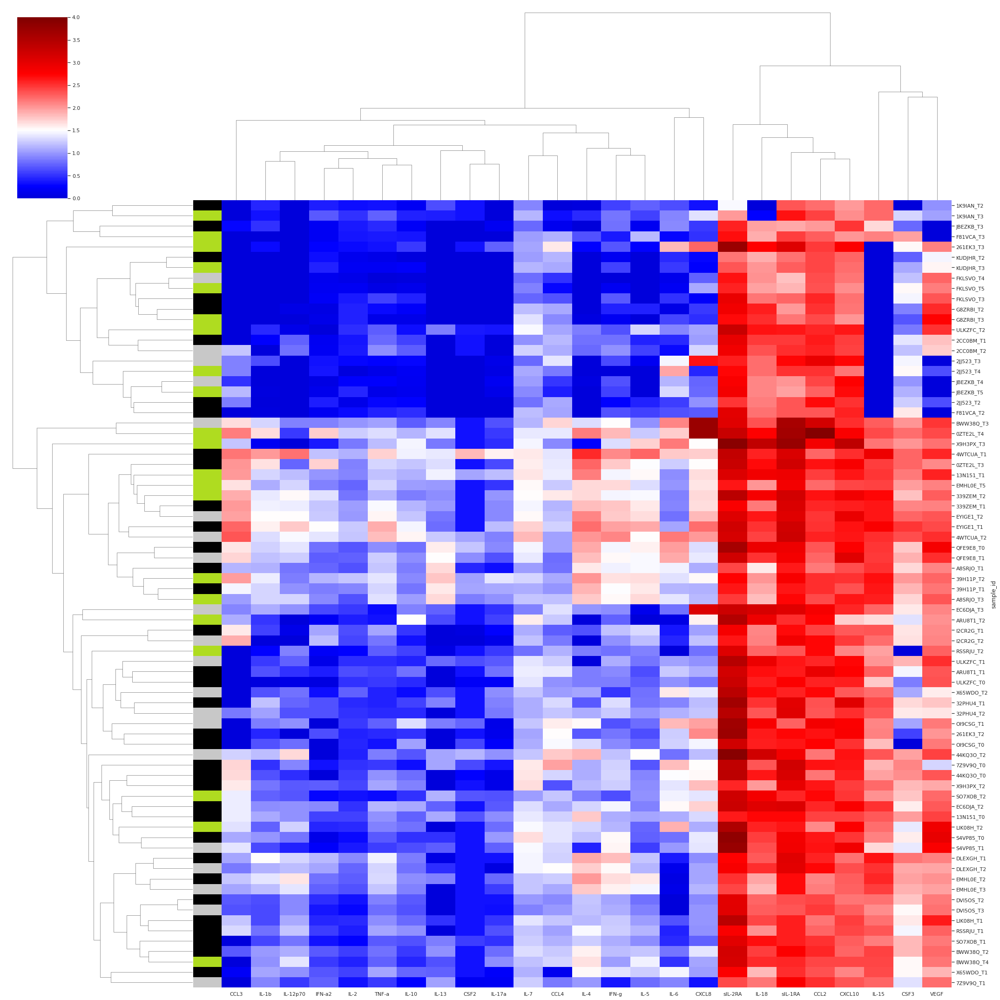

In [45]:
#plot log1p transformed
sns.set(font_scale = 1) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib
g = sns.clustermap(JK210728_panel1_2_merge_log, cmap='seismic', col_cluster=True,row_cluster=True, figsize=(30,30), 
                   row_colors = JK210728_panel1_2_merge.index.map(time_color_dict), z_score= None,vmin=0,center=1.5,vmax=4) 

## Normalized (subtract log1p transformed)

In [46]:
JK210728_panel1_2_merge

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,...,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
sample_id,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,2.650,488.8080,16.810,1.4880,0.3160,0.910,5.4560,211.265,8.5400,0.930,...,1.640,296.690,0.000,3.220,0.0000,133.4630,11.2650,0.000,0.000,pre
261EK3_T2,17.355,465.5065,2.785,3.3615,1.5710,5.745,10.7870,541.300,116.7450,1.880,...,3.250,5205.930,3.930,105.490,0.3360,412.8610,31.5020,132.200,0.000,pre
4WTCUA_T1,56.665,172.2150,174.825,14.9455,12.2750,116.770,40.5410,1279.270,54.0830,52.170,...,182.780,2142.100,341.885,362.625,36.6070,387.6175,23.1820,810.565,153.383,pre
2CC0BM_T1,1.840,420.6210,22.980,0.4640,1.2950,5.390,8.1560,283.025,9.4415,4.910,...,1.670,953.905,5.680,61.650,0.0000,283.0505,13.4635,0.000,4.365,pre
32PHU4_T1,7.350,220.2825,49.300,3.4130,1.9255,20.810,11.7625,1017.605,14.1130,1.595,...,5.810,4373.180,3.930,60.290,6.9550,315.6115,20.2830,239.920,4.625,pre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
339ZEM_T2,6.915,466.2790,63.500,21.1130,5.9595,27.710,30.9525,1505.335,46.4035,12.560,...,28.610,2624.300,46.430,196.375,8.8035,677.9160,39.7390,527.635,34.061,post2
ARU8T1_T2,0.190,548.2515,21.860,0.5395,1.5275,4.510,37.5850,330.495,36.5230,1.135,...,0.000,3044.340,0.000,106.655,2.7830,806.2995,16.1555,45.535,0.000,post2
EMHL0E_T5,8.660,166.0630,92.945,6.9830,4.7440,48.135,33.9105,703.310,42.6005,19.005,...,20.810,439.710,46.655,130.500,2.2890,104.7640,16.1800,269.520,18.745,post2


In [47]:
#log transform
columns_to_drop = [x for x in ['timepoint','sample_id','patient_id'] if x in JK210728_panel1_2_merge.columns]
JK210728_panel1_2_merge_log = JK210728_panel1_2_merge.drop(columns=columns_to_drop).applymap(lambda x: math.log(x+1,10))

In [48]:
JK210728_panel1_2_merge_log['timepoint'] = JK210728_panel1_2_merge_log.index.map(time_dict)

In [49]:
#normalize to d0 (substract) 
normalized_df = pd.DataFrame(columns= JK210728_panel1_2_merge_log.columns)
JK210728_panel1_2_merge_log['sample_id'] = JK210728_panel1_2_merge_log.index.str.slice(stop=-3)
#loop over and select sample by sample id
for i in set(JK210728_panel1_2_merge_log['sample_id']):
  JK210728_panel1_2_merge_subset = JK210728_panel1_2_merge_log[JK210728_panel1_2_merge_log['sample_id'] == i]  #subset to patient of interest
  JK210728_panel1_2_merge_subset_pre = JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='pre'].drop(columns=['timepoint','sample_id']).iloc[0,:] #subset to pre sample
  #subset post1  and substract pre sample (all were already log1p transformed)
  if 'post1' in list(JK210728_panel1_2_merge_subset['timepoint']) and 'post2' in list(JK210728_panel1_2_merge_subset['timepoint']):
      JK210728_panel1_2_merge_subset_post1 = JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='post1'].drop(columns=['timepoint','sample_id']).iloc[0,:].subtract(JK210728_panel1_2_merge_subset_pre)
      normalized_df.loc[JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='post1'].index[0],:] = JK210728_panel1_2_merge_subset_post1
      JK210728_panel1_2_merge_subset_post2 = JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='post2'].drop(columns=['timepoint','sample_id']).iloc[0,:].subtract(JK210728_panel1_2_merge_subset_pre)
      normalized_df.loc[JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='post2'].index[0],:] = JK210728_panel1_2_merge_subset_post2
  #subset post1 log1p and substract log2p pre sample
  elif 'post1' in list(JK210728_panel1_2_merge_subset['timepoint']):
      JK210728_panel1_2_merge_subset_post1 = JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='post1'].drop(columns=['timepoint','sample_id']).iloc[0,:].subtract(JK210728_panel1_2_merge_subset_pre)
      normalized_df.loc[JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='post1'].index[0],:] = JK210728_panel1_2_merge_subset_post1
  elif 'post2' in list(JK210728_panel1_2_merge_subset['timepoint']):
      JK210728_panel1_2_merge_subset_post2 = JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='post2'].drop(columns=['timepoint','sample_id']).iloc[0,:].subtract(JK210728_panel1_2_merge_subset_pre)
      normalized_df.loc[JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='post2'].index[0],:] = JK210728_panel1_2_merge_subset_post2
  else:
    print('no post sample detected')

In [50]:
normalized_df = normalized_df.astype(float)

In [51]:
normalized_df

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,...,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
LIK08H_T2,1.228105,-0.104240,-0.221622,-0.007156,-0.011584,-0.104850,0.117867,0.027583,0.102125,-0.062655,...,-0.262970,0.134242,0.137292,0.272599,0.261879,0.175353,0.137330,0.012896,0.199965,NaN
13N151_T1,-0.162433,0.003851,0.159718,0.409321,0.333605,0.360173,0.248158,0.207546,0.346720,0.229143,...,0.484442,0.478517,0.366143,0.151669,0.234543,0.159812,0.134077,0.190108,0.218599,NaN
7Z9V9Q_T1,-0.896226,-0.148757,-0.759964,0.396732,-0.163848,-0.903319,-0.357557,-0.404889,-1.149611,0.011934,...,0.104833,-0.987952,-0.105629,0.915141,-0.177804,-0.138523,-1.108094,0.367898,-0.368991,NaN
F81VCA_T3,-0.356812,-0.045479,0.357755,0.019685,0.054251,-0.272580,-0.160884,0.108293,-0.196358,-0.033926,...,0.576766,-0.317106,0.650308,0.000000,0.000868,-0.303006,0.055482,2.113358,0.000000,NaN
BWW38Q_T3,1.265573,0.614054,0.187340,0.208191,0.442900,0.318594,-0.197218,0.836819,2.348488,0.204805,...,-0.259076,-0.116650,-0.226721,0.251143,-0.116385,-0.098080,0.479558,-0.136150,-0.200135,NaN
BWW38Q_T4,-0.347107,-0.168619,-0.282654,-0.158123,-0.124191,-0.154396,-0.140896,-0.191476,-0.320177,-0.092816,...,0.207152,-0.007906,0.090310,-0.042029,0.157571,0.091344,0.053365,-0.018254,0.288207,NaN
DLEXGH_T2,-0.241909,0.147809,-0.226834,-0.098017,-0.173723,-0.275276,0.014315,-0.025451,0.127347,-0.145389,...,-0.060590,0.072883,-0.185457,-0.175600,-0.280167,0.218516,0.238579,-0.169902,-0.118354,NaN
QFE9E8_T1,-0.074541,-0.075651,0.131326,-0.107390,0.061333,0.074576,-0.057549,-0.065735,0.070329,0.308604,...,-0.095890,-0.421907,-0.101347,-0.314238,-0.277739,-0.416846,-0.248748,-0.036226,-0.111204,NaN
44KQ3O_T2,-0.675390,-0.021524,-0.101873,0.000000,-0.133563,-0.085351,-0.407422,-0.278265,-0.356834,-0.089919,...,0.592205,0.514461,0.760961,0.092853,0.838248,0.564863,0.484990,0.349556,1.220753,NaN
EC6DJA_T3,-0.723011,0.279339,0.037679,-0.307968,0.030928,-0.498941,-0.443222,-0.036277,1.355735,-0.830023,...,-0.775977,-0.020578,-0.290448,-0.206334,-0.210114,0.118217,0.258543,-0.240413,-0.006763,NaN


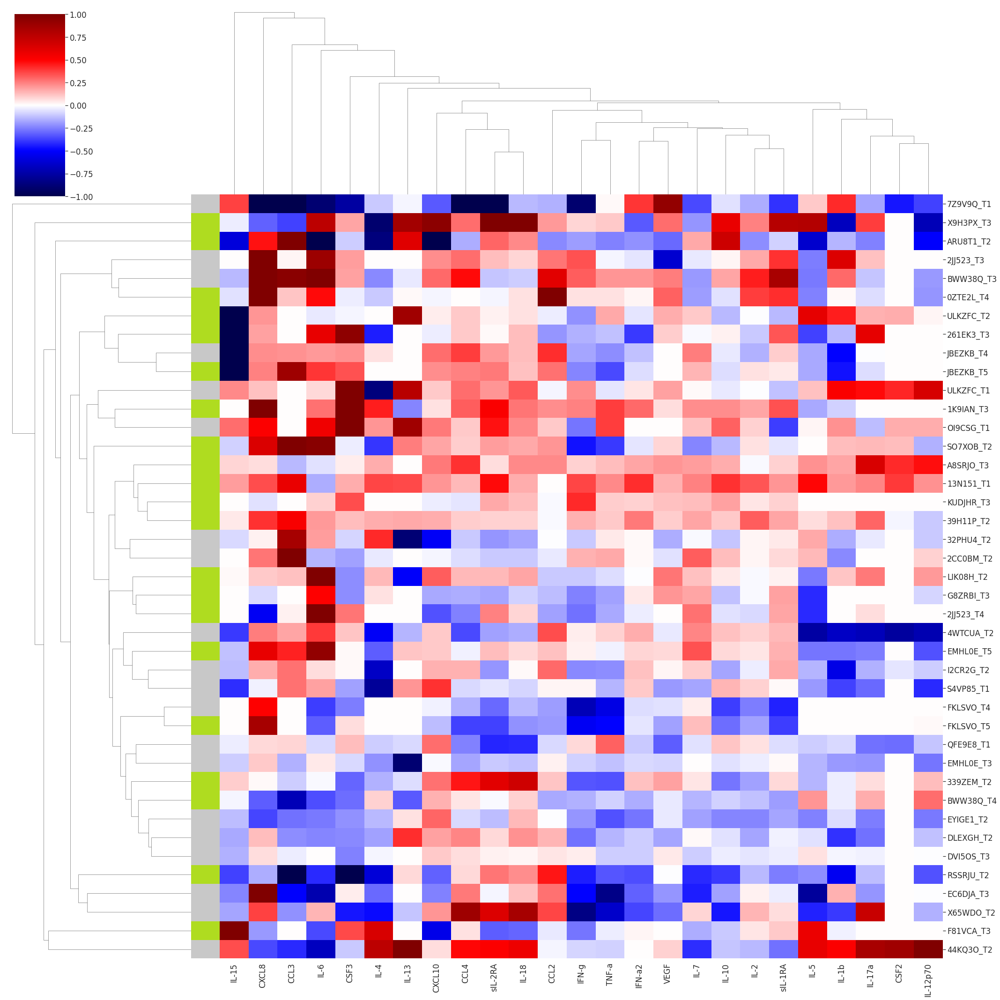

In [52]:
#plot log1p normalized to pre (subtracted)
sns.set(font_scale = 1.5) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib
columns_to_drop = [x for x in ['timepoint','patient_id'] if x in normalized_df.columns]
g = sns.clustermap(normalized_df.drop(columns=columns_to_drop), cmap='seismic', col_cluster=True,row_cluster=True, figsize=(30,30), 
                   row_colors = normalized_df.index.map(time_color_dict), z_score= None, vmin=-1,center=0,vmax=1
                   )


# Plot neutralizing antibody concentrations

In [53]:
#color codes
vaccine_type_dict = {'Comirnaty':blue_blue_red_grey[0],'Moderna':blue_blue_red_grey[1], 'Astra Zeneca':blue_blue_red_grey[2],'heterologous':blue_blue_red_grey[3],'not_defined':'#000000'}

In [54]:
df = patient_table
#df_save_path = covid_2nd_dose_leuko_path

#function to define nans

vaccine_type = {}
for i in patient_table.index: 
  a = patient_table.loc[i,'First_dose_vaccine']
  b = patient_table.loc[i,'Second_dose_vaccine']
  if isna(a):
    vaccine_type[i]='NA'
  elif isna(b):
    vaccine_type[i]=a
  elif a==b:
      vaccine_type[i]=a
  else:
    vaccine_type[i]='heterologous'

df['vaccine_type'] = df.index.map(vaccine_type)
#df.to_csv(df_save_path)
df

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,Second_dose_vaccine,date_inclusion,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,follow_up_from_second_dose_vaccine_days,color_code,Survival_01.10.21,vaccine_type
Patient_ID,,,,,,,,,,,,,,,,,,,,,
A8SRJO,M,59.0,NaN,2.0,0.0,SKCM,IV,PD-1/PD-L1,1.0,True,...,Astra Zeneca,9/30/2020,10/1/2021,10/1/2021,366.0,204.0,129.00,#997D87,0.0,Astra Zeneca
L9YLRD,M,68.0,20.2,1.0,1.0,OSCC,III,PD-1/PD-L1,1.0,True,...,Astra Zeneca,12/4/2020,10/1/2021,10/1/2021,301.0,166.0,82.00,#61615A,0.0,Astra Zeneca
74WACU,F,61.0,22.6,1.0,0.0,AEG,IV,PD-1/PD-L1,1.0,True,...,Astra Zeneca,3/18/2021,10/1/2021,10/1/2021,197.0,205.0,144.00,#788D66,0.0,Astra Zeneca
SSW9Q1,F,68.0,25.3,1.0,0.0,UVM,IV,PD-1/PD-L1,3.0,True,...,Astra Zeneca,4/7/2021,5/5/2021,10/1/2021,177.0,166.0,82.00,#886F4C,0.0,Astra Zeneca
7Z9V9Q,M,76.0,24.3,1.0,0.0,"LUAD, ESCA",IV,PD-1/PD-L1,2.0,True,...,Astra Zeneca,4/16/2021,6/11/2021,6/17/2021,62.0,50.0,8.00,#B4A8BD,1.0,Astra Zeneca
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C1ABPH,M,69.0,18.7,2.0,0.0,"NSCLC, HNSC",II,PD-1/PD-L1+CTX,2.0,False,...,NaN,9/25/2020,1/28/2021,10/1/2021,371.0,NaN,#VALUE!,#F1FE76,0.0,NA
2DP8J8,M,58.0,29.4,0.0,0.0,AEG,II,PD-1/PD-L1+CTX,1.0,False,...,NaN,2/8/2021,8/24/2021,9/26/2021,230.0,NaN,#VALUE!,#CFB70A,1.0,NA
KQQNSB,M,60.0,30.9,0.0,0.0,KIRC,III,PD-1/PD-L1+TKI,1.0,False,...,NaN,10/2/2020,8/10/2021,10/1/2021,364.0,NaN,#VALUE!,#BC41A1,0.0,NA


In [55]:
#add vaccine info
covid_antibody_df['patient'] = covid_antibody_df.index.str.slice(stop=-3)
covid_antibody_df

,neut_antibody_pg_ml,timepoint,time_from_vacc,patient
sample,,,,
0ZTE2L_T3,3848559.0,pre,-6,0ZTE2L
0ZTE2L_T4,7231127.0,post2,50,0ZTE2L
13N151_T0,5959513.0,pre,-9,13N151
13N151_T1,52690692.0,post2,33,13N151
13N151_T2,8442583.0,post2,162,13N151
...,...,...,...,...
VMQLNV_T7,12061851.5,post2,75,VMQLNV
X65WDO_T1,25620432.0,pre,-81,X65WDO
X65WDO_T3,8506702.5,post2,106,X65WDO


In [56]:
#add vaccine info
covid_antibody_df['vaccine_type'] = covid_antibody_df['patient'].map(vaccine_type)
covid_antibody_df

,neut_antibody_pg_ml,timepoint,time_from_vacc,patient,vaccine_type
sample,,,,,
0ZTE2L_T3,3848559.0,pre,-6,0ZTE2L,Comirnaty
0ZTE2L_T4,7231127.0,post2,50,0ZTE2L,Comirnaty
13N151_T0,5959513.0,pre,-9,13N151,Comirnaty
13N151_T1,52690692.0,post2,33,13N151,Comirnaty
13N151_T2,8442583.0,post2,162,13N151,Comirnaty
...,...,...,...,...,...
VMQLNV_T7,12061851.5,post2,75,VMQLNV,Comirnaty
X65WDO_T1,25620432.0,pre,-81,X65WDO,Comirnaty
X65WDO_T3,8506702.5,post2,106,X65WDO,Comirnaty


In [57]:
#set all pre vaccination timepoints to 0

for i in covid_antibody_df.index:
  if covid_antibody_df.loc[i,'timepoint'] == 'pre':
    covid_antibody_df.loc[i,'time_from_vacc'] = 0
  
covid_antibody_df

,neut_antibody_pg_ml,timepoint,time_from_vacc,patient,vaccine_type
sample,,,,,
0ZTE2L_T3,3848559.0,pre,0,0ZTE2L,Comirnaty
0ZTE2L_T4,7231127.0,post2,50,0ZTE2L,Comirnaty
13N151_T0,5959513.0,pre,0,13N151,Comirnaty
13N151_T1,52690692.0,post2,33,13N151,Comirnaty
13N151_T2,8442583.0,post2,162,13N151,Comirnaty
...,...,...,...,...,...
VMQLNV_T7,12061851.5,post2,75,VMQLNV,Comirnaty
X65WDO_T1,25620432.0,pre,0,X65WDO,Comirnaty
X65WDO_T3,8506702.5,post2,106,X65WDO,Comirnaty


In [58]:
#log1p_transform
covid_antibody_df['neut_antibody_pg_ml_log'] = covid_antibody_df['neut_antibody_pg_ml'].apply(lambda x: math.log(x+1,10))
covid_antibody_df

,neut_antibody_pg_ml,timepoint,time_from_vacc,patient,vaccine_type,neut_antibody_pg_ml_log
sample,,,,,,
0ZTE2L_T3,3848559.0,pre,0,0ZTE2L,Comirnaty,6.585298
0ZTE2L_T4,7231127.0,post2,50,0ZTE2L,Comirnaty,6.859206
13N151_T0,5959513.0,pre,0,13N151,Comirnaty,6.775211
13N151_T1,52690692.0,post2,33,13N151,Comirnaty,7.721734
13N151_T2,8442583.0,post2,162,13N151,Comirnaty,6.926475
...,...,...,...,...,...,...
VMQLNV_T7,12061851.5,post2,75,VMQLNV,Comirnaty,7.081414
X65WDO_T1,25620432.0,pre,0,X65WDO,Comirnaty,7.408586
X65WDO_T3,8506702.5,post2,106,X65WDO,Comirnaty,6.929761


(5.0, 9.0)

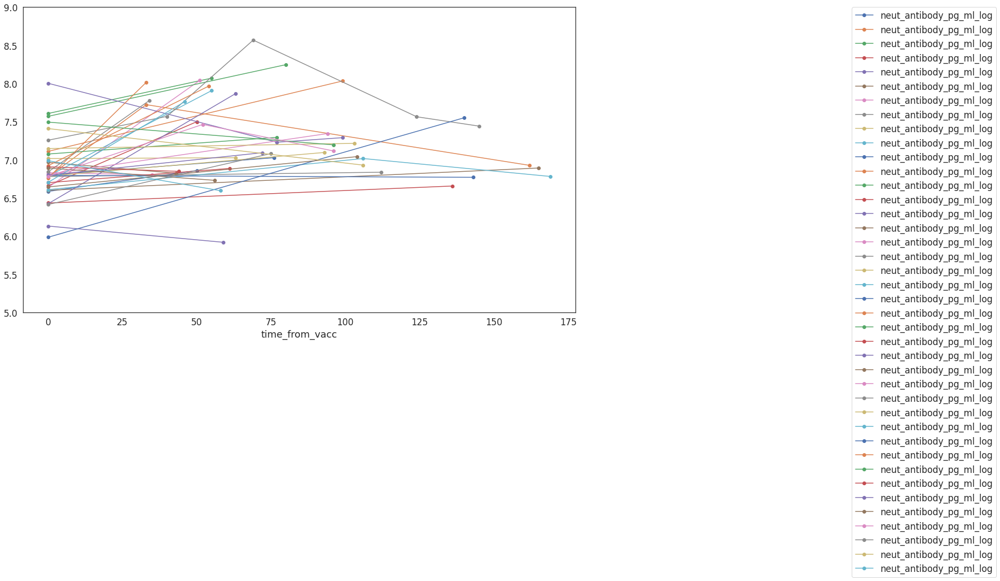

In [59]:
sns.set_style('white')
fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
covid_antibody_df.groupby("patient").plot(x="time_from_vacc", y="neut_antibody_pg_ml_log", marker="o", ax=ax)
ax.legend(list(set(covid_antibody_df['patient'])))
plt.legend(bbox_to_anchor=(1.5,1),loc=2,borderaxespad=0)
plt.axhline(linewidth=2, color='#000000',y=1)
ax.set_ylim([5, 9])


In [60]:
covid_antibody_df['neut_antibody_ug_ml'] = covid_antibody_df['neut_antibody_pg_ml']/1000000
covid_antibody_df

,neut_antibody_pg_ml,timepoint,time_from_vacc,patient,vaccine_type,neut_antibody_pg_ml_log,neut_antibody_ug_ml
sample,,,,,,,
0ZTE2L_T3,3848559.0,pre,0,0ZTE2L,Comirnaty,6.585298,3.848559
0ZTE2L_T4,7231127.0,post2,50,0ZTE2L,Comirnaty,6.859206,7.231127
13N151_T0,5959513.0,pre,0,13N151,Comirnaty,6.775211,5.959513
13N151_T1,52690692.0,post2,33,13N151,Comirnaty,7.721734,52.690692
13N151_T2,8442583.0,post2,162,13N151,Comirnaty,6.926475,8.442583
...,...,...,...,...,...,...,...
VMQLNV_T7,12061851.5,post2,75,VMQLNV,Comirnaty,7.081414,12.061851
X65WDO_T1,25620432.0,pre,0,X65WDO,Comirnaty,7.408586,25.620432
X65WDO_T3,8506702.5,post2,106,X65WDO,Comirnaty,6.929761,8.506702


neutralizing_antibodies


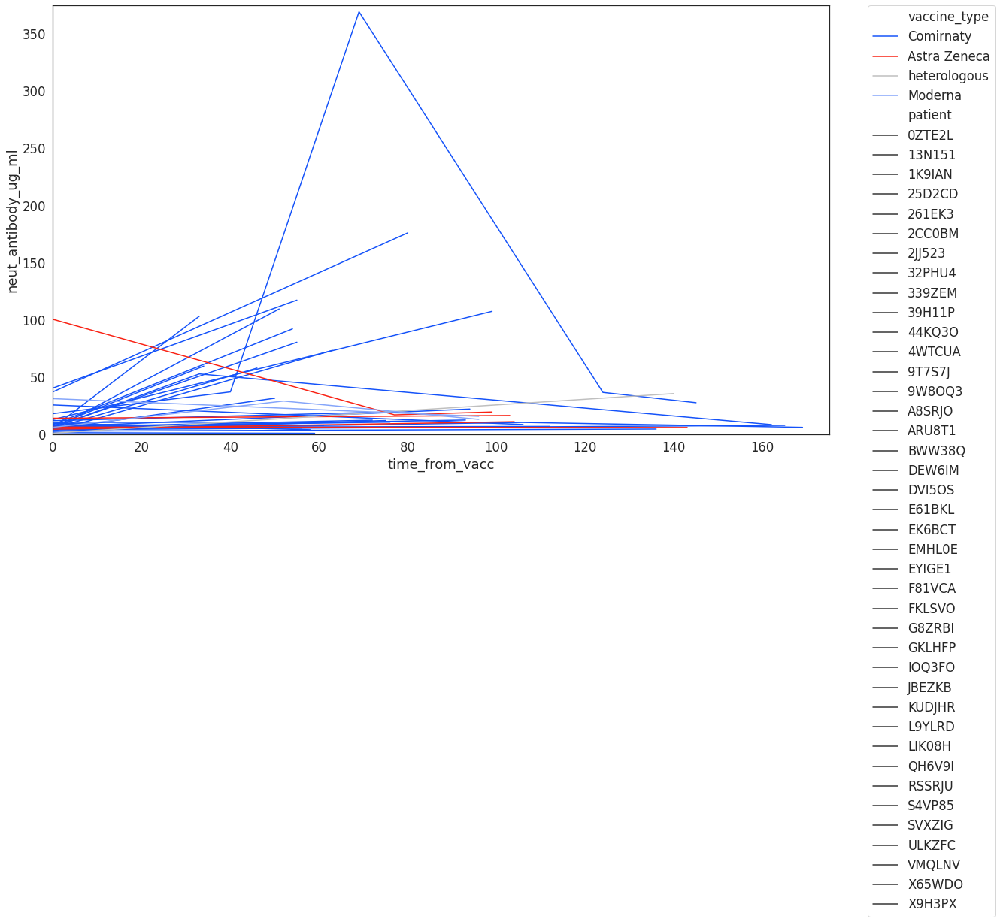

In [61]:
# Draw a pointplot 
save_name = 'neutralizing_antibodies'
save_path_complete = figure_save_path + save_name + '.svg'
save_path_source = figure_source_path +  save_name + '.csv'

#restrict to samples with available baseline
baseline_patient_list = list(covid_antibody_df[covid_antibody_df['time_from_vacc']==0]['patient'])
covid_antibody_df_with_baseline = covid_antibody_df[covid_antibody_df['patient'].isin(baseline_patient_list)]

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_antibody_df_with_baseline,
    x="time_from_vacc", y="neut_antibody_ug_ml", hue="vaccine_type",style="patient",
    markers=False, dashes=False, ax=axis,palette=vaccine_type_dict
)
#plt.axhline(linewidth=2, color='#000000',y=1,ls='dashed')
plt.ylim(0,375)
plt.xlim(0,175)
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(save_path_complete)
print(save_name)
covid_antibody_df_with_baseline.to_csv(save_path_source)

neutralizing_antibodies_BNT162b2.svg


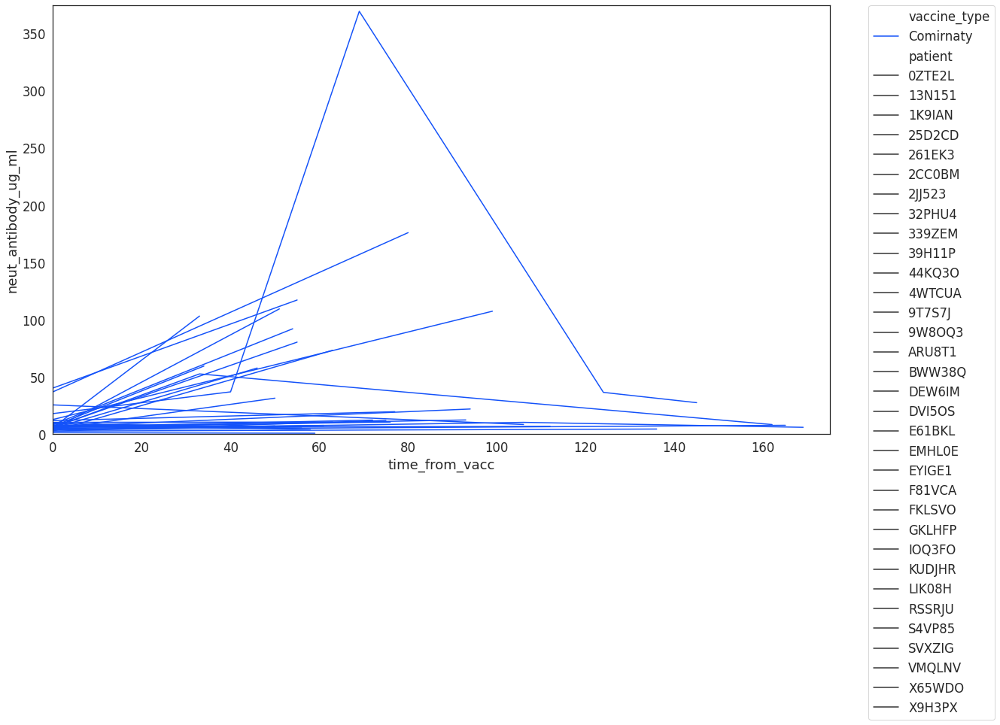

In [62]:
# Draw a pointplot 
save_name = 'neutralizing_antibodies_BNT162b2.svg'
save_path_complete = figure_save_path + save_name

#restrict to samples with available baseline
baseline_patient_list = list(covid_antibody_df[covid_antibody_df['time_from_vacc']==0]['patient'])
covid_antibody_df_with_baseline = covid_antibody_df[covid_antibody_df['patient'].isin(baseline_patient_list)]
#restrict to one vaccine type
covid_antibody_df_with_baseline = covid_antibody_df_with_baseline[covid_antibody_df_with_baseline['vaccine_type']=='Comirnaty']

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_antibody_df_with_baseline,
    x="time_from_vacc", y="neut_antibody_ug_ml", hue="vaccine_type",style="patient",
    markers=False, dashes=False, ax=axis,palette=vaccine_type_dict
)
#plt.axhline(linewidth=2, color='#000000',y=1,ls='dashed')
plt.ylim(0,375)
plt.xlim(0,175)
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(save_path_complete)
print(save_name)

neutralizing_antibodies_AZD.svg


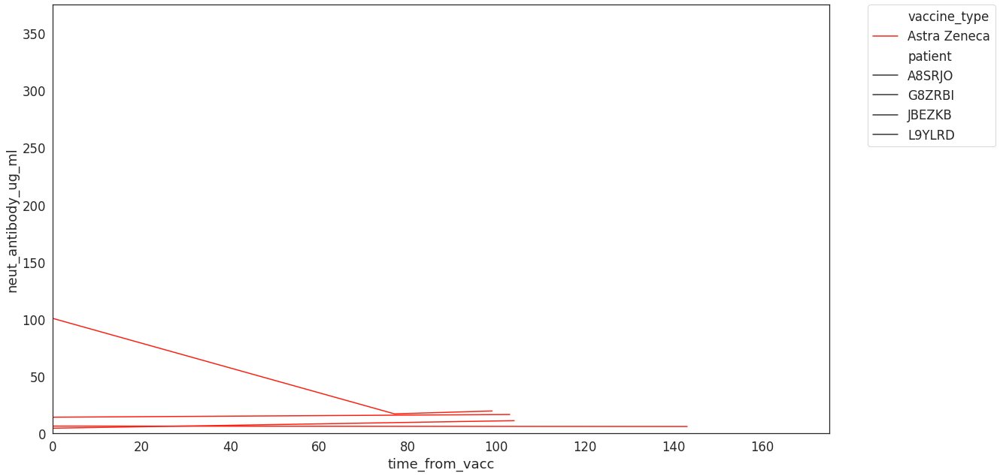

In [63]:
# Draw a pointplot 
save_name = 'neutralizing_antibodies_AZD.svg'
save_path_complete = figure_save_path + save_name

#restrict to samples with available baseline
baseline_patient_list = list(covid_antibody_df[covid_antibody_df['time_from_vacc']==0]['patient'])
covid_antibody_df_with_baseline = covid_antibody_df[covid_antibody_df['patient'].isin(baseline_patient_list)]
#restrict to one vaccine type
covid_antibody_df_with_baseline = covid_antibody_df_with_baseline[covid_antibody_df_with_baseline['vaccine_type']=='Astra Zeneca']

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_antibody_df_with_baseline,
    x="time_from_vacc", y="neut_antibody_ug_ml", hue="vaccine_type",style="patient",
    markers=False, dashes=False, ax=axis,palette=vaccine_type_dict
)
#plt.axhline(linewidth=2, color='#000000',y=1,ls='dashed')
plt.ylim(0,375)
plt.xlim(0,175)
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(save_path_complete)
print(save_name)

neutralizing_antibodies_Moderna.svg


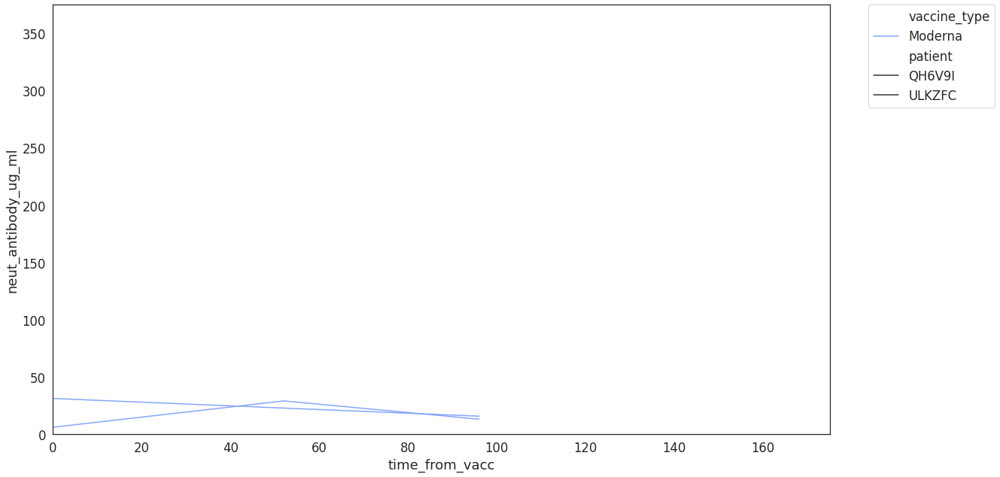

In [64]:
# Draw a pointplot 
save_name = 'neutralizing_antibodies_Moderna.svg'
save_path_complete = figure_save_path + save_name

#restrict to samples with available baseline
baseline_patient_list = list(covid_antibody_df[covid_antibody_df['time_from_vacc']==0]['patient'])
covid_antibody_df_with_baseline = covid_antibody_df[covid_antibody_df['patient'].isin(baseline_patient_list)]
#restrict to one vaccine type
covid_antibody_df_with_baseline = covid_antibody_df_with_baseline[covid_antibody_df_with_baseline['vaccine_type']=='Moderna']

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_antibody_df_with_baseline,
    x="time_from_vacc", y="neut_antibody_ug_ml", hue="vaccine_type",style="patient",
    markers=False, dashes=False, ax=axis,palette=vaccine_type_dict
)
#plt.axhline(linewidth=2, color='#000000',y=1,ls='dashed')
plt.ylim(0,375)
plt.xlim(0,175)
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(save_path_complete)
print(save_name)

neutralizing_antibodies_heterologous.svg


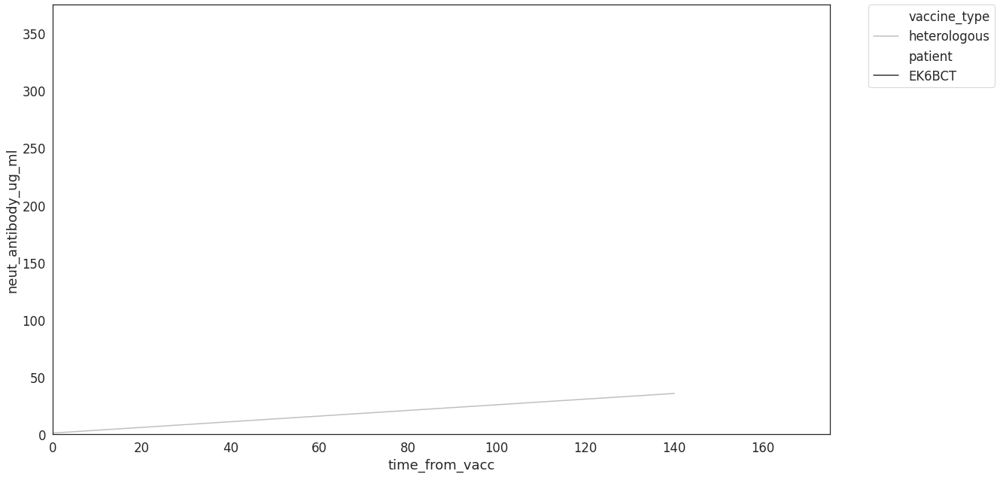

In [65]:
# Draw a pointplot 
save_name = 'neutralizing_antibodies_heterologous.svg'
save_path_complete = figure_save_path + save_name

#restrict to samples with available baseline
baseline_patient_list = list(covid_antibody_df[covid_antibody_df['time_from_vacc']==0]['patient'])
covid_antibody_df_with_baseline = covid_antibody_df[covid_antibody_df['patient'].isin(baseline_patient_list)]
#restrict to one vaccine type
covid_antibody_df_with_baseline = covid_antibody_df_with_baseline[covid_antibody_df_with_baseline['vaccine_type']=='heterologous']

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_antibody_df_with_baseline,
    x="time_from_vacc", y="neut_antibody_ug_ml", hue="vaccine_type",style="patient",
    markers=False, dashes=False, ax=axis,palette=vaccine_type_dict
)
#plt.axhline(linewidth=2, color='#000000',y=1,ls='dashed')
plt.ylim(0,375)
plt.xlim(0,175)
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(save_path_complete)
print(save_name)

In [66]:
covid_antibody_df

,neut_antibody_pg_ml,timepoint,time_from_vacc,patient,vaccine_type,neut_antibody_pg_ml_log,neut_antibody_ug_ml
sample,,,,,,,
0ZTE2L_T3,3848559.0,pre,0,0ZTE2L,Comirnaty,6.585298,3.848559
0ZTE2L_T4,7231127.0,post2,50,0ZTE2L,Comirnaty,6.859206,7.231127
13N151_T0,5959513.0,pre,0,13N151,Comirnaty,6.775211,5.959513
13N151_T1,52690692.0,post2,33,13N151,Comirnaty,7.721734,52.690692
13N151_T2,8442583.0,post2,162,13N151,Comirnaty,6.926475,8.442583
...,...,...,...,...,...,...,...
VMQLNV_T7,12061851.5,post2,75,VMQLNV,Comirnaty,7.081414,12.061851
X65WDO_T1,25620432.0,pre,0,X65WDO,Comirnaty,7.408586,25.620432
X65WDO_T3,8506702.5,post2,106,X65WDO,Comirnaty,6.929761,8.506702


In [67]:
#normalize to pre
covid_antibody_df_normalized_list = []
for i in set(covid_antibody_df['patient']):
  covid_antibody_df_subset = covid_antibody_df[covid_antibody_df['patient']==i]
  covid_antibody_df_pre = covid_antibody_df_subset[covid_antibody_df_subset['timepoint']=='pre']['neut_antibody_ug_ml']
  covid_antibody_df_subset_normalized = covid_antibody_df_subset['neut_antibody_ug_ml'].apply(lambda x: x/covid_antibody_df_pre[0])
  covid_antibody_df_normalized_list.append(covid_antibody_df_subset_normalized)

  #concatenate series
covid_antibody_df_normalized = pd.concat(covid_antibody_df_normalized_list)
covid_antibody_df_normalized = pd.DataFrame(covid_antibody_df_normalized)
covid_antibody_df_normalized['patient'] = covid_antibody_df_normalized.index.str.slice(stop=-3)
covid_antibody_df_normalized

,neut_antibody_ug_ml,patient
sample,,
13N151_T0,1.000000,13N151
13N151_T1,8.841443,13N151
13N151_T2,1.416657,13N151
LIK08H_T1,1.000000,LIK08H
LIK08H_T3,17.850741,LIK08H
...,...,...
S4VP85_T2,1.965560,S4VP85
2CC0BM_T1,1.000000,2CC0BM
2CC0BM_T3,1.958081,2CC0BM


In [68]:
#add time 
covid_antibody_df_normalized['time_from_vacc'] =  covid_antibody_df_normalized.index.map(covid_antibody_timepoints_time_dict)
covid_antibody_df_normalized

,neut_antibody_ug_ml,patient,time_from_vacc
sample,,,
13N151_T0,1.000000,13N151,-9
13N151_T1,8.841443,13N151,33
13N151_T2,1.416657,13N151,162
LIK08H_T1,1.000000,LIK08H,-22
LIK08H_T3,17.850741,LIK08H,33
...,...,...,...
S4VP85_T2,1.965560,S4VP85,72
2CC0BM_T1,1.000000,2CC0BM,-94
2CC0BM_T3,1.958081,2CC0BM,165


In [69]:
covid_antibody_df_normalized['neut_antibody_lg_fc'] = covid_antibody_df_normalized['neut_antibody_ug_ml'].apply(lambda x: math.log(x+1,10))
covid_antibody_df_normalized

,neut_antibody_ug_ml,patient,time_from_vacc,neut_antibody_lg_fc
sample,,,,
13N151_T0,1.000000,13N151,-9,0.301030
13N151_T1,8.841443,13N151,33,0.993059
13N151_T2,1.416657,13N151,162,0.383215
LIK08H_T1,1.000000,LIK08H,-22,0.301030
LIK08H_T3,17.850741,LIK08H,33,1.275328
...,...,...,...,...
S4VP85_T2,1.965560,S4VP85,72,0.472107
2CC0BM_T1,1.000000,2CC0BM,-94,0.301030
2CC0BM_T3,1.958081,2CC0BM,165,0.471010


In [70]:
#set all pre vaccination timepoints to 0

for i in covid_antibody_df_normalized.index:
  if covid_antibody_df_normalized.loc[i,'time_from_vacc'] < 0:
    covid_antibody_df_normalized.loc[i,'time_from_vacc'] = 0
  
covid_antibody_df_normalized

,neut_antibody_ug_ml,patient,time_from_vacc,neut_antibody_lg_fc
sample,,,,
13N151_T0,1.000000,13N151,0,0.301030
13N151_T1,8.841443,13N151,33,0.993059
13N151_T2,1.416657,13N151,162,0.383215
LIK08H_T1,1.000000,LIK08H,0,0.301030
LIK08H_T3,17.850741,LIK08H,33,1.275328
...,...,...,...,...
S4VP85_T2,1.965560,S4VP85,72,0.472107
2CC0BM_T1,1.000000,2CC0BM,0,0.301030
2CC0BM_T3,1.958081,2CC0BM,165,0.471010


In [71]:
#add vaccine type
covid_antibody_df_normalized['vaccine_type'] = covid_antibody_df_normalized['patient'].map(vaccine_type)
covid_antibody_df_normalized['vaccine_type']

sample
13N151_T0    Comirnaty
13N151_T1    Comirnaty
13N151_T2    Comirnaty
LIK08H_T1    Comirnaty
LIK08H_T3    Comirnaty
               ...    
S4VP85_T2    Comirnaty
2CC0BM_T1    Comirnaty
2CC0BM_T3    Comirnaty
X9H3PX_T2    Comirnaty
X9H3PX_T3    Comirnaty
Name: vaccine_type, Length: 87, dtype: object

(-3.0, 7.0)

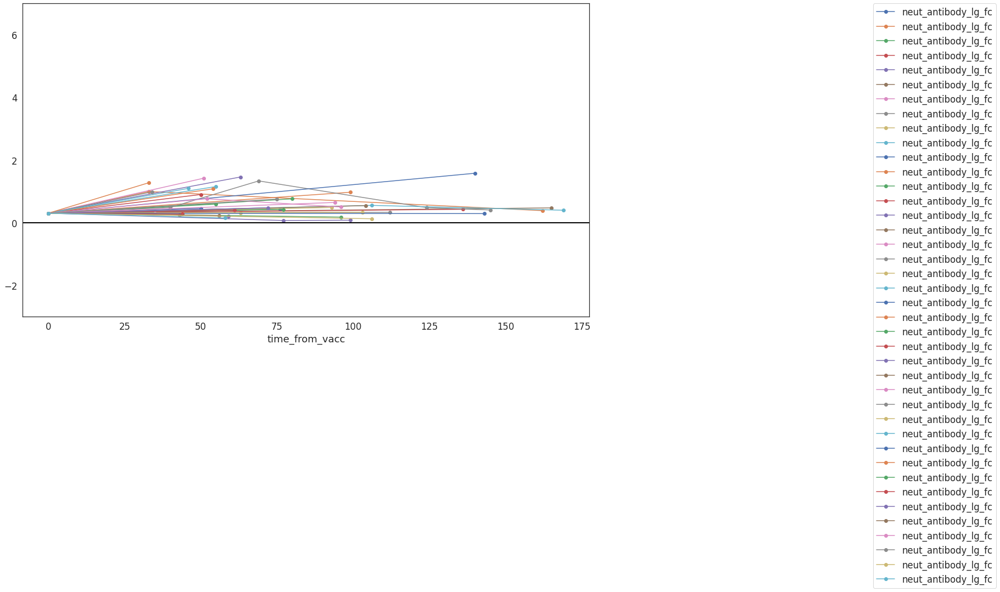

In [72]:
sns.set_style('white')
fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
covid_antibody_df_normalized.groupby("patient").plot(x="time_from_vacc", y="neut_antibody_lg_fc", marker="o", ax=ax)
ax.legend(list(set(covid_antibody_df_normalized['patient'])))
plt.legend(bbox_to_anchor=(1.5,1),loc=2,borderaxespad=0)
plt.axhline(linewidth=2, color='#000000',y=0)
ax.set_ylim([-3, 7])


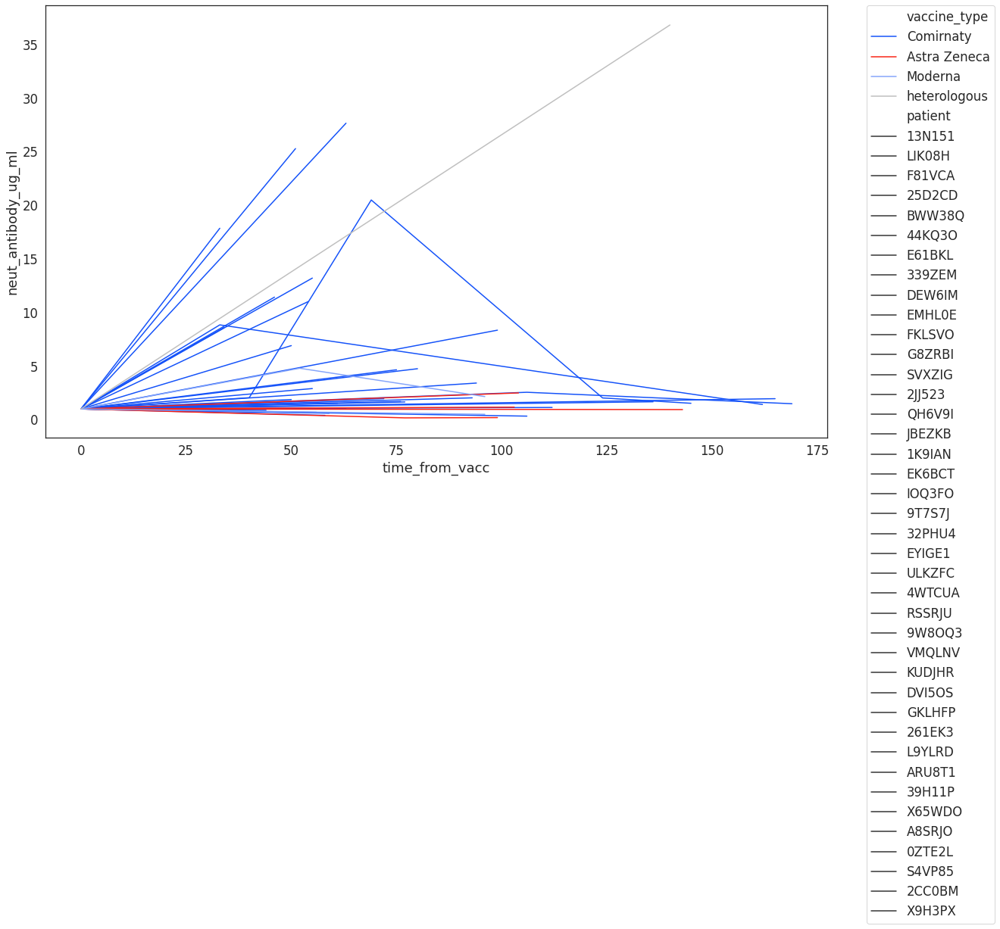

In [73]:
# Draw a pointplot

#restrict to samples with available baseline
baseline_patient_list = list(covid_antibody_df_normalized[covid_antibody_df_normalized['time_from_vacc']==0]['patient'])
covid_antibody_df_normalized_with_baseline = covid_antibody_df_normalized[covid_antibody_df_normalized['patient'].isin(baseline_patient_list)]

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_antibody_df_normalized_with_baseline,
    x="time_from_vacc", y="neut_antibody_ug_ml", hue="vaccine_type",style="patient",
    markers=False, dashes=False, ax=axis,palette=vaccine_type_dict
)
#plt.axhline(linewidth=2, color='#000000',y=1,ls='dashed')
#plt.ylim(0,5)
#plt.xlim(0,30)
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)

In [74]:
scipy.stats.wilcoxon(covid_antibody_df_normalized_with_baseline['neut_antibody_ug_ml']-1, zero_method='wilcox',correction=False)

WilcoxonResult(statistic=118.0, pvalue=2.3625916352176628e-06)

In [75]:
#patients with at least 2 fold from baseline:

print('proportion of patients with at least 2fold increase over baseline:', len(set(covid_antibody_df_normalized[covid_antibody_df_normalized['neut_antibody_ug_ml']>2]['patient']))/len(set(covid_antibody_df_normalized['patient'])))
print('proportion of patients with at least 10fold increase over baseline:', len(set(covid_antibody_df_normalized[covid_antibody_df_normalized['neut_antibody_ug_ml']>10]['patient']))/len(set(covid_antibody_df_normalized['patient'])))
print('proportion of patients with at least 20fold increase over baseline:', len(set(covid_antibody_df_normalized[covid_antibody_df_normalized['neut_antibody_ug_ml']>20]['patient']))/len(set(covid_antibody_df_normalized['patient'])))

proportion of patients with at least 2fold increase over baseline: 0.5
proportion of patients with at least 10fold increase over baseline: 0.2
proportion of patients with at least 20fold increase over baseline: 0.1


In [76]:
len(set(covid_antibody_df_normalized['patient']))

40

# Plot lab values

In [77]:
vaccine_type_dict = {'Comirnaty':blue_blue_red_grey[0],'Moderna':blue_blue_red_grey[1], 'Astra Zeneca':blue_blue_red_grey[2],'heterologous':blue_blue_red_grey[3],'not_defined':'#000000'}

In [78]:
vaccine_type_dict

{'Comirnaty': '#1452f9',
 'Moderna': '#85a5fa',
 'Astra Zeneca': '#f92214',
 'heterologous': '#bfbfbf',
 'not_defined': '#000000'}

## crp

### 1st dose

/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/2255486598.py:23: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/2255486598.py:23: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',


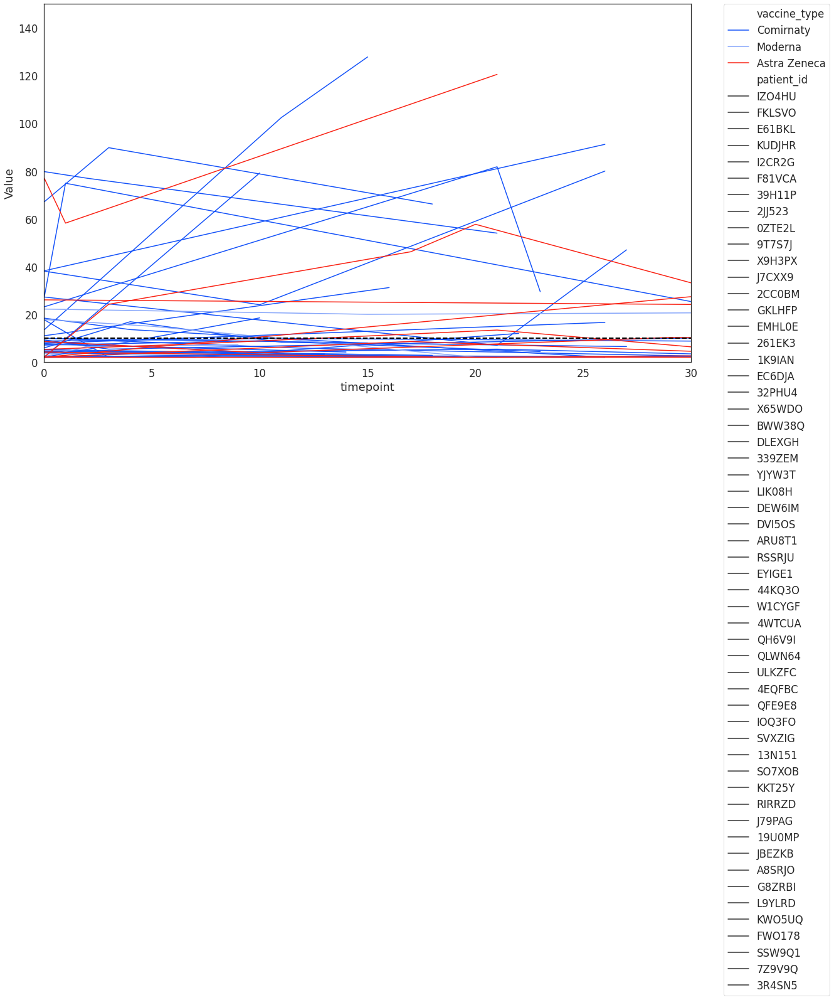

In [79]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_crp_1st_dose_df[covid_crp_1st_dose_df['timepoint']==0]['patient_id'])
covid_crp_1st_dose_df_with_baseline = covid_crp_1st_dose_df[covid_crp_1st_dose_df['patient_id'].isin(baseline_patient_list)]
save_name = 'crp_firstdose_1'
save_path_source = figure_source_path +  save_name + '.csv'


sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_crp_1st_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=False, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=10,ls='dashed')
plt.ylim(0,150)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
plt.savefig(figure_save_path+save_name)
covid_crp_1st_dose_df_with_baseline.to_csv(save_path_source)

In [80]:
#patients with upregulation of crp
thresh = 30
fold_thresh = 1.5
df = covid_crp_1st_dose_df_with_baseline.copy()
patients = set(df['patient_id'])

#normalize to pre to get fold change from pre
a = set(df[df['Value']>thresh]['patient_id'])

df_list = []

for i in patients:
  df_patient  = df[df['patient_id']==i]
  timepoints = list(df_patient['timepoint']) 
  if 0 in timepoints:
    df_patient_pre = df_patient[df_patient['timepoint']==0]
    df_patient['Value'].map(lambda x:x/list(df_patient_pre['Value'])[0])
    patient_df = pd.DataFrame(df_patient['Value'].map(lambda x:x/list(df_patient_pre['Value'])[0]))
    patient_df.loc[:,'patient'] = i
    df_list.append(patient_df)
df_patients = pd.concat(df_list)
df_patients_tresh = df_patients[df_patients['Value']>1.5]
df_patients_tresh_set = set(df_patients_tresh['patient'])

#intersection of patients above absolute thresh and fold change above fold change thresh
patients_with_up = patients.intersection(df_patients_tresh_set)

print('patients with upregulation above', thresh,'and fold change over',fold_thresh,':')
print(patients_with_up)
print('these are:',len(patients_with_up),'patients and', len(patients_with_up)/len(patients)*100,'%')

patients with upregulation above 30 and fold change over 1.5 :
{'LIK08H', '7Z9V9Q', 'BWW38Q', 'EC6DJA', '19U0MP', 'J7CXX9', 'DEW6IM', 'G8ZRBI', 'SVXZIG', 'SSW9Q1', '9T7S7J', 'ULKZFC', '4WTCUA', 'KWO5UQ', 'FWO178', '261EK3', 'L9YLRD', 'ARU8T1', '39H11P', 'A8SRJO', '0ZTE2L', 'X9H3PX'}
these are: 22 patients and 40.0 %


/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/2482900392.py:24: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/2482900392.py:24: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',


saved to: crp_1st_OI9CSG


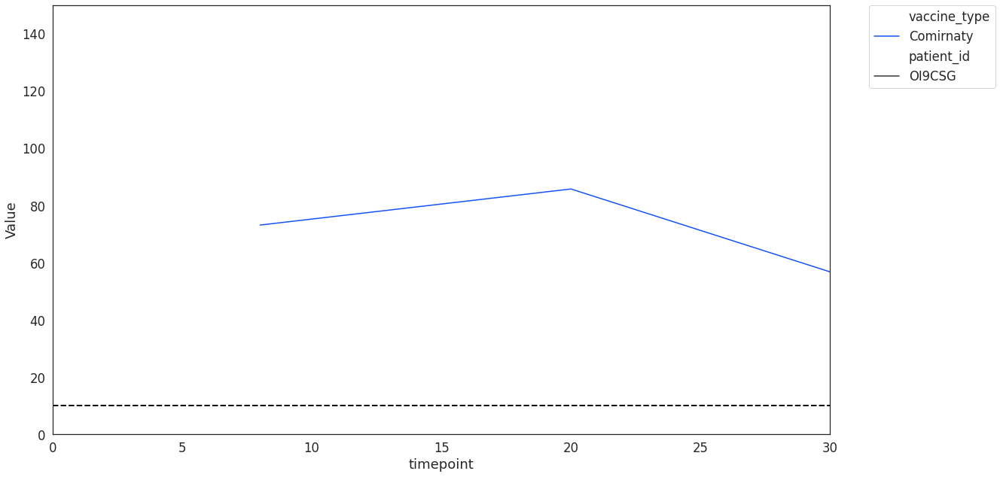

In [81]:
# CRP first dost plot for individual pat

#restrict to samples with available baseline
patient = 'OI9CSG'
baseline_patient_list = list(covid_crp_1st_dose_df[covid_crp_1st_dose_df['timepoint']==0]['patient_id'])
covid_crp_1st_dose_df_with_baseline = covid_crp_1st_dose_df[covid_crp_1st_dose_df['patient_id']==patient]
save_name = 'crp_1st_' + patient
save_path_source = figure_source_path +  save_name + '.csv'


sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_crp_1st_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=False, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=10,ls='dashed')
plt.ylim(0,150)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
plt.savefig(figure_save_path+save_name)
print('saved to:',save_name)
covid_crp_1st_dose_df_with_baseline.to_csv(save_path_source)

In [82]:
df_patient

,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,patient_id,vaccine_type,timepoint,Value
10,10,10,10,10,10,X9H3PX,Comirnaty,0.0,11.0
95,99,99,99,99,99,X9H3PX,Comirnaty,16.0,31.2


/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/3464364015.py:22: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/3464364015.py:22: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',


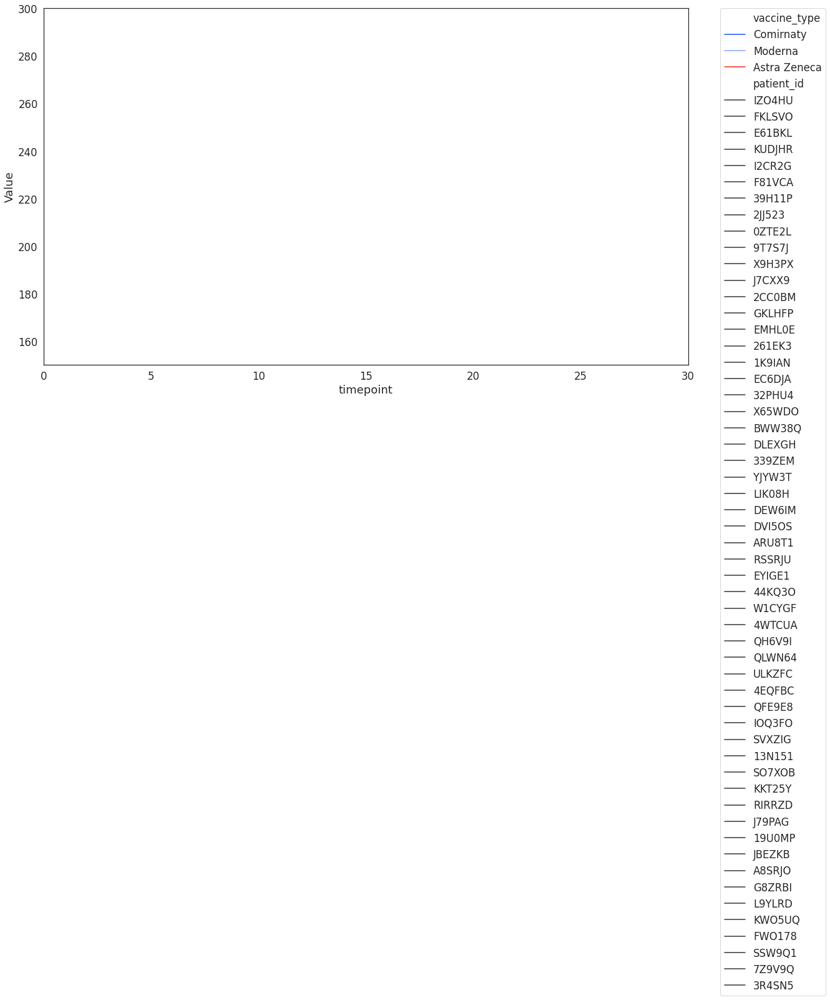

In [83]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_crp_1st_dose_df[covid_crp_1st_dose_df['timepoint']==0]['patient_id'])
covid_crp_1st_dose_df_with_baseline = covid_crp_1st_dose_df[covid_crp_1st_dose_df['patient_id'].isin(baseline_patient_list)]
save_name = 'crp_firstdose_2'
save_path_source = figure_source_path +  save_name + '.csv'

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_crp_1st_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=False, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=10,ls='dashed')
plt.ylim(150,300)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
plt.savefig(figure_save_path+save_name)



### 2nd dose

No handles with labels found to put in legend.
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/2290001880.py:24: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/2290001880.py:24: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',


saved to: crp_seconddose_1_OI9CSG


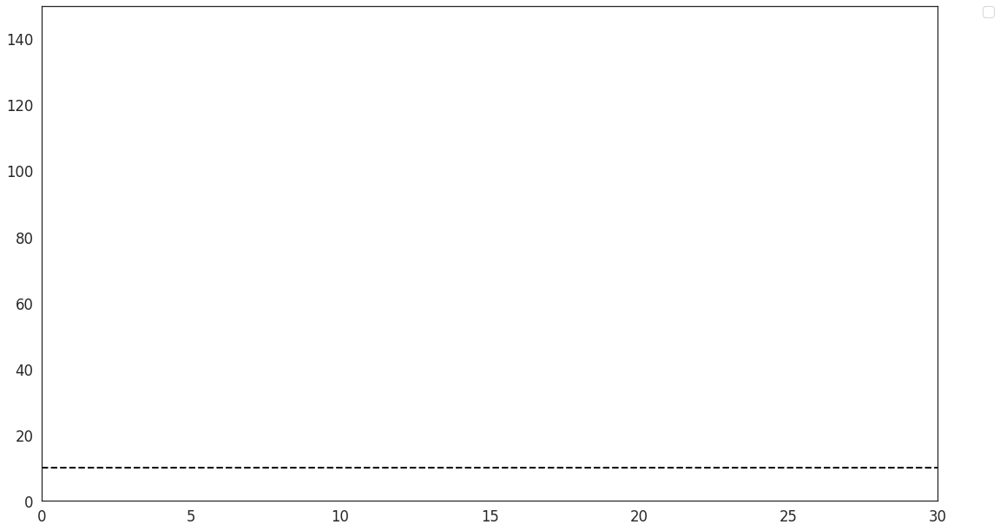

In [84]:
# CRP second dost plot for individual pat

#restrict to samples with available baseline
patient = 'OI9CSG'
baseline_patient_list = list(covid_crp_2nd_dose_df[covid_crp_2nd_dose_df['timepoint']==0]['patient_id'])
covid_crp_2nd_dose_df_with_baseline = covid_crp_2nd_dose_df[covid_crp_2nd_dose_df['patient_id']==patient]
save_name = 'crp_seconddose_1_' + patient
save_path_source = figure_source_path +  save_name + '.csv'

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_crp_2nd_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=False, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=10,ls='dashed')

plt.ylim(0,150)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
plt.savefig(figure_save_path+save_name)
print('saved to:',save_name)
covid_crp_1st_dose_df_with_baseline.to_csv(save_path_source)


/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/82469797.py:23: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/82469797.py:23: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',


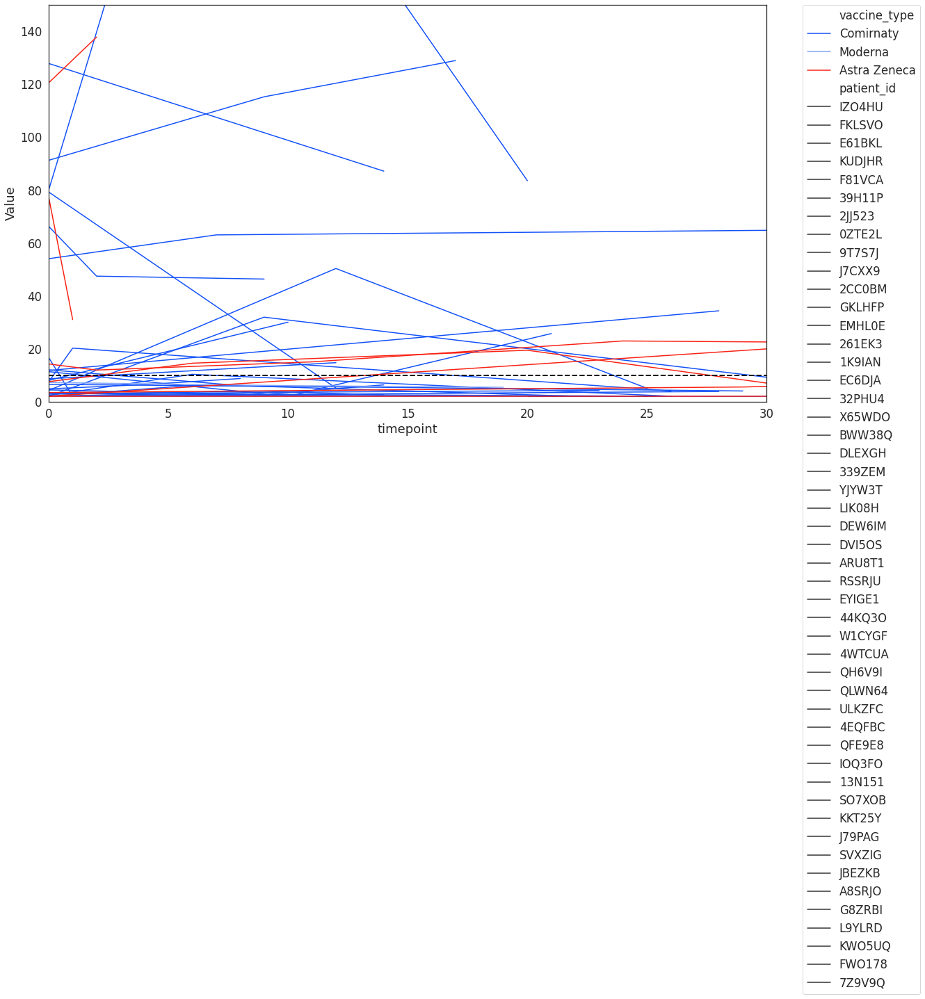

In [85]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_crp_2nd_dose_df[covid_crp_2nd_dose_df['timepoint']==0]['patient_id'])
covid_crp_2nd_dose_df_with_baseline = covid_crp_2nd_dose_df[covid_crp_2nd_dose_df['patient_id'].isin(baseline_patient_list)]
save_name = 'crp_seconddose_1'
save_path_source = figure_source_path +  save_name + '.csv'

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_crp_2nd_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=False, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=10,ls='dashed')

plt.ylim(0,150)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
plt.savefig(figure_save_path+save_name)
covid_crp_1st_dose_df_with_baseline.to_csv(save_path_source)


In [86]:
len(set(pd.concat([covid_crp_1st_dose_df_with_baseline,covid_crp_2nd_dose_df_with_baseline])['patient_id']))

55

In [87]:
#patients with upregulation of crp
thresh = 30
fold_thresh = 1.5
df = covid_crp_2nd_dose_df_with_baseline.copy()
patients = set(df['patient_id'])

#normalize to pre to get fold change from pre
a = set(df[df['Value']>thresh]['patient_id'])

df_list = []

for i in patients:
  df_patient  = df[df['patient_id']==i]
  timepoints = list(df_patient['timepoint']) 
  if 0 in timepoints:
    df_patient_pre = df_patient[df_patient['timepoint']==0]
    df_patient['Value'].map(lambda x:x/list(df_patient_pre['Value'])[0])
    patient_df = pd.DataFrame(df_patient['Value'].map(lambda x:x/list(df_patient_pre['Value'])[0]))
    patient_df.loc[:,'patient'] = i
    df_list.append(patient_df)
df_patients = pd.concat(df_list)
df_patients_tresh = df_patients[df_patients['Value']>1.5]
df_patients_tresh_set = set(df_patients_tresh['patient'])

#intersection of patients above absolute thresh and fold change above fold change thresh
patients_with_up = patients.intersection(df_patients_tresh_set)

print('patients with upregulation above', thresh,'and fold change over',fold_thresh,':')
print(patients_with_up)
print('these are:',len(patients_with_up),'patients and', len(patients_with_up)/len(patients)*100,'%')

patients with upregulation above 30 and fold change over 1.5 :
{'EYIGE1', 'L9YLRD', 'DEW6IM', 'FKLSVO', 'G8ZRBI', 'SVXZIG', 'F81VCA', '2JJ523', 'KWO5UQ', 'E61BKL', 'A8SRJO', 'DLEXGH', '4EQFBC', '32PHU4', '44KQ3O', 'EC6DJA', '9T7S7J', '339ZEM'}
these are: 18 patients and 36.734693877551024 %


/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1561273155.py:22: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'svg', dpi=300, facecolor='w', edgecolor='w',
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1561273155.py:22: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'svg', dpi=300, facecolor='w', edgecolor='w',


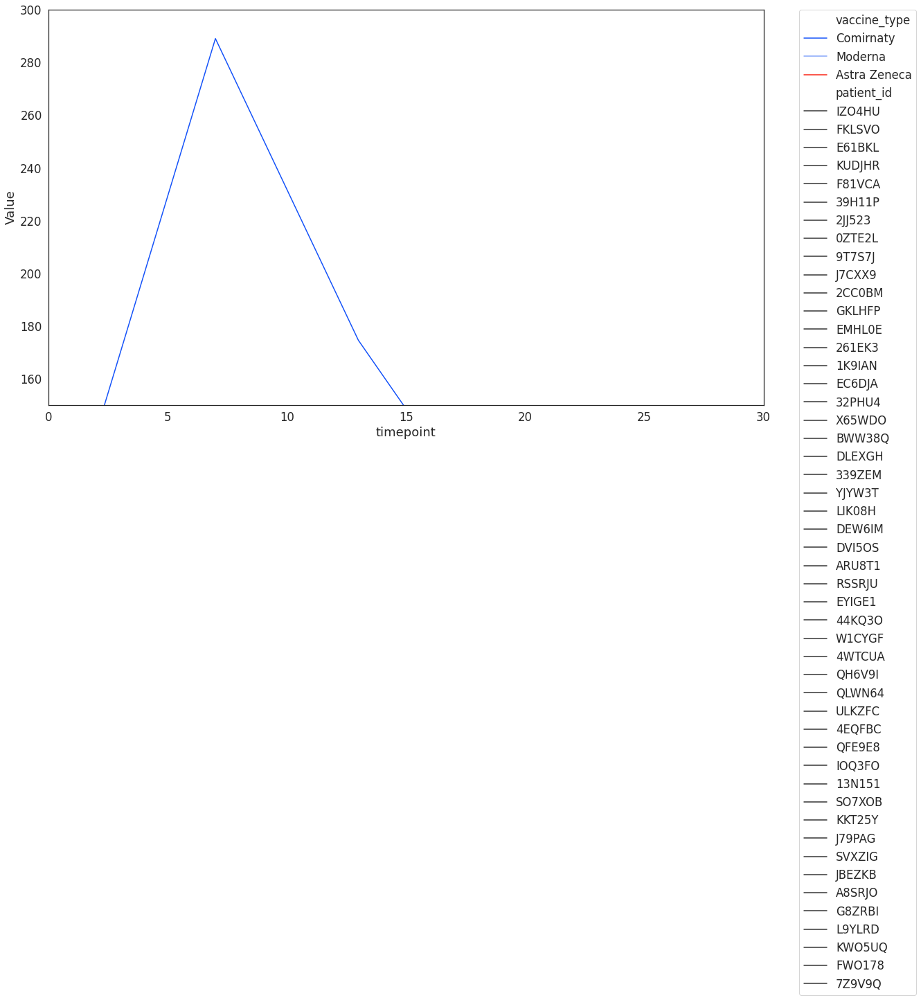

In [88]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_crp_2nd_dose_df[covid_crp_2nd_dose_df['timepoint']==0]['patient_id'])
covid_crp_2nd_dose_df_with_baseline = covid_crp_2nd_dose_df[covid_crp_2nd_dose_df['patient_id'].isin(baseline_patient_list)]
save_name = 'crp_seconddose_2'
save_path_source = figure_source_path +  save_name + '.csv'

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_crp_2nd_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=False, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=10,ls='dashed')
plt.ylim(150,300)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(figure_save_path+save_name+'svg', dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
plt.savefig(figure_save_path+save_name)
covid_crp_1st_dose_df_with_baseline.to_csv(save_path_source)

## platelets

### 1st dose

/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/2718286215.py:24: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/2718286215.py:24: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',


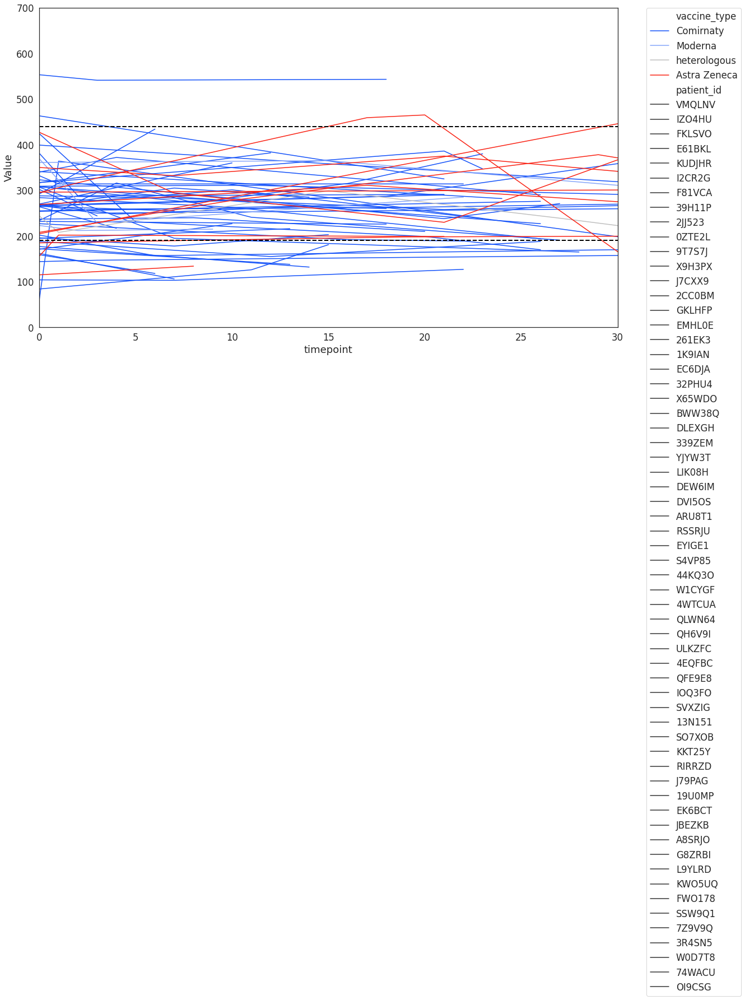

In [89]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_platelets_1st_dose_df[covid_platelets_1st_dose_df['timepoint']==0]['patient_id'])
covid_platelets_1st_dose_df_with_baseline = covid_platelets_1st_dose_df[covid_platelets_1st_dose_df['patient_id'].isin(baseline_patient_list)]
save_name = 'platelets_firstdose_1'
save_path_source = figure_source_path +  save_name + '.csv'

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_platelets_1st_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=False, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=190,ls='dashed')
plt.axhline(linewidth=2, color='#000000',y=440,ls='dashed')

plt.ylim(0,700)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
plt.savefig(figure_save_path+save_name)
covid_crp_1st_dose_df_with_baseline.to_csv(save_path_source)

/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1840411228.py:25: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1840411228.py:25: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',


saved to: platelets_firstdose_1_OI9CSG


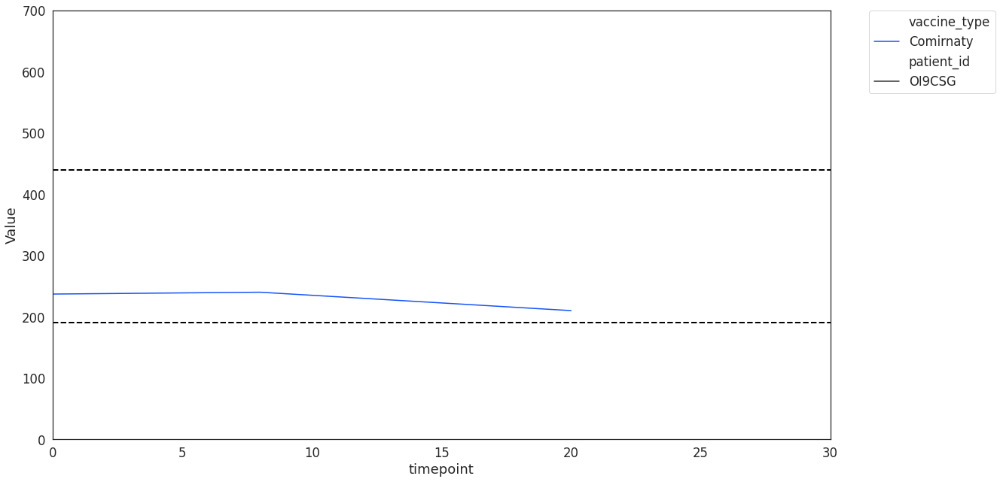

In [90]:
# platelets first dost plot for individual pat

#restrict to samples with available baseline
patient = 'OI9CSG'
baseline_patient_list = list(covid_platelets_1st_dose_df[covid_platelets_1st_dose_df['timepoint']==0]['patient_id'])
covid_platelets_1st_dose_df_with_baseline = covid_platelets_1st_dose_df[covid_platelets_1st_dose_df['patient_id']==patient]
save_name = 'platelets_firstdose_1_' + patient
save_path_source = figure_source_path +  save_name + '.csv'

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_platelets_1st_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=False, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=190,ls='dashed')
plt.axhline(linewidth=2, color='#000000',y=440,ls='dashed')

plt.ylim(0,700)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(figure_save_path+save_name+'.svg', dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
plt.savefig(figure_save_path+save_name)
print('saved to:',save_name)
covid_crp_1st_dose_df_with_baseline.to_csv(save_path_source)


### 2nd dose

/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/3998329820.py:24: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'svg', dpi=300, facecolor='w', edgecolor='w',
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/3998329820.py:24: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'svg', dpi=300, facecolor='w', edgecolor='w',


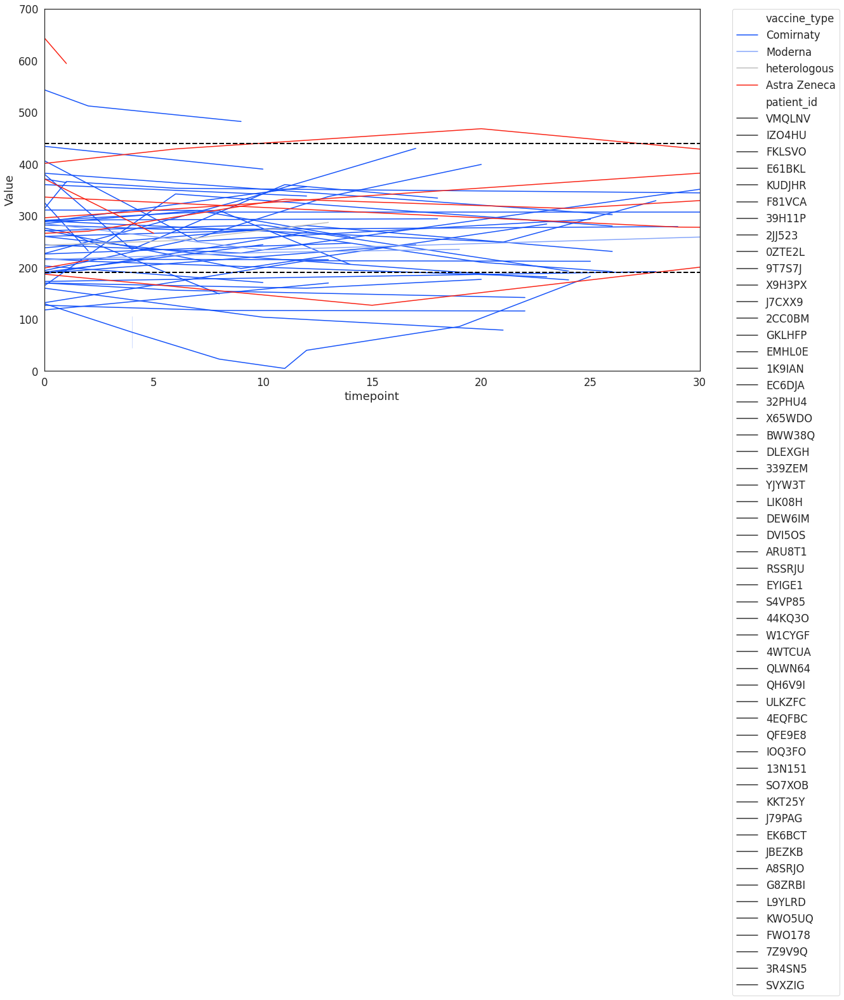

In [91]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_platelets_2nd_dose_df[covid_platelets_2nd_dose_df['timepoint']==0]['patient_id'])
covid_platelets_2nd_dose_df_with_baseline = covid_platelets_2nd_dose_df[covid_platelets_2nd_dose_df['patient_id'].isin(baseline_patient_list)]
save_name = 'platelets_seconddose_2'
save_path_source = figure_source_path +  save_name + '.csv'

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_platelets_2nd_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=False, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=190,ls='dashed')
plt.axhline(linewidth=2, color='#000000',y=440,ls='dashed')

plt.ylim(0,700)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(figure_save_path+save_name+'svg', dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
plt.savefig(figure_save_path+save_name)
covid_crp_1st_dose_df_with_baseline.to_csv(save_path_source)

No handles with labels found to put in legend.
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/3625987346.py:25: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'svg', dpi=300, facecolor='w', edgecolor='w',
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/3625987346.py:25: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(figure_save_path+save_name+'svg', dpi=300, facecolor='w', edgecolor='w',


saved to: platelets_seconddose_2_OI9CSG


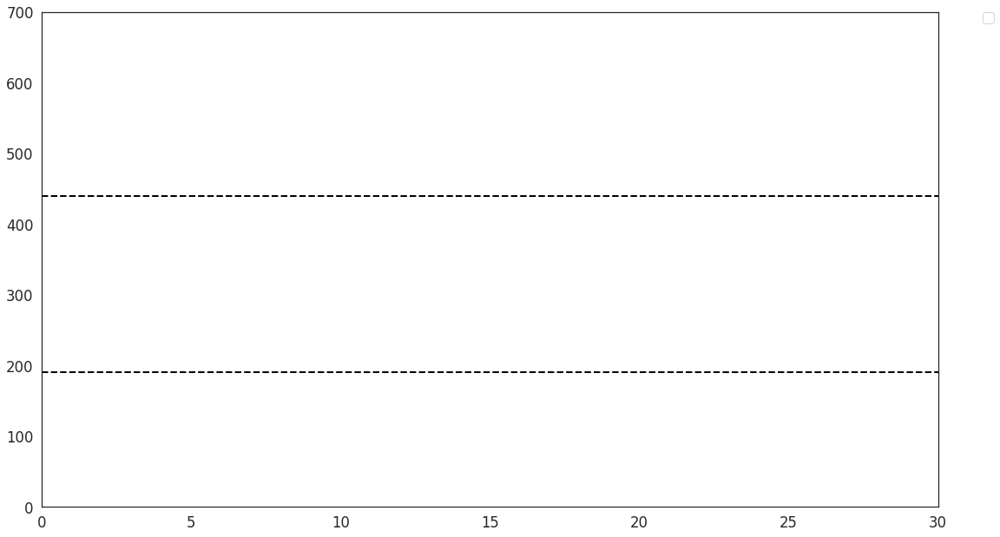

In [92]:
# platelets second dost plot for individual pat

#restrict to samples with available baseline
patient = 'OI9CSG'
baseline_patient_list = list(covid_platelets_2nd_dose_df[covid_platelets_2nd_dose_df['timepoint']==0]['patient_id'])
covid_platelets_2nd_dose_df_with_baseline = covid_platelets_2nd_dose_df[covid_platelets_2nd_dose_df['patient_id']==patient]
save_name = 'platelets_seconddose_2_' + patient
save_path_source = figure_source_path +  save_name + '.csv'

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_platelets_2nd_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=False, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=190,ls='dashed')
plt.axhline(linewidth=2, color='#000000',y=440,ls='dashed')

plt.ylim(0,700)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(figure_save_path+save_name+'svg', dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
plt.savefig(figure_save_path+save_name)
print('saved to:',save_name)
covid_crp_1st_dose_df_with_baseline.to_csv(save_path_source)

In [93]:
len(set(pd.concat([covid_platelets_1st_dose_df_with_baseline,covid_platelets_2nd_dose_df_with_baseline])['patient_id']))

1

# Plot individual cytokines (line plots)

In [94]:
#indicate sample timepoint and patient id
JK210728_panel1_2_merge['timepoint'] = JK210728_panel1_2_merge.index.map(time_dict)
JK210728_panel1_2_merge['patient_id'] = JK210728_panel1_2_merge.index.str.slice(stop=-3)

In [95]:
#flatten dataframe for plotting
JK210728_panel1_2_merge_flat = JK210728_panel1_2_merge.melt(id_vars=['timepoint','patient_id'])
JK210728_panel1_2_merge_flat

,timepoint,patient_id,variable,value
0,pre,2JJ523,IL-6,2.650
1,pre,261EK3,IL-6,17.355
2,pre,4WTCUA,IL-6,56.665
3,pre,2CC0BM,IL-6,1.840
4,pre,32PHU4,IL-6,7.350
...,...,...,...,...
1895,post2,339ZEM,IL-12p70,34.061
1896,post2,ARU8T1,IL-12p70,0.000
1897,post2,EMHL0E,IL-12p70,18.745
1898,post2,KUDJHR,IL-12p70,0.000


In [96]:
JK210728_panel1_2_merge

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,...,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint,patient_id
sample_id,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,2.650,488.8080,16.810,1.4880,0.3160,0.910,5.4560,211.265,8.5400,0.930,...,296.690,0.000,3.220,0.0000,133.4630,11.2650,0.000,0.000,pre,2JJ523
261EK3_T2,17.355,465.5065,2.785,3.3615,1.5710,5.745,10.7870,541.300,116.7450,1.880,...,5205.930,3.930,105.490,0.3360,412.8610,31.5020,132.200,0.000,pre,261EK3
4WTCUA_T1,56.665,172.2150,174.825,14.9455,12.2750,116.770,40.5410,1279.270,54.0830,52.170,...,2142.100,341.885,362.625,36.6070,387.6175,23.1820,810.565,153.383,pre,4WTCUA
2CC0BM_T1,1.840,420.6210,22.980,0.4640,1.2950,5.390,8.1560,283.025,9.4415,4.910,...,953.905,5.680,61.650,0.0000,283.0505,13.4635,0.000,4.365,pre,2CC0BM
32PHU4_T1,7.350,220.2825,49.300,3.4130,1.9255,20.810,11.7625,1017.605,14.1130,1.595,...,4373.180,3.930,60.290,6.9550,315.6115,20.2830,239.920,4.625,pre,32PHU4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
339ZEM_T2,6.915,466.2790,63.500,21.1130,5.9595,27.710,30.9525,1505.335,46.4035,12.560,...,2624.300,46.430,196.375,8.8035,677.9160,39.7390,527.635,34.061,post2,339ZEM
ARU8T1_T2,0.190,548.2515,21.860,0.5395,1.5275,4.510,37.5850,330.495,36.5230,1.135,...,3044.340,0.000,106.655,2.7830,806.2995,16.1555,45.535,0.000,post2,ARU8T1
EMHL0E_T5,8.660,166.0630,92.945,6.9830,4.7440,48.135,33.9105,703.310,42.6005,19.005,...,439.710,46.655,130.500,2.2890,104.7640,16.1800,269.520,18.745,post2,EMHL0E


/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/2216820430.py:65: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/2216820430.py:65: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',


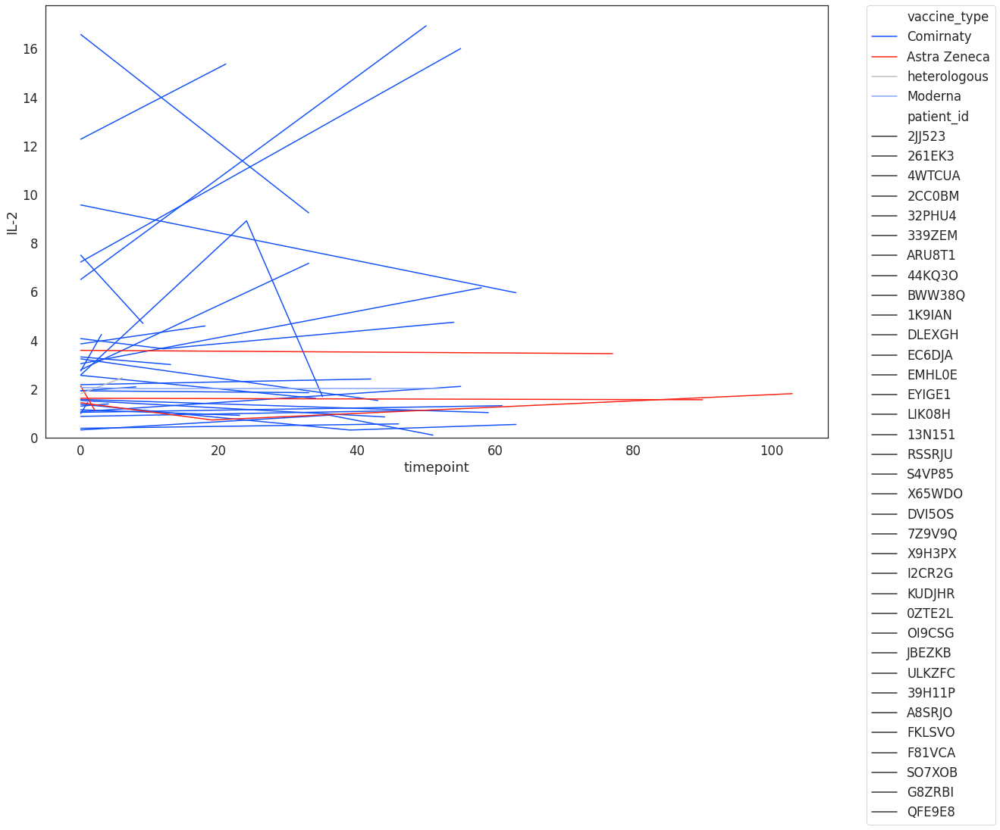

In [97]:
#plot with timeponts

vaccine_type_dict = {'Comirnaty':blue_blue_red_grey[0],'Moderna':blue_blue_red_grey[1], 'Astra Zeneca':blue_blue_red_grey[2],'heterologous':blue_blue_red_grey[3]}
cytokine_of_interest = 'IL-2'
time_from_first_dict = sample_table['time_from_first'].to_dict()
df_plot = JK210728_panel1_2_merge.copy()
df_plot['timepoint'] = df_plot.index.map(time_from_first_dict)
log_transform = False

if log_transform:
    save_path_source = figure_source_path +  cytokine_of_interest + '2log'+'.csv'
    fig_save_path_complete = figure_save_path+cytokine_of_interest+'2log'+'.svg'
else:
    save_path_source = figure_source_path +  cytokine_of_interest + '.csv'
    fig_save_path_complete = figure_save_path+cytokine_of_interest+'.svg'

#map vaccine type
df = df_plot

vaccine_type = {}
for i in patient_table.index: 
  a = patient_table.loc[i,'First_dose_vaccine']
  b = patient_table.loc[i,'Second_dose_vaccine']
  if a==b:
      vaccine_type[i]=a
  else:
    vaccine_type[i]='heterologous'
    
if log_transform:
    df_timepoint_dict = df['timepoint'].to_dict()
    df_patient_id_dict = df['patient_id'].to_dict()
    df = df.drop(columns=['timepoint','patient_id']).applymap(lambda x: math.log(x+1,2))
    df['timepoint'] = df.index.map(df_timepoint_dict)
    df['patient_id'] = df.index.map(df_patient_id_dict)
    

df['vaccine_type'] = df['patient_id'].map(vaccine_type)
df_plot = df


#set all baseline timepoints to 0

adj_time = []
for i in df_plot['timepoint']:
  if i < 0:
    adj_time.append(0)
  else:
    adj_time.append(i)

df_plot['timepoint'] = adj_time

#restrict to samples with available baseline
baseline_patient_list = list(df_plot[df_plot['timepoint']==0]['patient_id'])
df_plot_baseline = df_plot[df_plot['patient_id'].isin(baseline_patient_list)]


sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=df_plot_baseline,
    x="timepoint", y=cytokine_of_interest, hue="vaccine_type",style="patient_id",
    markers=False, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
#plt.axhline(linewidth=2, color='#000000',y=13,ls='dashed')
#plt.axhline(linewidth=2, color='#000000',y=17,ls='dashed')

plt.ylim(0,)
#plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
df_plot_baseline.to_csv(save_path_source)

In [98]:
#get max and min timediff between first and second dose

from datetime import datetime

time_table = patient_table[~patient_table['Second_dose_date'].isna()]
time_table['First_dose_date'] = pd.to_datetime(time_table['First_dose_date'], format="%m/%d/%Y")
time_table['Second_dose_date'] = pd.to_datetime(time_table['Second_dose_date'], format="%m/%d/%Y")
vacc_type_dict = df_plot['vaccine_type'].to_dict()
vacc_type_dict = {x[:-3]:vacc_type_dict[x] for x in vacc_type_dict}
time_table['vaccine_type'] = time_table.index.map(vacc_type_dict)

time_table_comirnaty = time_table[time_table['vaccine_type']=='Comirnaty']
time_table_moderna = time_table[time_table['vaccine_type']=='Moderna']
time_table_az = time_table[time_table['vaccine_type']=='Astra Zeneca']

print('BioNTech/Pfizer')
time_dif = time_table_comirnaty['Second_dose_date'] - time_table_comirnaty['First_dose_date']
print('min time difference between 1st and 2nd dose is:',  min(time_dif))
print('max time difference bet|ween 1st and 2nd dose is:', max(time_dif))

print('Moderna')
time_dif = time_table_moderna['Second_dose_date'] - time_table_moderna['First_dose_date']
print('min time difference between 1st and 2nd dose is:',  min(time_dif))
print('max time difference between 1st and 2nd dose is:', max(time_dif))

print('AZ')
time_dif = time_table_az['Second_dose_date'] - time_table_az['First_dose_date']
print('min time difference between 1st and 2nd dose is:',  min(time_dif))
print('max time difference between 1st and 2nd dose is:', max(time_dif))

BioNTech/Pfizer
min time difference between 1st and 2nd dose is: 21 days 00:00:00
max time difference bet|ween 1st and 2nd dose is: 45 days 00:00:00
Moderna
min time difference between 1st and 2nd dose is: 35 days 00:00:00
max time difference between 1st and 2nd dose is: 35 days 00:00:00
AZ
min time difference between 1st and 2nd dose is: 42 days 00:00:00
max time difference between 1st and 2nd dose is: 75 days 00:00:00


/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1713518856.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  time_table['First_dose_date'] = pd.to_datetime(time_table['First_dose_date'], format="%m/%d/%Y")
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1713518856.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  time_table['Second_dose_date'] = pd.to_datetime(time_table['Second_dose_date'], format="%m/%d/%Y")
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1713518856.py:10: SettingWithCopyWarning: 
A v

In [99]:
#inspect top IL6 patients
JK210728_panel1_2_merge_flat_IL6 = JK210728_panel1_2_merge_flat[JK210728_panel1_2_merge_flat['variable']=='IL-6']
top_IL6 = JK210728_panel1_2_merge_flat_IL6[JK210728_panel1_2_merge_flat_IL6['value']>50].set_index('patient_id').sort_values('value', ascending=False)['value']


#take only patients who show upregulation of IL6 after vaccination

patients_IL6_induction = []
for i in set(top_IL6.index):
  subset_df = JK210728_panel1_2_merge_flat_IL6[JK210728_panel1_2_merge_flat_IL6['patient_id']==i]
  subset_df_pre = subset_df[subset_df['timepoint']=='pre']
  subset_df_post1 = subset_df[subset_df['timepoint']=='post1']
  subset_df_post2 = subset_df[subset_df['timepoint']=='post2']
  if subset_df_post1['patient_id'].shape[0] != 0:  #check if df is empty because the post1 sample was not contained in the data
    if subset_df_post1['value'].iloc[0] > subset_df_pre['value'].iloc[0]:
      patients_IL6_induction.append(i)
  elif subset_df_post2['patient_id'].shape[0] != 0: #check if df is empty because the post1 sample was not contained in the data
    if subset_df_post2['value'].iloc[0] > subset_df_pre['value'].iloc[0]:
      patients_IL6_induction.append(i)

patients_above_50pg = list(dict.fromkeys(set(top_IL6.index).intersection(set(patients_IL6_induction))))

print('patients above 50pg/ml:', patients_above_50pg)

patients above 50pg/ml: ['LIK08H', '4WTCUA', '2JJ523', 'BWW38Q', 'OI9CSG', '0ZTE2L', '261EK3', 'X9H3PX']


In [100]:
#set params
sns.set(font_scale=5)
sns.set_style('white')
line_weight = 6
subplot_coordinate_list=[(0,0),(0,1),(0,2),(0,3),(0,4),(0,5),(1,0),(1,1),(1,2),(1,3),(1,4),(1,5),(2,0),(2,1),(2,2),(2,3),(2,4),(2,5),(3,0),(3,1),(3,2),(3,3),(3,4),(3,5),(4,0),(4,1),(4,2),(4,3),(4,4),(4,5),
                         (5,0),(5,1),(5,2),(5,3),(5,4),(5,5)]
fig, axs = plt.subplots(6, 6, figsize=(150,150), sharey=False)

#plot
for j,i in enumerate(set(JK210728_panel1_2_merge_flat['variable'])):
  JK210728_panel1_2_merge_flat_subset = JK210728_panel1_2_merge_flat[JK210728_panel1_2_merge_flat['variable']==i]
  for k in set(JK210728_panel1_2_merge_flat['patient_id']):
    axs[subplot_coordinate_list[j]].plot('timepoint', 'value', data=JK210728_panel1_2_merge_flat_subset[JK210728_panel1_2_merge_flat_subset['patient_id']==k],linewidth=line_weight, linestyle='-',marker='o', color=patient_color_dict[k])
  axs[subplot_coordinate_list[j]].set_title(i)

In [101]:
color_dict_cyt

{'CCL2': '#FFFF00',
 'CCL3': '#1CE6FF',
 'CCL4': '#FF34FF',
 'CSF2': '#FF4A46',
 'CSF3': '#008941',
 'CXCL10': '#006FA6',
 'CXCL8': '#A30059',
 'IFN-a2': '#7A4900',
 'IFN-g': '#0000A6',
 'IL-10': '#63FFAC',
 'IL-12p70': '#B79762',
 'IL-13': '#004D43',
 'IL-15': '#8FB0FF',
 'IL-17a': '#997D87',
 'IL-18': '#5A0007',
 'IL-1b': '#809693',
 'IL-2': '#1B4400',
 'IL-4': '#4FC601',
 'IL-5': '#3B5DFF',
 'IL-6': '#4A3B53',
 'IL-7': '#FF2F80',
 'TNF-a': '#61615A',
 'VEGF': '#BA0900',
 'sIL-1RA': '#6B7900',
 'sIL-2RA': '#00C2A0'}

/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1721683286.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  single_patient_df['value']= single_patient_df['value'].map(lambda x: math.log(x+1,10))
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1721683286.py:18: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1721683286.py:18: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt

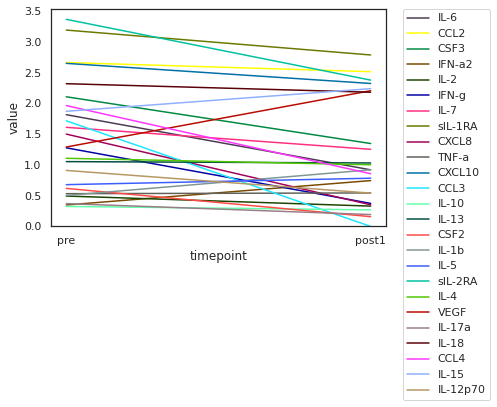

In [102]:
#plot for specific patients log trans
patient_of_interest = '7Z9V9Q'#'OI9CSG'#'SVXZIG'#'QLWN64'#'QH6V9I'#'32PHU4'
source_path_final = figure_source_path + patient_of_interest +'_source_data.csv'
fig_save_path_complete = figure_save_path + patient_of_interest + '.svg'


single_patient_df = JK210728_panel1_2_merge_flat[JK210728_panel1_2_merge_flat['patient_id']==patient_of_interest]
single_patient_df['value']= single_patient_df['value'].map(lambda x: math.log(x+1,10))
sns.set(font_scale=1)
sns.set_style('white')
sns.lineplot(
    data=single_patient_df,
    x="timepoint", y="value", hue="variable",
    markers=False, dashes=False,palette=color_dict_cyt
)
plt.ylim(0,)
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
single_patient_df.to_csv(source_path_final)

/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1226153002.py:18: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1226153002.py:18: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',


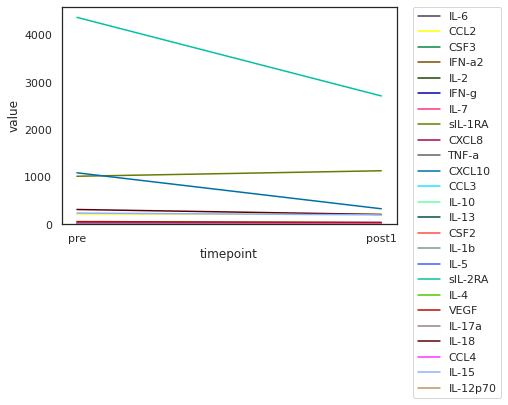

In [103]:
#plot for specific patients nonlog trans
patient_of_interest = '32PHU4'
source_path_final = figure_source_path + patient_of_interest +'_nonlog_source_data.csv'
fig_save_path_complete = figure_save_path + patient_of_interest + '_nonlog.svg'


single_patient_df = JK210728_panel1_2_merge_flat[JK210728_panel1_2_merge_flat['patient_id']==patient_of_interest]
#single_patient_df['value']= single_patient_df['value'].map(lambda x: math.log(x+1,10))
sns.set(font_scale=1)
sns.set_style('white')
sns.lineplot(
    data=single_patient_df,
    x="timepoint", y="value", hue="variable",
    markers=False, dashes=False,palette=color_dict_cyt
)
plt.ylim(0,)
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
single_patient_df.to_csv(source_path_final)

# Plot covariances

In [104]:
#cytokine data
#columns_to_drop = [x for x in ['timepoint','sample_id','patient_id'] if x in JK210728_panel1_2_merge.columns]
#cov_df = JK210728_panel1_2_merge.drop(columns=columns_to_drop)
columns_to_drop = [x for x in ['timepoint','sample_id','patient_id'] if x in normalized_df.columns]
cov_df = normalized_df.drop(columns=columns_to_drop) 
#cytokines
marker_cytokines = list(cov_df.columns)

#which metric
calculate_covariance = 'pearson'  #set to either 'pearson', 'covariance'

#set threshold for heatmap
set_thresholds = True
set_vmax = 1
set_center = 0
set_vmin = -1

#set linkage for hierarchical clustering of heatmap
linkage_distance = 0.75

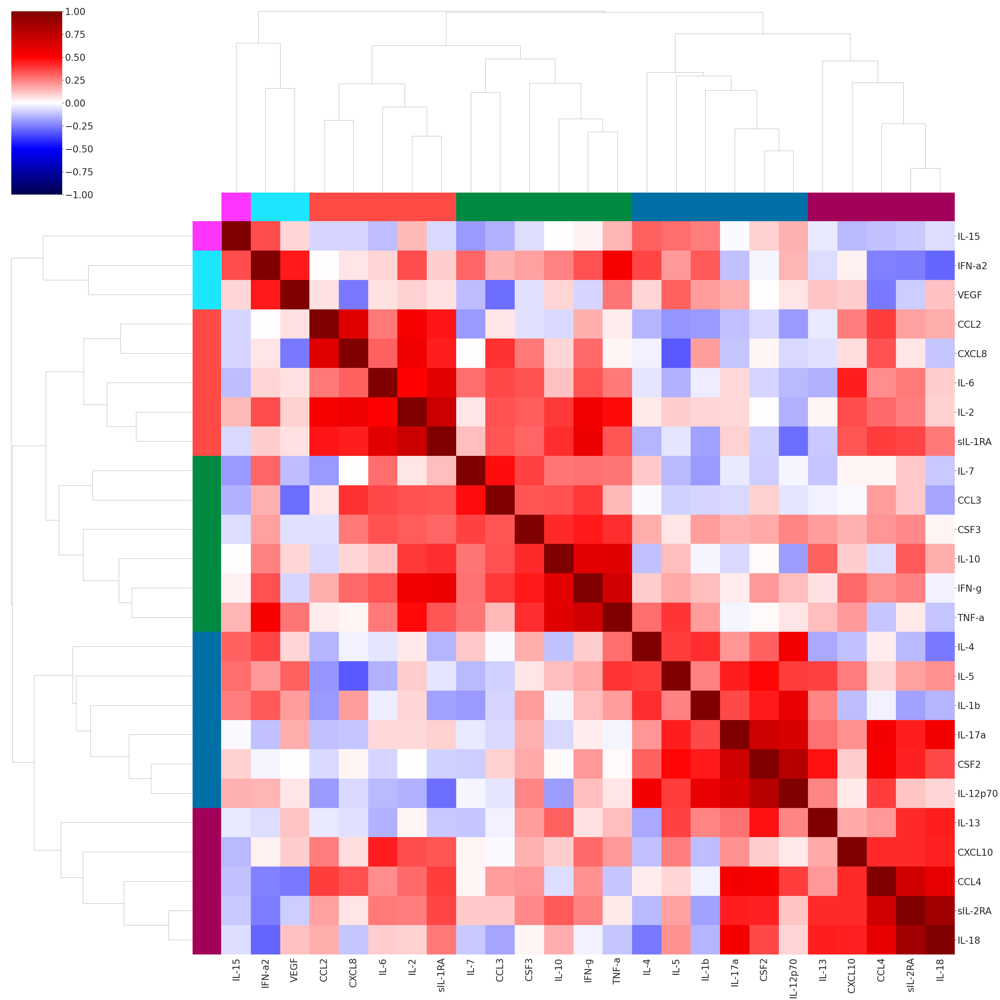

In [105]:
from scipy.spatial import distance
from scipy.cluster import hierarchy
sns.set(font_scale=3)
save_path_source = figure_source_path + 'correlation_heatmap.csv'
  
# Filter out genes not present data
marker_cytokines_filtered = []
for marker in marker_cytokines:
  if marker in cov_df.columns:   
    marker_cytokines_filtered.append(marker)

# Filter out genes not present in data
a = np.std(cov_df.loc[:,cov_df.columns.isin(marker_cytokines_filtered)], axis=0)
b = pd.DataFrame(a.T, index=a[cov_df.columns.isin(marker_cytokines_filtered)].index)
c = b[0]!=0
d = b[c]
e = b[0]==0
f = b[e]
marker_cytokines_filtered_nonzeroSD = d

#marker gene list
marker_cytokines_filtered_nonzeroSD = list(marker_cytokines_filtered_nonzeroSD.index)
    
#calculate covariance or corrcoef 
if calculate_covariance == 'pearson':             
  subsetcluster_cov = np.corrcoef(cov_df.loc[:,marker_cytokines_filtered_nonzeroSD].T)
elif calculate_covariance == 'covariance':            
  subsetcluster_cov = np.cov(cov_df.loc[:,marker_cytokines_filtered_nonzeroSD].T)
else:
  print('please set variable <subsetcluster_cov> to either: pearson, covariance or covariance_log')
subsetcluster_cov_df = pd.DataFrame(subsetcluster_cov, index=marker_cytokines_filtered_nonzeroSD, columns=marker_cytokines_filtered_nonzeroSD)
    
#hierarchically cluster rows and columns    
if True not in np.isnan(subsetcluster_cov):
    #define hierachical clustering
    row_linkage= hierarchy.linkage(scipy.spatial.distance.squareform(1-subsetcluster_cov, force='tovector', checks=False), method='average')
    col_linkage = hierarchy.linkage(scipy.spatial.distance.squareform(1-subsetcluster_cov.T, force='tovector', checks=False), method='average')
    #color side bar according to flat clustering
    row_col = []
    col_col = []
        
    hierarchical_cluster = hierarchy.fcluster(row_linkage, linkage_distance, criterion='distance')
    for j in hierarchical_cluster:
        a = color_map_clusters_nogrey[j]
        row_col.append(a)
        col_col.append(a)
            
    if set_thresholds ==True:
        tmp = sns.clustermap(subsetcluster_cov_df, row_linkage=row_linkage, 
                     col_linkage=col_linkage, col_colors = col_col, row_colors = row_col,
                    figsize=(50,50),vmax=set_vmax, center=set_center,vmin=set_vmin, cmap='seismic')
    else:
      tmp = sns.clustermap(subsetcluster_cov_df, row_linkage=row_linkage, 
                     col_linkage=col_linkage, col_colors = col_col, row_colors = row_col,
                    figsize=(50,50),cmap='seismic')
subsetcluster_cov_df.to_csv(save_path_source)

# this is using the weighted clustering procedure from the preprint

#set linkage for hierarchical clustering of heatmap
linkage_distance = 1.6
from scipy.spatial import distance
from scipy.cluster import hierarchy
sns.set(font_scale=3)
save_path_source = figure_source_path + 'correlation_heatmap.csv'
  
# Filter out genes not present data
marker_cytokines_filtered = []
for marker in marker_cytokines:
  if marker in cov_df.columns:   
    marker_cytokines_filtered.append(marker)

# Filter out genes not present in data
a = np.std(cov_df.loc[:,cov_df.columns.isin(marker_cytokines_filtered)], axis=0)
b = pd.DataFrame(a.T, index=a[cov_df.columns.isin(marker_cytokines_filtered)].index)
c = b[0]!=0
d = b[c]
e = b[0]==0
f = b[e]
marker_cytokines_filtered_nonzeroSD = d

#marker gene list
marker_cytokines_filtered_nonzeroSD = list(marker_cytokines_filtered_nonzeroSD.index)
    
#calculate covariance or corrcoef 
if calculate_covariance == 'pearson':             
  subsetcluster_cov = np.corrcoef(cov_df.loc[:,marker_cytokines_filtered_nonzeroSD].T)
elif calculate_covariance == 'covariance':            
  subsetcluster_cov = np.cov(cov_df.loc[:,marker_cytokines_filtered_nonzeroSD].T)
else:
  print('please set variable <subsetcluster_cov> to either: pearson, covariance or covariance_log')
subsetcluster_cov_df = pd.DataFrame(subsetcluster_cov, index=marker_cytokines_filtered_nonzeroSD, columns=marker_cytokines_filtered_nonzeroSD)
    
#hierarchically cluster rows and columns    
if True not in np.isnan(subsetcluster_cov):
    #define hierachical clustering
    row_linkage = hierarchy.linkage(distance.pdist(subsetcluster_cov), method='average')
    col_linkage = hierarchy.linkage(distance.pdist(subsetcluster_cov.T), method='average')
    #color side bar according to flat clustering
    row_col = []
    col_col = []
        
    hierarchical_cluster = hierarchy.fcluster(row_linkage, linkage_distance, criterion='distance')
    for j in hierarchical_cluster:
        a = color_map_clusters_nogrey[j]
        row_col.append(a)
        col_col.append(a)
            
    if set_thresholds ==True:
        tmp = sns.clustermap(subsetcluster_cov_df, row_linkage=row_linkage, 
                     col_linkage=col_linkage, col_colors = col_col, row_colors = row_col,
                    figsize=(50,50),vmax=set_vmax, center=set_center,vmin=set_vmin, cmap='seismic')
    else:
      tmp = sns.clustermap(subsetcluster_cov_df, row_linkage=row_linkage, 
                     col_linkage=col_linkage, col_colors = col_col, row_colors = row_col,
                    figsize=(50,50),cmap='seismic')
subsetcluster_cov_df.to_csv(save_path_source)

bootstrapping
bootstrapping completed
aggregating data


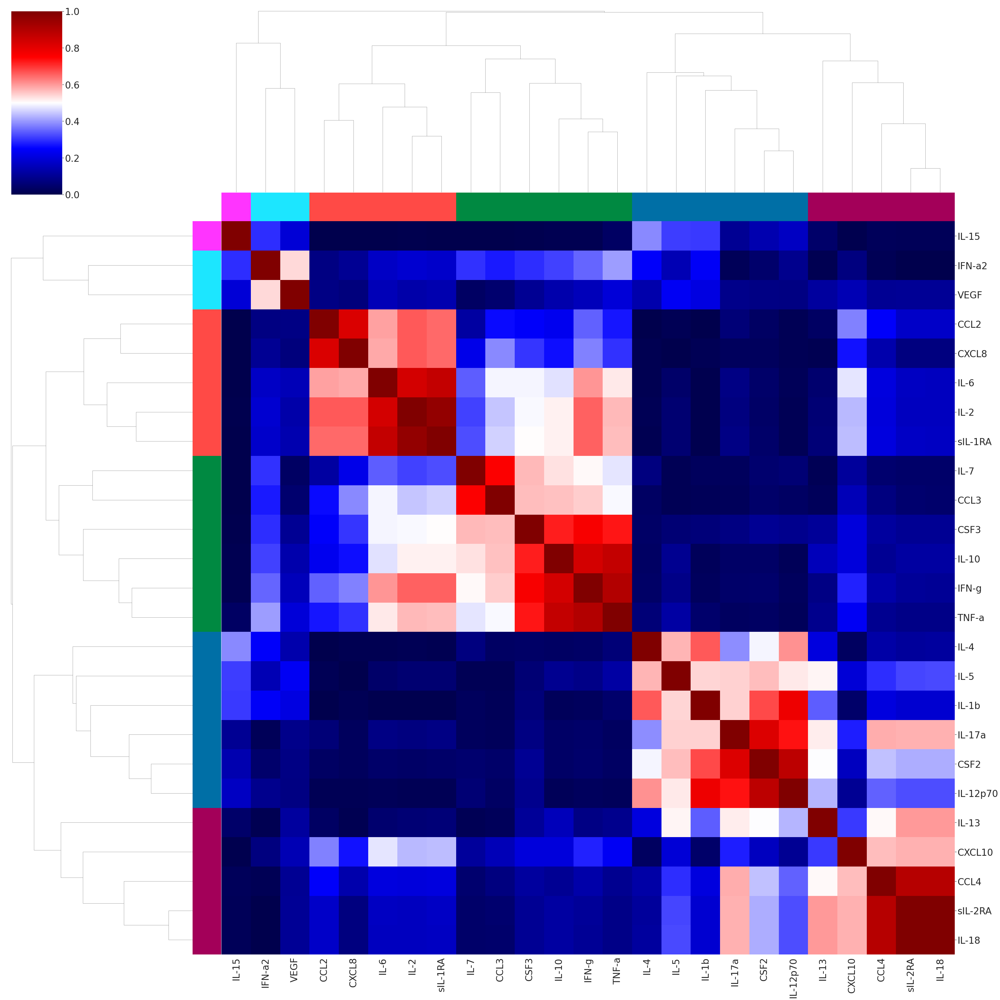

In [106]:
#bootstrap clusterngs and plot with flat clusters from original non bootstrapped df
iterations = 10000
save_path_source = figure_source_path + 'correlation_bootstrap.csv'
bootstrapped_cov_df = boot_corr_cov_matrix_cluster(cov_df, n_iters = iterations,replacement=True,metric='pearson',clustering_method = 'average', 
                                                   linkage_distance=.75)
#normalize df
bootstrapped_cov_df = bootstrapped_cov_df.applymap(lambda x: (x+1)/iterations)
tmp = sns.clustermap(bootstrapped_cov_df, row_linkage=row_linkage, 
                     col_linkage=col_linkage, col_colors = col_col, row_colors = row_col,
                    figsize=(50,50),vmax=1, center=0.5,vmin=0, cmap='seismic')
bootstrapped_cov_df.to_csv(save_path_source)

## plot cytokine programs

In [107]:
#set cytokine program
df_non_log_plot = JK210728_panel1_2_merge
df_plot = normalized_df

#does the data have to be logged for plotting in a heatmap
log_df = False



save_name = 'cytokine_program_1'

#clustering directly on correlation indices (version in revised manuscript)
cytokine_program = ['IL-6','IL-2','sIL-1RA','CXCL8','CCL2']
#cytokine_program = ['IL-7','CCL3','CSF3','TNF-a','IFN-g','IL-10']
#cytokine_program = ['IL-4','IL-5','IL-1b','IL-17a','CSF2','IL-12p70']
#cytokine_program = ['IL-13','CXCL10','CCL4','sIL-2RA','IL-18']

#weighted clustering (version in intiial manuscript)
#cytokine_program = ['IL-6','IL-2','sIL-1RA','CXCL8','CCL2']
#cytokine_program = ['IL-7','CCL3','CSF3','TNF-a','IFN-g','IL-10']
#cytokine_program = ['IL-18','sIL-2RA','CCL4','CXCL10']
#cytokine_program = ['IL-15','IL-1b','IL-4','IFN-a2','VEGF']
#cytokine_program = ['IL-13','IL-5','IL-12p70','CSF2','IL-17a']


In [108]:
#indicate sample timepoint and patient id
df_plot['timepoint'] = df_plot.index.map(time_dict)
df_plot['patient_id'] = df_plot.index.str.slice(stop=-3)

#flatten dataframe for plotting
df_plot['patient_id'] = df_plot.index.str.slice(stop=-3)
df_plot_flat = df_plot.melt(id_vars=['timepoint','patient_id'])
df_plot_flat

,timepoint,patient_id,variable,value
0,post2,LIK08H,IL-6,1.228105
1,post2,13N151,IL-6,-0.162433
2,post1,7Z9V9Q,IL-6,-0.896226
3,post2,F81VCA,IL-6,-0.356812
4,post1,BWW38Q,IL-6,1.265573
...,...,...,...,...
1020,post2,0ZTE2L,IL-12p70,-0.210475
1021,post1,S4VP85,IL-12p70,-0.420060
1022,post1,2CC0BM,IL-12p70,0.089250
1023,post2,SO7XOB,IL-12p70,-0.149669


In [109]:
#set params
sns.set(font_scale=5)
sns.set_style('white')
line_weight = 6
subplot_coordinate_list=[(0,0),(0,1),(0,2),(0,3),(0,4),(0,5),(1,0),(1,1),(1,2),(1,3),(1,4),(1,5),(2,0),(2,1),(2,2),(2,3),(2,4),(2,5),(3,0),(3,1),(3,2),(3,3),(3,4),(3,5),(4,0),(4,1),(4,2),(4,3),(4,4),(4,5),
                         (5,0),(5,1),(5,2),(5,3),(5,4),(5,5)]
fig, axs = plt.subplots(6, 6, figsize=(150,150), sharey=False)


#plot
for j,i in enumerate(set(cytokine_program)):
  df_plot_flat_subset = df_plot_flat[df_plot_flat['variable']==i]
  for k in set(df_plot_flat['patient_id']):
    axs[subplot_coordinate_list[j]].plot('timepoint', 'value', data=df_plot_flat_subset[df_plot_flat_subset['patient_id']==k],linewidth=line_weight, linestyle='-',marker='o', color=patient_color_dict[k])
  axs[subplot_coordinate_list[j]].set_title(i)
  axs[subplot_coordinate_list[j]].set_ylim(0,)
  #axs[subplot_coordinate_list[j]].set_yscale('log')
  #axs[subplot_coordinate_list[j]].set_ylim(1,)

/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/346013780.py:18: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/346013780.py:18: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',


saved to: cytokine_program_1_cytokine-program_heatmap.svg


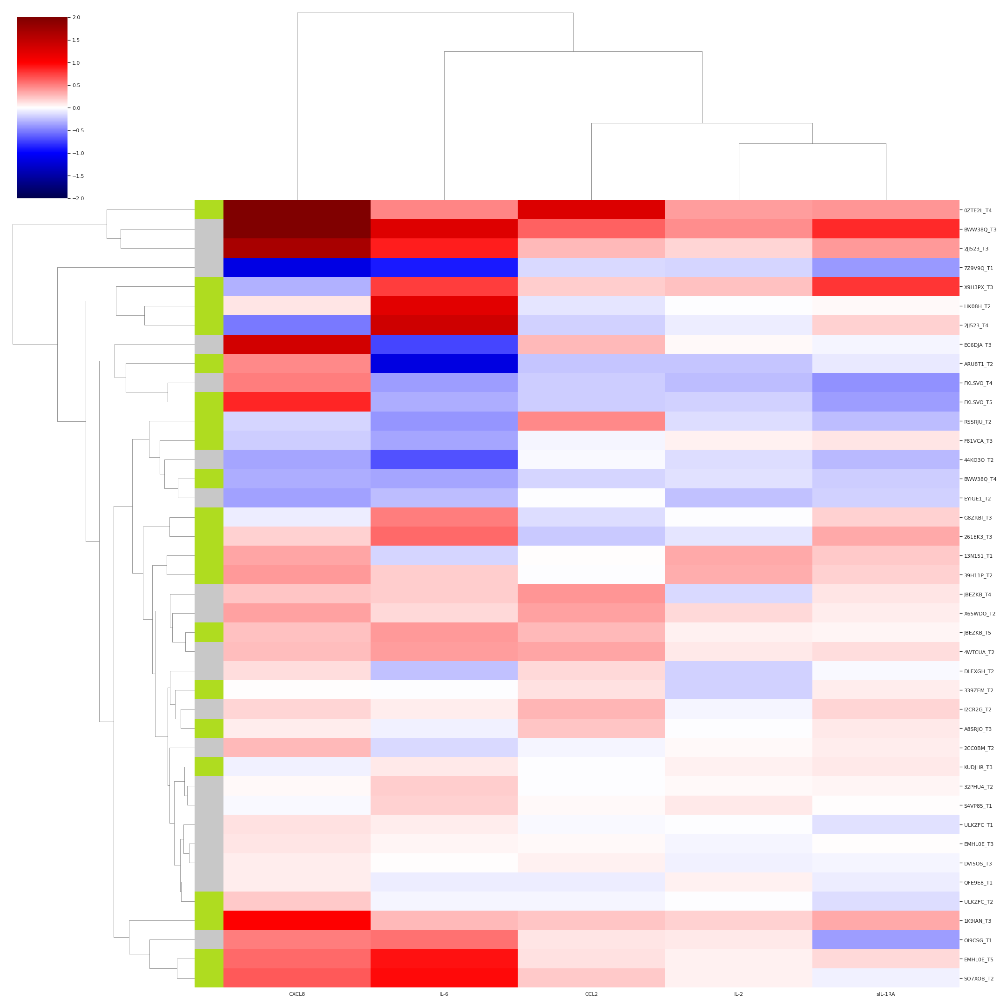

In [110]:
#log transform
source_path_final = figure_source_path + save_name +'_cytokine-program_heatmap.csv'
fig_save_path_complete = figure_save_path + save_name +'_cytokine-program_heatmap.svg'
columns_to_drop = [x for x in ['timepoint','sample_id','patient_id'] if x in df_plot.columns]
if log_df ==True:
  df_plot_log = df_plot.drop(columns=columns_to_drop).applymap(lambda x: math.log(x+1,10))
  df_plot_log_subset = df_plot_log.loc[:,cytokine_program]
else:
  df_plot_log = df_plot.drop(columns=columns_to_drop)
  df_plot_log_subset = df_plot_log.loc[:,cytokine_program]
#plot log1p transformed

sns.set(font_scale = 1) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib
glog = sns.clustermap(df_plot_log_subset, cmap='seismic', col_cluster=True,row_cluster=True, figsize=(30,30), 
                   row_colors = df_plot.index.map(time_color_dict), z_score= None, vmin=-2, center=0, vmax=2 
                   ) 

plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
df_plot_log_subset.to_csv(source_path_final)
print('saved to:',save_name +'_cytokine-program_heatmap.svg')

In [111]:
#add average score expression (=average of log fold change)
marker_df_reindex = df_plot_log_subset.copy() #to calculate on data from the heatmap (log transformed normalized)
marker_df_reindex['sample_id'] = marker_df_reindex.index
marker_df_reindex.reset_index(inplace=True)
marker_df_reindex['sum'] =  np.sum(marker_df_reindex.drop(columns=['sample_id']), axis=1) / len(cytokine_program) #zscore sum per sample normalized by length of cyokine set
marker_df_reindex['timepoint'] = marker_df_reindex['sample_id'].map(time_dict)
marker_df_reindex

/home/wallet/miniconda3/envs/2022_ANTICIPATE_COVID-19/lib/python3.8/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return reduction(axis=axis, out=out, **passkwargs)


,index,IL-6,IL-2,sIL-1RA,CXCL8,CCL2,sample_id,sum,timepoint
0,LIK08H_T2,1.228105,-0.011584,0.027583,0.102125,-0.104240,LIK08H_T2,0.248398,post2
1,13N151_T1,-0.162433,0.333605,0.207546,0.346720,0.003851,13N151_T1,0.145858,post2
2,7Z9V9Q_T1,-0.896226,-0.163848,-0.404889,-1.149611,-0.148757,7Z9V9Q_T1,-0.552666,post1
3,F81VCA_T3,-0.356812,0.054251,0.108293,-0.196358,-0.045479,F81VCA_T3,-0.087221,post2
4,BWW38Q_T3,1.265573,0.442900,0.836819,2.348488,0.614054,BWW38Q_T3,1.101567,post1
5,BWW38Q_T4,-0.347107,-0.124191,-0.191476,-0.320177,-0.168619,BWW38Q_T4,-0.230314,post2
6,DLEXGH_T2,-0.241909,-0.173723,-0.025451,0.127347,0.147809,DLEXGH_T2,-0.033185,post1
7,QFE9E8_T1,-0.074541,0.061333,-0.065735,0.070329,-0.075651,QFE9E8_T1,-0.016853,post1
8,44KQ3O_T2,-0.675390,-0.133563,-0.278265,-0.356834,-0.021524,44KQ3O_T2,-0.293115,post1
9,EC6DJA_T3,-0.723011,0.030928,-0.036277,1.355735,0.279339,EC6DJA_T3,0.181343,post1


In [112]:
##reorder dataframe according to order in seaborn clustermap
marker_df_reindex = marker_df_reindex.reindex(glog.dendrogram_row.reordered_ind)
marker_df_reindex.index = marker_df_reindex['sample_id']
marker_df_reindex = marker_df_reindex.drop(columns='sample_id')
marker_df_reindex

,index,IL-6,IL-2,sIL-1RA,CXCL8,CCL2,sum,timepoint
sample_id,,,,,,,,
0ZTE2L_T4,0ZTE2L_T4,0.479154,0.378493,0.413466,2.220757,1.269987,0.952371,post2
BWW38Q_T3,BWW38Q_T3,1.265573,0.442900,0.836819,2.348488,0.614054,1.101567,post1
2JJ523_T3,2JJ523_T3,0.884167,0.164949,0.405901,1.681123,0.268415,0.680911,post1
7Z9V9Q_T1,7Z9V9Q_T1,-0.896226,-0.163848,-0.404889,-1.149611,-0.148757,-0.552666,post1
X9H3PX_T3,X9H3PX_T3,0.762849,0.248751,0.788422,-0.311893,0.196492,0.336924,post2
LIK08H_T2,LIK08H_T2,1.228105,-0.011584,0.027583,0.102125,-0.104240,0.248398,post2
2JJ523_T4,2JJ523_T4,1.380335,-0.077271,0.174037,-0.527225,-0.182140,0.153547,post2
EC6DJA_T3,EC6DJA_T3,-0.723011,0.030928,-0.036277,1.355735,0.279339,0.181343,post1
ARU8T1_T2,ARU8T1_T2,-1.162248,-0.224521,-0.091708,0.466562,-0.228572,-0.248097,post2


/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1861752752.py:15: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1861752752.py:15: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',


saved to: cytokine_program_1_average_bars.svg


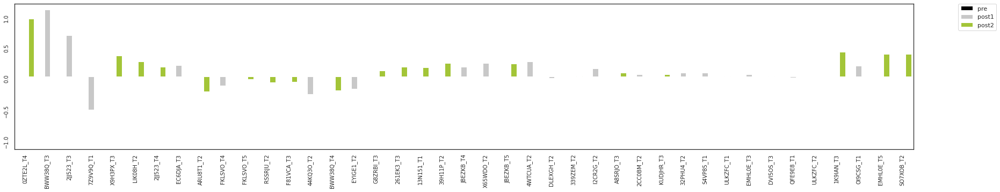

In [113]:
#plot
fig_save_path_complete = figure_save_path+save_name+'_average_bars.svg'
save_path_source = figure_source_path + save_name +'_average_bars.csv'


sns.set_style('white')
fig, axes = plt.subplots(figsize=(30,5))
axes.set_ylim([-1.2, 1.2])
axes.tick_params(labelsize=10,labelrotation=90)
sns.barplot(x=marker_df_reindex.index, y='sum', hue='timepoint', data=marker_df_reindex, order=None, hue_order=['pre','post1','post2'],palette=timepoint_color_dict)
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
axes.set_ylabel("")
axes.set_xlabel("")
marker_df_reindex.to_csv(save_path_source)
plt.savefig(fig_save_path_complete, dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
marker_df_reindex.to_csv(source_path_final)
print('saved to:',save_name+'_average_bars.svg')

In [114]:
#get all samples of top 10 patients with highest induction of cytokine programs
top_patients = marker_df_reindex['sum'].sort_values(ascending=False)[0:10].index.str.slice(stop=-3)
sample_df = JK210728_panel1_2_merge_log.copy()
sample_df['patient'] = sample_df.index.str.slice(stop=-3)
sample_df[sample_df['patient'].isin(top_patients)].sort_index().index

Index(['0ZTE2L_T3', '0ZTE2L_T4', '1K9IAN_T2', '1K9IAN_T3', '2JJ523_T2',
       '2JJ523_T3', '2JJ523_T4', '4WTCUA_T1', '4WTCUA_T2', 'BWW38Q_T2',
       'BWW38Q_T3', 'BWW38Q_T4', 'EMHL0E_T2', 'EMHL0E_T3', 'EMHL0E_T5',
       'LIK08H_T1', 'LIK08H_T2', 'SO7XOB_T1', 'SO7XOB_T2', 'X65WDO_T1',
       'X65WDO_T2', 'X9H3PX_T2', 'X9H3PX_T3'],
      dtype='object', name='sample_id')

In [115]:
#how many patients with spec. fold change
len(set(marker_df_reindex[marker_df_reindex['sum']>0.176].index.str.slice(stop=-3)))

14

In [116]:
#top samples expressing the cytokine program
patient_of_interest = 'EC6DJA'
top_patients = list(marker_df_reindex['sum'].sort_values(ascending=False).index.str.slice(stop= -3))
top_patient_list = list(dict.fromkeys(top_patients))
top_patient_list.index(patient_of_interest)+1 #get the rank of each patient (removed zero index by +1)

13

In [117]:
#retrieve average fold-change values for gene program
top_patient_subset = top_patient_list[0:20]
sample_df = marker_df_reindex.copy()
sample_df['patient'] = sample_df.index.str.slice(stop=-3)
sample_df_subset = sample_df[sample_df['patient'].isin(top_patient_subset)]
sample_df_subset

,index,IL-6,IL-2,sIL-1RA,CXCL8,CCL2,sum,timepoint,patient
sample_id,,,,,,,,,
0ZTE2L_T4,0ZTE2L_T4,0.479154,0.378493,0.413466,2.220757,1.269987,0.952371,post2,0ZTE2L
BWW38Q_T3,BWW38Q_T3,1.265573,0.442900,0.836819,2.348488,0.614054,1.101567,post1,BWW38Q
2JJ523_T3,2JJ523_T3,0.884167,0.164949,0.405901,1.681123,0.268415,0.680911,post1,2JJ523
X9H3PX_T3,X9H3PX_T3,0.762849,0.248751,0.788422,-0.311893,0.196492,0.336924,post2,X9H3PX
LIK08H_T2,LIK08H_T2,1.228105,-0.011584,0.027583,0.102125,-0.104240,0.248398,post2,LIK08H
2JJ523_T4,2JJ523_T4,1.380335,-0.077271,0.174037,-0.527225,-0.182140,0.153547,post2,2JJ523
EC6DJA_T3,EC6DJA_T3,-0.723011,0.030928,-0.036277,1.355735,0.279339,0.181343,post1,EC6DJA
BWW38Q_T4,BWW38Q_T4,-0.347107,-0.124191,-0.191476,-0.320177,-0.168619,-0.230314,post2,BWW38Q
G8ZRBI_T3,G8ZRBI_T3,0.500971,-0.010405,0.182225,-0.074015,-0.132018,0.093351,post2,G8ZRBI


In [118]:
print('Cohens d is:', np.mean(10**sample_df_subset['sum']) / np.std(10**sample_df_subset['sum']))

Cohens d is: 0.9250434063356898


In [119]:
sample_df_subset.sort_values('sum')['sum'].apply(lambda x: 10**x)

sample_id
BWW38Q_T4     0.588418
EMHL0E_T3     1.069812
32PHU4_T2     1.137450
A8SRJO_T3     1.156456
G8ZRBI_T3     1.239800
I2CR2G_T2     1.351017
13N151_T1     1.399129
2JJ523_T4     1.424122
JBEZKB_T4     1.433253
261EK3_T3     1.440793
OI9CSG_T1     1.505960
EC6DJA_T3     1.518248
JBEZKB_T5     1.603880
39H11P_T2     1.646853
X65WDO_T2     1.652257
4WTCUA_T2     1.750276
LIK08H_T2     1.771731
X9H3PX_T3     2.172321
SO7XOB_T2     2.314446
EMHL0E_T5     2.330842
1K9IAN_T3     2.549306
2JJ523_T3     4.796353
0ZTE2L_T4     8.961310
BWW38Q_T3    12.634755
Name: sum, dtype: float64

In [120]:
#all patients with above median fold change
sample_df = marker_df_reindex.copy()
sample_df['patient'] = sample_df.index.str.slice(stop=-3)
sample_df_subset = sample_df[sample_df['sum'] > 0.12]
sample_df_subset_patients = set(sample_df_subset['patient'])
sample_df_subset_patients

{'0ZTE2L',
 '13N151',
 '1K9IAN',
 '261EK3',
 '2JJ523',
 '39H11P',
 '4WTCUA',
 'BWW38Q',
 'EC6DJA',
 'EMHL0E',
 'I2CR2G',
 'JBEZKB',
 'LIK08H',
 'OI9CSG',
 'SO7XOB',
 'X65WDO',
 'X9H3PX'}

In [121]:
len(set(sample_df['patient']))

35

Text(0.5, 1.0, 'logged')

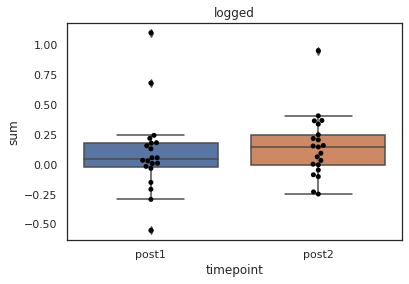

In [122]:
#plot logged
order_by = ['post1','post2']
sns.boxplot(data=marker_df_reindex,x='timepoint', y='sum', order=order_by)
sns.swarmplot(data=marker_df_reindex,x='timepoint', y='sum',color='#000000',order=order_by )
plt.title('logged')

In [123]:
marker_df_reindex.index

Index(['0ZTE2L_T4', 'BWW38Q_T3', '2JJ523_T3', '7Z9V9Q_T1', 'X9H3PX_T3',
       'LIK08H_T2', '2JJ523_T4', 'EC6DJA_T3', 'ARU8T1_T2', 'FKLSVO_T4',
       'FKLSVO_T5', 'RSSRJU_T2', 'F81VCA_T3', '44KQ3O_T2', 'BWW38Q_T4',
       'EYIGE1_T2', 'G8ZRBI_T3', '261EK3_T3', '13N151_T1', '39H11P_T2',
       'JBEZKB_T4', 'X65WDO_T2', 'JBEZKB_T5', '4WTCUA_T2', 'DLEXGH_T2',
       '339ZEM_T2', 'I2CR2G_T2', 'A8SRJO_T3', '2CC0BM_T2', 'KUDJHR_T3',
       '32PHU4_T2', 'S4VP85_T1', 'ULKZFC_T1', 'EMHL0E_T3', 'DVI5OS_T3',
       'QFE9E8_T1', 'ULKZFC_T2', '1K9IAN_T3', 'OI9CSG_T1', 'EMHL0E_T5',
       'SO7XOB_T2'],
      dtype='object', name='sample_id')

In [124]:
scipy.stats.wilcoxon(marker_df_reindex['sum']-0, zero_method='wilcox',correction=False)

WilcoxonResult(statistic=231.0, pvalue=0.009732461960708759)

In [125]:
post1_scores = np.array(marker_df_reindex[marker_df_reindex['timepoint']=='post1']['sum'])
post2_scores = np.array(marker_df_reindex[marker_df_reindex['timepoint']=='post2']['sum'])
print('one sample wilcoxon test post1 result (expected fold change is 0 = log(1)):',scipy.stats.wilcoxon(post1_scores-0, zero_method='wilcox',correction=False))
print('one sample wilcoxon test post2 result (expected fold change is 0 = log(1)):',scipy.stats.wilcoxon(post2_scores-0, zero_method='wilcox',correction=False))

one sample wilcoxon test post1 result (expected fold change is 0 = log(1)): WilcoxonResult(statistic=67.0, pvalue=0.16495704650878906)
one sample wilcoxon test post2 result (expected fold change is 0 = log(1)): WilcoxonResult(statistic=49.0, pvalue=0.01947307586669922)


In [126]:
len(set(marker_df_reindex['index'].str.slice(stop=-3)))

35

# linear regression

#part of this section adopted from Prabhat Pathak https://medium.com/analytics-vidhya/implementing-linear-regression-using-sklearn-76264a3c073c

In [127]:
#dfs
covid_platelets_2nd_dose_df_with_baseline = covid_platelets_2nd_dose_df[covid_platelets_2nd_dose_df['patient_id'].isin(baseline_patient_list)]
covid_platelets_1st_dose_df_with_baseline = covid_platelets_1st_dose_df[covid_platelets_1st_dose_df['patient_id'].isin(baseline_patient_list)]
covid_crp_1st_dose_df_with_baseline = covid_crp_1st_dose_df[covid_crp_1st_dose_df['patient_id'].isin(baseline_patient_list)]
covid_crp_2nd_dose_df_with_baseline = covid_crp_1st_dose_df[covid_crp_1st_dose_df['patient_id'].isin(baseline_patient_list)]

In [128]:
#calculate time from vaccination for samples
time_from_vacc_df = sample_table[['timepoint','time_from_first','time_from_second']]

df_timepoints = pd.DataFrame()
for i in time_from_vacc_df.index:
    time_from_vacc_df_subset = time_from_vacc_df.loc[i,:]
    if time_from_vacc_df_subset['timepoint'] == 'pre':
        df_timepoints.loc[i,'timepoint'] = float(time_from_vacc_df_subset['time_from_first'])
    elif time_from_vacc_df_subset['timepoint'] == 'post1':
        df_timepoints.loc[i,'timepoint'] = float(time_from_vacc_df_subset['time_from_first'])
    elif time_from_vacc_df_subset['timepoint'] == 'post2':
        df_timepoints.loc[i,'timepoint'] = float(time_from_vacc_df_subset['time_from_second'])
df_timepoints_dict = df_timepoints['timepoint'].to_dict()

In [129]:
#get vaccine type
df = patient_table
#df_save_path = covid_2nd_dose_leuko_path

#function to define nans

vaccine_type = {}
for i in patient_table.index: 
  a = patient_table.loc[i,'First_dose_vaccine']
  b = patient_table.loc[i,'Second_dose_vaccine']
  if isna(a):
    vaccine_type[i]='NA'
  elif isna(b):
    vaccine_type[i]=a
  elif a==b:
      vaccine_type[i]=a
  else:
    vaccine_type[i]='heterologous'

df['vaccine_type'] = df.index.map(vaccine_type)
#df.to_csv(df_save_path)
df

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,Second_dose_vaccine,date_inclusion,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,follow_up_from_second_dose_vaccine_days,color_code,Survival_01.10.21,vaccine_type
Patient_ID,,,,,,,,,,,,,,,,,,,,,
A8SRJO,M,59.0,NaN,2.0,0.0,SKCM,IV,PD-1/PD-L1,1.0,True,...,Astra Zeneca,9/30/2020,10/1/2021,10/1/2021,366.0,204.0,129.00,#997D87,0.0,Astra Zeneca
L9YLRD,M,68.0,20.2,1.0,1.0,OSCC,III,PD-1/PD-L1,1.0,True,...,Astra Zeneca,12/4/2020,10/1/2021,10/1/2021,301.0,166.0,82.00,#61615A,0.0,Astra Zeneca
74WACU,F,61.0,22.6,1.0,0.0,AEG,IV,PD-1/PD-L1,1.0,True,...,Astra Zeneca,3/18/2021,10/1/2021,10/1/2021,197.0,205.0,144.00,#788D66,0.0,Astra Zeneca
SSW9Q1,F,68.0,25.3,1.0,0.0,UVM,IV,PD-1/PD-L1,3.0,True,...,Astra Zeneca,4/7/2021,5/5/2021,10/1/2021,177.0,166.0,82.00,#886F4C,0.0,Astra Zeneca
7Z9V9Q,M,76.0,24.3,1.0,0.0,"LUAD, ESCA",IV,PD-1/PD-L1,2.0,True,...,Astra Zeneca,4/16/2021,6/11/2021,6/17/2021,62.0,50.0,8.00,#B4A8BD,1.0,Astra Zeneca
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C1ABPH,M,69.0,18.7,2.0,0.0,"NSCLC, HNSC",II,PD-1/PD-L1+CTX,2.0,False,...,NaN,9/25/2020,1/28/2021,10/1/2021,371.0,NaN,#VALUE!,#F1FE76,0.0,NA
2DP8J8,M,58.0,29.4,0.0,0.0,AEG,II,PD-1/PD-L1+CTX,1.0,False,...,NaN,2/8/2021,8/24/2021,9/26/2021,230.0,NaN,#VALUE!,#CFB70A,1.0,NA
KQQNSB,M,60.0,30.9,0.0,0.0,KIRC,III,PD-1/PD-L1+TKI,1.0,False,...,NaN,10/2/2020,8/10/2021,10/1/2021,364.0,NaN,#VALUE!,#BC41A1,0.0,NA


In [130]:
#calculate vacc timepoint from inclusion
patient_table['First_dose_date'] = pd.to_datetime(patient_table['First_dose_date'],format="%m/%d/%Y")
patient_table['Second_dose_date'] = pd.to_datetime(patient_table['Second_dose_date'],format="%m/%d/%Y")
patient_table['date_inclusion'] = pd.to_datetime(patient_table['date_inclusion'],format="%m/%d/%Y")



In [131]:
#date of inclusion
df = patient_table
df['time_from_ICT'] = patient_table['First_dose_date'] - patient_table['date_inclusion'] 
df['time_from_ICT'] = df['time_from_ICT'].dt.days

In [132]:
patient_table

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,date_inclusion,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,follow_up_from_second_dose_vaccine_days,color_code,Survival_01.10.21,vaccine_type,time_from_ICT
Patient_ID,,,,,,,,,,,,,,,,,,,,,
A8SRJO,M,59.0,NaN,2.0,0.0,SKCM,IV,PD-1/PD-L1,1.0,True,...,2020-09-30,10/1/2021,10/1/2021,366.0,204.0,129.00,#997D87,0.0,Astra Zeneca,162.0
L9YLRD,M,68.0,20.2,1.0,1.0,OSCC,III,PD-1/PD-L1,1.0,True,...,2020-12-04,10/1/2021,10/1/2021,301.0,166.0,82.00,#61615A,0.0,Astra Zeneca,135.0
74WACU,F,61.0,22.6,1.0,0.0,AEG,IV,PD-1/PD-L1,1.0,True,...,2021-03-18,10/1/2021,10/1/2021,197.0,205.0,144.00,#788D66,0.0,Astra Zeneca,-8.0
SSW9Q1,F,68.0,25.3,1.0,0.0,UVM,IV,PD-1/PD-L1,3.0,True,...,2021-04-07,5/5/2021,10/1/2021,177.0,166.0,82.00,#886F4C,0.0,Astra Zeneca,11.0
7Z9V9Q,M,76.0,24.3,1.0,0.0,"LUAD, ESCA",IV,PD-1/PD-L1,2.0,True,...,2021-04-16,6/11/2021,6/17/2021,62.0,50.0,8.00,#B4A8BD,1.0,Astra Zeneca,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C1ABPH,M,69.0,18.7,2.0,0.0,"NSCLC, HNSC",II,PD-1/PD-L1+CTX,2.0,False,...,2020-09-25,1/28/2021,10/1/2021,371.0,NaN,#VALUE!,#F1FE76,0.0,NA,NaN
2DP8J8,M,58.0,29.4,0.0,0.0,AEG,II,PD-1/PD-L1+CTX,1.0,False,...,2021-02-08,8/24/2021,9/26/2021,230.0,NaN,#VALUE!,#CFB70A,1.0,NA,NaN
KQQNSB,M,60.0,30.9,0.0,0.0,KIRC,III,PD-1/PD-L1+TKI,1.0,False,...,2020-10-02,8/10/2021,10/1/2021,364.0,NaN,#VALUE!,#BC41A1,0.0,NA,NaN


In [133]:
#clinical vars
ins_dict = (patient_table['private_insurance']).to_dict()
tumor_dict = (patient_table['Tumor_type']=='LIHC').to_dict()
Stage_dict = (patient_table['Stage']=='IV').to_dict()
Sex_dict =  (patient_table['Sex']=='F').to_dict()
Age_dict =  (patient_table['Age_at_inclusion']).to_dict()
#BMI_dict = (patient_table['BMI']).to_dict() #BMI contains too many nan
ECOG_dict = (patient_table['ECOG']>=1).to_dict() 
ther_type_dict = (patient_table['Therapy_type']=='PD-1/PD-L1').to_dict() 
#Line_dict = (patient_table['Therapy_Line']==1).to_dict()
vaccine_type_dict = (df['vaccine_type']=='Comirnaty').to_dict()
days_from_ICT_dict = df['time_from_ICT'].to_dict()

In [134]:
X = marker_df_reindex[['sum']]
X['is_post1'] = (marker_df_reindex['timepoint']=='post1').astype(int)
X['is_LIHC'] = (X.index.str.slice(stop=-3).map(tumor_dict)).astype(int)
X['is_StageIV'] = (X.index.str.slice(stop=-3).map(Stage_dict)).astype(int)
X['is_female'] = (X.index.str.slice(stop=-3).map(Sex_dict)).astype(int)
X['Age'] = X.index.str.slice(stop=-3).map(Age_dict)
#X['BMI'] = X.index.str.slice(stop=-3).map(BMI_dict)
X['is_ECOG01'] = (X.index.str.slice(stop=-3).map(ECOG_dict)).astype(int)
#X['is_first-line'] = (X.index.str.slice(stop=-3).map(Line_dict)).astype(int)
X['therapy_type'] =  (X.index.str.slice(stop=-3).map(ther_type_dict)).astype(int)
X['is_Comirnaty'] = (X.index.str.slice(stop=-3).map(vaccine_type_dict)).astype(int)
X['days_from_ICT'] = (X.index.str.slice(stop=-3).map(days_from_ICT_dict)).astype(int)
X['is_private_ins'] = (X.index.str.slice(stop=-3).map(ins_dict)).astype(int)
X['time_from_vacc'] =X.index.map(df_timepoints_dict)
del X['sum']

/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1809527899.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['is_post1'] = (marker_df_reindex['timepoint']=='post1').astype(int)
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1809527899.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['is_LIHC'] = (X.index.str.slice(stop=-3).map(tumor_dict)).astype(int)
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1809527899.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Da

In [135]:
X

,is_post1,is_LIHC,is_StageIV,is_female,Age,is_ECOG01,therapy_type,is_Comirnaty,days_from_ICT,is_private_ins,time_from_vacc
sample_id,,,,,,,,,,,
0ZTE2L_T4,0,0,1,0,56.0,1,0,1,174,0,8.0
BWW38Q_T3,1,0,1,0,72.0,1,0,1,140,0,24.0
2JJ523_T3,1,1,0,0,60.0,1,0,1,204,0,36.0
7Z9V9Q_T1,1,0,1,0,76.0,1,1,0,12,0,2.0
X9H3PX_T3,0,0,0,0,65.0,1,0,1,188,0,25.0
LIK08H_T2,0,0,1,0,81.0,1,0,1,43,0,12.0
2JJ523_T4,0,1,0,0,60.0,1,0,1,204,0,13.0
EC6DJA_T3,1,0,1,0,64.0,1,0,1,138,0,42.0
ARU8T1_T2,0,0,1,0,60.0,1,0,1,77,0,1.0


In [136]:
#obtain max crp  after 1st and 2nd vaccination and assign to cytokine concentrations
lab_list = []
for i in X.index:
    if X.loc['0ZTE2L_T4','is_post1'] == 1:
        if i[:-3] in list(set(covid_crp_1st_dose_df_with_baseline['patient_id'])):
            patient_lab_df = covid_crp_1st_dose_df_with_baseline[covid_crp_1st_dose_df_with_baseline['patient_id']==i[:-3]]
            lab_val = max(patient_lab_df[patient_lab_df['timepoint']!=0]['Value'])
            #remove baseline sample
        else:
            print('did not find patient',i[:-3])
    elif X.loc['0ZTE2L_T4','is_post1'] == 0:
        if i[:-3] in list(set(covid_crp_2nd_dose_df_with_baseline['patient_id'])):
            patient_lab_df = covid_crp_2nd_dose_df_with_baseline[covid_crp_2nd_dose_df_with_baseline['patient_id']==i[:-3]]
            lab_val = max(patient_lab_df[patient_lab_df['timepoint']!=0]['Value']) #remove baseline sample
        else:
            print('did not find patient',i[:-3])
    else:
        print('<is_post1 is not boolean or nan>')
    lab_list.append(lab_val)

X['crp'] = lab_list

did not find patient S4VP85


In [137]:
X

,is_post1,is_LIHC,is_StageIV,is_female,Age,is_ECOG01,therapy_type,is_Comirnaty,days_from_ICT,is_private_ins,time_from_vacc,crp
sample_id,,,,,,,,,,,,
0ZTE2L_T4,0,0,1,0,56.0,1,0,1,174,0,8.0,12.0
BWW38Q_T3,1,0,1,0,72.0,1,0,1,140,0,24.0,4.4
2JJ523_T3,1,1,0,0,60.0,1,0,1,204,0,36.0,4.2
7Z9V9Q_T1,1,0,1,0,76.0,1,1,0,12,0,2.0,120.5
X9H3PX_T3,0,0,0,0,65.0,1,0,1,188,0,25.0,31.2
LIK08H_T2,0,0,1,0,81.0,1,0,1,43,0,12.0,79.2
2JJ523_T4,0,1,0,0,60.0,1,0,1,204,0,13.0,4.2
EC6DJA_T3,1,0,1,0,64.0,1,0,1,138,0,42.0,74.9
ARU8T1_T2,0,0,1,0,60.0,1,0,1,77,0,1.0,16.6


In [138]:
#obtain min platelets  after 1st and 2nd vaccination and assign to cytokine concentrations
lab_list = []
for i in X.index:
    if X.loc[i,'is_post1'] == 1:
        if i[:-3] in list(set(covid_platelets_1st_dose_df_with_baseline['patient_id'])):
            patient_lab_df = covid_platelets_1st_dose_df_with_baseline[covid_platelets_1st_dose_df_with_baseline['patient_id']==i[:-3]]
            lab_val = min(patient_lab_df[patient_lab_df['timepoint']!=0]['Value'])
            #remove baseline sample
        else:
            print('did not find patient',i[:-3])
    elif X.loc[i,'is_post1'] == 0:
        if i[:-3] in list(set(covid_platelets_2nd_dose_df_with_baseline['patient_id'])):
            patient_lab_df = covid_platelets_2nd_dose_df_with_baseline[covid_platelets_2nd_dose_df_with_baseline['patient_id']==i[:-3]]
            lab_val = min(patient_lab_df[patient_lab_df['timepoint']!=0]['Value']) #remove baseline sample
        else:
            print('did not find patient',i[:-3])
    else:
        print('<is_post1 is not boolean or nan>')
    lab_list.append(lab_val)

X['platelets'] = lab_list

did not find patient 261EK3


In [139]:
covid_platelets_2nd_dose_df_with_baseline

,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,patient_id,vaccine_type,timepoint,Value
2,2,2,2,2,2,FKLSVO,Comirnaty,0,290
4,4,4,4,4,4,KUDJHR,Comirnaty,0,226
5,5,5,5,5,5,F81VCA,Comirnaty,0,165
6,6,6,6,6,6,39H11P,Comirnaty,0,216
7,7,7,7,7,7,2JJ523,Comirnaty,0,132
...,...,...,...,...,...,...,...,...,...
148,155,160,160,160,160,EC6DJA,Comirnaty,11,5
149,156,161,161,161,161,EC6DJA,Comirnaty,4,106
150,157,162,162,162,162,EC6DJA,Comirnaty,12,40
151,158,163,163,163,163,EC6DJA,Comirnaty,19,86


In [140]:
X

,is_post1,is_LIHC,is_StageIV,is_female,Age,is_ECOG01,therapy_type,is_Comirnaty,days_from_ICT,is_private_ins,time_from_vacc,crp,platelets
sample_id,,,,,,,,,,,,,
0ZTE2L_T4,0,0,1,0,56.0,1,0,1,174,0,8.0,12.0,116
BWW38Q_T3,1,0,1,0,72.0,1,0,1,140,0,24.0,4.4,285
2JJ523_T3,1,1,0,0,60.0,1,0,1,204,0,36.0,4.2,132
7Z9V9Q_T1,1,0,1,0,76.0,1,1,0,12,0,2.0,120.5,199
X9H3PX_T3,0,0,0,0,65.0,1,0,1,188,0,25.0,31.2,235
LIK08H_T2,0,0,1,0,81.0,1,0,1,43,0,12.0,79.2,338
2JJ523_T4,0,1,0,0,60.0,1,0,1,204,0,13.0,4.2,212
EC6DJA_T3,1,0,1,0,64.0,1,0,1,138,0,42.0,74.9,130
ARU8T1_T2,0,0,1,0,60.0,1,0,1,77,0,1.0,16.6,149


In [141]:
#create data
Y = marker_df_reindex['sum']
Y

sample_id
0ZTE2L_T4    0.952371
BWW38Q_T3    1.101567
2JJ523_T3    0.680911
7Z9V9Q_T1   -0.552666
X9H3PX_T3    0.336924
LIK08H_T2    0.248398
2JJ523_T4    0.153547
EC6DJA_T3    0.181343
ARU8T1_T2   -0.248097
FKLSVO_T4   -0.151099
FKLSVO_T5   -0.047319
RSSRJU_T2   -0.102185
F81VCA_T3   -0.087221
44KQ3O_T2   -0.293115
BWW38Q_T4   -0.230314
EYIGE1_T2   -0.208332
G8ZRBI_T3    0.093351
261EK3_T3    0.158602
13N151_T1    0.145858
39H11P_T2    0.216655
JBEZKB_T4    0.156323
X65WDO_T2    0.218078
JBEZKB_T5    0.205172
4WTCUA_T2    0.243106
DLEXGH_T2   -0.033185
339ZEM_T2    0.001655
I2CR2G_T2    0.130661
A8SRJO_T3    0.063129
2CC0BM_T2    0.034169
KUDJHR_T3    0.032817
32PHU4_T2    0.055932
S4VP85_T1    0.055492
ULKZFC_T1    0.009961
EMHL0E_T3    0.029307
DVI5OS_T3    0.007143
QFE9E8_T1   -0.016853
ULKZFC_T2   -0.003685
1K9IAN_T3    0.406422
OI9CSG_T1    0.177814
EMHL0E_T5    0.367513
SO7XOB_T2    0.364447
Name: sum, dtype: float64

In [142]:
#here we don't split the data
from sklearn.model_selection import train_test_split
#X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.4, random_state=101)
X_train = X
y_train = Y
X_test = X
y_test = Y
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(41, 13)
(41, 13)
(41,)
(41,)


In [143]:
X_train

,is_post1,is_LIHC,is_StageIV,is_female,Age,is_ECOG01,therapy_type,is_Comirnaty,days_from_ICT,is_private_ins,time_from_vacc,crp,platelets
sample_id,,,,,,,,,,,,,
0ZTE2L_T4,0,0,1,0,56.0,1,0,1,174,0,8.0,12.0,116
BWW38Q_T3,1,0,1,0,72.0,1,0,1,140,0,24.0,4.4,285
2JJ523_T3,1,1,0,0,60.0,1,0,1,204,0,36.0,4.2,132
7Z9V9Q_T1,1,0,1,0,76.0,1,1,0,12,0,2.0,120.5,199
X9H3PX_T3,0,0,0,0,65.0,1,0,1,188,0,25.0,31.2,235
LIK08H_T2,0,0,1,0,81.0,1,0,1,43,0,12.0,79.2,338
2JJ523_T4,0,1,0,0,60.0,1,0,1,204,0,13.0,4.2,212
EC6DJA_T3,1,0,1,0,64.0,1,0,1,138,0,42.0,74.9,130
ARU8T1_T2,0,0,1,0,60.0,1,0,1,77,0,1.0,16.6,149


In [144]:
import statsmodels.api as sm
import numpy as np
np.random.seed(1)
X = sm.add_constant(np.arange(100))
y = np.dot(X, [1,2]) + np.random.normal(size=100)
result = sm.OLS(y, X).fit()
print(result.params)

[0.89516052 2.00334187]


In [145]:
y_train

sample_id
0ZTE2L_T4    0.952371
BWW38Q_T3    1.101567
2JJ523_T3    0.680911
7Z9V9Q_T1   -0.552666
X9H3PX_T3    0.336924
LIK08H_T2    0.248398
2JJ523_T4    0.153547
EC6DJA_T3    0.181343
ARU8T1_T2   -0.248097
FKLSVO_T4   -0.151099
FKLSVO_T5   -0.047319
RSSRJU_T2   -0.102185
F81VCA_T3   -0.087221
44KQ3O_T2   -0.293115
BWW38Q_T4   -0.230314
EYIGE1_T2   -0.208332
G8ZRBI_T3    0.093351
261EK3_T3    0.158602
13N151_T1    0.145858
39H11P_T2    0.216655
JBEZKB_T4    0.156323
X65WDO_T2    0.218078
JBEZKB_T5    0.205172
4WTCUA_T2    0.243106
DLEXGH_T2   -0.033185
339ZEM_T2    0.001655
I2CR2G_T2    0.130661
A8SRJO_T3    0.063129
2CC0BM_T2    0.034169
KUDJHR_T3    0.032817
32PHU4_T2    0.055932
S4VP85_T1    0.055492
ULKZFC_T1    0.009961
EMHL0E_T3    0.029307
DVI5OS_T3    0.007143
QFE9E8_T1   -0.016853
ULKZFC_T2   -0.003685
1K9IAN_T3    0.406422
OI9CSG_T1    0.177814
EMHL0E_T5    0.367513
SO7XOB_T2    0.364447
Name: sum, dtype: float64

In [146]:
#univariate analysis
import statsmodels.api as sm
p_list = []
r2_list = []
var_list = []
inter_list = []
coef_list = []
for i in X_train.columns:
    X_train_Sm= sm.add_constant(X_train[[i]])
    ls=sm.OLS(y_train,X_train_Sm).fit()
    p_list.append(ls.pvalues[1])
    inter_list.append(ls.params[0])
    coef_list.append(ls.params[1])
    var_list.append(i)
    r2_list.append(ls.rsquared)
p_val_univar = pd.Series(p_list, index=var_list)
rsquared_univar = pd.Series(r2_list, index=var_list)
inter_univar = pd.Series(inter_list, index=var_list)
coef_univar = pd.Series(coef_list, index=var_list)

df_univar = pd.concat([p_val_univar,rsquared_univar,inter_univar,coef_univar],axis=1)
df_univar.columns = ['pval','rsquared','intercept','coef']
df_univar_sorted = df_univar.sort_values('rsquared',ascending=False)
df_univar_sorted

,pval,rsquared,intercept,coef
therapy_type,0.026290,0.120323,0.188493,-0.221049
is_LIHC,0.165793,0.048655,0.091323,0.185062
platelets,0.220569,0.038224,0.287819,-0.000721
is_Comirnaty,0.240724,0.035114,-0.004059,0.147677
days_from_ICT,0.242581,0.034843,0.037533,0.000664
is_female,0.291162,0.028523,0.148731,-0.113033
is_StageIV,0.307151,0.026721,0.170566,-0.097209
is_private_ins,0.309492,0.026467,0.140295,-0.128213
is_ECOG01,0.415193,0.017094,0.045298,0.093668
Age,0.499210,0.011789,0.324420,-0.003191


In [147]:
df_univar_sorted.index

Index(['therapy_type', 'is_LIHC', 'platelets', 'is_Comirnaty', 'days_from_ICT',
       'is_female', 'is_StageIV', 'is_private_ins', 'is_ECOG01', 'Age',
       'time_from_vacc', 'crp', 'is_post1'],
      dtype='object')

In [148]:
df_univar_sorted
df_univar_sorted.to_csv

<bound method NDFrame.to_csv of                     pval  rsquared  intercept      coef
therapy_type    0.026290  0.120323   0.188493 -0.221049
is_LIHC         0.165793  0.048655   0.091323  0.185062
platelets       0.220569  0.038224   0.287819 -0.000721
is_Comirnaty    0.240724  0.035114  -0.004059  0.147677
days_from_ICT   0.242581  0.034843   0.037533  0.000664
is_female       0.291162  0.028523   0.148731 -0.113033
is_StageIV      0.307151  0.026721   0.170566 -0.097209
is_private_ins  0.309492  0.026467   0.140295 -0.128213
is_ECOG01       0.415193  0.017094   0.045298  0.093668
Age             0.499210  0.011789   0.324420 -0.003191
time_from_vacc  0.520431  0.010670   0.071428  0.002808
crp             0.531488  0.010118   0.137412 -0.000829
is_post1        0.579552  0.007941   0.144192 -0.052865>

cytokine_linear_reg_y_source_data.csv
cytokine_linear_reg_X_source_data.csv
cytokine_linear_reg_regression_source_data.csv


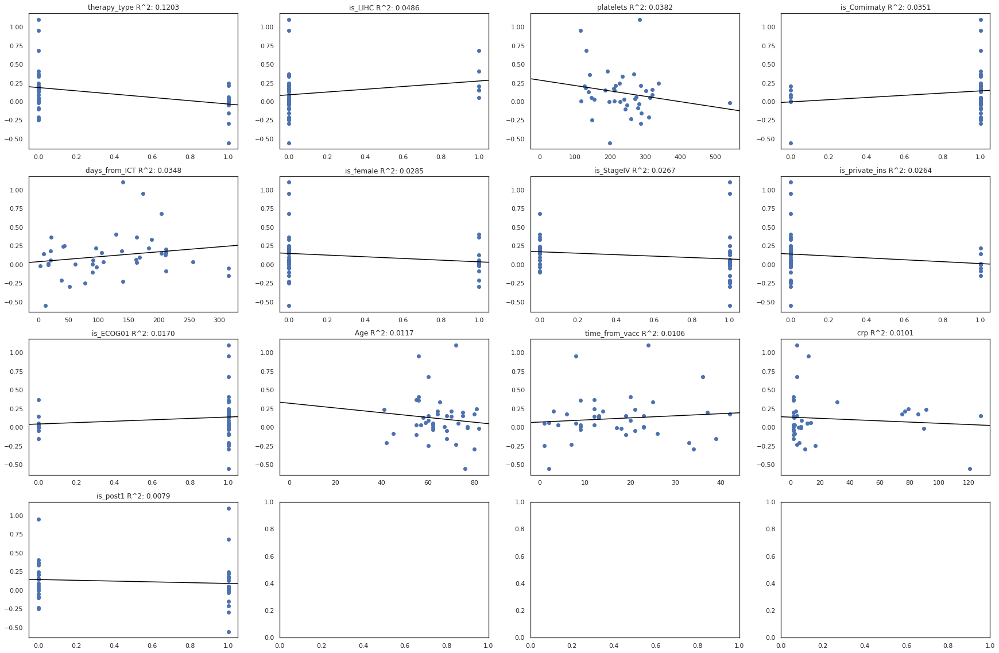

In [149]:
#plot
save_name='cytokine_linear_reg.svg'

#save source data
X_train.to_csv(figure_source_path + save_name[:-4] + '_y'+'_source_data.csv')
print(save_name[:-4] + '_y'+'_source_data.csv')
y_train.to_csv(figure_source_path + save_name[:-4] + '_X'+'_source_data.csv')
print(save_name[:-4] + '_X'+'_source_data.csv')
df_univar_sorted.to_csv(figure_source_path + save_name[:-4] + '_regression'+'_source_data.csv')
print(save_name[:-4] + '_regression'+'_source_data.csv')

fig, ax = plt.subplots(nrows=4,ncols=4,figsize=(30,20))
for i,v in enumerate(df_univar_sorted.index):
    df_reg_subset = df_univar_sorted.loc[v,:]
    ax.reshape(-1)[i].scatter(X_train[v],y_train)
    ax.reshape(-1)[i].axline((0, df_reg_subset['intercept']), slope=df_reg_subset['coef'], color='#000000', label=v)
    ax.reshape(-1)[i].title.set_text(v+ ' R^2: '+ str(df_reg_subset['rsquared'])[0:6])
plt.savefig(figure_save_path+save_name)

/home/wallet/miniconda3/envs/2022_ANTICIPATE_COVID-19/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/wallet/miniconda3/envs/2022_ANTICIPATE_COVID-19/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/wallet/miniconda3/envs/2022_ANTICIPATE_COVID-19/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other argume

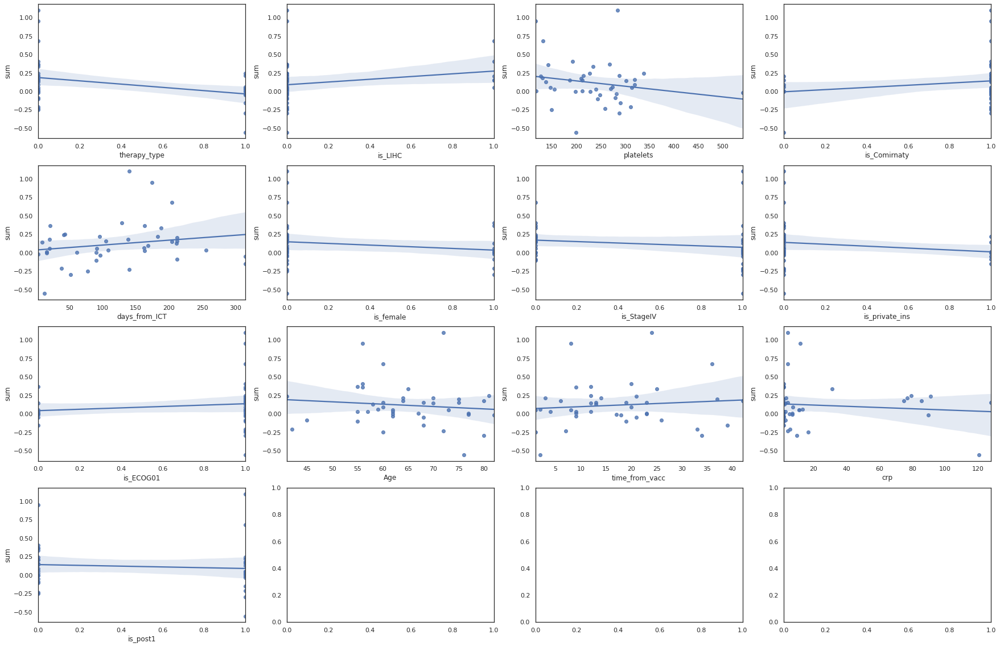

In [150]:
#plot
save_name='cytokine_linear_reg.svg'

fig, ax = plt.subplots(nrows=4,ncols=4,figsize=(30,20))
for i,v in enumerate(df_univar_sorted.index):
    df_reg_subset = df_univar_sorted.loc[v,:]
    sns.regplot(X_train[v],y_train,ax=ax.reshape(-1)[i])
#plt.savefig(figure_save_path+save_name)

## multivariate analysis

In [151]:
df_univar_sorted.index

Index(['therapy_type', 'is_LIHC', 'platelets', 'is_Comirnaty', 'days_from_ICT',
       'is_female', 'is_StageIV', 'is_private_ins', 'is_ECOG01', 'Age',
       'time_from_vacc', 'crp', 'is_post1'],
      dtype='object')

In [152]:
test_again_vector_of_ones = False

In [153]:
#set vars
#vars_for_multi = ['therapy_type', 'is_LIHC', 'is_Comirnaty', 'days_from_ICT', 'is_female',
  #     'platelets', 'is_StageIV', 'is_private_ins', 'is_ECOG01', 'Age',
   #    'time_from_vacc', 'is_post1', 'crp']
vars_for_multi = ['therapy_type', 'is_LIHC', 'is_Comirnaty' ,'days_from_ICT']# 'is_female',
  #     'platelets', 'is_StageIV', 'is_private_ins', 'is_ECOG01', 'Age',
   #    'time_from_vacc', 'is_post1', 'crp']
X_train_subset = X_train[vars_for_multi]

In [154]:
if test_again_vector_of_ones:
    y_train_subset = y_train.apply(lambda x:1)
else:
    y_train_subset = y_train

In [155]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train_subset,y_train_subset)

LinearRegression()

In [156]:
print(model.intercept_)

-0.0417953209579415


In [157]:
coeff_parameter = pd.DataFrame(model.coef_, X_train_subset.columns, columns=['Coefficient'])
coeff_parameter

,Coefficient
therapy_type,-0.212799
is_LIHC,0.099117
is_Comirnaty,0.166604
days_from_ICT,0.000616


In [158]:
predictions = model.predict(X_train_subset)
predictions

array([ 0.23198098,  0.2110392 ,  0.34957591, -0.24720285,  0.24060407,
        0.15129355,  0.34957591,  0.20980733,  0.17223532,  0.10602901,
        0.10602901,  0.18024247,  0.2553865 , -0.05596179,  0.2110392 ,
        0.14821387,  0.06168169,  0.18948149,  0.13035177,  0.02472564,
        0.18789971,  0.18332215,  0.18789971, -0.06273707, -0.02886067,
       -0.03255628,  0.25477056, -0.15481266, -0.02146945,  0.06968887,
        0.2799753 , -0.0756717 , -0.03194037,  0.2252057 , -0.05041838,
        0.12665616, -0.03194037,  0.30338082,  0.13712705,  0.2252057 ,
        0.13774298])

In [159]:
y_test

sample_id
0ZTE2L_T4    0.952371
BWW38Q_T3    1.101567
2JJ523_T3    0.680911
7Z9V9Q_T1   -0.552666
X9H3PX_T3    0.336924
LIK08H_T2    0.248398
2JJ523_T4    0.153547
EC6DJA_T3    0.181343
ARU8T1_T2   -0.248097
FKLSVO_T4   -0.151099
FKLSVO_T5   -0.047319
RSSRJU_T2   -0.102185
F81VCA_T3   -0.087221
44KQ3O_T2   -0.293115
BWW38Q_T4   -0.230314
EYIGE1_T2   -0.208332
G8ZRBI_T3    0.093351
261EK3_T3    0.158602
13N151_T1    0.145858
39H11P_T2    0.216655
JBEZKB_T4    0.156323
X65WDO_T2    0.218078
JBEZKB_T5    0.205172
4WTCUA_T2    0.243106
DLEXGH_T2   -0.033185
339ZEM_T2    0.001655
I2CR2G_T2    0.130661
A8SRJO_T3    0.063129
2CC0BM_T2    0.034169
KUDJHR_T3    0.032817
32PHU4_T2    0.055932
S4VP85_T1    0.055492
ULKZFC_T1    0.009961
EMHL0E_T3    0.029307
DVI5OS_T3    0.007143
QFE9E8_T1   -0.016853
ULKZFC_T2   -0.003685
1K9IAN_T3    0.406422
OI9CSG_T1    0.177814
EMHL0E_T5    0.367513
SO7XOB_T2    0.364447
Name: sum, dtype: float64

multivariate_reg_y_source_data.csv
multivariate_reg_predictions_source_data.csv


/home/wallet/miniconda3/envs/2022_ANTICIPATE_COVID-19/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


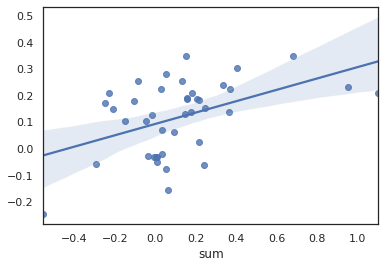

In [160]:
save_name = 'multivariate_reg.svg'
y_test.to_csv(figure_source_path + save_name[:-4] + '_y'+'_source_data.csv')
print(save_name[:-4] + '_y'+'_source_data.csv')
pd.DataFrame(predictions).to_csv(figure_source_path + save_name[:-4] + '_predictions'+'_source_data.csv')
print(save_name[:-4] + '_predictions'+'_source_data.csv')
sns.regplot(y_test, predictions)
plt.savefig(figure_save_path+save_name)

In [161]:
y_train_subset

sample_id
0ZTE2L_T4    0.952371
BWW38Q_T3    1.101567
2JJ523_T3    0.680911
7Z9V9Q_T1   -0.552666
X9H3PX_T3    0.336924
LIK08H_T2    0.248398
2JJ523_T4    0.153547
EC6DJA_T3    0.181343
ARU8T1_T2   -0.248097
FKLSVO_T4   -0.151099
FKLSVO_T5   -0.047319
RSSRJU_T2   -0.102185
F81VCA_T3   -0.087221
44KQ3O_T2   -0.293115
BWW38Q_T4   -0.230314
EYIGE1_T2   -0.208332
G8ZRBI_T3    0.093351
261EK3_T3    0.158602
13N151_T1    0.145858
39H11P_T2    0.216655
JBEZKB_T4    0.156323
X65WDO_T2    0.218078
JBEZKB_T5    0.205172
4WTCUA_T2    0.243106
DLEXGH_T2   -0.033185
339ZEM_T2    0.001655
I2CR2G_T2    0.130661
A8SRJO_T3    0.063129
2CC0BM_T2    0.034169
KUDJHR_T3    0.032817
32PHU4_T2    0.055932
S4VP85_T1    0.055492
ULKZFC_T1    0.009961
EMHL0E_T3    0.029307
DVI5OS_T3    0.007143
QFE9E8_T1   -0.016853
ULKZFC_T2   -0.003685
1K9IAN_T3    0.406422
OI9CSG_T1    0.177814
EMHL0E_T5    0.367513
SO7XOB_T2    0.364447
Name: sum, dtype: float64

In [162]:
import statsmodels.api as sm
if test_again_vector_of_ones:
    X_train_subset_Sm = X_train_subset
else:
    X_train_subset_Sm= sm.add_constant(X_train_subset)
ls=sm.OLS(y_train_subset,X_train_subset_Sm).fit()
print(ls.summary())

                            OLS Regression Results                            
Dep. Variable:                    sum   R-squared:                       0.214
Model:                            OLS   Adj. R-squared:                  0.126
Method:                 Least Squares   F-statistic:                     2.448
Date:                Thu, 17 Mar 2022   Prob (F-statistic):             0.0638
Time:                        22:06:52   Log-Likelihood:                -3.4060
No. Observations:                  41   AIC:                             16.81
Df Residuals:                      36   BIC:                             25.38
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0418      0.127     -0.329

## calculate variance inflation factor

#from statsmodels documentation:
One recommendation is that if VIF is greater than 5, then the explanatory variable given by exog_idx is highly collinear with the other explanatory variables, and the parameter estimates will have large standard errors because of this.

In [163]:
X_train_subset

,therapy_type,is_LIHC,is_Comirnaty,days_from_ICT
sample_id,,,,
0ZTE2L_T4,0,0,1,174
BWW38Q_T3,0,0,1,140
2JJ523_T3,0,1,1,204
7Z9V9Q_T1,1,0,0,12
X9H3PX_T3,0,0,1,188
LIK08H_T2,0,0,1,43
2JJ523_T4,0,1,1,204
EC6DJA_T3,0,0,1,138
ARU8T1_T2,0,0,1,77


In [164]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant


X = add_constant(X_train_subset)
pd.Series([variance_inflation_factor(X.values, i) 
               for i in range(X.shape[1])], 
              index=X.columns)


const            8.415225
therapy_type     1.119657
is_LIHC          1.244786
is_Comirnaty     1.043935
days_from_ICT    1.118591
dtype: float64

# Correlation with clinical data

In [165]:
#patient metadata
patient_table[patient_table['Second_dose_vaccine'].isna()]
vaccine_type_dict = {'Comirnaty':blue_blue_red_grey[0],'Moderna':blue_blue_red_grey[1], 'Astra Zeneca':blue_blue_red_grey[2],'heterologous':blue_blue_red_grey[3]}


In [166]:
df = patient_table
#df_save_path = covid_2nd_dose_leuko_path

#function to define nans
def isna(x):
  return x!=x

vaccine_type = {}
for i in patient_table.index: 
  a = patient_table.loc[i,'First_dose_vaccine']
  b = patient_table.loc[i,'Second_dose_vaccine']
  if isna(a):
    vaccine_type[i]='NA'
  elif isna(b):
    vaccine_type[i]=a
  elif a==b:
      vaccine_type[i]=a
  else:
    vaccine_type[i]='heterologous'

df['vaccine_type'] = df.index.map(vaccine_type)
#df.to_csv(df_save_path)
df

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,date_inclusion,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,follow_up_from_second_dose_vaccine_days,color_code,Survival_01.10.21,vaccine_type,time_from_ICT
Patient_ID,,,,,,,,,,,,,,,,,,,,,
A8SRJO,M,59.0,NaN,2.0,0.0,SKCM,IV,PD-1/PD-L1,1.0,True,...,2020-09-30,10/1/2021,10/1/2021,366.0,204.0,129.00,#997D87,0.0,Astra Zeneca,162.0
L9YLRD,M,68.0,20.2,1.0,1.0,OSCC,III,PD-1/PD-L1,1.0,True,...,2020-12-04,10/1/2021,10/1/2021,301.0,166.0,82.00,#61615A,0.0,Astra Zeneca,135.0
74WACU,F,61.0,22.6,1.0,0.0,AEG,IV,PD-1/PD-L1,1.0,True,...,2021-03-18,10/1/2021,10/1/2021,197.0,205.0,144.00,#788D66,0.0,Astra Zeneca,-8.0
SSW9Q1,F,68.0,25.3,1.0,0.0,UVM,IV,PD-1/PD-L1,3.0,True,...,2021-04-07,5/5/2021,10/1/2021,177.0,166.0,82.00,#886F4C,0.0,Astra Zeneca,11.0
7Z9V9Q,M,76.0,24.3,1.0,0.0,"LUAD, ESCA",IV,PD-1/PD-L1,2.0,True,...,2021-04-16,6/11/2021,6/17/2021,62.0,50.0,8.00,#B4A8BD,1.0,Astra Zeneca,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C1ABPH,M,69.0,18.7,2.0,0.0,"NSCLC, HNSC",II,PD-1/PD-L1+CTX,2.0,False,...,2020-09-25,1/28/2021,10/1/2021,371.0,NaN,#VALUE!,#F1FE76,0.0,NA,NaN
2DP8J8,M,58.0,29.4,0.0,0.0,AEG,II,PD-1/PD-L1+CTX,1.0,False,...,2021-02-08,8/24/2021,9/26/2021,230.0,NaN,#VALUE!,#CFB70A,1.0,NA,NaN
KQQNSB,M,60.0,30.9,0.0,0.0,KIRC,III,PD-1/PD-L1+TKI,1.0,False,...,2020-10-02,8/10/2021,10/1/2021,364.0,NaN,#VALUE!,#BC41A1,0.0,NA,NaN


In [167]:
vaccine_type_dict

{'Comirnaty': '#1452f9',
 'Moderna': '#85a5fa',
 'Astra Zeneca': '#f92214',
 'heterologous': '#bfbfbf'}

In [168]:
y_train

sample_id
0ZTE2L_T4    0.952371
BWW38Q_T3    1.101567
2JJ523_T3    0.680911
7Z9V9Q_T1   -0.552666
X9H3PX_T3    0.336924
LIK08H_T2    0.248398
2JJ523_T4    0.153547
EC6DJA_T3    0.181343
ARU8T1_T2   -0.248097
FKLSVO_T4   -0.151099
FKLSVO_T5   -0.047319
RSSRJU_T2   -0.102185
F81VCA_T3   -0.087221
44KQ3O_T2   -0.293115
BWW38Q_T4   -0.230314
EYIGE1_T2   -0.208332
G8ZRBI_T3    0.093351
261EK3_T3    0.158602
13N151_T1    0.145858
39H11P_T2    0.216655
JBEZKB_T4    0.156323
X65WDO_T2    0.218078
JBEZKB_T5    0.205172
4WTCUA_T2    0.243106
DLEXGH_T2   -0.033185
339ZEM_T2    0.001655
I2CR2G_T2    0.130661
A8SRJO_T3    0.063129
2CC0BM_T2    0.034169
KUDJHR_T3    0.032817
32PHU4_T2    0.055932
S4VP85_T1    0.055492
ULKZFC_T1    0.009961
EMHL0E_T3    0.029307
DVI5OS_T3    0.007143
QFE9E8_T1   -0.016853
ULKZFC_T2   -0.003685
1K9IAN_T3    0.406422
OI9CSG_T1    0.177814
EMHL0E_T5    0.367513
SO7XOB_T2    0.364447
Name: sum, dtype: float64

In [169]:
X_train

,is_post1,is_LIHC,is_StageIV,is_female,Age,is_ECOG01,therapy_type,is_Comirnaty,days_from_ICT,is_private_ins,time_from_vacc,crp,platelets
sample_id,,,,,,,,,,,,,
0ZTE2L_T4,0,0,1,0,56.0,1,0,1,174,0,8.0,12.0,116
BWW38Q_T3,1,0,1,0,72.0,1,0,1,140,0,24.0,4.4,285
2JJ523_T3,1,1,0,0,60.0,1,0,1,204,0,36.0,4.2,132
7Z9V9Q_T1,1,0,1,0,76.0,1,1,0,12,0,2.0,120.5,199
X9H3PX_T3,0,0,0,0,65.0,1,0,1,188,0,25.0,31.2,235
LIK08H_T2,0,0,1,0,81.0,1,0,1,43,0,12.0,79.2,338
2JJ523_T4,0,1,0,0,60.0,1,0,1,204,0,13.0,4.2,212
EC6DJA_T3,1,0,1,0,64.0,1,0,1,138,0,42.0,74.9,130
ARU8T1_T2,0,0,1,0,60.0,1,0,1,77,0,1.0,16.6,149


saved figure to: platelet_low
Wilcoxon signed rank for 0 is: WilcoxonResult(statistic=87.0, pvalue=0.3376598358154297)
Wilcoxon signed rank for 1 is: WilcoxonResult(statistic=35.0, pvalue=0.0072956085205078125)


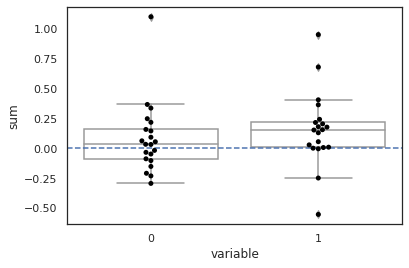

In [170]:
#plot platelets low
df_plot = pd.DataFrame([X_train['platelets'],y_train]).T
df_plot['variable'] = df_plot['platelets']<np.median(df_plot['platelets'])
order_by = [0,1]
save_name = 'platelet_low.svg'
source_path_final = figure_source_path + save_name[:-4] +'_source_data.csv'

#plot

sns.boxplot(data=df_plot,x='variable', y='sum', order=order_by,color='#FFFFFF')
sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_by )
plt.axhline(y=0, ls='dashed')
save_path_final = figure_save_path+save_name
plt.savefig(save_path_final)
print('saved figure to:',save_name[:-4])
for i in order_by:
  print('Wilcoxon signed rank for',i,'is:',scipy.stats.wilcoxon(df_plot[df_plot['variable']==i]['sum']-0, zero_method='wilcox',correction=False))
df_plot.to_csv(source_path_final)

saved figure to: crp_high
Wilcoxon signed rank for 0 is: WilcoxonResult(statistic=36.0, pvalue=0.015972137451171875)
Wilcoxon signed rank for 1 is: WilcoxonResult(statistic=86.0, pvalue=0.19821882247924805)


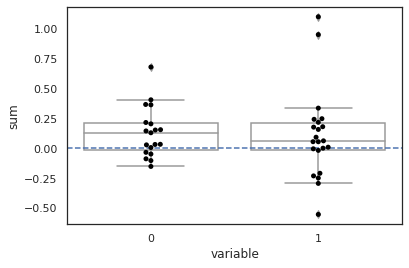

In [171]:
#plot crp high
df_plot = pd.DataFrame([X_train['crp'],y_train]).T
df_plot['variable'] = df_plot['crp']>=np.median(df_plot['crp'])
order_by = [0,1]

save_name = 'crp_high.svg'
source_path_final = figure_source_path + save_name[:-4] +'_source_data.csv'
#plot

sns.boxplot(data=df_plot,x='variable', y='sum', order=order_by,color='#FFFFFF')
sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_by )
plt.axhline(y=0, ls='dashed')
save_path_final = figure_save_path+save_name
plt.savefig(save_path_final)
print('saved figure to:',save_name[:-4] )
for i in order_by:
  print('Wilcoxon signed rank for',i,'is:',scipy.stats.wilcoxon(df_plot[df_plot['variable']==i]['sum']-0, zero_method='wilcox',correction=False))
df_plot.to_csv(source_path_final)

saved figure to: vaccine_type
Wilcoxon signed rank for Comirnaty is: WilcoxonResult(statistic=150.0, pvalue=0.011677731925524248)
Wilcoxon signed rank for Moderna is: WilcoxonResult(statistic=1.0, pvalue=1.0)
Wilcoxon signed rank for Astra Zeneca is: WilcoxonResult(statistic=5.0, pvalue=0.625)


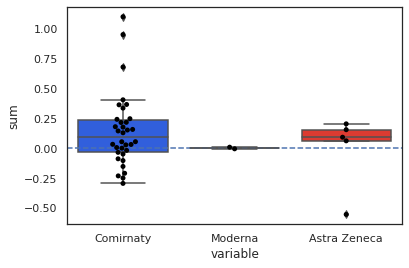

In [172]:
#plot by subgroup
df_plot = marker_df_reindex
variable_dict = vaccine_type
order_by = ['Comirnaty','Moderna','Astra Zeneca']
save_name = 'vaccine_type.svg'
source_path_final = figure_source_path + save_name[:-4] +'_source_data.csv'
#add variable data to df
df_plot['patient_id'] = df_plot.index.str.slice(stop=-3)
df_plot['variable'] = df_plot['patient_id'].map(variable_dict)

#plot

sns.boxplot(data=df_plot,x='variable', y='sum', order=order_by,palette=vaccine_type_dict)
sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_by )
plt.axhline(y=0, ls='dashed')
save_path_final = figure_save_path+save_name
plt.savefig(save_path_final)
print('saved figure to:',save_name[:-4] )
for i in order_by:
  print('Wilcoxon signed rank for',i,'is:',scipy.stats.wilcoxon(df_plot[df_plot['variable']==i]['sum']-0, zero_method='wilcox',correction=False))
df_plot.to_csv(source_path_final)

In [173]:
#dictionaries for relevant clinical variables
therapy_dict = patient_table['Therapy_type'].to_dict()
ins_dict = patient_table['private_insurance'].to_dict()
tumor_dict  = patient_table['Tumor_type'].to_dict()
sex_dict  = patient_table['Sex'].to_dict()
line_dict  = patient_table['Therapy_Line'].to_dict()

saved to: tumor_type


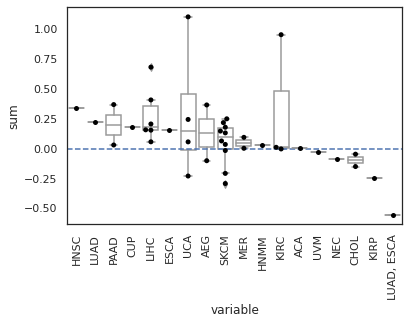

In [174]:
#plot by subgroup
df_plot = marker_df_reindex
variable_dict = tumor_dict
order_variables = False
#order_by = ['Comirnaty','Moderna','Astra Zeneca']
sort_values = True
save_name = 'tumor_type.svg'
source_path_final = figure_source_path + save_name[:-4] +'_source_data.csv'
#add variable data to df
df_plot['patient_id'] = df_plot.index.str.slice(stop=-3)
df_plot['variable'] = df_plot['patient_id'].map(variable_dict)

#sort
if sort_values:
  order_list = list(df_plot.groupby('variable').median().sort_values('sum',ascending=False).index)

#plot
if order_variables:
  sns.boxplot(data=df_plot,x='variable', y='sum', order=order_by,
            palette=vaccine_type_dict
            )
  sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_by )
else:
  if sort_values:
    sns.boxplot(data=df_plot,x='variable', y='sum',order=order_list,color='#FFFFFF')
    sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_list)

plt.axhline(y=0, ls='dashed')
if order_variables:
  for i in order_by:
    print('Wilcoxon signed rank for',i,'is:',scipy.stats.wilcoxon(df_plot[df_plot['variable']==i]['sum']-0, zero_method='wilcox',correction=False))

plt.xticks(rotation='vertical')
print('saved to:',save_name[:-4])
df_plot.to_csv(source_path_final)
save_path_final = figure_save_path+save_name
plt.savefig(save_path_final)

Wilcoxon signed rank for F is: WilcoxonResult(statistic=26.0, pvalue=0.5771484375)
Wilcoxon signed rank for M is: WilcoxonResult(statistic=104.0, pvalue=0.008216736457590426)
saved to: sex


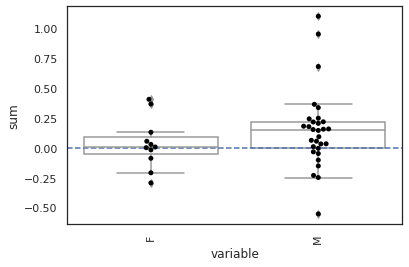

In [175]:
#plot by subgroup
df_plot = marker_df_reindex
variable_dict = sex_dict
order_variables = True
order_by = ['F','M']
sort_values = True
save_name = 'sex.svg'
source_path_final = figure_source_path + save_name[:-4] +'_source_data.csv'

give_color_dict = False
color_dict = vaccine_type_dict

#add variable data to df
df_plot['patient_id'] = df_plot.index.str.slice(stop=-3)
df_plot['variable'] = df_plot['patient_id'].map(variable_dict)

#sort
if sort_values:
  order_list = list(df_plot.groupby('variable').median().sort_values('sum',ascending=False).index)

#plot
if order_variables:
  if give_color_dict:
    sns.boxplot(data=df_plot,x='variable', y='sum', order=order_by,
            palette=vaccine_type_dict
            )
  else:
    sns.boxplot(data=df_plot,x='variable', y='sum', order=order_by,
            color='#FFFFFF'
            )
  sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_by )
else:
  if sort_values:
    sns.boxplot(data=df_plot,x='variable', y='sum',order=order_list,color='#FFFFFF')
    sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_list)

plt.axhline(y=0, ls='dashed')
if order_variables:
  for i in order_by:
    print('Wilcoxon signed rank for',i,'is:',scipy.stats.wilcoxon(df_plot[df_plot['variable']==i]['sum']-0, zero_method='wilcox',correction=False))
plt.xticks(rotation='vertical')

save_path_final = figure_save_path+save_name
df_plot.to_csv(source_path_final)
print('saved to:',save_name[:-4])
plt.savefig(save_path_final)

In [176]:
#merge some values
line_dict_simplified = line_dict.copy()
for i,v in line_dict.items():
  if v >3:
    line_dict_simplified[i] = '>3'

saved to: line


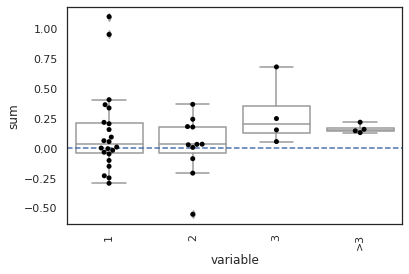

In [177]:
#plot by subgroup
df_plot = marker_df_reindex
variable_dict = line_dict_simplified
order_variables = False
order_by = [1,2,3,'>3']
sort_values = False
save_name = 'line.svg'
source_path_final = figure_source_path + save_name[:-4] +'_source_data.csv'
give_color_dict = False
color_dict = vaccine_type_dict

#add variable data to df
df_plot['patient_id'] = df_plot.index.str.slice(stop=-3)
df_plot['variable'] = pd.Categorical(df_plot['patient_id'].map(variable_dict))

#sort
if sort_values:
  order_list = list(df_plot.groupby('variable').median().sort_values('sum',ascending=False).index)

#plot
if order_variables:
  if give_color_dict:
    sns.boxplot(data=df_plot,x='variable', y='sum', order=order_by,
            palette=vaccine_type_dict
            )
  else:
    sns.boxplot(data=df_plot,x='variable', y='sum', order=order_by,
            color='#FFFFFF'
            )
  sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_by )
else:
  if sort_values:
    sns.boxplot(data=df_plot,x='variable', y='sum',order=order_list,color='#FFFFFF')
    sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_list)
  else:
    sns.boxplot(data=df_plot,x='variable', y='sum',order=order_by,color='#FFFFFF')
    sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_by)

plt.axhline(y=0
            , ls='dashed')
if order_variables:
  for i in order_by:
    print('Wilcoxon signed rank for',i,'is:',scipy.stats.wilcoxon(df_plot[df_plot['variable']==i]['sum']-0, zero_method='wilcox',correction=False))
plt.xticks(rotation='vertical')

save_path_final = figure_save_path+save_name
plt.savefig(save_path_final)
df_plot.to_csv(source_path_final)
print('saved to:',save_name[:-4])

In [178]:
#summarize therapy types

ther_type_dict = {'CTLA-4':'CTLA-4',
 'CTLA-4+PD-1':'CTLA-4+PD-1',
 'ICT-->CTX':'PD-1/PD-L1+CTX',
 'PD-1/PD-L1':'PD-1/PD-L1',
 'PD-1/PD-L1+CTX':'PD-1/PD-L1+CTX',
 'PD-1/PD-L1+RTX':'PD-1/PD-L1+RTX',
 'PD-1/PD-L1+TKI':'PD-1/PD-L1+TKI',
 'PD-1/PD-L1+anti-VEGF':'PD-1/PD-L1+anti-VEGF',
 'other':'PD-1/PD-L1+other'}

In [179]:
ther_type_dict.keys()

dict_keys(['CTLA-4', 'CTLA-4+PD-1', 'ICT-->CTX', 'PD-1/PD-L1', 'PD-1/PD-L1+CTX', 'PD-1/PD-L1+RTX', 'PD-1/PD-L1+TKI', 'PD-1/PD-L1+anti-VEGF', 'other'])

Wilcoxon signed rank for PD-1/PD-L1 is: WilcoxonResult(statistic=44.0, pvalue=0.946044921875)
Wilcoxon signed rank for CTLA-4 is: WilcoxonResult(statistic=0.0, pvalue=1.0)
Wilcoxon signed rank for CTLA-4+PD-1 is: WilcoxonResult(statistic=4.0, pvalue=0.4375)
Wilcoxon signed rank for PD-1/PD-L1+CTX is: WilcoxonResult(statistic=1.0, pvalue=1.0)
Wilcoxon signed rank for PD-1/PD-L1+RTX is: WilcoxonResult(statistic=0.0, pvalue=1.0)
Wilcoxon signed rank for PD-1/PD-L1+TKI is: WilcoxonResult(statistic=4.0, pvalue=0.875)
Wilcoxon signed rank for PD-1/PD-L1+anti-VEGF is: WilcoxonResult(statistic=0.0, pvalue=0.03125)
Wilcoxon signed rank for other is: WilcoxonResult(statistic=5.0, pvalue=0.3125)
saved to: therapy_type


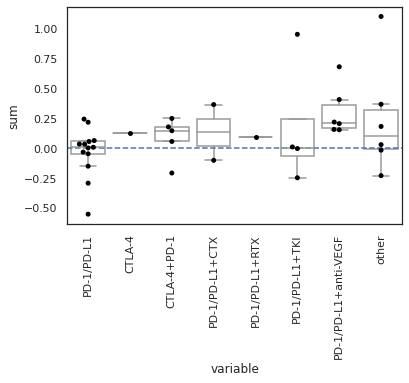

In [180]:
#plot by subgroup
df_plot = marker_df_reindex
variable_dict = therapy_dict
order_variables = True
order_by = [ 'PD-1/PD-L1','CTLA-4',  'CTLA-4+PD-1',  
           'PD-1/PD-L1+CTX', 'PD-1/PD-L1+RTX', 'PD-1/PD-L1+TKI', 'PD-1/PD-L1+anti-VEGF', 'other']
save_name = 'therapy_type.svg'
source_path_final = figure_source_path + save_name[:-4] +'_source_data.csv'

#add variable data to df
df_plot['patient_id'] = df_plot.index.str.slice(stop=-3)
df_plot['variable'] = df_plot['patient_id'].map(variable_dict)
df_plot['variable']  == df_plot['variable'].map(ther_type_dict)

#plot
if order_variables:
  sns.boxplot(data=df_plot,x='variable', y='sum', order=order_by,
            color='#FFFFFF',fliersize=0
            )
  sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_by )
else:
  sns.boxplot(data=df_plot,x='variable', y='sum',color='#FFFFFF',fliersize=0)
  sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000')

plt.axhline(y=0, ls='dashed')
if order_variables:
  for i in order_by:
    print('Wilcoxon signed rank for',i,'is:',scipy.stats.wilcoxon(df_plot[df_plot['variable']==i]['sum']-0, zero_method='wilcox',correction=False))
plt.xticks(rotation='vertical')

save_path_final = figure_save_path+save_name
plt.savefig(save_path_final)
df_plot.to_csv(source_path_final)
print('saved to:',save_name[:-4])

Wilcoxon signed rank for 0 is: WilcoxonResult(statistic=144.0, pvalue=0.008682342712856768)
Wilcoxon signed rank for 1 is: WilcoxonResult(statistic=14.0, pvalue=1.0)
saved to: insurance_type


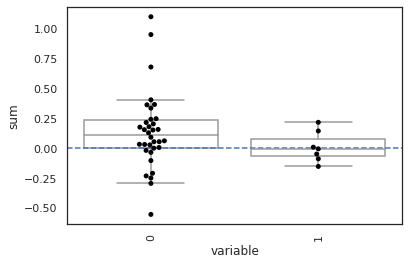

In [181]:
#plot by subgroup
df_plot = marker_df_reindex
variable_dict = ins_dict
order_variables = True
order_by = [ 0,1]
save_name = 'insurance_type.svg'
source_path_final = figure_source_path + save_name[:-4] +'_source_data.csv'

#add variable data to df
df_plot['patient_id'] = df_plot.index.str.slice(stop=-3)
df_plot['variable'] = df_plot['patient_id'].map(variable_dict)
df_plot['variable']  == df_plot['variable'].map(ther_type_dict)

#plot
if order_variables:
  sns.boxplot(data=df_plot,x='variable', y='sum', order=order_by,
            color='#FFFFFF',fliersize=0
            )
  sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_by )
else:
  sns.boxplot(data=df_plot,x='variable', y='sum',color='#FFFFFF',fliersize=0)
  sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000')

plt.axhline(y=0, ls='dashed')
if order_variables:
  for i in order_by:
    print('Wilcoxon signed rank for',i,'is:',scipy.stats.wilcoxon(df_plot[df_plot['variable']==i]['sum']-0, zero_method='wilcox',correction=False))
plt.xticks(rotation='vertical')

save_path_final = figure_save_path+save_name
plt.savefig(save_path_final)
df_plot.to_csv(source_path_final)
print('saved to:',save_name[:-4])

# Survival analysis

In [182]:
#this section with code adapted from https://medium.com/towards-artificial-intelligence/survival-analysis-with-python-tutorial-how-what-when-and-why-19a5cfb3c312
import lifelines
from lifelines import KaplanMeierFitter
from lifelines import CoxPHFitter

In [183]:
os_time_column = 'follow_up_from_ICT_days'
os_status_column = 'Survival_01.10.21'
subset_data = False
subset_column_label = 'vaccinated'
categorical = True
category_list = [False]
greater_equal_cutoff = True
cutoff_value = 25
save_name = 'survival_allpatients.svg'

In [184]:
#create an object for kaplan-meier-fitter
kmf= KaplanMeierFitter()

In [185]:
kmf.fit(durations = patient_table[os_time_column].astype(float), event_observed = patient_table[os_status_column].astype(float))

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 90 total observations, 76 right-censored observations>

In [186]:
if subset_data:
  if categorical:
    patient_table_subset = patient_table[patient_table[subset_column_label].isin(category_list)]
  else:
    if greater_equal_cutoff:
      patient_table_subset = patient_table[patient_table[subset_column_label]>=cutoff_value]
    else:
      patient_table_subset = patient_table[patient_table[subset_column_label]<cutoff_value]
  kmf.fit(durations = patient_table_subset[os_time_column], event_observed = patient_table_subset[os_status_column])
else:
    #fit the parameter values
    patient_table_subset = patient_table
    kmf.fit(durations = patient_table[os_time_column], event_observed = patient_table[os_status_column])

In [187]:
print('number of events is:', sum(patient_table_subset['Survival_01.10.21']))
print('total patient number is:', len(patient_table_subset['Survival_01.10.21']))

number of events is: 14.0
total patient number is: 90


In [188]:
set(patient_table_subset['Therapy_type'])

{'CTLA-4',
 'CTLA-4+PD-1',
 'ICT-->CTX',
 'PD-1/PD-L1',
 'PD-1/PD-L1+CTX',
 'PD-1/PD-L1+RTX',
 'PD-1/PD-L1+TKI',
 'PD-1/PD-L1+anti-VEGF',
 'other'}

In [189]:
#generate event table
kmf.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,90,90
30.0,2,2,0,0,90
44.0,1,1,0,0,88
61.0,1,1,0,0,87
62.0,1,1,0,0,86
...,...,...,...,...,...
451.0,1,0,1,0,5
463.0,1,0,1,0,4
470.0,1,0,1,0,3


Text(0, 0.5, 'probability of survival')

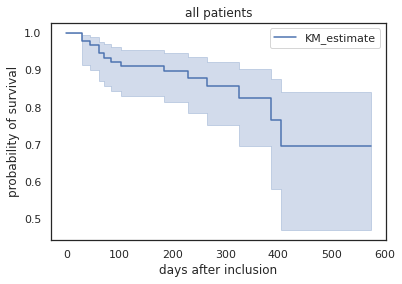

In [190]:
#plot all patients
kmf.plot()
plt.title('all patients')
plt.xlabel('days after inclusion')
plt.ylabel('probability of survival')

In [191]:
#split data
if subset_data:
  patients_vacc = patient_table_subset[patient_table_subset['vaccinated']]
  patients_novacc = patient_table_subset[~patient_table_subset['vaccinated']]
  print('all patients:', patient_table_subset.shape[0])
  print('vaccinated patients', patients_vacc.shape[0])
  print('unvaccinated patients', patients_novacc.shape[0])
else:
  patients_vacc = patient_table[patient_table['vaccinated']]
  patients_novacc = patient_table[patient_table['vaccinated']==False]
  print('all patients:', patient_table.shape[0])
  print('vaccinated patients', patients_vacc.shape[0])
  print('unvaccinated patients', patients_novacc.shape[0])

all patients: 90
vaccinated patients 64
unvaccinated patients 26


In [192]:
patient_table[patient_table['vaccinated']]

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,date_inclusion,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,follow_up_from_second_dose_vaccine_days,color_code,Survival_01.10.21,vaccine_type,time_from_ICT
Patient_ID,,,,,,,,,,,,,,,,,,,,,
A8SRJO,M,59.0,NaN,2.0,0.0,SKCM,IV,PD-1/PD-L1,1.0,True,...,2020-09-30,10/1/2021,10/1/2021,366.0,204.0,129.00,#997D87,0.0,Astra Zeneca,162.0
L9YLRD,M,68.0,20.2,1.0,1.0,OSCC,III,PD-1/PD-L1,1.0,True,...,2020-12-04,10/1/2021,10/1/2021,301.0,166.0,82.00,#61615A,0.0,Astra Zeneca,135.0
74WACU,F,61.0,22.6,1.0,0.0,AEG,IV,PD-1/PD-L1,1.0,True,...,2021-03-18,10/1/2021,10/1/2021,197.0,205.0,144.00,#788D66,0.0,Astra Zeneca,-8.0
SSW9Q1,F,68.0,25.3,1.0,0.0,UVM,IV,PD-1/PD-L1,3.0,True,...,2021-04-07,5/5/2021,10/1/2021,177.0,166.0,82.00,#886F4C,0.0,Astra Zeneca,11.0
7Z9V9Q,M,76.0,24.3,1.0,0.0,"LUAD, ESCA",IV,PD-1/PD-L1,2.0,True,...,2021-04-16,6/11/2021,6/17/2021,62.0,50.0,8.00,#B4A8BD,1.0,Astra Zeneca,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RIRRZD,M,61.0,24.2,1.0,0.0,HNSC,III,PD-1/PD-L1+CTX,2.0,True,...,2021-04-29,7/9/2021,10/1/2021,155.0,149.0,106.00,#636375,0.0,Moderna,6.0
QH6V9I,M,67.0,27.6,1.0,0.0,KIRC,IV,PD-1/PD-L1+TKI,1.0,True,...,2021-03-09,10/1/2021,10/1/2021,206.0,169.0,135.00,#6F0062,0.0,Moderna,37.0
ULKZFC,M,77.0,28.3,0.0,1.0,KIRC,IV,PD-1/PD-L1+TKI,1.0,True,...,2021-03-12,7/2/2021,10/1/2021,203.0,187.0,152.00,#EEC3FF,0.0,Moderna,16.0


In [193]:
#fit the parameter values
kmf_high = KaplanMeierFitter()
kmf_low = KaplanMeierFitter()

kmf_high.fit(durations = patients_vacc[os_time_column], event_observed = patients_vacc[os_status_column],label='vac')
kmf_low.fit(durations = patients_novacc[os_time_column], event_observed = patients_novacc[os_status_column],label='novacc')

<lifelines.KaplanMeierFitter:"novacc", fitted with 26 total observations, 17 right-censored observations>

In [194]:
kmf_high.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,64,64
44.0,1,1,0,0,64
62.0,1,1,0,0,63
85.0,1,1,0,0,62
127.0,1,0,1,0,61
134.0,1,0,1,0,60
154.0,1,0,1,0,59
155.0,1,0,1,0,58
172.0,1,0,1,0,57


In [195]:
#variables for logrank
Time_A = patients_vacc[os_time_column]
Event_A = patients_vacc[os_status_column]

Time_B = patients_novacc[os_time_column]
Event_B = patients_novacc[os_status_column]

In [196]:
#logrank
from lifelines.statistics import logrank_test

results = logrank_test(Time_A, Time_B, event_observed_A=Event_A, event_observed_B=Event_B)
results.print_summary()
print('P value is:', results.p_value)

/home/wallet/miniconda3/envs/2022_ANTICIPATE_COVID-19/lib/python3.8/site-packages/lifelines/statistics.py:143: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  return self.summary.to_latex()


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
           9.35 <0.005      8.81

P value is: 0.002235576556890744


In [197]:
df

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,date_inclusion,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,follow_up_from_second_dose_vaccine_days,color_code,Survival_01.10.21,vaccine_type,time_from_ICT
Patient_ID,,,,,,,,,,,,,,,,,,,,,
A8SRJO,M,59.0,NaN,2.0,0.0,SKCM,IV,PD-1/PD-L1,1.0,True,...,2020-09-30,10/1/2021,10/1/2021,366.0,204.0,129.00,#997D87,0.0,Astra Zeneca,162.0
L9YLRD,M,68.0,20.2,1.0,1.0,OSCC,III,PD-1/PD-L1,1.0,True,...,2020-12-04,10/1/2021,10/1/2021,301.0,166.0,82.00,#61615A,0.0,Astra Zeneca,135.0
74WACU,F,61.0,22.6,1.0,0.0,AEG,IV,PD-1/PD-L1,1.0,True,...,2021-03-18,10/1/2021,10/1/2021,197.0,205.0,144.00,#788D66,0.0,Astra Zeneca,-8.0
SSW9Q1,F,68.0,25.3,1.0,0.0,UVM,IV,PD-1/PD-L1,3.0,True,...,2021-04-07,5/5/2021,10/1/2021,177.0,166.0,82.00,#886F4C,0.0,Astra Zeneca,11.0
7Z9V9Q,M,76.0,24.3,1.0,0.0,"LUAD, ESCA",IV,PD-1/PD-L1,2.0,True,...,2021-04-16,6/11/2021,6/17/2021,62.0,50.0,8.00,#B4A8BD,1.0,Astra Zeneca,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C1ABPH,M,69.0,18.7,2.0,0.0,"NSCLC, HNSC",II,PD-1/PD-L1+CTX,2.0,False,...,2020-09-25,1/28/2021,10/1/2021,371.0,NaN,#VALUE!,#F1FE76,0.0,NA,NaN
2DP8J8,M,58.0,29.4,0.0,0.0,AEG,II,PD-1/PD-L1+CTX,1.0,False,...,2021-02-08,8/24/2021,9/26/2021,230.0,NaN,#VALUE!,#CFB70A,1.0,NA,NaN
KQQNSB,M,60.0,30.9,0.0,0.0,KIRC,III,PD-1/PD-L1+TKI,1.0,False,...,2020-10-02,8/10/2021,10/1/2021,364.0,NaN,#VALUE!,#BC41A1,0.0,NA,NaN


/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/1278674880.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  patients_vacc['vacc_event'] = time_until_dose


25% patients vaccinated at 21 days
50% patients vaccinated at 91 days
75% patients vaccinated at 174 days
100% patients vaccinated at 599 days
saved to: proportion_first_vacc.svg


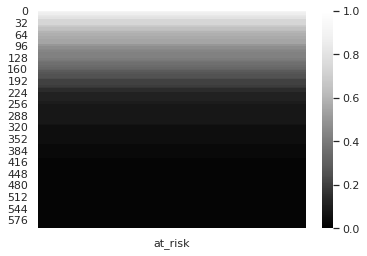

In [198]:
#color bar encoding proportion of patients who received 1st vaccination over time

save_name = 'proportion_first_vacc.svg'
save_path_complete = figure_save_path + save_name
source_path_final = figure_source_path + save_name[:-4] +'_source_data.csv'

#get time until first vacc
time_until_dose = pd.to_datetime(patients_vacc['First_dose_date']) - pd.to_datetime(patients_vacc['date_inclusion'])
time_until_dose = [x.days for x in time_until_dose]
patients_vacc['vacc_event'] = time_until_dose
patients_vacc = patients_vacc[~patients_vacc['vacc_event'].isna()]
patients_vacc['vacc_status'] = patients_vacc['vaccinated'].astype(int)

#get event table
kmf_vacc = KaplanMeierFitter()

kmf_vacc.fit(durations = patients_vacc['vacc_event'].astype(float), event_observed = patients_vacc['vacc_status'].astype(float))


#get colorbar of vaccination status

df = kmf_vacc.event_table
df['at_risk_norm'] = df['at_risk']/max(df['at_risk'])

time_scale  = pd.DataFrame(index=list(range(600)))

for i in time_scale.index:
    if i == 0:
        time_scale.loc[i,'at_risk']= 0
    else:
        time_scale.loc[i,'at_risk']= min(df[df.index <i]['at_risk_norm'])


sns.heatmap(time_scale, vmin=0, vmax=1, cmap='Greys_r', center=0.5, robust=False, annot=None, 
            fmt='.2g', annot_kws=None, linewidths=0, linecolor='white', cbar=True, cbar_kws=None, 
            cbar_ax=None, square=False, xticklabels='auto', yticklabels='auto', mask=None, ax=None, )

print('25% patients vaccinated at',max(time_scale[time_scale['at_risk']>0.75].index),'days')
print('50% patients vaccinated at',max(time_scale[time_scale['at_risk']>0.5].index),'days')
print('75% patients vaccinated at',max(time_scale[time_scale['at_risk']>0.25].index),'days')
print('100% patients vaccinated at',max(time_scale[time_scale['at_risk']>0.0].index),'days')
plt.savefig(save_path_complete)
time_scale.to_csv(source_path_final)
print('saved to:',save_name)

25% patients vaccinated at 64 days
50% patients vaccinated at 130 days
75% patients vaccinated at 221 days
100% patients vaccinated at 599 days
saved to: proportion_second_vacc.svg
saved to: proportion_second_vacc.svg


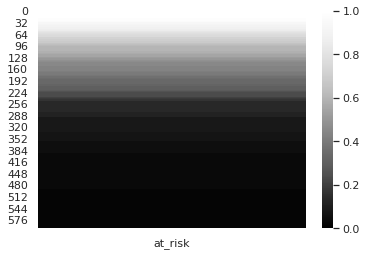

In [199]:
#color bar encoding proportion of patients who received 1st vaccination over time

save_name = 'proportion_second_vacc.svg'
save_path_complete = figure_save_path + save_name
source_path_final = figure_source_path + save_name[:-4] +'_source_data.csv'
#get time until first vacc
time_until_dose = pd.to_datetime(patients_vacc['Second_dose_date']) - pd.to_datetime(patients_vacc['date_inclusion'])
time_until_dose = [x.days for x in time_until_dose]
patients_vacc['vacc_event'] = time_until_dose
patients_vacc = patients_vacc[~patients_vacc['vacc_event'].isna()]
patients_vacc['vacc_status'] = patients_vacc['vaccinated'].astype(int)

#get event table
kmf_vacc = KaplanMeierFitter()

kmf_vacc.fit(durations = patients_vacc['vacc_event'].astype(float), event_observed = patients_vacc['vacc_status'].astype(float))


#get colorbar of vaccination status

df = kmf_vacc.event_table
df['at_risk_norm'] = df['at_risk']/max(df['at_risk'])

time_scale  = pd.DataFrame(index=list(range(600)))

for i in time_scale.index:
    if i == 0:
        time_scale.loc[i,'at_risk']= 0
    else:
        time_scale.loc[i,'at_risk']= min(df[df.index <i]['at_risk_norm'])


sns.heatmap(time_scale, vmin=0, vmax=1, cmap='Greys_r', center=0.5, robust=False, annot=None, 
            fmt='.2g', annot_kws=None, linewidths=0, linecolor='white', cbar=True, cbar_kws=None, 
            cbar_ax=None, square=False, xticklabels='auto', yticklabels='auto', mask=None, ax=None, )

print('25% patients vaccinated at',max(time_scale[time_scale['at_risk']>0.75].index),'days')
print('50% patients vaccinated at',max(time_scale[time_scale['at_risk']>0.5].index),'days')
print('75% patients vaccinated at',max(time_scale[time_scale['at_risk']>0.25].index),'days')
print('100% patients vaccinated at',max(time_scale[time_scale['at_risk']>0.0].index),'days')
print('saved to:',save_name)
plt.savefig(save_path_complete)
time_scale.to_csv(source_path_final)
print('saved to:',save_name)

saved to:0.002235576556890744proportion_second_vacc.svg
event table to: proportion_second_vacc_vacc.csv
event table to: proportion_second_vacc_unvacc.csv


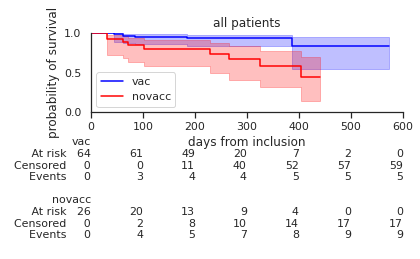

In [200]:
#plot all patients
X = np.linspace(-6, 6, 1024)
fig, ax = plt.subplots()
plt.ylim(0, 1)
plt.xlim(0,600)
kmf_high.plot(ci_show=True, color='blue')
kmf_low.plot(ci_show=True, color='red')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
plt.title('all patients')
plt.xlabel('days from inclusion')
plt.ylabel('probability of survival')

from lifelines.plotting import add_at_risk_counts
add_at_risk_counts(kmf_high, kmf_low, ax=ax)
plt.tight_layout()

save_path_complete = figure_save_path + str(results.p_value)+save_name
print('saved to:'+ str(results.p_value)+save_name)
plt.savefig(save_path_complete)
kmf_high.event_table.to_csv( figure_source_path + save_name[:-4]+ '_vacc.csv')
print('event table to:',save_name[:-4]+ '_vacc.csv')
kmf_low.event_table.to_csv( figure_source_path + save_name[:-4]+ '_unvacc.csv')
print('event table to:',save_name[:-4]+ '_unvacc.csv')

# Landmark analysis - Survival

In [201]:
#this section with code adapted from https://medium.com/towards-artificial-intelligence/survival-analysis-with-python-tutorial-how-what-when-and-why-19a5cfb3c312
import lifelines
from lifelines import KaplanMeierFitter
from lifelines import CoxPHFitter

In [202]:
#landmark date chose as 17 May 2021, the date when unrestricted access to SARS-CoV-2 vaccination was established in Baden-Wuerttemberg, Germany
#press release from the state of Baden-Wuerrtemberg from the 12 May 2021. Retrieved from  https://sozialministerium.baden-wuerttemberg.de/de/service/presse/pressemitteilung/pid/priorisierung-in-arztpraxen-ab-17-mai-fuer-alle-impfstoffe-aufgehoben/ on 18 Feb 2022
landmark = '05/17/2021'
os_status_column = 'Survival_01.10.21'
os_time_column = 'follow_up_from_'+landmark
subset_data = False
subset_column_label = 'vaccinated_landmark'
categorical = True
category_list = [False]
greater_equal_cutoff = True
cutoff_value = 25

In [203]:
patient_table = patient_table[~patient_table.index.isna()]
patient_table

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,date_inclusion,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,follow_up_from_second_dose_vaccine_days,color_code,Survival_01.10.21,vaccine_type,time_from_ICT
Patient_ID,,,,,,,,,,,,,,,,,,,,,
A8SRJO,M,59.0,NaN,2.0,0.0,SKCM,IV,PD-1/PD-L1,1.0,True,...,2020-09-30,10/1/2021,10/1/2021,366.0,204.0,129.00,#997D87,0.0,Astra Zeneca,162.0
L9YLRD,M,68.0,20.2,1.0,1.0,OSCC,III,PD-1/PD-L1,1.0,True,...,2020-12-04,10/1/2021,10/1/2021,301.0,166.0,82.00,#61615A,0.0,Astra Zeneca,135.0
74WACU,F,61.0,22.6,1.0,0.0,AEG,IV,PD-1/PD-L1,1.0,True,...,2021-03-18,10/1/2021,10/1/2021,197.0,205.0,144.00,#788D66,0.0,Astra Zeneca,-8.0
SSW9Q1,F,68.0,25.3,1.0,0.0,UVM,IV,PD-1/PD-L1,3.0,True,...,2021-04-07,5/5/2021,10/1/2021,177.0,166.0,82.00,#886F4C,0.0,Astra Zeneca,11.0
7Z9V9Q,M,76.0,24.3,1.0,0.0,"LUAD, ESCA",IV,PD-1/PD-L1,2.0,True,...,2021-04-16,6/11/2021,6/17/2021,62.0,50.0,8.00,#B4A8BD,1.0,Astra Zeneca,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C1ABPH,M,69.0,18.7,2.0,0.0,"NSCLC, HNSC",II,PD-1/PD-L1+CTX,2.0,False,...,2020-09-25,1/28/2021,10/1/2021,371.0,NaN,#VALUE!,#F1FE76,0.0,NA,NaN
2DP8J8,M,58.0,29.4,0.0,0.0,AEG,II,PD-1/PD-L1+CTX,1.0,False,...,2021-02-08,8/24/2021,9/26/2021,230.0,NaN,#VALUE!,#CFB70A,1.0,NA,NaN
KQQNSB,M,60.0,30.9,0.0,0.0,KIRC,III,PD-1/PD-L1+TKI,1.0,False,...,2020-10-02,8/10/2021,10/1/2021,364.0,NaN,#VALUE!,#BC41A1,0.0,NA,NaN


In [204]:
#calculate vaccination and inclusion distance to landmark

vacc_time_from_landmark = pd.to_datetime(patient_table['First_dose_date']) - pd.to_datetime(landmark)
vacc_time_from_landmark = [x.days for x in vacc_time_from_landmark]
patient_table['vacc_time_from_landmark'] = vacc_time_from_landmark


inclusion_time_from_landmark = pd.to_datetime(patient_table['date_inclusion']) - pd.to_datetime(landmark)
inclusion_time_from_landmark = [x.days for x in inclusion_time_from_landmark]
patient_table['inclusion_time_from_landmark'] = inclusion_time_from_landmark


In [205]:
patient_table.columns

Index(['Sex', 'Age_at_inclusion', 'BMI', 'ECOG', 'private_insurance',
       'Tumor_type', 'Stage', 'Therapy_type', 'Therapy_Line', 'vaccinated',
       'First_dose_date', 'First_dose_vaccine', 'Second_dose_date',
       'Second_dose_vaccine', 'date_inclusion', 'last_immunotherapy',
       'last_follow_up', 'follow_up_from_ICT_days',
       'follow_up_from_first_dose_vaccine_days',
       'follow_up_from_second_dose_vaccine_days', 'color_code',
       'Survival_01.10.21', 'vaccine_type', 'time_from_ICT',
       'vacc_time_from_landmark', 'inclusion_time_from_landmark'],
      dtype='object')

In [206]:
patient_table[['First_dose_date','vacc_time_from_landmark']]

,First_dose_date,vacc_time_from_landmark
Patient_ID,,
A8SRJO,2021-03-11,-67.0
L9YLRD,2021-04-18,-29.0
74WACU,2021-03-10,-68.0
SSW9Q1,2021-04-18,-29.0
7Z9V9Q,2021-04-28,-19.0
...,...,...
C1ABPH,NaT,NaN
2DP8J8,NaT,NaN
KQQNSB,NaT,NaN


In [207]:
#calculate included patients until landmark
print('whith landmark of:', landmark)
patient_table_landmark = patient_table[patient_table['inclusion_time_from_landmark']<=0]
patient_table_landmark['vaccinated_landmark'] = patient_table_landmark['vaccinated'].copy()

landmark_vacc_list = []

for i in patient_table_landmark.index:
    df_subset_landmark = patient_table_landmark.loc[i,:]
    if df_subset_landmark['vaccinated_landmark'] == True:
        a = df_subset_landmark['vacc_time_from_landmark']<=0
        landmark_vacc_list.append(a)
    elif df_subset_landmark['vaccinated_landmark'] == False:
        landmark_vacc_list.append(False)
    else:
        print('vaccinated_landmark is not boolean')
        
patient_table_landmark['vaccinated_landmark'] = landmark_vacc_list
       
#calculate survival time from landmark
survival_time_landmark = pd.to_datetime(patient_table_landmark['last_follow_up']) - pd.to_datetime(landmark)
survival_time_landmark = [x.days for x in survival_time_landmark]
patient_table_landmark[os_time_column] = survival_time_landmark
patient_table_landmark[os_time_column]

#restrict to patients with follow up after landmark
patient_table_landmark = patient_table_landmark[patient_table_landmark[os_time_column]>=0]
print(len(patient_table_landmark), 'patients are included in the analysis')
        
patient_table_landmark['vaccinated_landmark'].value_counts()

whith landmark of: 05/17/2021
82 patients are included in the analysis


/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/107360561.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  patient_table_landmark['vaccinated_landmark'] = patient_table_landmark['vaccinated'].copy()
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/107360561.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  patient_table_landmark['vaccinated_landmark'] = landmark_vacc_list
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/107360561.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a

True     57
False    25
Name: vaccinated_landmark, dtype: int64

In [208]:
os_time_column

'follow_up_from_05/17/2021'

## follow up from landmark

In [209]:
#create an object for kaplan-meier-fitter
kmf= KaplanMeierFitter()

In [210]:
kmf.fit(durations = patient_table_landmark[os_time_column].astype(float), event_observed = patient_table_landmark[os_status_column].astype(float))

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 82 total observations, 71 right-censored observations>

In [211]:
#create an object for kaplan-meier-fitter
kmf= KaplanMeierFitter()

In [212]:
kmf.fit(durations = patient_table_landmark[os_time_column].astype(float), event_observed = patient_table_landmark[os_status_column].astype(float))

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 82 total observations, 71 right-censored observations>

In [213]:
if subset_data:
  if categorical:
    patient_table_landmark_subset = patient_table_landmark[patient_table_landmark[subset_column_label].isin(category_list)]
  else:
    if greater_equal_cutoff:
      patient_table_landmark_subset = patient_table_landmark[patient_table_landmark[subset_column_label]>=cutoff_value]
    else:
      patient_table_landmark_subset = patient_table_landmark[patient_table_landmark[subset_column_label]<cutoff_value]
  kmf.fit(durations = patient_table_landmark_subset[os_time_column], event_observed = patient_table_landmark_subset[os_status_column])
else:
    #fit the parameter values
    patient_table_landmark_subset = patient_table_landmark
    kmf.fit(durations = patient_table_landmark[os_time_column], event_observed = patient_table_landmark[os_status_column])

In [214]:
print('number of events is:', sum(patient_table_landmark_subset['Survival_01.10.21']))
print('total patient number is:', len(patient_table_landmark_subset['Survival_01.10.21']))

number of events is: 11.0
total patient number is: 82


In [215]:
set(patient_table_landmark_subset['Therapy_type'])

{'CTLA-4',
 'CTLA-4+PD-1',
 'ICT-->CTX',
 'PD-1/PD-L1',
 'PD-1/PD-L1+CTX',
 'PD-1/PD-L1+RTX',
 'PD-1/PD-L1+TKI',
 'PD-1/PD-L1+anti-VEGF',
 'other'}

In [216]:
#generate event table
kmf.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,82,82
16.0,1,1,0,0,82
29.0,1,1,0,0,81
30.0,1,1,0,0,80
31.0,1,1,0,0,79
36.0,1,1,0,0,78
49.0,1,0,1,0,77
51.0,1,1,0,0,76
63.0,1,0,1,0,75


Text(0, 0.5, 'probability of survival')

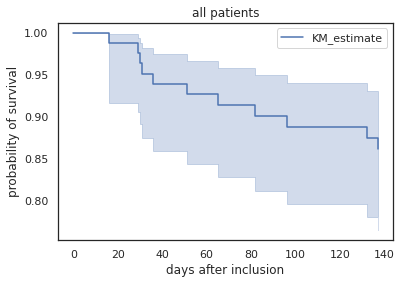

In [217]:
#plot all patients
kmf.plot()
plt.title('all patients')
plt.xlabel('days after inclusion')
plt.ylabel('probability of survival')

In [218]:
#split data
if subset_data:
  patients_vacc = patient_table_landmark_subset[patient_table_landmark_subset[subset_column_label]]
  patients_novacc = patient_table_landmark_subset[~patient_table_landmark_subset[subset_column_label]]
  print('all patients:', patient_table_landmark_subset.shape[0])
  print('vaccinated patients', patients_vacc.shape[0])
  print('unvaccinated patients', patients_novacc.shape[0])
else:
  patients_vacc = patient_table_landmark[patient_table_landmark[subset_column_label]]
  patients_novacc = patient_table_landmark[patient_table_landmark[subset_column_label]==False]
  print('all patients:', patient_table_landmark.shape[0])
  print('vaccinated patients', patients_vacc.shape[0])
  print('unvaccinated patients', patients_novacc.shape[0])

all patients: 82
vaccinated patients 57
unvaccinated patients 25


In [219]:
patient_table_landmark[patient_table_landmark[subset_column_label]]

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,follow_up_from_first_dose_vaccine_days,follow_up_from_second_dose_vaccine_days,color_code,Survival_01.10.21,vaccine_type,time_from_ICT,vacc_time_from_landmark,inclusion_time_from_landmark,vaccinated_landmark,follow_up_from_05/17/2021
Patient_ID,,,,,,,,,,,,,,,,,,,,,
A8SRJO,M,59.0,NaN,2.0,0.0,SKCM,IV,PD-1/PD-L1,1.0,True,...,204.0,129.00,#997D87,0.0,Astra Zeneca,162.0,-67.0,-229,True,137
L9YLRD,M,68.0,20.2,1.0,1.0,OSCC,III,PD-1/PD-L1,1.0,True,...,166.0,82.00,#61615A,0.0,Astra Zeneca,135.0,-29.0,-164,True,137
74WACU,F,61.0,22.6,1.0,0.0,AEG,IV,PD-1/PD-L1,1.0,True,...,205.0,144.00,#788D66,0.0,Astra Zeneca,-8.0,-68.0,-60,True,137
SSW9Q1,F,68.0,25.3,1.0,0.0,UVM,IV,PD-1/PD-L1,3.0,True,...,166.0,82.00,#886F4C,0.0,Astra Zeneca,11.0,-29.0,-40,True,137
7Z9V9Q,M,76.0,24.3,1.0,0.0,"LUAD, ESCA",IV,PD-1/PD-L1,2.0,True,...,50.0,8.00,#B4A8BD,1.0,Astra Zeneca,12.0,-19.0,-31,True,31
JBEZKB,M,75.0,22.1,1.0,0.0,LIHC,III,PD-1/PD-L1+anti-VEGF,1.0,True,...,187.0,121.00,#7A4900,0.0,Astra Zeneca,212.0,-50.0,-262,True,137
FWO178,F,79.0,24.6,1.0,0.0,LIHC,IVA,PD-1/PD-L1+anti-VEGF,3.0,True,...,86.0,#VALUE!,#FF8A9A,1.0,Astra Zeneca,1.0,-55.0,-56,True,29
G8ZRBI,M,60.0,24.8,1.0,0.0,MER,I,PD-1/PD-L1+RTX,1.0,True,...,191.0,121.00,#809693,0.0,Astra Zeneca,168.0,-54.0,-222,True,137
KWO5UQ,M,60.0,26.2,2.0,0.0,SKCM,IB,PD-1/PD-L1+RTX,4.0,True,...,222.0,151.00,#001E09,0.0,Astra Zeneca,-12.0,-85.0,-73,True,137


In [220]:
#fit the parameter values
kmf_high = KaplanMeierFitter()
kmf_low = KaplanMeierFitter()

kmf_high.fit(durations = patients_vacc[os_time_column], event_observed = patients_vacc[os_status_column],label='vac')
kmf_low.fit(durations = patients_novacc[os_time_column], event_observed = patients_novacc[os_status_column],label='novacc')

<lifelines.KaplanMeierFitter:"novacc", fitted with 25 total observations, 18 right-censored observations>

In [221]:
kmf_high.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,57,57
29.0,1,1,0,0,57
31.0,1,1,0,0,56
49.0,1,0,1,0,55
51.0,1,1,0,0,54
74.0,1,0,1,0,53
137.0,52,1,51,0,52


In [222]:
#variables for logrank
Time_A = patients_vacc[os_time_column]
Event_A = patients_vacc[os_status_column]

Time_B = patients_novacc[os_time_column]
Event_B = patients_novacc[os_status_column]

In [223]:
#logrank
from lifelines.statistics import logrank_test

results = logrank_test(Time_A, Time_B, event_observed_A=Event_A, event_observed_B=Event_B)
results.print_summary()
print('P value is:', results.p_value)

/home/wallet/miniconda3/envs/2022_ANTICIPATE_COVID-19/lib/python3.8/site-packages/lifelines/statistics.py:143: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  return self.summary.to_latex()


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           7.18 0.01      7.08

P value is: 0.007371356090988091


saved to:0.007371356090988091landmark_survival.svg


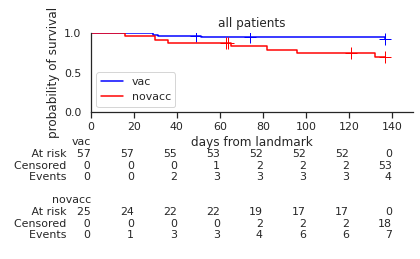

In [224]:
#plot all patients
save_name = 'landmark_survival.svg'
X = np.linspace(-6, 6, 1024)
fig, ax = plt.subplots()
plt.ylim(0, 1)
plt.xlim(0,150)
kmf_high.plot(ci_show=False, color='blue',show_censors=True)
kmf_low.plot(ci_show=False, color='red',show_censors=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
plt.title('all patients')
plt.xlabel('days from landmark')
plt.ylabel('probability of survival')

from lifelines.plotting import add_at_risk_counts
add_at_risk_counts(kmf_high, kmf_low, ax=ax)
plt.tight_layout()

save_path_complete = figure_save_path + str(results.p_value)+save_name
print('saved to:'+ str(results.p_value)+save_name)
plt.savefig(save_path_complete)
kmf_high.event_table.to_csv(figure_source_path+'landmark_survival_from_landmark'+'vacc.csv')
kmf_low.event_table.to_csv(figure_source_path+'landmark_survival_from_landmark'+'unvacc.csv')

## follow up from ICT

In [225]:
os_time_column = 'follow_up_from_ICT_days'

In [226]:
#create an object for kaplan-meier-fitter
kmf= KaplanMeierFitter()

In [227]:
kmf.fit(durations = patient_table_landmark[os_time_column].astype(float), event_observed = patient_table_landmark[os_status_column].astype(float))

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 82 total observations, 71 right-censored observations>

In [228]:
#create an object for kaplan-meier-fitter
kmf= KaplanMeierFitter()

In [229]:
kmf.fit(durations = patient_table_landmark[os_time_column].astype(float), event_observed = patient_table_landmark[os_status_column].astype(float))

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 82 total observations, 71 right-censored observations>

In [230]:
if subset_data:
  if categorical:
    patient_table_landmark_subset = patient_table_landmark[patient_table_landmark[subset_column_label].isin(category_list)]
  else:
    if greater_equal_cutoff:
      patient_table_landmark_subset = patient_table_landmark[patient_table_landmark[subset_column_label]>=cutoff_value]
    else:
      patient_table_landmark_subset = patient_table_landmark[patient_table_landmark[subset_column_label]<cutoff_value]
  kmf.fit(durations = patient_table_landmark_subset[os_time_column], event_observed = patient_table_landmark_subset[os_status_column])
else:
    #fit the parameter values
    patient_table_landmark_subset = patient_table_landmark
    kmf.fit(durations = patient_table_landmark[os_time_column], event_observed = patient_table_landmark[os_status_column])

In [231]:
print('number of events is:', sum(patient_table_landmark_subset['Survival_01.10.21']))
print('total patient number is:', len(patient_table_landmark_subset['Survival_01.10.21']))

number of events is: 11.0
total patient number is: 82


In [232]:
set(patient_table_landmark_subset['Therapy_type'])

{'CTLA-4',
 'CTLA-4+PD-1',
 'ICT-->CTX',
 'PD-1/PD-L1',
 'PD-1/PD-L1+CTX',
 'PD-1/PD-L1+RTX',
 'PD-1/PD-L1+TKI',
 'PD-1/PD-L1+anti-VEGF',
 'other'}

In [233]:
#generate event table
kmf.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,82,82
30.0,2,2,0,0,82
62.0,1,1,0,0,80
85.0,1,1,0,0,79
103.0,1,1,0,0,78
...,...,...,...,...,...
451.0,1,0,1,0,5
463.0,1,0,1,0,4
470.0,1,0,1,0,3


Text(0, 0.5, 'probability of survival')

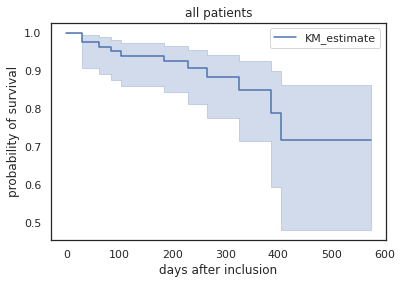

In [234]:
#plot all patients
kmf.plot()
plt.title('all patients')
plt.xlabel('days after inclusion')
plt.ylabel('probability of survival')

In [235]:
#split data
if subset_data:
  patients_vacc = patient_table_landmark_subset[patient_table_landmark_subset[subset_column_label]]
  patients_novacc = patient_table_landmark_subset[~patient_table_landmark_subset[subset_column_label]]
  print('all patients:', patient_table_landmark_subset.shape[0])
  print('vaccinated patients', patients_vacc.shape[0])
  print('unvaccinated patients', patients_novacc.shape[0])
else:
  patients_vacc = patient_table_landmark[patient_table_landmark[subset_column_label]]
  patients_novacc = patient_table_landmark[patient_table_landmark[subset_column_label]==False]
  print('all patients:', patient_table_landmark.shape[0])
  print('vaccinated patients', patients_vacc.shape[0])
  print('unvaccinated patients', patients_novacc.shape[0])

all patients: 82
vaccinated patients 57
unvaccinated patients 25


In [236]:
patient_table_landmark[patient_table_landmark[subset_column_label]]

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,follow_up_from_first_dose_vaccine_days,follow_up_from_second_dose_vaccine_days,color_code,Survival_01.10.21,vaccine_type,time_from_ICT,vacc_time_from_landmark,inclusion_time_from_landmark,vaccinated_landmark,follow_up_from_05/17/2021
Patient_ID,,,,,,,,,,,,,,,,,,,,,
A8SRJO,M,59.0,NaN,2.0,0.0,SKCM,IV,PD-1/PD-L1,1.0,True,...,204.0,129.00,#997D87,0.0,Astra Zeneca,162.0,-67.0,-229,True,137
L9YLRD,M,68.0,20.2,1.0,1.0,OSCC,III,PD-1/PD-L1,1.0,True,...,166.0,82.00,#61615A,0.0,Astra Zeneca,135.0,-29.0,-164,True,137
74WACU,F,61.0,22.6,1.0,0.0,AEG,IV,PD-1/PD-L1,1.0,True,...,205.0,144.00,#788D66,0.0,Astra Zeneca,-8.0,-68.0,-60,True,137
SSW9Q1,F,68.0,25.3,1.0,0.0,UVM,IV,PD-1/PD-L1,3.0,True,...,166.0,82.00,#886F4C,0.0,Astra Zeneca,11.0,-29.0,-40,True,137
7Z9V9Q,M,76.0,24.3,1.0,0.0,"LUAD, ESCA",IV,PD-1/PD-L1,2.0,True,...,50.0,8.00,#B4A8BD,1.0,Astra Zeneca,12.0,-19.0,-31,True,31
JBEZKB,M,75.0,22.1,1.0,0.0,LIHC,III,PD-1/PD-L1+anti-VEGF,1.0,True,...,187.0,121.00,#7A4900,0.0,Astra Zeneca,212.0,-50.0,-262,True,137
FWO178,F,79.0,24.6,1.0,0.0,LIHC,IVA,PD-1/PD-L1+anti-VEGF,3.0,True,...,86.0,#VALUE!,#FF8A9A,1.0,Astra Zeneca,1.0,-55.0,-56,True,29
G8ZRBI,M,60.0,24.8,1.0,0.0,MER,I,PD-1/PD-L1+RTX,1.0,True,...,191.0,121.00,#809693,0.0,Astra Zeneca,168.0,-54.0,-222,True,137
KWO5UQ,M,60.0,26.2,2.0,0.0,SKCM,IB,PD-1/PD-L1+RTX,4.0,True,...,222.0,151.00,#001E09,0.0,Astra Zeneca,-12.0,-85.0,-73,True,137


In [237]:
#fit the parameter values
kmf_high = KaplanMeierFitter()
kmf_low = KaplanMeierFitter()

kmf_high.fit(durations = patients_vacc[os_time_column], event_observed = patients_vacc[os_status_column],label='vac')
kmf_low.fit(durations = patients_novacc[os_time_column], event_observed = patients_novacc[os_status_column],label='novacc')

<lifelines.KaplanMeierFitter:"novacc", fitted with 25 total observations, 18 right-censored observations>

In [238]:
kmf_high.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,57,57
62.0,1,1,0,0,57
85.0,1,1,0,0,56
154.0,1,0,1,0,55
155.0,1,0,1,0,54
172.0,1,0,1,0,53
177.0,1,0,1,0,52
184.0,1,1,0,0,51
191.0,1,0,1,0,50


In [239]:
#variables for logrank
Time_A = patients_vacc[os_time_column]
Event_A = patients_vacc[os_status_column]

Time_B = patients_novacc[os_time_column]
Event_B = patients_novacc[os_status_column]

In [240]:
#logrank
from lifelines.statistics import logrank_test

results = logrank_test(Time_A, Time_B, event_observed_A=Event_A, event_observed_B=Event_B)
results.print_summary()
print('P value is:', results.p_value)

/home/wallet/miniconda3/envs/2022_ANTICIPATE_COVID-19/lib/python3.8/site-packages/lifelines/statistics.py:143: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  return self.summary.to_latex()


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           5.07 0.02      5.36

P value is: 0.024340614502559397


saved to:0.024340614502559397landmark_from-ICT_survival.svg


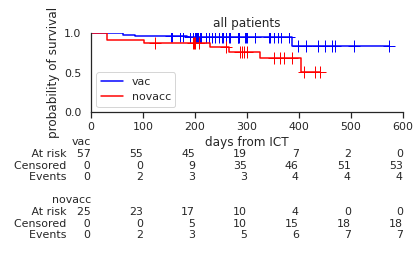

In [241]:
#plot all patients
save_name = 'landmark_from-ICT_survival.svg'
X = np.linspace(-6, 6, 1024)
fig, ax = plt.subplots()
plt.ylim(0, 1)
plt.xlim(0,600)
kmf_high.plot(ci_show=False, color='blue',show_censors=True)
kmf_low.plot(ci_show=False, color='red',show_censors=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
plt.title('all patients')
plt.xlabel('days from ICT')
plt.ylabel('probability of survival')

from lifelines.plotting import add_at_risk_counts
add_at_risk_counts(kmf_high, kmf_low, ax=ax)
plt.tight_layout()

save_path_complete = figure_save_path + str(results.p_value)+save_name
print('saved to:'+ str(results.p_value)+save_name)
plt.savefig(save_path_complete)
kmf_high.event_table.to_csv(figure_source_path+'landmark_survival_from_ICT'+'vacc.csv')
kmf_low.event_table.to_csv(figure_source_path+'landmark_survival_from_ICT'+'unvacc.csv')

In [242]:
#save event tables:
save_path_complete = DATA_DIR + save_name[:-4]+'_unvacc'+'.csv'
kmf_low.event_table.to_csv(save_path_complete)
print(save_path_complete[-30:])

k_from-ICT_survival_unvacc.csv


In [243]:
#save event tables:
save_path_complete = DATA_DIR + save_name[:-4]+'_vacc'+'.csv'
kmf_high.event_table.to_csv(save_path_complete)
print(save_path_complete[-30:])

ark_from-ICT_survival_vacc.csv


## survival before and after the landmark

In [244]:
#this section with code adapted from https://medium.com/towards-artificial-intelligence/survival-analysis-with-python-tutorial-how-what-when-and-why-19a5cfb3c312
import lifelines
from lifelines import KaplanMeierFitter
from lifelines import CoxPHFitter

In [245]:
landmark = '05/17/2021'
os_time_column = 'follow_up_from_ICT_days'
os_status_column = 'Survival_01.10.21'
subset_data = False
subset_column_label = 'vaccinated'
categorical = True
category_list = [False]
greater_equal_cutoff = True
cutoff_value = 25
save_name = 'survival_allpatients.svg'

In [246]:
#restrict to patients included before landmark
inclusion_from_landmark_time = pd.to_datetime(patient_table['date_inclusion']) - pd.to_datetime(landmark)
inclusion_from_landmark = [x.days for x in inclusion_from_landmark_time]
patient_table['inclusion_from_landmark'] = inclusion_from_landmark
patient_table_before_landmark = patient_table[patient_table['inclusion_from_landmark']<=0]

In [247]:
patient_table_before_landmark.columns

Index(['Sex', 'Age_at_inclusion', 'BMI', 'ECOG', 'private_insurance',
       'Tumor_type', 'Stage', 'Therapy_type', 'Therapy_Line', 'vaccinated',
       'First_dose_date', 'First_dose_vaccine', 'Second_dose_date',
       'Second_dose_vaccine', 'date_inclusion', 'last_immunotherapy',
       'last_follow_up', 'follow_up_from_ICT_days',
       'follow_up_from_first_dose_vaccine_days',
       'follow_up_from_second_dose_vaccine_days', 'color_code',
       'Survival_01.10.21', 'vaccine_type', 'time_from_ICT',
       'vacc_time_from_landmark', 'inclusion_time_from_landmark',
       'inclusion_from_landmark'],
      dtype='object')

In [248]:
#pre and post landmark survival time

survival_time_pre_landmark_list = []
survival_status_pre_landmark_list = []
survival_time_post_landmark_list = []
survival_status_post_landmark_list = []


for i in patient_table_before_landmark.index:
    prepost_subset = patient_table_before_landmark.loc[i,:]
    follow_up_from_landmark = pd.to_datetime(prepost_subset['last_follow_up']) - pd.to_datetime(landmark)
    if follow_up_from_landmark.days <0:
        survival_time_pre_landmark = pd.to_datetime(prepost_subset['last_follow_up'])-pd.to_datetime(prepost_subset['date_inclusion'])
        survival_time_pre_landmark_list.append(survival_time_pre_landmark)
        survival_status_pre_landmark = prepost_subset['Survival_01.10.21']
        survival_status_pre_landmark_list.append(survival_status_pre_landmark)
        survival_time_post_landmark = pd.to_datetime(landmark)-pd.to_datetime(landmark)
        survival_time_post_landmark_list.append(survival_time_post_landmark)
        survival_status_post_landmark = 'NA'
        survival_status_post_landmark_list.append(survival_status_post_landmark)
    else:
        survival_time_pre_landmark = pd.to_datetime(landmark)- pd.to_datetime(prepost_subset['date_inclusion']) 
        survival_time_pre_landmark_list.append(survival_time_pre_landmark)
        survival_status_pre_landmark = 0
        survival_status_pre_landmark_list.append(survival_status_pre_landmark)
        survival_time_post_landmark = pd.to_datetime(prepost_subset['last_follow_up'])-pd.to_datetime(landmark)
        survival_time_post_landmark_list.append(survival_time_post_landmark)
        survival_status_post_landmark = prepost_subset['Survival_01.10.21']
        survival_status_post_landmark_list.append(survival_status_post_landmark)

        
patient_table_before_landmark['survival_time_pre_landmark'] = [x.days for x in survival_time_pre_landmark_list]
patient_table_before_landmark['survival_status_pre_landmark'] = survival_status_pre_landmark_list
patient_table_before_landmark['survival_time_post_landmark'] =[x.days for x in survival_time_post_landmark_list]
patient_table_before_landmark['survival_status_post_landmark'] = survival_status_post_landmark_list

/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/446706588.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  patient_table_before_landmark['survival_time_pre_landmark'] = [x.days for x in survival_time_pre_landmark_list]
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/446706588.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  patient_table_before_landmark['survival_status_pre_landmark'] = survival_status_pre_landmark_list
/scratch/lsftmp/5615914.tmpdir/ipykernel_469213/446706588.py:34: SettingWithCopy

In [249]:
survival_time_post_landmark_list

[Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('31 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('29 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('74 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('51 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('49 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137 days 00:00:00'),
 Timedelta('137

### pre landmark survival

In [250]:
landmark

'05/17/2021'

In [251]:
os_time_column = 'survival_time_pre_landmark'
os_status_column = 'survival_status_pre_landmark'

In [252]:
patient_table_before_landmark.columns

Index(['Sex', 'Age_at_inclusion', 'BMI', 'ECOG', 'private_insurance',
       'Tumor_type', 'Stage', 'Therapy_type', 'Therapy_Line', 'vaccinated',
       'First_dose_date', 'First_dose_vaccine', 'Second_dose_date',
       'Second_dose_vaccine', 'date_inclusion', 'last_immunotherapy',
       'last_follow_up', 'follow_up_from_ICT_days',
       'follow_up_from_first_dose_vaccine_days',
       'follow_up_from_second_dose_vaccine_days', 'color_code',
       'Survival_01.10.21', 'vaccine_type', 'time_from_ICT',
       'vacc_time_from_landmark', 'inclusion_time_from_landmark',
       'inclusion_from_landmark', 'survival_time_pre_landmark',
       'survival_status_pre_landmark', 'survival_time_post_landmark',
       'survival_status_post_landmark'],
      dtype='object')

In [253]:
patient_table_before_landmark[['date_inclusion','survival_time_pre_landmark','last_follow_up','Survival_01.10.21']]

,date_inclusion,survival_time_pre_landmark,last_follow_up,Survival_01.10.21
Patient_ID,,,,
A8SRJO,2020-09-30,229,10/1/2021,0.0
L9YLRD,2020-12-04,164,10/1/2021,0.0
74WACU,2021-03-18,60,10/1/2021,0.0
SSW9Q1,2021-04-07,40,10/1/2021,0.0
7Z9V9Q,2021-04-16,31,6/17/2021,1.0
...,...,...,...,...
7F3S4X,2021-05-17,0,6/16/2021,1.0
C1ABPH,2020-09-25,234,10/1/2021,0.0
2DP8J8,2021-02-08,98,9/26/2021,1.0


In [254]:
#create an object for kaplan-meier-fitter
kmf= KaplanMeierFitter()

In [255]:
kmf.fit(durations = patient_table_before_landmark[os_time_column].astype(float), event_observed = patient_table_before_landmark[os_status_column].astype(float))

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 85 total observations, 83 right-censored observations>

In [256]:
if subset_data:
  if categorical:
    patient_table_before_landmark_subset = patient_table_before_landmark[patient_table_before_landmark[subset_column_label].isin(category_list)]
  else:
    if greater_equal_cutoff:
      patient_table_before_landmark_subset = patient_table_before_landmark[patient_table_before_landmark[subset_column_label]>=cutoff_value]
    else:
      patient_table_before_landmark_subset = patient_table_before_landmark[patient_table_before_landmark[subset_column_label]<cutoff_value]
  kmf.fit(durations = patient_table_before_landmark_subset[os_time_column], event_observed = patient_table_before_landmark_subset[os_status_column])
else:
    #fit the parameter values
    patient_table_before_landmark_subset = patient_table_before_landmark
    kmf.fit(durations = patient_table_before_landmark[os_time_column], event_observed = patient_table_before_landmark[os_status_column])

In [257]:
print('number of events is:', sum(patient_table_before_landmark_subset['Survival_01.10.21']))
print('total patient number is:', len(patient_table_before_landmark_subset['Survival_01.10.21']))

number of events is: 13.0
total patient number is: 85


In [258]:
set(patient_table_before_landmark_subset['Therapy_type'])

{'CTLA-4',
 'CTLA-4+PD-1',
 'ICT-->CTX',
 'PD-1/PD-L1',
 'PD-1/PD-L1+CTX',
 'PD-1/PD-L1+RTX',
 'PD-1/PD-L1+TKI',
 'PD-1/PD-L1+anti-VEGF',
 'other'}

In [259]:
#generate event table
kmf.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,1,0,1,85,85
14.0,1,0,1,0,84
17.0,1,0,1,0,83
18.0,1,0,1,0,82
31.0,1,0,1,0,81
...,...,...,...,...,...
326.0,1,0,1,0,5
333.0,1,0,1,0,4
370.0,1,0,1,0,3


Text(0, 0.5, 'probability of survival')

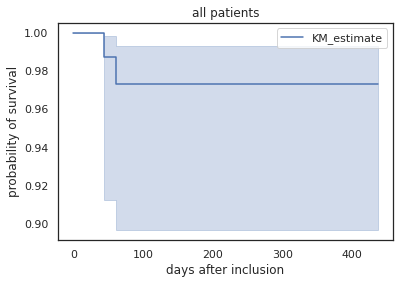

In [260]:
#plot all patients
kmf.plot()
plt.title('all patients')
plt.xlabel('days after inclusion')
plt.ylabel('probability of survival')

In [261]:
#split data
if subset_data:
  patients_vacc = patient_table_before_landmark_subset[patient_table_before_landmark_subset['vaccinated']]
  patients_novacc = patient_table_before_landmark_subset[~patient_table_before_landmark_subset['vaccinated']]
  print('all patients:', patient_table_before_landmark_subset.shape[0])
  print('vaccinated patients', patients_vacc.shape[0])
  print('unvaccinated patients', patients_novacc.shape[0])
else:
  patients_vacc = patient_table_before_landmark[patient_table_before_landmark['vaccinated']]
  patients_novacc = patient_table_before_landmark[patient_table_before_landmark['vaccinated']==False]
  print('all patients:', patient_table_before_landmark.shape[0])
  print('vaccinated patients', patients_vacc.shape[0])
  print('unvaccinated patients', patients_novacc.shape[0])

all patients: 85
vaccinated patients 62
unvaccinated patients 23


In [262]:
patient_table_before_landmark[patient_table_before_landmark['vaccinated']]

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,Survival_01.10.21,vaccine_type,time_from_ICT,vacc_time_from_landmark,inclusion_time_from_landmark,inclusion_from_landmark,survival_time_pre_landmark,survival_status_pre_landmark,survival_time_post_landmark,survival_status_post_landmark
Patient_ID,,,,,,,,,,,,,,,,,,,,,
A8SRJO,M,59.0,NaN,2.0,0.0,SKCM,IV,PD-1/PD-L1,1.0,True,...,0.0,Astra Zeneca,162.0,-67.0,-229,-229,229,0.0,137,0.0
L9YLRD,M,68.0,20.2,1.0,1.0,OSCC,III,PD-1/PD-L1,1.0,True,...,0.0,Astra Zeneca,135.0,-29.0,-164,-164,164,0.0,137,0.0
74WACU,F,61.0,22.6,1.0,0.0,AEG,IV,PD-1/PD-L1,1.0,True,...,0.0,Astra Zeneca,-8.0,-68.0,-60,-60,60,0.0,137,0.0
SSW9Q1,F,68.0,25.3,1.0,0.0,UVM,IV,PD-1/PD-L1,3.0,True,...,0.0,Astra Zeneca,11.0,-29.0,-40,-40,40,0.0,137,0.0
7Z9V9Q,M,76.0,24.3,1.0,0.0,"LUAD, ESCA",IV,PD-1/PD-L1,2.0,True,...,1.0,Astra Zeneca,12.0,-19.0,-31,-31,31,0.0,31,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RIRRZD,M,61.0,24.2,1.0,0.0,HNSC,III,PD-1/PD-L1+CTX,2.0,True,...,0.0,Moderna,6.0,-12.0,-18,-18,18,0.0,137,0.0
QH6V9I,M,67.0,27.6,1.0,0.0,KIRC,IV,PD-1/PD-L1+TKI,1.0,True,...,0.0,Moderna,37.0,-32.0,-69,-69,69,0.0,137,0.0
ULKZFC,M,77.0,28.3,0.0,1.0,KIRC,IV,PD-1/PD-L1+TKI,1.0,True,...,0.0,Moderna,16.0,-50.0,-66,-66,66,0.0,137,0.0


In [263]:
#fit the parameter values
kmf_high = KaplanMeierFitter()
kmf_low = KaplanMeierFitter()

kmf_high.fit(durations = patients_vacc[os_time_column], event_observed = patients_vacc[os_status_column],label='vac')
kmf_low.fit(durations = patients_novacc[os_time_column], event_observed = patients_novacc[os_status_column],label='novacc')

<lifelines.KaplanMeierFitter:"novacc", fitted with 23 total observations, 22 right-censored observations>

In [264]:
#variables for logrank
Time_A = patients_vacc[os_time_column]
Event_A = patients_vacc[os_status_column]

Time_B = patients_novacc[os_time_column]
Event_B = patients_novacc[os_status_column]

In [265]:
#logrank
from lifelines.statistics import logrank_test

results = logrank_test(Time_A, Time_B, event_observed_A=Event_A, event_observed_B=Event_B)
results.print_summary()
print('P value is:', results.p_value)

/home/wallet/miniconda3/envs/2022_ANTICIPATE_COVID-19/lib/python3.8/site-packages/lifelines/statistics.py:143: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  return self.summary.to_latex()


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           0.53 0.46      1.11

P value is: 0.46458004650287776


saved to:0.46458004650287776survival_pre_landmark.svg


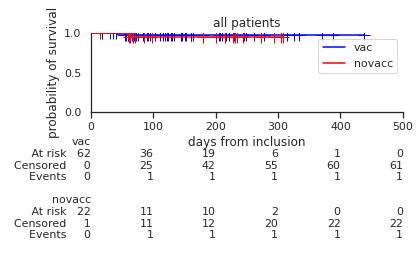

In [266]:
#plot all patients
save_name = 'survival_pre_landmark.svg'
X = np.linspace(-6, 6, 1024)
fig, ax = plt.subplots()
plt.ylim(0, 1)
plt.xlim(0,500)
kmf_high.plot(ci_show=False, color='blue',show_censors=True)
kmf_low.plot(ci_show=False, color='red',show_censors=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
plt.title('all patients')
plt.xlabel('days from inclusion')
plt.ylabel('probability of survival')

from lifelines.plotting import add_at_risk_counts
add_at_risk_counts(kmf_high, kmf_low, ax=ax)
plt.tight_layout()

save_path_complete = figure_save_path + str(results.p_value)+save_name
print('saved to:'+ str(results.p_value)+save_name)
plt.savefig(save_path_complete)
kmf_high.event_table.to_csv(figure_source_path+'survival_pre-landmark'+'vacc.csv')
kmf_low.event_table.to_csv(figure_source_path+'survival_pre-landmark'+'unvacc.csv')

In [267]:
#save event tables:
save_path_complete = DATA_DIR + save_name[:-4]+'_vacc'+'.csv'
kmf_high.event_table.to_csv(save_path_complete)
print(save_path_complete[-30:])

survival_pre_landmark_vacc.csv


In [268]:
#save event tables:
save_path_complete = DATA_DIR + save_name[:-4]+'_unvacc'+'.csv'
kmf_low.event_table.to_csv(save_path_complete)
print(save_path_complete[-30:])

rvival_pre_landmark_unvacc.csv


### post landmark survival

In [269]:
patient_table_before_landmark_survived_landmark =  patient_table_before_landmark[patient_table_before_landmark['survival_time_post_landmark']>0]
patient_table_before_landmark_survived_landmark

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,Survival_01.10.21,vaccine_type,time_from_ICT,vacc_time_from_landmark,inclusion_time_from_landmark,inclusion_from_landmark,survival_time_pre_landmark,survival_status_pre_landmark,survival_time_post_landmark,survival_status_post_landmark
Patient_ID,,,,,,,,,,,,,,,,,,,,,
A8SRJO,M,59.0,NaN,2.0,0.0,SKCM,IV,PD-1/PD-L1,1.0,True,...,0.0,Astra Zeneca,162.0,-67.0,-229,-229,229,0.0,137,0.0
L9YLRD,M,68.0,20.2,1.0,1.0,OSCC,III,PD-1/PD-L1,1.0,True,...,0.0,Astra Zeneca,135.0,-29.0,-164,-164,164,0.0,137,0.0
74WACU,F,61.0,22.6,1.0,0.0,AEG,IV,PD-1/PD-L1,1.0,True,...,0.0,Astra Zeneca,-8.0,-68.0,-60,-60,60,0.0,137,0.0
SSW9Q1,F,68.0,25.3,1.0,0.0,UVM,IV,PD-1/PD-L1,3.0,True,...,0.0,Astra Zeneca,11.0,-29.0,-40,-40,40,0.0,137,0.0
7Z9V9Q,M,76.0,24.3,1.0,0.0,"LUAD, ESCA",IV,PD-1/PD-L1,2.0,True,...,1.0,Astra Zeneca,12.0,-19.0,-31,-31,31,0.0,31,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7F3S4X,F,60.0,22.4,3.0,0.0,BRCA,IV,PD-1/PD-L1+CTX,1.0,False,...,1.0,NA,NaN,NaN,0,0,0,0.0,30,1.0
C1ABPH,M,69.0,18.7,2.0,0.0,"NSCLC, HNSC",II,PD-1/PD-L1+CTX,2.0,False,...,0.0,NA,NaN,NaN,-234,-234,234,0.0,137,0.0
2DP8J8,M,58.0,29.4,0.0,0.0,AEG,II,PD-1/PD-L1+CTX,1.0,False,...,1.0,NA,NaN,NaN,-98,-98,98,0.0,132,1.0


In [270]:
landmark

'05/17/2021'

In [271]:
os_time_column = 'survival_time_post_landmark'
os_status_column = 'survival_status_post_landmark'

In [272]:
patient_table_before_landmark_survived_landmark.columns

Index(['Sex', 'Age_at_inclusion', 'BMI', 'ECOG', 'private_insurance',
       'Tumor_type', 'Stage', 'Therapy_type', 'Therapy_Line', 'vaccinated',
       'First_dose_date', 'First_dose_vaccine', 'Second_dose_date',
       'Second_dose_vaccine', 'date_inclusion', 'last_immunotherapy',
       'last_follow_up', 'follow_up_from_ICT_days',
       'follow_up_from_first_dose_vaccine_days',
       'follow_up_from_second_dose_vaccine_days', 'color_code',
       'Survival_01.10.21', 'vaccine_type', 'time_from_ICT',
       'vacc_time_from_landmark', 'inclusion_time_from_landmark',
       'inclusion_from_landmark', 'survival_time_pre_landmark',
       'survival_status_pre_landmark', 'survival_time_post_landmark',
       'survival_status_post_landmark'],
      dtype='object')

In [273]:
patient_table_before_landmark_survived_landmark[['date_inclusion','survival_time_pre_landmark','last_follow_up','Survival_01.10.21']]

,date_inclusion,survival_time_pre_landmark,last_follow_up,Survival_01.10.21
Patient_ID,,,,
A8SRJO,2020-09-30,229,10/1/2021,0.0
L9YLRD,2020-12-04,164,10/1/2021,0.0
74WACU,2021-03-18,60,10/1/2021,0.0
SSW9Q1,2021-04-07,40,10/1/2021,0.0
7Z9V9Q,2021-04-16,31,6/17/2021,1.0
...,...,...,...,...
7F3S4X,2021-05-17,0,6/16/2021,1.0
C1ABPH,2020-09-25,234,10/1/2021,0.0
2DP8J8,2021-02-08,98,9/26/2021,1.0


In [274]:
#create an object for kaplan-meier-fitter
kmf= KaplanMeierFitter()

In [275]:
kmf.fit(durations = patient_table_before_landmark_survived_landmark[os_time_column].astype(float), event_observed = patient_table_before_landmark_survived_landmark[os_status_column].astype(float))

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 82 total observations, 71 right-censored observations>

In [276]:
if subset_data:
  if categorical:
    patient_table_before_landmark_survived_landmark_subset = patient_table_before_landmark_survived_landmark[patient_table_before_landmark_survived_landmark[subset_column_label].isin(category_list)]
  else:
    if greater_equal_cutoff:
      patient_table_before_landmark_survived_landmark_subset = patient_table_before_landmark_survived_landmark[patient_table_before_landmark_survived_landmark[subset_column_label]>=cutoff_value]
    else:
      patient_table_before_landmark_survived_landmark_subset = patient_table_before_landmark_survived_landmark[patient_table_before_landmark_survived_landmark[subset_column_label]<cutoff_value]
  kmf.fit(durations = patient_table_before_landmark_survived_landmark_subset[os_time_column], event_observed = patient_table_before_landmark_survived_landmark_subset[os_status_column])
else:
    #fit the parameter values
    patient_table_before_landmark_survived_landmark_subset = patient_table_before_landmark_survived_landmark
    kmf.fit(durations = patient_table_before_landmark_survived_landmark[os_time_column], event_observed = patient_table_before_landmark_survived_landmark[os_status_column])

/home/wallet/miniconda3/envs/2022_ANTICIPATE_COVID-19/lib/python3.8/site-packages/lifelines/utils/__init__.py:1188: UserWarning: Attempting to convert an unexpected datatype 'object' to float. Suggestion: 1) use `lifelines.utils.datetimes_to_durations` to do conversions or 2) manually convert to floats/booleans.
  warnings.warn(warning_text, UserWarning)


In [277]:
print('number of events is:', sum(patient_table_before_landmark_survived_landmark_subset['Survival_01.10.21']))
print('total patient number is:', len(patient_table_before_landmark_survived_landmark_subset['Survival_01.10.21']))

number of events is: 11.0
total patient number is: 82


In [278]:
set(patient_table_before_landmark_survived_landmark_subset['Therapy_type'])

{'CTLA-4',
 'CTLA-4+PD-1',
 'ICT-->CTX',
 'PD-1/PD-L1',
 'PD-1/PD-L1+CTX',
 'PD-1/PD-L1+RTX',
 'PD-1/PD-L1+TKI',
 'PD-1/PD-L1+anti-VEGF',
 'other'}

In [279]:
#generate event table
kmf.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,82,82
16.0,1,1,0,0,82
29.0,1,1,0,0,81
30.0,1,1,0,0,80
31.0,1,1,0,0,79
36.0,1,1,0,0,78
49.0,1,0,1,0,77
51.0,1,1,0,0,76
63.0,1,0,1,0,75


Text(0, 0.5, 'probability of survival')

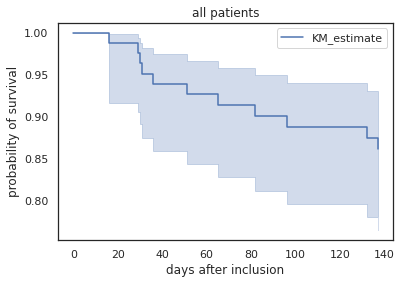

In [280]:
#plot all patients
kmf.plot()
plt.title('all patients')
plt.xlabel('days after inclusion')
plt.ylabel('probability of survival')

In [281]:
#split data
if subset_data:
  patients_vacc = patient_table_before_landmark_survived_landmark_subset[patient_table_before_landmark_survived_landmark_subset['vaccinated']]
  patients_novacc = patient_table_before_landmark_survived_landmark_subset[~patient_table_before_landmark_survived_landmark_subset['vaccinated']]
  print('all patients:', patient_table_before_landmark_survived_landmark_subset.shape[0])
  print('vaccinated patients', patients_vacc.shape[0])
  print('unvaccinated patients', patients_novacc.shape[0])
else:
  patients_vacc = patient_table_before_landmark_survived_landmark[patient_table_before_landmark_survived_landmark['vaccinated']]
  patients_novacc = patient_table_before_landmark_survived_landmark[patient_table_before_landmark_survived_landmark['vaccinated']==False]
  print('all patients:', patient_table_before_landmark_survived_landmark.shape[0])
  print('vaccinated patients', patients_vacc.shape[0])
  print('unvaccinated patients', patients_novacc.shape[0])

all patients: 82
vaccinated patients 61
unvaccinated patients 21


In [282]:
patient_table_before_landmark_survived_landmark[patient_table_before_landmark_survived_landmark['vaccinated']]

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,Survival_01.10.21,vaccine_type,time_from_ICT,vacc_time_from_landmark,inclusion_time_from_landmark,inclusion_from_landmark,survival_time_pre_landmark,survival_status_pre_landmark,survival_time_post_landmark,survival_status_post_landmark
Patient_ID,,,,,,,,,,,,,,,,,,,,,
A8SRJO,M,59.0,NaN,2.0,0.0,SKCM,IV,PD-1/PD-L1,1.0,True,...,0.0,Astra Zeneca,162.0,-67.0,-229,-229,229,0.0,137,0.0
L9YLRD,M,68.0,20.2,1.0,1.0,OSCC,III,PD-1/PD-L1,1.0,True,...,0.0,Astra Zeneca,135.0,-29.0,-164,-164,164,0.0,137,0.0
74WACU,F,61.0,22.6,1.0,0.0,AEG,IV,PD-1/PD-L1,1.0,True,...,0.0,Astra Zeneca,-8.0,-68.0,-60,-60,60,0.0,137,0.0
SSW9Q1,F,68.0,25.3,1.0,0.0,UVM,IV,PD-1/PD-L1,3.0,True,...,0.0,Astra Zeneca,11.0,-29.0,-40,-40,40,0.0,137,0.0
7Z9V9Q,M,76.0,24.3,1.0,0.0,"LUAD, ESCA",IV,PD-1/PD-L1,2.0,True,...,1.0,Astra Zeneca,12.0,-19.0,-31,-31,31,0.0,31,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
QLWN64,M,52.0,31.1,0.0,0.0,KIRC,I,PD-1/PD-L1+TKI,1.0,True,...,0.0,Comirnaty,39.0,-29.0,-68,-68,68,0.0,137,0.0
RIRRZD,M,61.0,24.2,1.0,0.0,HNSC,III,PD-1/PD-L1+CTX,2.0,True,...,0.0,Moderna,6.0,-12.0,-18,-18,18,0.0,137,0.0
QH6V9I,M,67.0,27.6,1.0,0.0,KIRC,IV,PD-1/PD-L1+TKI,1.0,True,...,0.0,Moderna,37.0,-32.0,-69,-69,69,0.0,137,0.0


In [283]:
#fit the parameter values
kmf_high = KaplanMeierFitter()
kmf_low = KaplanMeierFitter()

kmf_high.fit(durations = patients_vacc[os_time_column], event_observed = patients_vacc[os_status_column],label='vac')
kmf_low.fit(durations = patients_novacc[os_time_column], event_observed = patients_novacc[os_status_column],label='novacc')

/home/wallet/miniconda3/envs/2022_ANTICIPATE_COVID-19/lib/python3.8/site-packages/lifelines/utils/__init__.py:1188: UserWarning: Attempting to convert an unexpected datatype 'object' to float. Suggestion: 1) use `lifelines.utils.datetimes_to_durations` to do conversions or 2) manually convert to floats/booleans.
  warnings.warn(warning_text, UserWarning)
/home/wallet/miniconda3/envs/2022_ANTICIPATE_COVID-19/lib/python3.8/site-packages/lifelines/utils/__init__.py:1188: UserWarning: Attempting to convert an unexpected datatype 'object' to float. Suggestion: 1) use `lifelines.utils.datetimes_to_durations` to do conversions or 2) manually convert to floats/booleans.
  warnings.warn(warning_text, UserWarning)


<lifelines.KaplanMeierFitter:"novacc", fitted with 21 total observations, 14 right-censored observations>

In [284]:
kmf_high.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,61,61
29.0,1,1,0,0,61
31.0,1,1,0,0,60
49.0,1,0,1,0,59
51.0,1,1,0,0,58
74.0,1,0,1,0,57
137.0,56,1,55,0,56


In [285]:
#variables for logrank
Time_A = patients_vacc[os_time_column]
Event_A = patients_vacc[os_status_column]

Time_B = patients_novacc[os_time_column]
Event_B = patients_novacc[os_status_column]

In [286]:
#logrank
from lifelines.statistics import logrank_test

results = logrank_test(Time_A, Time_B, event_observed_A=Event_A, event_observed_B=Event_B)
results.print_summary()
print('P value is:', results.p_value)

/home/wallet/miniconda3/envs/2022_ANTICIPATE_COVID-19/lib/python3.8/site-packages/lifelines/statistics.py:143: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  return self.summary.to_latex()


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          10.97 <0.005     10.07

P value is: 0.0009278557549291249


In [287]:
kmf_low.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,21,21
16.0,1,1,0,0,21
30.0,1,1,0,0,20
36.0,1,1,0,0,19
63.0,1,0,1,0,18
64.0,1,0,1,0,17
65.0,1,1,0,0,16
82.0,1,1,0,0,15
96.0,1,1,0,0,14


saved to:0.0009278557549291249survival_post_landmark.svg


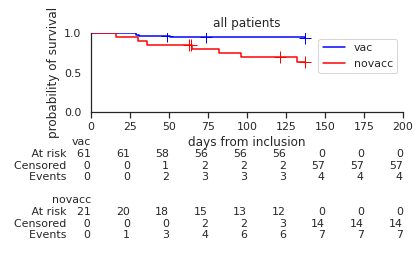

In [288]:
#plot all patients
save_name = 'survival_post_landmark.svg'
X = np.linspace(-6, 6, 1024)
fig, ax = plt.subplots()
plt.ylim(0, 1)
plt.xlim(0,200)
kmf_high.plot(ci_show=False, color='blue',show_censors=True)
kmf_low.plot(ci_show=False, color='red',show_censors=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
plt.title('all patients')
plt.xlabel('days from inclusion')
plt.ylabel('probability of survival')

from lifelines.plotting import add_at_risk_counts
add_at_risk_counts(kmf_high, kmf_low, ax=ax)
plt.tight_layout()

save_path_complete = figure_save_path + str(results.p_value)+save_name
print('saved to:'+ str(results.p_value)+save_name)
plt.savefig(save_path_complete)

In [289]:
#save event tables:
save_path_complete = DATA_DIR + save_name[:-4]+'_vacc'+'.csv'
kmf_high.event_table.to_csv(save_path_complete)
print(save_path_complete[-30:])

urvival_post_landmark_vacc.csv


In [290]:
#save event tables:
save_path_complete = DATA_DIR + save_name[:-4]+'_unvacc'+'.csv'
kmf_low.event_table.to_csv(save_path_complete)
print(save_path_complete[-30:])

vival_post_landmark_unvacc.csv


## cox model

In [17]:
#paths and parameters
os_time_column = 'follow_up_from_ICT_days'
os_status_column = 'Survival_01.10.21'

In [18]:
patient_table = pd.read_csv(patient_table_path, index_col='Patient_ID')
patient_table = patient_table[~patient_table.index.isna()]
patient_table

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,Second_dose_date,Second_dose_vaccine,date_inclusion,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,follow_up_from_second_dose_vaccine_days,color_code,Survival_01.10.21
Patient_ID,,,,,,,,,,,,,,,,,,,,,
A8SRJO,M,59.0,NaN,2.0,0.0,SKCM,IV,PD-1/PD-L1,1.0,True,...,5/25/2021,Astra Zeneca,9/30/2020,10/1/2021,10/1/2021,366.0,204.0,129.00,#997D87,0.0
L9YLRD,M,68.0,20.2,1.0,1.0,OSCC,III,PD-1/PD-L1,1.0,True,...,7/11/2021,Astra Zeneca,12/4/2020,10/1/2021,10/1/2021,301.0,166.0,82.00,#61615A,0.0
74WACU,F,61.0,22.6,1.0,0.0,AEG,IV,PD-1/PD-L1,1.0,True,...,5/10/2021,Astra Zeneca,3/18/2021,10/1/2021,10/1/2021,197.0,205.0,144.00,#788D66,0.0
SSW9Q1,F,68.0,25.3,1.0,0.0,UVM,IV,PD-1/PD-L1,3.0,True,...,7/11/2021,Astra Zeneca,4/7/2021,5/5/2021,10/1/2021,177.0,166.0,82.00,#886F4C,0.0
7Z9V9Q,M,76.0,24.3,1.0,0.0,"LUAD, ESCA",IV,PD-1/PD-L1,2.0,True,...,6/9/2021,Astra Zeneca,4/16/2021,6/11/2021,6/17/2021,62.0,50.0,8.00,#B4A8BD,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C1ABPH,M,69.0,18.7,2.0,0.0,"NSCLC, HNSC",II,PD-1/PD-L1+CTX,2.0,False,...,NaN,NaN,9/25/2020,1/28/2021,10/1/2021,371.0,NaN,#VALUE!,#F1FE76,0.0
2DP8J8,M,58.0,29.4,0.0,0.0,AEG,II,PD-1/PD-L1+CTX,1.0,False,...,NaN,NaN,2/8/2021,8/24/2021,9/26/2021,230.0,NaN,#VALUE!,#CFB70A,1.0
KQQNSB,M,60.0,30.9,0.0,0.0,KIRC,III,PD-1/PD-L1+TKI,1.0,False,...,NaN,NaN,10/2/2020,8/10/2021,10/1/2021,364.0,NaN,#VALUE!,#BC41A1,0.0


In [19]:
df = patient_table
#df_save_path = covid_2nd_dose_leuko_path

#function to define nans

vaccine_type = {}
for i in patient_table.index: 
  a = patient_table.loc[i,'First_dose_vaccine']
  b = patient_table.loc[i,'Second_dose_vaccine']
  if isna(a):
    vaccine_type[i]='NA'
  elif isna(b):
    vaccine_type[i]=a
  elif a==b:
      vaccine_type[i]=a
  else:
    vaccine_type[i]='heterologous'

df['vaccine_type'] = df.index.map(vaccine_type)
#df.to_csv(df_save_path)
df

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,Second_dose_vaccine,date_inclusion,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,follow_up_from_second_dose_vaccine_days,color_code,Survival_01.10.21,vaccine_type
Patient_ID,,,,,,,,,,,,,,,,,,,,,
A8SRJO,M,59.0,NaN,2.0,0.0,SKCM,IV,PD-1/PD-L1,1.0,True,...,Astra Zeneca,9/30/2020,10/1/2021,10/1/2021,366.0,204.0,129.00,#997D87,0.0,Astra Zeneca
L9YLRD,M,68.0,20.2,1.0,1.0,OSCC,III,PD-1/PD-L1,1.0,True,...,Astra Zeneca,12/4/2020,10/1/2021,10/1/2021,301.0,166.0,82.00,#61615A,0.0,Astra Zeneca
74WACU,F,61.0,22.6,1.0,0.0,AEG,IV,PD-1/PD-L1,1.0,True,...,Astra Zeneca,3/18/2021,10/1/2021,10/1/2021,197.0,205.0,144.00,#788D66,0.0,Astra Zeneca
SSW9Q1,F,68.0,25.3,1.0,0.0,UVM,IV,PD-1/PD-L1,3.0,True,...,Astra Zeneca,4/7/2021,5/5/2021,10/1/2021,177.0,166.0,82.00,#886F4C,0.0,Astra Zeneca
7Z9V9Q,M,76.0,24.3,1.0,0.0,"LUAD, ESCA",IV,PD-1/PD-L1,2.0,True,...,Astra Zeneca,4/16/2021,6/11/2021,6/17/2021,62.0,50.0,8.00,#B4A8BD,1.0,Astra Zeneca
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C1ABPH,M,69.0,18.7,2.0,0.0,"NSCLC, HNSC",II,PD-1/PD-L1+CTX,2.0,False,...,NaN,9/25/2020,1/28/2021,10/1/2021,371.0,NaN,#VALUE!,#F1FE76,0.0,NA
2DP8J8,M,58.0,29.4,0.0,0.0,AEG,II,PD-1/PD-L1+CTX,1.0,False,...,NaN,2/8/2021,8/24/2021,9/26/2021,230.0,NaN,#VALUE!,#CFB70A,1.0,NA
KQQNSB,M,60.0,30.9,0.0,0.0,KIRC,III,PD-1/PD-L1+TKI,1.0,False,...,NaN,10/2/2020,8/10/2021,10/1/2021,364.0,NaN,#VALUE!,#BC41A1,0.0,NA


In [20]:
#adjust categories for cox model
data = patient_table.copy()

stage_dict = {'<IV':0, 'I':0, 'IB':0, 'II':0, 'IIA':0, 'IIB':0, 'III':0, 'IIIB':0, 
 'IIIC':0, 'IV':1, 'IVA':1}
sex_dict = {'F':1,'M':0}
ECOG_dict = {0:0,1:1,2:1,3:1}
vaccinated_dict = {True:1,False:0}
tumor_type_dict = {'ACA':0,
 'ACC':0,
 'AEG':0,
 'BRCA':0,
 'CHOL':0,
 'CUP':0,
 'DSCC':0,
 'ESCA':0,
 'HNMM':0,
 'HNSC':0,
 'KIRC':0,
 'KIRP':0,
 'LIHC':0,
 'LUAD':0,
 'LUAD, ESCA':0,
 'MER':0,
 'NEC':0,
 'NET':0,
 'NSCLC, HNSC':0,
 'OSCC':0,
 'PAAD':0,
 'RCC':0,
 'SKCM':1,
 'STAD':0,
 'UCA':0,
 'UVM':0}
Therapy_dict = {'PD-1/PD-L1':1,
                'CTLA-4':0,
 'CTLA-4+PD-1':0,
 'ICT-->CTX':0,
 'PD-1/PD-L1+CTX':0,
 'PD-1/PD-L1+RTX':0,
 'PD-1/PD-L1+TKI':0,
 'PD-1/PD-L1+anti-VEGF':0,
 'other':0}
Therapy_Line_dict = {1:0,2:1,3:1,4:1,5:1,6:1,7:1,8:1}
data['ECOG'] = data['ECOG'].map(ECOG_dict).astype(float)
data['Therapy_Line'] = data['Therapy_Line'].map(Therapy_Line_dict).astype(float)
data['Therapy_type'] = data['Therapy_type'].map(Therapy_dict).astype(float)
data['Stage'] = data['Stage'].map(stage_dict).astype(float)
data['Sex'] = data['Sex'].map(sex_dict).astype(float)
data['vaccinated'] = data['vaccinated'].map(vaccinated_dict).astype(float)
data['Tumor_type'] = data['Tumor_type'].map(tumor_type_dict)
data['Age_at_inclusion'] = (data['Age_at_inclusion']>60).astype(int)

columns_to_drop = ['First_dose_date', 'First_dose_vaccine',
       'Second_dose_date', 'Second_dose_vaccine', 'date_inclusion','follow_up_from_second_dose_vaccine_days',
       'last_immunotherapy', 'last_follow_up',
       'follow_up_from_first_dose_vaccine_days', 'color_code','BMI','vaccine_type',
                  'time_from_ICT']


#convert categories into dummy columns
data = data.drop(columns=[x for x in columns_to_drop if x in data.columns])
#data=data.dropna()
data

,Sex,Age_at_inclusion,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,follow_up_from_ICT_days,Survival_01.10.21
Patient_ID,,,,,,,,,,,
A8SRJO,0.0,0,1.0,0.0,1,1.0,1.0,0.0,1.0,366.0,0.0
L9YLRD,0.0,1,1.0,1.0,0,0.0,1.0,0.0,1.0,301.0,0.0
74WACU,1.0,1,1.0,0.0,0,1.0,1.0,0.0,1.0,197.0,0.0
SSW9Q1,1.0,1,1.0,0.0,0,1.0,1.0,1.0,1.0,177.0,0.0
7Z9V9Q,0.0,1,1.0,0.0,0,1.0,1.0,1.0,1.0,62.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
C1ABPH,0.0,1,1.0,0.0,0,0.0,0.0,1.0,0.0,371.0,0.0
2DP8J8,0.0,0,0.0,0.0,0,0.0,0.0,0.0,0.0,230.0,1.0
KQQNSB,0.0,0,0.0,0.0,0,0.0,0.0,0.0,0.0,364.0,0.0


In [21]:
#save data
data.to_csv(DATA_DIR + 'table_for_hazard_ratios.csv')
np.sum(data['Survival_01.10.21'])


14.0

In [22]:
from lifelines import CoxPHFitter

In [23]:
#fit data
kmf=KaplanMeierFitter()
kmf.fit(durations = data[os_time_column],event_observed= data[os_status_column])
kmf.event_table


NameError: name 'KaplanMeierFitter' is not defined

In [24]:
data.isna().any()

Sex                        False
Age_at_inclusion           False
ECOG                       False
private_insurance          False
Tumor_type                 False
Stage                      False
Therapy_type               False
Therapy_Line               False
vaccinated                 False
follow_up_from_ICT_days    False
Survival_01.10.21          False
dtype: bool

In [34]:
data.columns

Index(['Sex', 'Age_at_inclusion', 'ECOG', 'private_insurance', 'Tumor_type',
       'Stage', 'Therapy_type', 'Therapy_Line', 'vaccinated',
       'follow_up_from_ICT_days', 'Survival_01.10.21'],
      dtype='object')

In [36]:
data[data['Age_at_inclusion']==0]['Survival_01.10.21'].value_counts()

0.0    28
1.0     5
Name: Survival_01.10.21, dtype: int64

In [26]:
#get the summary using CoxPH Fitter:
cph = CoxPHFitter()
cph.fit(data, os_time_column, event_col=os_status_column)
cph.print_summary()

/home/wallet/miniconda3/envs/2022_ANTICIPATE_COVID-19/lib/python3.8/site-packages/lifelines/utils/printer.py:62: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  return summary_df[columns].to_latex(float_format="%." + str(self.decimals) + "f")


<lifelines.CoxPHFitter: fitted with 90 total observations, 76 right-censored observations>
             duration col = 'follow_up_from_ICT_days'
                event col = 'Survival_01.10.21'
      baseline estimation = breslow
   number of observations = 90
number of events observed = 14
   partial log-likelihood = -48.21
         time fit was run = 2022-05-01 01:40:15 UTC

---
                    coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                 
Sex                -0.34       0.71       0.73            -1.76             1.09                 0.17                 2.96
Age_at_inclusion   -0.25       0.78       0.67            -1.55             1.05                 0.21                 2.87
ECOG                1.35       3.87       1.15            -0.90             3.60                 0.41                36.76
private_insurance  -0.73       0.48       0.86            -2.41             0.96                 0.09                 2.60
Tumor_type         -0.34       0.71       0.73            -1.77             1.09                 0.17                 2.97
Stage              -0.23       0.80       0.67            -1.53             1.08                 0.22                 2.95
Therapy_type        0.03       1.03       0.67            -1.27             1.34                 0.28                 3.82
Therapy_Line        1.21       3.36       0.64            -0.04             2.46                 0.96                11.75
vaccinated         -1.72       0.18       0.64            -2.97            -0.46                 0.05                 0.63

                      z    p   -log2(p)
covariate                              
Sex               -0.46 0.64       0.64
Age_at_inclusion  -0.38 0.71       0.50
ECOG               1.18 0.24       2.07
private_insurance -0.85 0.40       1.33
Tumor_type        -0.47 0.64       0.64
Stage             -0.34 0.74       0.44
Therapy_type       0.05 0.96       0.06
Therapy_Line       1.90 0.06       4.11
vaccinated        -2.68 0.01       7.09
---
Concordance = 0.80
Partial AIC = 114.41
log-likelihood ratio test = 15.16 on 9 df
-log2(p) of ll-ratio test = 3.53

cox.svg


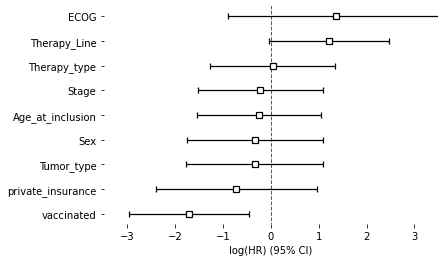

In [27]:
save_name = 'cox.svg'
figure_save_path_complete = figure_save_path+save_name
fig, axes = plt.subplots()
fig = cph.plot()
axes.set_xlim([-3.5, 3.5])
axes.spines['top'].set_visible(False)
axes.spines['right'].set_visible(False)
axes.spines['bottom'].set_visible(False)
axes.spines['left'].set_visible(False)
plt.savefig(figure_save_path_complete)
print(save_name)

In [30]:
figure_save_path

'/data/peer/wallet/Jupyter/ANTICIPATE_COVID-19_final/ANTICIPATE_COVID-19/data/figures/'

In [28]:
cph.check_assumptions(data, p_value_threshold=0.05, show_plots=True)

Proportional hazard assumption looks okay.


/home/wallet/miniconda3/envs/2022_ANTICIPATE_COVID-19/lib/python3.8/site-packages/lifelines/fitters/mixins.py:108: FutureWarning: Index.__and__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__and__.  Use index.intersection(other) instead.
  for variable in self.params_.index & (columns or self.params_.index):


[]

# propensity score matching (vaccinated ~ Age+Sex+ECOG)

In [302]:
#unfortunately we have to downgrade pandas for this package
#!pip install pandas==0.23.4

#or use this method from CarlosDullius

#go to package directory and edit Matcher.py file:
#replace the following:
#return (y == preds).sum() * 1.0 / len(y)
#with this:
#return (y.to_numpy().T == preds).sum() * 1.0 / len(y)

In [303]:
import warnings
warnings.filterwarnings('ignore')
from pymatch.Matcher import Matcher
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import datetime

In [304]:
#enter here directory path containing the data

long_term_ae_path = DATA_DIR + 'ANTICIPATE_cohort1_longterm_AE_all_v6.csv'

patient_table_path = DATA_DIR + 'ANTICIPATE_cohort1_patient_info_all_v7.csv' #revised manuscript

patients_to_remove = ['3LPKO0',
'N8V2OD' ,
'ZGNF1D'  ,
'0SSMCL',
'9R3KE7',
'688HB6']

In [305]:
patient_table = pd.read_csv(patient_table_path,index_col='Patient_ID')
patient_table = patient_table[~patient_table.index.isin(patients_to_remove)]
patient_table

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,Second_dose_date,Second_dose_vaccine,date_inclusion,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,follow_up_from_second_dose_vaccine_days,color_code,Survival_01.10.21
Patient_ID,,,,,,,,,,,,,,,,,,,,,
A8SRJO,M,59.0,NaN,2.0,0.0,SKCM,IV,PD-1/PD-L1,1.0,True,...,5/25/2021,Astra Zeneca,9/30/2020,10/1/2021,10/1/2021,366.0,204.0,129.00,#997D87,0.0
L9YLRD,M,68.0,20.2,1.0,1.0,OSCC,III,PD-1/PD-L1,1.0,True,...,7/11/2021,Astra Zeneca,12/4/2020,10/1/2021,10/1/2021,301.0,166.0,82.00,#61615A,0.0
74WACU,F,61.0,22.6,1.0,0.0,AEG,IV,PD-1/PD-L1,1.0,True,...,5/10/2021,Astra Zeneca,3/18/2021,10/1/2021,10/1/2021,197.0,205.0,144.00,#788D66,0.0
SSW9Q1,F,68.0,25.3,1.0,0.0,UVM,IV,PD-1/PD-L1,3.0,True,...,7/11/2021,Astra Zeneca,4/7/2021,5/5/2021,10/1/2021,177.0,166.0,82.00,#886F4C,0.0
7Z9V9Q,M,76.0,24.3,1.0,0.0,"LUAD, ESCA",IV,PD-1/PD-L1,2.0,True,...,6/9/2021,Astra Zeneca,4/16/2021,6/11/2021,6/17/2021,62.0,50.0,8.00,#B4A8BD,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [306]:
#remove nan
patient_table = patient_table[~patient_table.index.isna()]

In [307]:
patient_table.columns

Index(['Sex', 'Age_at_inclusion', 'BMI', 'ECOG', 'private_insurance',
       'Tumor_type', 'Stage', 'Therapy_type', 'Therapy_Line', 'vaccinated',
       'First_dose_date', 'First_dose_vaccine', 'Second_dose_date',
       'Second_dose_vaccine', 'date_inclusion', 'last_immunotherapy',
       'last_follow_up', 'follow_up_from_ICT_days',
       'follow_up_from_first_dose_vaccine_days',
       'follow_up_from_second_dose_vaccine_days', 'color_code',
       'Survival_01.10.21'],
      dtype='object')

In [308]:
#calculate vacc timepoint from inclusion
patient_table['First_dose_date'] = pd.to_datetime(patient_table['First_dose_date'],format="%m/%d/%Y")
patient_table['Second_dose_date'] = pd.to_datetime(patient_table['Second_dose_date'],format="%m/%d/%Y")
patient_table['date_inclusion'] = pd.to_datetime(patient_table['date_inclusion'],format="%m/%d/%Y")

In [309]:
#date of inclusion
df = patient_table
dates = list(df.sort_values('date_inclusion')['date_inclusion'])
print('med. follow-up from ICT start:',np.median(df['follow_up_from_ICT_days']))
print('min follow-up from ICT start:',min(df['follow_up_from_ICT_days']))
print('max follow-up from ICT start:',max(df['follow_up_from_ICT_days']))
print('first  patient accrued:',dates[0])
print('last  patient accrued:',dates[-1])
print('50% of  patients in accrual date ', dates[len(dates)//2])

med. follow-up from ICT start: 243.0
min follow-up from ICT start: 30.0
max follow-up from ICT start: 574.0
first  patient accrued: 2020-03-06 00:00:00
last  patient accrued: 2021-07-20 00:00:00
50% of  patients in accrual date  2021-01-21 00:00:00


In [310]:
#date of inclusion
df = patient_table[patient_table['vaccinated']==True]
dates = list(df.sort_values('date_inclusion')['date_inclusion'])
print('med. follow-up from ICT start:',np.median(df['follow_up_from_ICT_days']))
print('min follow-up from ICT start:',min(df['follow_up_from_ICT_days']))
print('max follow-up from ICT start:',max(df['follow_up_from_ICT_days']))
print('med. follow-up from 1st vacc start:',np.median(df['follow_up_from_first_dose_vaccine_days']))
print('min follow-up from 1st vacc start:',min(df['follow_up_from_first_dose_vaccine_days']))
print('max follow-up from 1st vacc start:',max(df['follow_up_from_first_dose_vaccine_days']))
print('first vaccinated patient accrued:',dates[0])
print('last vaccinated patient accrued:',dates[-1])
print('50% of vaccinated patients in accrual date ', dates[len(dates)//2])

med. follow-up from ICT start: 254.0
min follow-up from ICT start: 44.0
max follow-up from ICT start: 574.0
med. follow-up from 1st vacc start: 169.0
min follow-up from 1st vacc start: 24.0
max follow-up from 1st vacc start: 259.0
first vaccinated patient accrued: 2020-03-06 00:00:00
last vaccinated patient accrued: 2021-05-27 00:00:00
50% of vaccinated patients in accrual date  2021-01-19 00:00:00


In [311]:
#date of inclusion
df = patient_table[patient_table['vaccinated']==False]
dates = list(df.sort_values('date_inclusion')['date_inclusion'])
print('med. follow-up from ICT start:',np.median(df['follow_up_from_ICT_days']))
print('min follow-up from ICT start:',min(df['follow_up_from_ICT_days']))
print('max follow-up from ICT start:',max(df['follow_up_from_ICT_days']))
print('first unvaccinated patient accrued:',dates[0])
print('last unvaccinated patient accrued:',dates[-1])
print('50% of unvaccinated patients in accrual date ', dates[len(dates)//2])

med. follow-up from ICT start: 203.5
min follow-up from ICT start: 30.0
max follow-up from ICT start: 441.0
first unvaccinated patient accrued: 2020-07-13 00:00:00
last unvaccinated patient accrued: 2021-07-20 00:00:00
50% of unvaccinated patients in accrual date  2021-03-08 00:00:00


In [312]:
#calculate vacc timepoint from inclusion
patient_table['first_vacc_from_inclusion'] = patient_table['First_dose_date'] - patient_table['date_inclusion'] 
patient_table['second_vacc_from_inclusion'] = patient_table['Second_dose_date'] - patient_table['date_inclusion'] 

In [313]:
patient_table.columns

Index(['Sex', 'Age_at_inclusion', 'BMI', 'ECOG', 'private_insurance',
       'Tumor_type', 'Stage', 'Therapy_type', 'Therapy_Line', 'vaccinated',
       'First_dose_date', 'First_dose_vaccine', 'Second_dose_date',
       'Second_dose_vaccine', 'date_inclusion', 'last_immunotherapy',
       'last_follow_up', 'follow_up_from_ICT_days',
       'follow_up_from_first_dose_vaccine_days',
       'follow_up_from_second_dose_vaccine_days', 'color_code',
       'Survival_01.10.21', 'first_vacc_from_inclusion',
       'second_vacc_from_inclusion'],
      dtype='object')

In [314]:
data = patient_table.copy()
data['Patient_ID'] = patient_table.index
fields = ['Sex','vaccinated','Age_at_inclusion','Patient_ID','ECOG']#'private_insurance',
# 'Therapy_type',,'Stage''Therapy_Line']

In [315]:
#adjust data and remove variable with low variation bc these will confound the regression
stage_dict = {'<IV':0, 'I':0, 'IB':0, 'II':0, 'IIA':0, 'IIB':0, 'III':0, 'IIIB':0, 
 'IIIC':0, 'IV':1, 'IVA':1}
line_dict = {1:1, 2:2, 3:3, 4:4, 5:4, 6:4, 7:4, 8:4}
ECOG_dict = {0:'low',1:'high',2:'high',3:'high',4:'high',5:'high'}
insurance_dict = {0:'public',1:'private'}
data['ECOG'] = pd.Categorical(data['ECOG'].map(ECOG_dict)).astype(str)
data['private_insurance'] = pd.Categorical(data['private_insurance'].map(insurance_dict)).astype(str)
#data['Stage'] = pd.Categorical(data['Stage'].map(stage_dict))
#data['Therapy_Line'] = pd.Categorical(data['Therapy_Line'].map(line_dict))

In [316]:
data.columns

Index(['Sex', 'Age_at_inclusion', 'BMI', 'ECOG', 'private_insurance',
       'Tumor_type', 'Stage', 'Therapy_type', 'Therapy_Line', 'vaccinated',
       'First_dose_date', 'First_dose_vaccine', 'Second_dose_date',
       'Second_dose_vaccine', 'date_inclusion', 'last_immunotherapy',
       'last_follow_up', 'follow_up_from_ICT_days',
       'follow_up_from_first_dose_vaccine_days',
       'follow_up_from_second_dose_vaccine_days', 'color_code',
       'Survival_01.10.21', 'first_vacc_from_inclusion',
       'second_vacc_from_inclusion', 'Patient_ID'],
      dtype='object')

In [317]:
data = data[fields]
data = data[~data.index.isna()]
data

,Sex,vaccinated,Age_at_inclusion,Patient_ID,ECOG
Patient_ID,,,,,
A8SRJO,M,True,59.0,A8SRJO,high
L9YLRD,M,True,68.0,L9YLRD,high
74WACU,F,True,61.0,74WACU,high
SSW9Q1,F,True,68.0,SSW9Q1,high
7Z9V9Q,M,True,76.0,7Z9V9Q,high
...,...,...,...,...,...
C1ABPH,M,False,69.0,C1ABPH,high
2DP8J8,M,False,58.0,2DP8J8,low
KQQNSB,M,False,60.0,KQQNSB,low


In [318]:
test = data[data.vaccinated == True]
control = data[data.vaccinated == False]
test.loc[:,'vaccinated'] = 0
control.loc[:,'vaccinated'] = 1

In [319]:
m = Matcher(test, control, yvar="vaccinated", exclude=['Patient_ID'])

Formula:
vaccinated ~ Sex+Age_at_inclusion+ECOG
n majority: 64
n minority: 26


In [320]:
np.random.seed(20170925)
m.fit_scores(balance=True, 
                                     nmodels=1000
                                     )

Fitting Models on Balanced Samples: 486\1000Error: Perfect separation detected, results not available
Fitting Models on Balanced Samples: 714\1000Error: Perfect separation detected, results not available
Fitting Models on Balanced Samples: 754\1000Error: Perfect separation detected, results not available
Fitting Models on Balanced Samples: 1000\1000
Average Accuracy: 54.8%


In [321]:
#assign propensity scores
m.predict_scores()

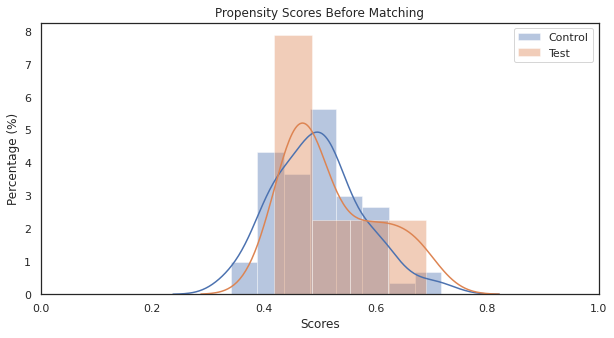

In [322]:
#plot propensity scores
m.plot_scores()

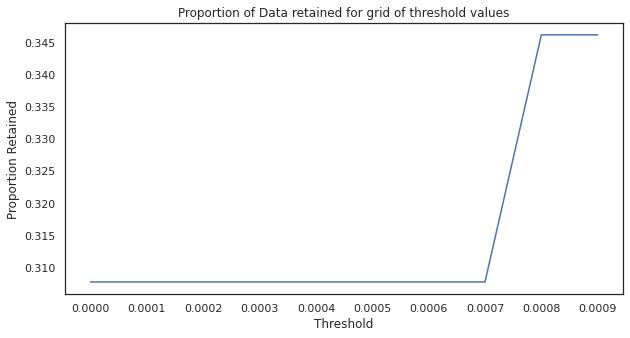

In [323]:
#method min looks for nearest neighbor/propensity score, greedy method random looks for any neighbor within a defined threshold
m.tune_threshold(method='random')

In [324]:
m.match(method="min", nmatches=1, threshold=0.0007)
m.record_frequency()

,freq,n_records
0,1,40
1,2,1
2,3,2
3,4,1


saved to: matching_ECOG_sex.svg


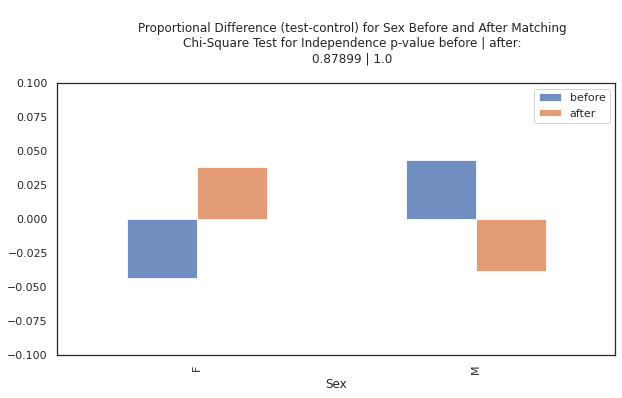

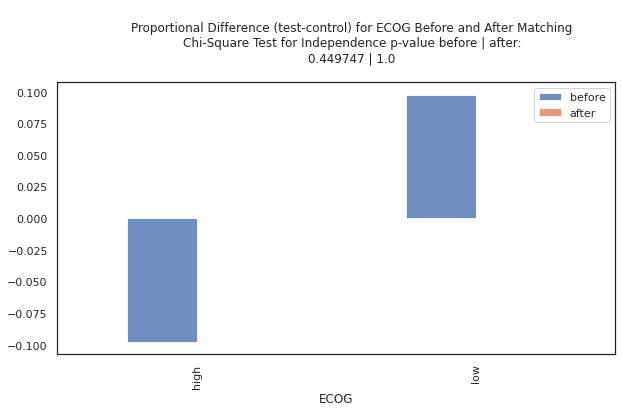

In [325]:
savename = 'matching_ECOG_sex.svg'
save_path_complete = figure_save_path + savename
categorical_results = m.compare_categorical(return_table=True)
rect = plt.plot()
plt.savefig(save_path_complete)
print('saved to:',savename)


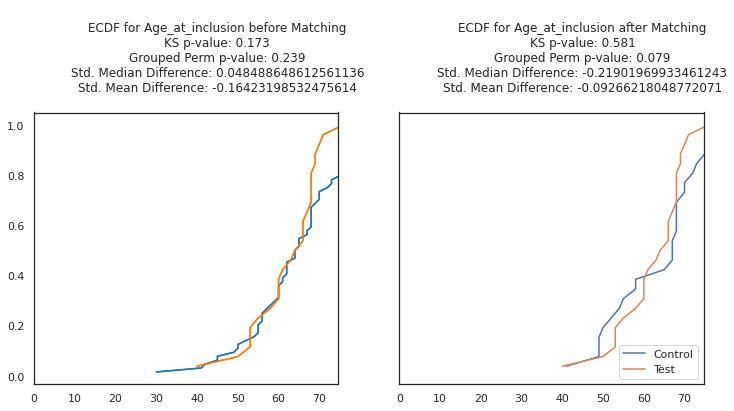

In [326]:
savename = 'matching_ECOG_age.svg'
cc = m.compare_continuous(return_table=True)
plt.savefig(savename)

#get source data
ax = plt.gca() # get axis handle
line = pd.DataFrame(ax.lines[0].get_xydata(),columns=['Control','Test']) # get the first line
line2 = pd.DataFrame(ax.lines[1].get_xydata(),columns=['Control','Test']) # get the first line
line.to_csv(figure_source_path+'prematching_'+savename)
line.to_csv(figure_source_path+'postmatching_'+savename)

In [327]:
control = control.drop(columns=['Patient_ID'])
control = control.reset_index()

In [328]:
control

,Patient_ID,Sex,vaccinated,Age_at_inclusion,ECOG
0,6MLHCE,M,1,53.0,low
1,D9SB9D,M,1,66.0,high
2,7O6TMW,M,1,40.0,high
3,H42U5T,F,1,53.0,high
4,2FH9M5,M,1,71.0,low
5,Y0MJKV,M,1,68.0,high
6,V8LVB1,M,1,67.0,high
7,RWCFP8,M,1,55.0,high
8,VNW7NT,M,1,68.0,high
9,LH6ZAL,F,1,64.0,high


In [329]:
#create matching dict
match_dict = control['Patient_ID'].to_dict()
match_dict

#convert matching Ids to patient ids
matched_patients = pd.DataFrame(m.matched_data)
matched_patients['match_id']= matched_patients['match_id'].map(match_dict)
matched_patients

,Sex,vaccinated,Age_at_inclusion,Patient_ID,ECOG,scores,match_id,record_id
64,M,1,53.0,6MLHCE,low,0.691225,6MLHCE,64
58,M,0,52.0,QLWN64,low,0.695314,6MLHCE,58
65,M,1,66.0,D9SB9D,high,0.481062,D9SB9D,65
60,M,0,67.0,QH6V9I,high,0.475495,D9SB9D,60
66,M,1,40.0,7O6TMW,high,0.614153,7O6TMW,66
42,M,0,41.0,4WTCUA,high,0.609847,7O6TMW,42
67,F,1,53.0,H42U5T,high,0.488172,H42U5T,67
21,M,0,65.0,X9H3PX,high,0.486639,H42U5T,21
68,M,1,71.0,2FH9M5,low,0.604256,2FH9M5,68
18,M,0,70.0,13N151,low,0.609597,2FH9M5,18


In [330]:
#save
matched_patients.to_csv(figure_source_path+'matching_ECOG'+'propensity_scores.csv')

In [331]:
#get number of times patients have been included (sampling is done with replacement)
matched_patient_frequencies = matched_patients['Patient_ID'].value_counts()

#get a list with sample IDs of patients (including patients included multiple times) this will be used to retrieve relevant info from AE table
matched_patient_list = []
for i,v in matched_patient_frequencies.iteritems():
  matched_patient_list = matched_patient_list + ([i]*v)

matched_patient_list

['L9YLRD',
 'L9YLRD',
 'L9YLRD',
 'L9YLRD',
 'QH6V9I',
 'QH6V9I',
 'QH6V9I',
 'J7CXX9',
 'J7CXX9',
 'J7CXX9',
 'I2CR2G',
 'I2CR2G',
 'ULKZFC',
 'J2Z8MC',
 'YJYW3T',
 '6XW7QX',
 'JBEZKB',
 'MXSP3T',
 'VMQLNV',
 'L5ZXEF',
 '2TSZNX',
 '6MLHCE',
 'X06IIV',
 '9J5YFK',
 '7F3S4X',
 'BWW38Q',
 'C1ABPH',
 '2DP8J8',
 'KQQNSB',
 'E4MQ91',
 'W0D7T8',
 'DF2YRV',
 'QLWN64',
 'J79PAG',
 'D9SB9D',
 '7O6TMW',
 '4WTCUA',
 'H42U5T',
 'X9H3PX',
 '2FH9M5',
 '13N151',
 'Y0MJKV',
 'V8LVB1',
 'RWCFP8',
 'RSSRJU',
 'VNW7NT',
 'LH6ZAL',
 '7Z9V9Q',
 'ROAJMS',
 '3R4SN5',
 'XL3D1Y',
 '36O7LQ']

In [332]:
#vaccination
first_vacc_dict = patient_table['first_vacc_from_inclusion'].to_dict() #create dictionary mapping vacc date to patients
matched_patients['virtual_first_vaccination'] = matched_patients['Patient_ID'].map(first_vacc_dict) #map vacc date
#get dict mapping unvaccinated patient to 'virtual vaccination date' (vacc date from matched patient) 
matched_patients = matched_patients.set_index('match_id')
matched_patients = matched_patients[~matched_patients['virtual_first_vaccination'].isna()]
virtual_vacc = matched_patients['virtual_first_vaccination'].to_dict()
virtual_vacc

{'6MLHCE': Timedelta('39 days 00:00:00'),
 'D9SB9D': Timedelta('37 days 00:00:00'),
 '7O6TMW': Timedelta('41 days 00:00:00'),
 'H42U5T': Timedelta('188 days 00:00:00'),
 '2FH9M5': Timedelta('9 days 00:00:00'),
 'Y0MJKV': Timedelta('135 days 00:00:00'),
 'V8LVB1': Timedelta('37 days 00:00:00'),
 'RWCFP8': Timedelta('90 days 00:00:00'),
 'VNW7NT': Timedelta('135 days 00:00:00'),
 'LH6ZAL': Timedelta('12 days 00:00:00'),
 'ROAJMS': Timedelta('-24 days +00:00:00'),
 'XL3D1Y': Timedelta('-7 days +00:00:00'),
 'DF2YRV': Timedelta('135 days 00:00:00'),
 '9J5YFK': Timedelta('209 days 00:00:00'),
 'J2Z8MC': Timedelta('52 days 00:00:00'),
 '6XW7QX': Timedelta('212 days 00:00:00'),
 'MXSP3T': Timedelta('367 days 00:00:00'),
 'L5ZXEF': Timedelta('37 days 00:00:00'),
 '2TSZNX': Timedelta('16 days 00:00:00'),
 'X06IIV': Timedelta('135 days 00:00:00'),
 '7F3S4X': Timedelta('140 days 00:00:00'),
 'C1ABPH': Timedelta('211 days 00:00:00'),
 '2DP8J8': Timedelta('147 days 00:00:00'),
 'KQQNSB': Timedelta(

In [333]:
#create virtual vacc date in patient table df
patient_table_unvacc = patient_table[patient_table['first_vacc_from_inclusion'].isna()]
patient_table_vacc = patient_table[~patient_table['first_vacc_from_inclusion'].isna()]

patient_table_vacc['virtual_first_vacc'] = patient_table_vacc['First_dose_date']
patient_table_unvacc['virtual_first_vacc'] = patient_table_unvacc.index.map(virtual_vacc)

In [334]:
#create virtual vacc date at same intervall as matched patient
patient_table_unvacc['virtual_first_vacc'] = patient_table_unvacc['date_inclusion'] + patient_table_unvacc['virtual_first_vacc']

In [335]:
#concatenate
patient_table_virt_vacc = pd.concat([patient_table_unvacc,patient_table_vacc])

In [336]:
#convert to datetime
patient_table_virt_vacc['last_follow_up'] = pd.to_datetime(patient_table_virt_vacc['last_follow_up'], format="%m/%d/%Y").copy()

In [337]:
patient_table_virt_vacc

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,follow_up_from_second_dose_vaccine_days,color_code,Survival_01.10.21,first_vacc_from_inclusion,second_vacc_from_inclusion,virtual_first_vacc
Patient_ID,,,,,,,,,,,,,,,,,,,,,
6MLHCE,M,53.0,24.5,0.0,0.0,UVM,<IV,CTLA-4,3.0,False,...,10/1/2021,2021-10-01,198.0,NaN,#VALUE!,#7D3439,0.0,NaT,NaT,2021-04-25
D9SB9D,M,66.0,NaN,1.0,0.0,SKCM,IV,CTLA-4+PD-1,1.0,False,...,1/29/2021,2021-10-01,431.0,NaN,#VALUE!,#513FAA,0.0,NaT,NaT,2020-09-02
7O6TMW,M,40.0,NaN,1.0,0.0,SKCM,IIIC,CTLA-4+PD-1,1.0,False,...,4/21/2021,2021-10-01,409.0,NaN,#VALUE!,#61381D,0.0,NaT,NaT,2020-09-28
H42U5T,F,53.0,NaN,1.0,0.0,SKCM,IIIC,CTLA-4+PD-1,1.0,False,...,7/20/2021,2021-07-20,295.0,NaN,#VALUE!,#3E5446,0.0,NaT,NaT,2021-04-04
2FH9M5,M,71.0,25.8,0.0,1.0,NEC,IV,CTLA-4+PD-1,3.0,False,...,1/15/2021,2021-01-15,85.0,NaN,#VALUE!,#C914F7,0.0,NaT,NaT,2020-10-31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RIRRZD,M,61.0,24.2,1.0,0.0,HNSC,III,PD-1/PD-L1+CTX,2.0,True,...,7/9/2021,2021-10-01,155.0,149.0,106.00,#636375,0.0,6 days,49 days,2021-05-05
QH6V9I,M,67.0,27.6,1.0,0.0,KIRC,IV,PD-1/PD-L1+TKI,1.0,True,...,10/1/2021,2021-10-01,206.0,169.0,135.00,#6F0062,0.0,37 days,71 days,2021-04-15
ULKZFC,M,77.0,28.3,0.0,1.0,KIRC,IV,PD-1/PD-L1+TKI,1.0,True,...,7/2/2021,2021-10-01,203.0,187.0,152.00,#EEC3FF,0.0,16 days,51 days,2021-03-28


In [338]:
import statistics
vaccinated_patients = patient_table_virt_vacc[patient_table_virt_vacc['vaccinated']==True]
unvaccinated_patients = patient_table_virt_vacc[patient_table_virt_vacc['vaccinated']==False]
print('median follow-up vaccinated is',statistics.median(vaccinated_patients['last_follow_up']- vaccinated_patients['virtual_first_vacc']))
print('median follow-up unvaccinated is',statistics.median(unvaccinated_patients['last_follow_up']- unvaccinated_patients['virtual_first_vacc']))

median follow-up vaccinated is 169 days 00:00:00
median follow-up unvaccinated is 95 days 00:00:00


In [339]:
#virtual vacc date for all patients (=real date for vaccinated patients, and date of matched vacc patient for unvacc patients)
virtual_vacc_dict = patient_table_virt_vacc['virtual_first_vacc'].to_dict()
virtual_vacc_dict

{'6MLHCE': Timestamp('2021-04-25 00:00:00'),
 'D9SB9D': Timestamp('2020-09-02 00:00:00'),
 '7O6TMW': Timestamp('2020-09-28 00:00:00'),
 'H42U5T': Timestamp('2021-04-04 00:00:00'),
 '2FH9M5': Timestamp('2020-10-31 00:00:00'),
 'Y0MJKV': Timestamp('2021-07-21 00:00:00'),
 'V8LVB1': Timestamp('2020-10-23 00:00:00'),
 'RWCFP8': Timestamp('2021-10-18 00:00:00'),
 'VNW7NT': Timestamp('2021-09-15 00:00:00'),
 'LH6ZAL': Timestamp('2020-07-29 00:00:00'),
 'ROAJMS': Timestamp('2021-02-15 00:00:00'),
 'XL3D1Y': Timestamp('2020-10-07 00:00:00'),
 'DF2YRV': Timestamp('2021-07-21 00:00:00'),
 '9J5YFK': Timestamp('2021-10-12 00:00:00'),
 'J2Z8MC': Timestamp('2021-05-09 00:00:00'),
 '6XW7QX': Timestamp('2021-10-16 00:00:00'),
 'MXSP3T': Timestamp('2021-07-15 00:00:00'),
 'L5ZXEF': Timestamp('2021-08-14 00:00:00'),
 '2TSZNX': Timestamp('2020-12-05 00:00:00'),
 'X06IIV': Timestamp('2021-03-12 00:00:00'),
 '7F3S4X': Timestamp('2021-10-04 00:00:00'),
 'C1ABPH': Timestamp('2021-04-24 00:00:00'),
 '2DP8J8':

In [340]:
#set virtual vacc diff from inclusion
long_term_ae = pd.read_csv(long_term_ae_path)
long_term_ae = long_term_ae[~long_term_ae['Patient_ID'].isin(patients_to_remove)]
long_term_ae['virtual_first_vacc'] = long_term_ae['Patient_ID'].map(virtual_vacc_dict)
long_term_ae

,Unnamed: 0.1,Unnamed: 0,Patient_ID,Long_Term_AE_1,Date_AE,CTCAE_grade,IrAE.RS,virtual_first_vacc
0,0,0,EK6BCT,Bilirubin_increase,3/20/2021,1.0,1.0,2021-04-15
1,1,1,EK6BCT,Creatinine_increase,5/4/2021,1.0,2.0,2021-04-15
2,2,2,EK6BCT,Muscle_cramps,7/27/2021,1.0,1.0,2021-04-15
3,3,3,EK6BCT,Creatinine_Increase,4/16/2021,1.0,1.0,2021-04-15
4,4,4,EK6BCT,Bilirubin_Increase,4/30/2021,1.0,1.0,2021-04-15
...,...,...,...,...,...,...,...,...
330,332,332,RWCFP8,Acute_kidney_injury,9/30/2021,5.0,1.0,2021-10-18
331,333,333,W0D7T8,Heart_failure,10/1/2021,5.0,1.0,2021-04-07
332,334,334,261EK3,Hepatic_failure,7/7/2021,5.0,1.0,2021-04-19
333,335,335,FWO178,Cholangiosepsis,6/15/2021,5.0,1.0,2021-03-23


In [341]:
long_term_ae['Date_AE'][0]

'3/20/2021'

In [342]:
#convert to datetime
long_term_ae['Date_AE'] = pd.to_datetime(long_term_ae['Date_AE'], format="%m/%d/%Y")
long_term_ae['virtual_first_vacc'] = pd.to_datetime(long_term_ae['virtual_first_vacc'], format="%m/%d/%Y")

In [343]:
long_term_ae_after_vacc = long_term_ae

In [344]:
#retrieve matched patients, list patients who were matched multiple times

df_list = []
for i in matched_patient_list:
  df_subset = long_term_ae_after_vacc[long_term_ae_after_vacc['Patient_ID']==i]
  df_list.append(df_subset)

long_term_ae_after_vacc_matched = pd.concat(df_list)

long_term_ae_after_vacc_matched

,Unnamed: 0.1,Unnamed: 0,Patient_ID,Long_Term_AE_1,Date_AE,CTCAE_grade,IrAE.RS,virtual_first_vacc
84,84,84,L9YLRD,Eye_infection,2021-04-16,1.0,1.0,2021-04-18
85,85,85,L9YLRD,Dysphagia,2021-08-11,2.0,1.0,2021-04-18
84,84,84,L9YLRD,Eye_infection,2021-04-16,1.0,1.0,2021-04-18
85,85,85,L9YLRD,Dysphagia,2021-08-11,2.0,1.0,2021-04-18
84,84,84,L9YLRD,Eye_infection,2021-04-16,1.0,1.0,2021-04-18
...,...,...,...,...,...,...,...,...
310,312,312,36O7LQ,Autoimmune_disorder-Colitis,2021-06-14,3.0,4.0,2021-12-24
311,313,313,36O7LQ,Hyponatremia,2021-06-17,3.0,3.0,2021-12-24
312,314,314,36O7LQ,Creatinine_level_increased,2021-07-19,2.0,1.0,2021-12-24
313,315,315,36O7LQ,Mucositis_oral,2021-08-05,1.0,3.0,2021-12-24


In [345]:
#add vacc status
long_term_ae_after_vacc_matched['vaccinated'] = long_term_ae_after_vacc_matched['Patient_ID'].map(patient_table['vaccinated'].to_dict())
long_term_ae_after_vacc_matched

,Unnamed: 0.1,Unnamed: 0,Patient_ID,Long_Term_AE_1,Date_AE,CTCAE_grade,IrAE.RS,virtual_first_vacc,vaccinated
84,84,84,L9YLRD,Eye_infection,2021-04-16,1.0,1.0,2021-04-18,True
85,85,85,L9YLRD,Dysphagia,2021-08-11,2.0,1.0,2021-04-18,True
84,84,84,L9YLRD,Eye_infection,2021-04-16,1.0,1.0,2021-04-18,True
85,85,85,L9YLRD,Dysphagia,2021-08-11,2.0,1.0,2021-04-18,True
84,84,84,L9YLRD,Eye_infection,2021-04-16,1.0,1.0,2021-04-18,True
...,...,...,...,...,...,...,...,...,...
310,312,312,36O7LQ,Autoimmune_disorder-Colitis,2021-06-14,3.0,4.0,2021-12-24,False
311,313,313,36O7LQ,Hyponatremia,2021-06-17,3.0,3.0,2021-12-24,False
312,314,314,36O7LQ,Creatinine_level_increased,2021-07-19,2.0,1.0,2021-12-24,False
313,315,315,36O7LQ,Mucositis_oral,2021-08-05,1.0,3.0,2021-12-24,False


In [346]:
long_term_ae_after_vacc_matched.iloc[60:80,:]

,Unnamed: 0.1,Unnamed: 0,Patient_ID,Long_Term_AE_1,Date_AE,CTCAE_grade,IrAE.RS,virtual_first_vacc,vaccinated
52,52,52,I2CR2G,Thrombocytopenia,2021-04-26,1.0,2.0,2021-04-13,True
190,190,190,ULKZFC,Creatinine_Increase,2021-04-06,1.0,1.0,2021-03-28,True
191,191,191,ULKZFC,Diarrhea,2021-07-23,2.0,1.0,2021-03-28,True
192,192,192,ULKZFC,Mucositis_oral,2021-09-21,2.0,3.0,2021-03-28,True
305,307,307,J2Z8MC,Hypercalcemia,2021-03-30,1.0,1.0,2021-05-09,False
143,143,143,YJYW3T,Dry_skin,2021-03-24,1.0,4.0,2021-03-20,True
144,144,144,YJYW3T,Fatigue,2021-04-25,1.0,1.0,2021-03-20,True
145,145,145,YJYW3T,Paresthesia,2021-06-02,2.0,4.0,2021-03-20,True
303,305,305,6XW7QX,Alanine_aminotransferase_increased,2021-04-20,1.0,4.0,2021-10-16,False
304,306,306,6XW7QX,Back_pain,2021-06-08,2.0,2.0,2021-10-16,False


In [347]:
#save
long_term_ae_after_vacc_matched.to_csv(patient_table_path[:-4] + '_virtual_vacc-ECOG.csv')

# propensity score matching (vaccinated ~ Age+Sex+insurance)

In [348]:
#unfortunately we have to downgrade pandas for this package
#!pip install pandas==0.23.4

#or use this method from CarlosDullius

#go to package directory and edit Matcher.py file:
#replace the following:
#return (y == preds).sum() * 1.0 / len(y)
#with this:
#return (y.to_numpy().T == preds).sum() * 1.0 / len(y)

In [349]:
import warnings
warnings.filterwarnings('ignore')
from pymatch.Matcher import Matcher
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import datetime

In [350]:
#enter here directory path containing the data

long_term_ae_path = DATA_DIR + 'ANTICIPATE_cohort1_longterm_AE_all_v6.csv'

patient_table_path = DATA_DIR + 'ANTICIPATE_cohort1_patient_info_all_v7.csv' #revised manuscript

patients_to_remove = ['3LPKO0',
'N8V2OD' ,
'ZGNF1D'  ,
'0SSMCL',
'9R3KE7',
'688HB6']

In [351]:
patient_table = pd.read_csv(patient_table_path,index_col='Patient_ID')
patient_table = patient_table[~patient_table.index.isin(patients_to_remove)]
patient_table

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,Second_dose_date,Second_dose_vaccine,date_inclusion,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,follow_up_from_second_dose_vaccine_days,color_code,Survival_01.10.21
Patient_ID,,,,,,,,,,,,,,,,,,,,,
A8SRJO,M,59.0,NaN,2.0,0.0,SKCM,IV,PD-1/PD-L1,1.0,True,...,5/25/2021,Astra Zeneca,9/30/2020,10/1/2021,10/1/2021,366.0,204.0,129.00,#997D87,0.0
L9YLRD,M,68.0,20.2,1.0,1.0,OSCC,III,PD-1/PD-L1,1.0,True,...,7/11/2021,Astra Zeneca,12/4/2020,10/1/2021,10/1/2021,301.0,166.0,82.00,#61615A,0.0
74WACU,F,61.0,22.6,1.0,0.0,AEG,IV,PD-1/PD-L1,1.0,True,...,5/10/2021,Astra Zeneca,3/18/2021,10/1/2021,10/1/2021,197.0,205.0,144.00,#788D66,0.0
SSW9Q1,F,68.0,25.3,1.0,0.0,UVM,IV,PD-1/PD-L1,3.0,True,...,7/11/2021,Astra Zeneca,4/7/2021,5/5/2021,10/1/2021,177.0,166.0,82.00,#886F4C,0.0
7Z9V9Q,M,76.0,24.3,1.0,0.0,"LUAD, ESCA",IV,PD-1/PD-L1,2.0,True,...,6/9/2021,Astra Zeneca,4/16/2021,6/11/2021,6/17/2021,62.0,50.0,8.00,#B4A8BD,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [352]:
patient_table.columns

Index(['Sex', 'Age_at_inclusion', 'BMI', 'ECOG', 'private_insurance',
       'Tumor_type', 'Stage', 'Therapy_type', 'Therapy_Line', 'vaccinated',
       'First_dose_date', 'First_dose_vaccine', 'Second_dose_date',
       'Second_dose_vaccine', 'date_inclusion', 'last_immunotherapy',
       'last_follow_up', 'follow_up_from_ICT_days',
       'follow_up_from_first_dose_vaccine_days',
       'follow_up_from_second_dose_vaccine_days', 'color_code',
       'Survival_01.10.21'],
      dtype='object')

In [353]:
#calculate vacc timepoint from inclusion
patient_table['First_dose_date'] = pd.to_datetime(patient_table['First_dose_date'],format="%m/%d/%Y")
patient_table['Second_dose_date'] = pd.to_datetime(patient_table['Second_dose_date'],format="%m/%d/%Y")
patient_table['date_inclusion'] = pd.to_datetime(patient_table['date_inclusion'],format="%m/%d/%Y")

In [354]:
#date of inclusion
df = patient_table
dates = list(df.sort_values('date_inclusion')['date_inclusion'])
print('med. follow-up from ICT start:',np.median(df['follow_up_from_ICT_days']))
print('min follow-up from ICT start:',min(df['follow_up_from_ICT_days']))
print('max follow-up from ICT start:',max(df['follow_up_from_ICT_days']))
print('first  patient accrued:',dates[0])
print('last  patient accrued:',dates[-1])
print('50% of  patients in accrual date ', dates[len(dates)//2])

med. follow-up from ICT start: nan
min follow-up from ICT start: 30.0
max follow-up from ICT start: 574.0
first  patient accrued: 2020-03-06 00:00:00
last  patient accrued: NaT
50% of  patients in accrual date  2021-03-12 00:00:00


In [355]:
#date of inclusion
df = patient_table[patient_table['vaccinated']==True]
dates = list(df.sort_values('date_inclusion')['date_inclusion'])
print('med. follow-up from ICT start:',np.median(df['follow_up_from_ICT_days']))
print('min follow-up from ICT start:',min(df['follow_up_from_ICT_days']))
print('max follow-up from ICT start:',max(df['follow_up_from_ICT_days']))
print('med. follow-up from 1st vacc start:',np.median(df['follow_up_from_first_dose_vaccine_days']))
print('min follow-up from 1st vacc start:',min(df['follow_up_from_first_dose_vaccine_days']))
print('max follow-up from 1st vacc start:',max(df['follow_up_from_first_dose_vaccine_days']))
print('first vaccinated patient accrued:',dates[0])
print('last vaccinated patient accrued:',dates[-1])
print('50% of vaccinated patients in accrual date ', dates[len(dates)//2])

med. follow-up from ICT start: 254.0
min follow-up from ICT start: 44.0
max follow-up from ICT start: 574.0
med. follow-up from 1st vacc start: 169.0
min follow-up from 1st vacc start: 24.0
max follow-up from 1st vacc start: 259.0
first vaccinated patient accrued: 2020-03-06 00:00:00
last vaccinated patient accrued: 2021-05-27 00:00:00
50% of vaccinated patients in accrual date  2021-01-19 00:00:00


In [356]:
#date of inclusion
df = patient_table[patient_table['vaccinated']==False]
dates = list(df.sort_values('date_inclusion')['date_inclusion'])
print('med. follow-up from ICT start:',np.median(df['follow_up_from_ICT_days']))
print('min follow-up from ICT start:',min(df['follow_up_from_ICT_days']))
print('max follow-up from ICT start:',max(df['follow_up_from_ICT_days']))
print('first unvaccinated patient accrued:',dates[0])
print('last unvaccinated patient accrued:',dates[-1])
print('50% of unvaccinated patients in accrual date ', dates[len(dates)//2])

med. follow-up from ICT start: 203.5
min follow-up from ICT start: 30.0
max follow-up from ICT start: 441.0
first unvaccinated patient accrued: 2020-07-13 00:00:00
last unvaccinated patient accrued: 2021-07-20 00:00:00
50% of unvaccinated patients in accrual date  2021-03-08 00:00:00


In [357]:
#calculate vacc timepoint from inclusion
patient_table['first_vacc_from_inclusion'] = patient_table['First_dose_date'] - patient_table['date_inclusion'] 
patient_table['second_vacc_from_inclusion'] = patient_table['Second_dose_date'] - patient_table['date_inclusion'] 

In [358]:
patient_table.columns

Index(['Sex', 'Age_at_inclusion', 'BMI', 'ECOG', 'private_insurance',
       'Tumor_type', 'Stage', 'Therapy_type', 'Therapy_Line', 'vaccinated',
       'First_dose_date', 'First_dose_vaccine', 'Second_dose_date',
       'Second_dose_vaccine', 'date_inclusion', 'last_immunotherapy',
       'last_follow_up', 'follow_up_from_ICT_days',
       'follow_up_from_first_dose_vaccine_days',
       'follow_up_from_second_dose_vaccine_days', 'color_code',
       'Survival_01.10.21', 'first_vacc_from_inclusion',
       'second_vacc_from_inclusion'],
      dtype='object')

In [359]:
data = patient_table.copy()
data['Patient_ID'] = patient_table.index
fields = ['Sex','vaccinated','Age_at_inclusion','Patient_ID','private_insurance']
# 'Therapy_type',,'Stage''Therapy_Line']

In [360]:
#adjust data and remove variable with low variation bc these will confound the regression
stage_dict = {'<IV':0, 'I':0, 'IB':0, 'II':0, 'IIA':0, 'IIB':0, 'III':0, 'IIIB':0, 
 'IIIC':0, 'IV':1, 'IVA':1}
line_dict = {1:1, 2:2, 3:3, 4:4, 5:4, 6:4, 7:4, 8:4}
ECOG_dict = {0:'low',1:'high',2:'high',3:'high',4:'high',5:'high'}
insurance_dict = {0:'public',1:'private'}
data['ECOG'] = pd.Categorical(data['ECOG'].map(ECOG_dict)).astype(str)
data['private_insurance'] = pd.Categorical(data['private_insurance'].map(insurance_dict)).astype(str)
#data['Stage'] = pd.Categorical(data['Stage'].map(stage_dict))
#data['Therapy_Line'] = pd.Categorical(data['Therapy_Line'].map(line_dict))

In [361]:
data.columns

Index(['Sex', 'Age_at_inclusion', 'BMI', 'ECOG', 'private_insurance',
       'Tumor_type', 'Stage', 'Therapy_type', 'Therapy_Line', 'vaccinated',
       'First_dose_date', 'First_dose_vaccine', 'Second_dose_date',
       'Second_dose_vaccine', 'date_inclusion', 'last_immunotherapy',
       'last_follow_up', 'follow_up_from_ICT_days',
       'follow_up_from_first_dose_vaccine_days',
       'follow_up_from_second_dose_vaccine_days', 'color_code',
       'Survival_01.10.21', 'first_vacc_from_inclusion',
       'second_vacc_from_inclusion', 'Patient_ID'],
      dtype='object')

In [362]:
data = data[fields]
data = data[~data.index.isna()]
data

,Sex,vaccinated,Age_at_inclusion,Patient_ID,private_insurance
Patient_ID,,,,,
A8SRJO,M,True,59.0,A8SRJO,public
L9YLRD,M,True,68.0,L9YLRD,private
74WACU,F,True,61.0,74WACU,public
SSW9Q1,F,True,68.0,SSW9Q1,public
7Z9V9Q,M,True,76.0,7Z9V9Q,public
...,...,...,...,...,...
C1ABPH,M,False,69.0,C1ABPH,public
2DP8J8,M,False,58.0,2DP8J8,public
KQQNSB,M,False,60.0,KQQNSB,public


In [363]:
#pd.crosstab(data['vaccinated'],data['private_insurance'])

In [364]:
test = data[data.vaccinated == True]
control = data[data.vaccinated == False]
test.loc[:,'vaccinated'] = 0
control.loc[:,'vaccinated'] = 1

In [365]:
m = Matcher(test, control, yvar="vaccinated", exclude=['Patient_ID'])

Formula:
vaccinated ~ Sex+Age_at_inclusion+private_insurance
n majority: 64
n minority: 26


In [366]:
np.random.seed(20170925)
m.fit_scores(balance=True, 
                                     nmodels=400
                                     )

Fitting Models on Balanced Samples: 167\400Error: Perfect separation detected, results not available
Fitting Models on Balanced Samples: 400\400
Average Accuracy: 55.16%


In [367]:
#assign propensity scores
m.predict_scores()

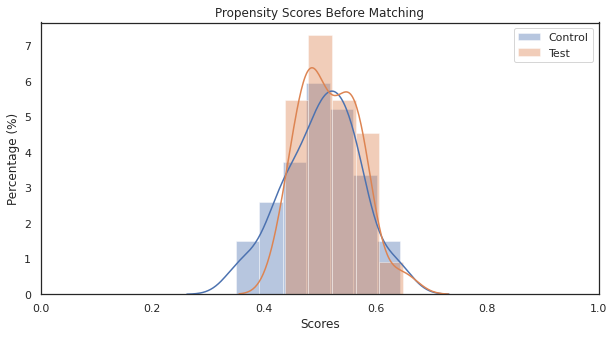

In [368]:
#plot propensity scores
m.plot_scores()

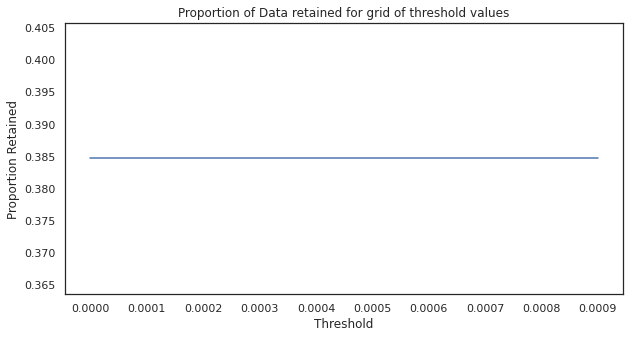

In [369]:
#method min looks for nearest neighbor/propensity score, greedy method random looks for any neighbor within a defined threshold
m.tune_threshold(method='random')

In [370]:
m.match(method="min", nmatches=1)#,threshold=0.0009)
m.record_frequency()

,freq,n_records
0,1,39
1,2,3
2,3,1
3,4,1


In [371]:
m.assign_weight_vector()

In [372]:
m.matched_data.sort_values("match_id").head(6)

,record_id,weight,Sex,vaccinated,Age_at_inclusion,Patient_ID,private_insurance,scores,match_id
5,16,0.5,F,0,42.0,EYIGE1,public,0.582676,0
26,64,1.0,M,1,53.0,6MLHCE,public,0.580329,0
27,65,1.0,M,1,66.0,D9SB9D,public,0.499327,1
15,49,0.5,F,0,56.0,1K9IAN,public,0.501881,1
11,42,1.0,M,0,41.0,4WTCUA,public,0.644098,2
28,66,1.0,M,1,40.0,7O6TMW,public,0.648769,2


saved to: matching_insurance_sex.svg


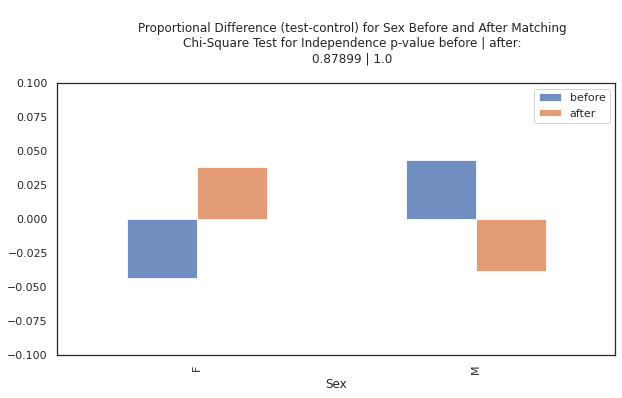

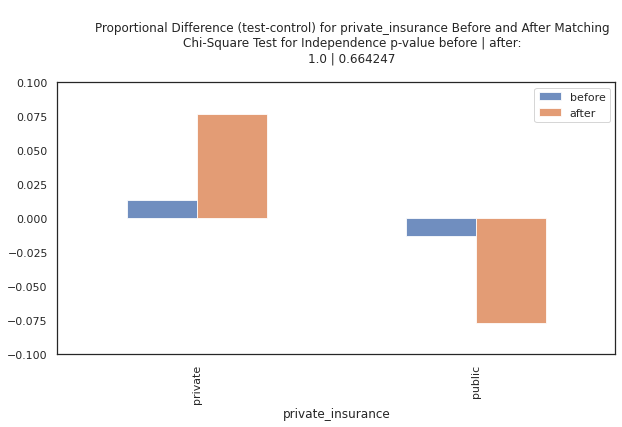

In [373]:
savename = 'matching_insurance_sex.svg'
save_path_complete = figure_save_path + savename
categorical_results = m.compare_categorical(return_table=True)
plt.savefig(save_path_complete)
print('saved to:',savename)

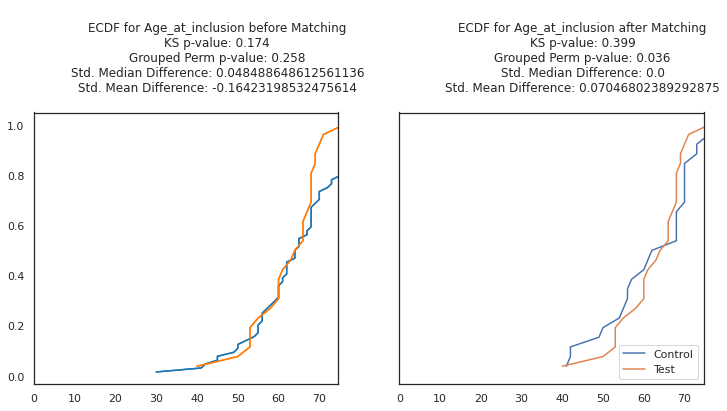

In [374]:
savename = 'matching_insurance_age.svg'
cc = m.compare_continuous(return_table=True)
plt.savefig(savename)

#get source data
ax = plt.gca() # get axis handle
line = pd.DataFrame(ax.lines[0].get_xydata(),columns=['Control','Test']) # get the first line
line2 = pd.DataFrame(ax.lines[1].get_xydata(),columns=['Control','Test']) # get the first line
line.to_csv(figure_source_path+'prematching_'+savename)
line.to_csv(figure_source_path+'postmatching_'+savename)

In [375]:
m.matched_data

,record_id,weight,Sex,vaccinated,Age_at_inclusion,Patient_ID,private_insurance,scores,match_id
0,1,1.000000,M,0,68.0,L9YLRD,private,0.569465,19
1,4,0.500000,M,0,76.0,7Z9V9Q,public,0.437382,10
2,4,0.500000,M,0,76.0,7Z9V9Q,public,0.437382,18
3,8,1.000000,M,0,60.0,G8ZRBI,public,0.537549,23
4,14,1.000000,M,0,73.0,32PHU4,public,0.455390,15
5,16,0.500000,F,0,42.0,EYIGE1,public,0.582676,0
6,16,0.500000,F,0,42.0,EYIGE1,public,0.582676,13
7,27,1.000000,F,0,50.0,VMQLNV,public,0.538153,16
8,30,1.000000,M,0,57.0,KUDJHR,public,0.556253,4
9,33,1.000000,M,0,62.0,2CC0BM,public,0.524875,3


In [376]:
control = control.drop(columns=['Patient_ID'])
control = control.reset_index()

In [377]:
control

,Patient_ID,Sex,vaccinated,Age_at_inclusion,private_insurance
0,6MLHCE,M,1,53.0,public
1,D9SB9D,M,1,66.0,public
2,7O6TMW,M,1,40.0,public
3,H42U5T,F,1,53.0,public
4,2FH9M5,M,1,71.0,private
5,Y0MJKV,M,1,68.0,public
6,V8LVB1,M,1,67.0,private
7,RWCFP8,M,1,55.0,public
8,VNW7NT,M,1,68.0,public
9,LH6ZAL,F,1,64.0,public


In [378]:
#create matching dict
match_dict = control['Patient_ID'].to_dict()
match_dict

#convert matching Ids to patient ids
matched_patients = pd.DataFrame(m.matched_data)
matched_patients['match_id']= matched_patients['match_id'].map(match_dict)
matched_patients

,record_id,weight,Sex,vaccinated,Age_at_inclusion,Patient_ID,private_insurance,scores,match_id
0,1,1.000000,M,0,68.0,L9YLRD,private,0.569465,X06IIV
1,4,0.500000,M,0,76.0,7Z9V9Q,public,0.437382,ROAJMS
2,4,0.500000,M,0,76.0,7Z9V9Q,public,0.437382,2TSZNX
3,8,1.000000,M,0,60.0,G8ZRBI,public,0.537549,KQQNSB
4,14,1.000000,M,0,73.0,32PHU4,public,0.455390,6XW7QX
5,16,0.500000,F,0,42.0,EYIGE1,public,0.582676,6MLHCE
6,16,0.500000,F,0,42.0,EYIGE1,public,0.582676,9J5YFK
7,27,1.000000,F,0,50.0,VMQLNV,public,0.538153,MXSP3T
8,30,1.000000,M,0,57.0,KUDJHR,public,0.556253,2FH9M5
9,33,1.000000,M,0,62.0,2CC0BM,public,0.524875,H42U5T


In [379]:
#save
matched_patients.to_csv(figure_source_path+'matching_insurance'+'propensity_scores.csv')

In [380]:
#get number of times patients have been included (sampling is done with replacement)
matched_patient_frequencies = matched_patients['Patient_ID'].value_counts()

#get a list with sample IDs of patients (including patients included multiple times) this will be used to retrieve relevant info from AE table
matched_patient_list = []
for i,v in matched_patient_frequencies.iteritems():
  matched_patient_list = matched_patient_list + ([i]*v)

matched_patient_list

['J79PAG',
 'J79PAG',
 'J79PAG',
 'J79PAG',
 'IOQ3FO',
 'IOQ3FO',
 'IOQ3FO',
 '7Z9V9Q',
 '7Z9V9Q',
 'EYIGE1',
 'EYIGE1',
 '1K9IAN',
 '1K9IAN',
 'L9YLRD',
 'MXSP3T',
 'LH6ZAL',
 'ROAJMS',
 'XL3D1Y',
 'DF2YRV',
 '9J5YFK',
 'J2Z8MC',
 '6XW7QX',
 'L5ZXEF',
 'RWCFP8',
 '2TSZNX',
 'X06IIV',
 '7F3S4X',
 'C1ABPH',
 '2DP8J8',
 'KQQNSB',
 'E4MQ91',
 'VNW7NT',
 '2FH9M5',
 'V8LVB1',
 'X65WDO',
 'G8ZRBI',
 '32PHU4',
 'VMQLNV',
 'KUDJHR',
 '2CC0BM',
 'YJYW3T',
 '4WTCUA',
 'J7CXX9',
 'Y0MJKV',
 'RSSRJU',
 'RIRRZD',
 'W0D7T8',
 '6MLHCE',
 'D9SB9D',
 '7O6TMW',
 'H42U5T',
 '36O7LQ']

In [381]:
#vaccination
first_vacc_dict = patient_table['first_vacc_from_inclusion'].to_dict() #create dictionary mapping vacc date to patients
matched_patients['virtual_first_vaccination'] = matched_patients['Patient_ID'].map(first_vacc_dict) #map vacc date
#get dict mapping unvaccinated patient to 'virtual vaccination date' (vacc date from matched patient) 
matched_patients = matched_patients.set_index('match_id')
matched_patients = matched_patients[~matched_patients['virtual_first_vaccination'].isna()]
virtual_vacc = matched_patients['virtual_first_vaccination'].to_dict()
virtual_vacc

{'X06IIV': Timedelta('135 days 00:00:00'),
 'ROAJMS': Timedelta('12 days 00:00:00'),
 '2TSZNX': Timedelta('12 days 00:00:00'),
 'KQQNSB': Timedelta('168 days 00:00:00'),
 '6XW7QX': Timedelta('91 days 00:00:00'),
 '6MLHCE': Timedelta('38 days 00:00:00'),
 '9J5YFK': Timedelta('38 days 00:00:00'),
 'MXSP3T': Timedelta('367 days 00:00:00'),
 '2FH9M5': Timedelta('256 days 00:00:00'),
 'H42U5T': Timedelta('108 days 00:00:00'),
 'LH6ZAL': Timedelta('52 days 00:00:00'),
 '7O6TMW': Timedelta('41 days 00:00:00'),
 'Y0MJKV': Timedelta('22 days 00:00:00'),
 'VNW7NT': Timedelta('22 days 00:00:00'),
 'DF2YRV': Timedelta('22 days 00:00:00'),
 'D9SB9D': Timedelta('129 days 00:00:00'),
 'L5ZXEF': Timedelta('129 days 00:00:00'),
 'XL3D1Y': Timedelta('95 days 00:00:00'),
 'J2Z8MC': Timedelta('-7 days +00:00:00'),
 '7F3S4X': Timedelta('-7 days +00:00:00'),
 'C1ABPH': Timedelta('-7 days +00:00:00'),
 '36O7LQ': Timedelta('-7 days +00:00:00'),
 '2DP8J8': Timedelta('147 days 00:00:00'),
 'RWCFP8': Timedelta('

In [382]:
#create virtual vacc date in patient table df
patient_table_unvacc = patient_table[patient_table['first_vacc_from_inclusion'].isna()]
patient_table_vacc = patient_table[~patient_table['first_vacc_from_inclusion'].isna()]

patient_table_vacc['virtual_first_vacc'] = patient_table_vacc['First_dose_date']
patient_table_unvacc['virtual_first_vacc'] = patient_table_unvacc.index.map(virtual_vacc)

In [383]:
#create virtual vacc date at same intervall as matched patient
patient_table_unvacc['virtual_first_vacc'] = patient_table_unvacc['date_inclusion'] + patient_table_unvacc['virtual_first_vacc']

In [384]:
#concatenate
patient_table_virt_vacc = pd.concat([patient_table_unvacc,patient_table_vacc])

In [385]:
#convert to datetime
patient_table_virt_vacc['last_follow_up'] = pd.to_datetime(patient_table_virt_vacc['last_follow_up'], format="%m/%d/%Y").copy()

In [386]:
patient_table_virt_vacc

,Sex,Age_at_inclusion,BMI,ECOG,private_insurance,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,...,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,follow_up_from_second_dose_vaccine_days,color_code,Survival_01.10.21,first_vacc_from_inclusion,second_vacc_from_inclusion,virtual_first_vacc
Patient_ID,,,,,,,,,,,,,,,,,,,,,
6MLHCE,M,53.0,24.5,0.0,0.0,UVM,<IV,CTLA-4,3.0,False,...,10/1/2021,2021-10-01,198.0,NaN,#VALUE!,#7D3439,0.0,NaT,NaT,2021-04-24
D9SB9D,M,66.0,NaN,1.0,0.0,SKCM,IV,CTLA-4+PD-1,1.0,False,...,1/29/2021,2021-10-01,431.0,NaN,#VALUE!,#513FAA,0.0,NaT,NaT,2020-12-03
7O6TMW,M,40.0,NaN,1.0,0.0,SKCM,IIIC,CTLA-4+PD-1,1.0,False,...,4/21/2021,2021-10-01,409.0,NaN,#VALUE!,#61381D,0.0,NaT,NaT,2020-09-28
H42U5T,F,53.0,NaN,1.0,0.0,SKCM,IIIC,CTLA-4+PD-1,1.0,False,...,7/20/2021,2021-07-20,295.0,NaN,#VALUE!,#3E5446,0.0,NaT,NaT,2021-01-14
2FH9M5,M,71.0,25.8,0.0,1.0,NEC,IV,CTLA-4+PD-1,3.0,False,...,1/15/2021,2021-01-15,85.0,NaN,#VALUE!,#C914F7,0.0,NaT,NaT,2021-07-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RIRRZD,M,61.0,24.2,1.0,0.0,HNSC,III,PD-1/PD-L1+CTX,2.0,True,...,7/9/2021,2021-10-01,155.0,149.0,106.00,#636375,0.0,6 days,49 days,2021-05-05
QH6V9I,M,67.0,27.6,1.0,0.0,KIRC,IV,PD-1/PD-L1+TKI,1.0,True,...,10/1/2021,2021-10-01,206.0,169.0,135.00,#6F0062,0.0,37 days,71 days,2021-04-15
ULKZFC,M,77.0,28.3,0.0,1.0,KIRC,IV,PD-1/PD-L1+TKI,1.0,True,...,7/2/2021,2021-10-01,203.0,187.0,152.00,#EEC3FF,0.0,16 days,51 days,2021-03-28


In [387]:
import statistics
vaccinated_patients = patient_table_virt_vacc[patient_table_virt_vacc['vaccinated']==True]
unvaccinated_patients = patient_table_virt_vacc[patient_table_virt_vacc['vaccinated']==False]
print('median follow-up vaccinated is',statistics.median(vaccinated_patients['last_follow_up']- vaccinated_patients['virtual_first_vacc']))
print('median follow-up unvaccinated is',statistics.median(unvaccinated_patients['last_follow_up']- unvaccinated_patients['virtual_first_vacc']))

median follow-up vaccinated is 169 days 00:00:00
median follow-up unvaccinated is 147 days 00:00:00


In [388]:
#virtual vacc date for all patients (=real date for vaccinated patients, and date of matched vacc patient for unvacc patients)
virtual_vacc_dict = patient_table_virt_vacc['virtual_first_vacc'].to_dict()
virtual_vacc_dict

{'6MLHCE': Timestamp('2021-04-24 00:00:00'),
 'D9SB9D': Timestamp('2020-12-03 00:00:00'),
 '7O6TMW': Timestamp('2020-09-28 00:00:00'),
 'H42U5T': Timestamp('2021-01-14 00:00:00'),
 '2FH9M5': Timestamp('2021-07-05 00:00:00'),
 'Y0MJKV': Timestamp('2021-03-30 00:00:00'),
 'V8LVB1': Timestamp('2021-04-13 00:00:00'),
 'RWCFP8': Timestamp('2021-10-18 00:00:00'),
 'VNW7NT': Timestamp('2021-05-25 00:00:00'),
 'LH6ZAL': Timestamp('2020-09-07 00:00:00'),
 'ROAJMS': Timestamp('2021-03-23 00:00:00'),
 'XL3D1Y': Timestamp('2021-01-17 00:00:00'),
 'DF2YRV': Timestamp('2021-03-30 00:00:00'),
 '9J5YFK': Timestamp('2021-04-24 00:00:00'),
 'J2Z8MC': Timestamp('2021-03-11 00:00:00'),
 '6XW7QX': Timestamp('2021-06-17 00:00:00'),
 'MXSP3T': Timestamp('2021-07-15 00:00:00'),
 'L5ZXEF': Timestamp('2021-11-14 00:00:00'),
 '2TSZNX': Timestamp('2020-12-01 00:00:00'),
 'X06IIV': Timestamp('2021-03-12 00:00:00'),
 '7F3S4X': Timestamp('2021-05-10 00:00:00'),
 'C1ABPH': Timestamp('2020-09-18 00:00:00'),
 '2DP8J8':

In [389]:
#set virtual vacc diff from inclusion
long_term_ae = pd.read_csv(long_term_ae_path)
long_term_ae = long_term_ae[~long_term_ae['Patient_ID'].isin(patients_to_remove)]
long_term_ae['virtual_first_vacc'] = long_term_ae['Patient_ID'].map(virtual_vacc_dict)
long_term_ae

,Unnamed: 0.1,Unnamed: 0,Patient_ID,Long_Term_AE_1,Date_AE,CTCAE_grade,IrAE.RS,virtual_first_vacc
0,0,0,EK6BCT,Bilirubin_increase,3/20/2021,1.0,1.0,2021-04-15
1,1,1,EK6BCT,Creatinine_increase,5/4/2021,1.0,2.0,2021-04-15
2,2,2,EK6BCT,Muscle_cramps,7/27/2021,1.0,1.0,2021-04-15
3,3,3,EK6BCT,Creatinine_Increase,4/16/2021,1.0,1.0,2021-04-15
4,4,4,EK6BCT,Bilirubin_Increase,4/30/2021,1.0,1.0,2021-04-15
...,...,...,...,...,...,...,...,...
330,332,332,RWCFP8,Acute_kidney_injury,9/30/2021,5.0,1.0,2021-10-18
331,333,333,W0D7T8,Heart_failure,10/1/2021,5.0,1.0,2021-04-07
332,334,334,261EK3,Hepatic_failure,7/7/2021,5.0,1.0,2021-04-19
333,335,335,FWO178,Cholangiosepsis,6/15/2021,5.0,1.0,2021-03-23


In [390]:
long_term_ae['Patient_ID'].isin(patients_to_remove)[50:100]

50    False
51    False
52    False
53    False
54    False
55    False
56    False
57    False
58    False
59    False
60    False
61    False
62    False
63    False
64    False
65    False
66    False
67    False
68    False
69    False
70    False
71    False
72    False
73    False
74    False
75    False
76    False
77    False
78    False
79    False
80    False
81    False
82    False
83    False
84    False
85    False
86    False
87    False
88    False
89    False
90    False
91    False
92    False
93    False
94    False
95    False
96    False
97    False
98    False
99    False
Name: Patient_ID, dtype: bool

In [391]:
list(set(long_term_ae['Patient_ID']))

['LIK08H',
 'RWCFP8',
 'F81VCA',
 'QLWN64',
 'QFE9E8',
 'XL3D1Y',
 '9J5YFK',
 'J7CXX9',
 '2TSZNX',
 'G8ZRBI',
 'SVXZIG',
 '7O6TMW',
 'H42U5T',
 '9T7S7J',
 '32PHU4',
 'ULKZFC',
 'V8LVB1',
 '9W8OQ3',
 'OI9CSG',
 '74WACU',
 'DVI5OS',
 'YJYW3T',
 'L9YLRD',
 '39H11P',
 'A8SRJO',
 '36O7LQ',
 'RIRRZD',
 '7Z9V9Q',
 'BWW38Q',
 'DLEXGH',
 '6MLHCE',
 '339ZEM',
 'E4MQ91',
 'DEW6IM',
 'FKLSVO',
 '2JJ523',
 '6XW7QX',
 '1K9IAN',
 'SSW9Q1',
 'IOQ3FO',
 'KKT25Y',
 'D9SB9D',
 'RSSRJU',
 'KWO5UQ',
 'J79PAG',
 '7F3S4X',
 'VMQLNV',
 'J2Z8MC',
 'KUDJHR',
 '3R4SN5',
 '0ZTE2L',
 'S4VP85',
 '25D2CD',
 'ROAJMS',
 'EC6DJA',
 'EMHL0E',
 'W1CYGF',
 'QH6V9I',
 'JBEZKB',
 'EK6BCT',
 'X06IIV',
 'I2CR2G',
 'EYIGE1',
 '4WTCUA',
 'KQQNSB',
 'MXSP3T',
 'L5ZXEF',
 'W0D7T8',
 'GKLHFP',
 'LH6ZAL',
 '261EK3',
 'ARU8T1',
 'X65WDO',
 '4EQFBC',
 'SO7XOB',
 'X9H3PX',
 '13N151',
 'IZO4HU',
 '2FH9M5',
 'Y0MJKV',
 '44KQ3O',
 'E61BKL',
 '19U0MP',
 'DF2YRV',
 'FWO178',
 '2DP8J8',
 'C1ABPH',
 'VNW7NT',
 'NQ46IB',
 '2CC0BM']

In [392]:
#save data
long_term_ae.to_csv(long_term_ae_path[:-4]+'_AE_matched-insurance.csv')

In [393]:
#convert to datetime
long_term_ae['Date_AE'] = pd.to_datetime(long_term_ae['Date_AE'], format="%m/%d/%Y")
long_term_ae['virtual_first_vacc'] = pd.to_datetime(long_term_ae['virtual_first_vacc'], format="%m/%d/%Y")

In [394]:
long_term_ae_after_vacc = long_term_ae

#restrict to AEs happening after vaccination
long_term_ae['AE_time_from_vacc'] = long_term_ae['Date_AE'] - long_term_ae['virtual_first_vacc'] 
long_term_ae_after_vacc = long_term_ae[long_term_ae['AE_time_from_vacc']>=datetime.timedelta(days=0)]
long_term_ae_after_vacc

In [395]:
#retrieve matched patients, list patients who were matched multiple times

df_list = []
for i in matched_patient_list:
  df_subset = long_term_ae_after_vacc[long_term_ae_after_vacc['Patient_ID']==i]
  df_list.append(df_subset)

long_term_ae_after_vacc_matched = pd.concat(df_list)

long_term_ae_after_vacc_matched

,Unnamed: 0.1,Unnamed: 0,Patient_ID,Long_Term_AE_1,Date_AE,CTCAE_grade,IrAE.RS,virtual_first_vacc
236,238,238,J79PAG,Bilirubin_increase,2021-04-27,1.0,1.0,2021-04-23
236,238,238,J79PAG,Bilirubin_increase,2021-04-27,1.0,1.0,2021-04-23
236,238,238,J79PAG,Bilirubin_increase,2021-04-27,1.0,1.0,2021-04-23
236,238,238,J79PAG,Bilirubin_increase,2021-04-27,1.0,1.0,2021-04-23
202,202,202,IOQ3FO,Creatinine_Increase,2021-05-06,1.0,1.0,2021-04-06
...,...,...,...,...,...,...,...,...
310,312,312,36O7LQ,Autoimmune_disorder-Colitis,2021-06-14,3.0,4.0,2021-05-20
311,313,313,36O7LQ,Hyponatremia,2021-06-17,3.0,3.0,2021-05-20
312,314,314,36O7LQ,Creatinine_level_increased,2021-07-19,2.0,1.0,2021-05-20
313,315,315,36O7LQ,Mucositis_oral,2021-08-05,1.0,3.0,2021-05-20


In [396]:
#add vacc status
long_term_ae_after_vacc_matched['vaccinated'] = long_term_ae_after_vacc_matched['Patient_ID'].map(patient_table['vaccinated'].to_dict())
long_term_ae_after_vacc_matched

,Unnamed: 0.1,Unnamed: 0,Patient_ID,Long_Term_AE_1,Date_AE,CTCAE_grade,IrAE.RS,virtual_first_vacc,vaccinated
236,238,238,J79PAG,Bilirubin_increase,2021-04-27,1.0,1.0,2021-04-23,True
236,238,238,J79PAG,Bilirubin_increase,2021-04-27,1.0,1.0,2021-04-23,True
236,238,238,J79PAG,Bilirubin_increase,2021-04-27,1.0,1.0,2021-04-23,True
236,238,238,J79PAG,Bilirubin_increase,2021-04-27,1.0,1.0,2021-04-23,True
202,202,202,IOQ3FO,Creatinine_Increase,2021-05-06,1.0,1.0,2021-04-06,True
...,...,...,...,...,...,...,...,...,...
310,312,312,36O7LQ,Autoimmune_disorder-Colitis,2021-06-14,3.0,4.0,2021-05-20,False
311,313,313,36O7LQ,Hyponatremia,2021-06-17,3.0,3.0,2021-05-20,False
312,314,314,36O7LQ,Creatinine_level_increased,2021-07-19,2.0,1.0,2021-05-20,False
313,315,315,36O7LQ,Mucositis_oral,2021-08-05,1.0,3.0,2021-05-20,False


In [397]:
long_term_ae_after_vacc_matched.iloc[60:80,:]

,Unnamed: 0.1,Unnamed: 0,Patient_ID,Long_Term_AE_1,Date_AE,CTCAE_grade,IrAE.RS,virtual_first_vacc,vaccinated
248,250,250,MXSP3T,Anemia,2021-05-21,2.0,1.0,2021-07-15,False
249,251,251,MXSP3T,Constipation,2021-07-19,3.0,1.0,2021-07-15,False
327,329,329,MXSP3T,Respiratory_failure,2021-08-21,5.0,1.0,2021-07-15,False
250,252,252,LH6ZAL,Autoimmune_disorder-Hepatitis,2020-08-07,3.0,4.0,2020-09-07,False
288,290,290,ROAJMS,Diarrhea,2021-03-19,1.0,3.0,2021-03-23,False
289,291,291,ROAJMS,Dyspnea,2021-03-24,3.0,2.0,2021-03-23,False
326,328,328,ROAJMS,Respiratory_failure,2021-06-22,5.0,1.0,2021-03-23,False
277,279,279,XL3D1Y,Creatinine_increased,2020-11-04,2.0,1.0,2021-01-17,False
278,280,280,XL3D1Y,Edema_limbs,2021-01-13,1.0,4.0,2021-01-17,False
296,298,298,DF2YRV,Lymphedema,2021-03-12,1.0,1.0,2021-03-30,False


In [398]:
#save
long_term_ae_after_vacc_matched.to_csv(patient_table_path[:-4] + '_virtual_vacc-insurance.csv')

# Grade 3 AE time to event

In [399]:
#this section with code adapted from https://medium.com/towards-artificial-intelligence/survival-analysis-with-python-tutorial-how-what-when-and-why-19a5cfb3c312
import lifelines
from lifelines import KaplanMeierFitter
from lifelines import CoxPHFitter

In [400]:
landmark = '05/17/2021'
os_time_column = 'time'
os_status_column = 'status'
subset_column_label = 'vaccinated'
save_name = 'grade3_AE_timetoevent_allpatients.svg'

In [401]:
#prepare AE data (restrict to grade 3 and covnert into time to event formar)
long_term_ae = long_term_ae[~long_term_ae['Patient_ID'].isna()]
patient_table = patient_table[~patient_table.index.isna()]
long_term_ae_grade3 = pd.DataFrame()

for i in set(patient_table.index):
    long_term_ae_subset = long_term_ae[long_term_ae['Patient_ID']==i]
    long_term_ae_subset_grade_ls = long_term_ae_subset['CTCAE_grade'] >= 3
    long_term_ae_subset_grade3 = long_term_ae_subset[long_term_ae_subset['CTCAE_grade'] >= 3]
    if True in list(set(long_term_ae_subset_grade_ls)):
        long_term_ae_subset_grade3_earliest = min(long_term_ae_subset_grade3['Date_AE']) #get first grade 3 AE
        long_term_ae_subset_grade3_status = 1
    else:
        long_term_ae_subset_grade3_earliest = patient_table.loc[list(set(long_term_ae_subset['Patient_ID']))[0]]['last_follow_up']
        long_term_ae_subset_grade3_status = 0

    
    long_term_ae_grade3.loc[i,'date']= long_term_ae_subset_grade3_earliest
    long_term_ae_grade3.loc[i,'status']= long_term_ae_subset_grade3_status
    
long_term_ae_grade3

,date,status
LIK08H,2021-08-31,1.0
RWCFP8,2021-08-27,1.0
F81VCA,2021-10-01,0.0
QLWN64,2021-06-16,1.0
QFE9E8,2021-10-01,0.0
...,...,...
2DP8J8,2021-09-26,1.0
C1ABPH,2021-01-04,1.0
VNW7NT,2021-06-02,1.0
NQ46IB,2021-10-01,0.0


In [402]:
#match vaccination status
long_term_ae_grade3['vaccinated'] = long_term_ae_grade3.index.map(patient_table['vaccinated'].to_dict())
long_term_ae_grade3['date_inclusion'] = long_term_ae_grade3.index.map(patient_table['date_inclusion'].to_dict())
long_term_ae_grade3['time'] = [x.days for x in list(pd.to_datetime(long_term_ae_grade3['date']) - pd.to_datetime(long_term_ae_grade3['date_inclusion']))]
long_term_ae_grade3

,date,status,vaccinated,date_inclusion,time
LIK08H,2021-08-31,1.0,True,2021-01-21,222
RWCFP8,2021-08-27,1.0,False,2021-07-20,38
F81VCA,2021-10-01,0.0,True,2020-09-14,382
QLWN64,2021-06-16,1.0,True,2021-03-10,98
QFE9E8,2021-10-01,0.0,True,2021-03-11,204
...,...,...,...,...,...
2DP8J8,2021-09-26,1.0,False,2021-02-08,230
C1ABPH,2021-01-04,1.0,False,2020-09-25,101
VNW7NT,2021-06-02,1.0,False,2021-05-03,30
NQ46IB,2021-10-01,0.0,True,2020-06-18,470


In [403]:
len(set(long_term_ae_grade3.index))

90

In [404]:
#create an object for kaplan-meier-fitter
kmf= KaplanMeierFitter()

In [405]:
kmf.fit(durations = long_term_ae_grade3[os_time_column].astype(float), event_observed = long_term_ae_grade3[os_status_column].astype(float))

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 90 total observations, 40 right-censored observations>

In [406]:
#generate event table
kmf.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,1,1,0,90,90
9.0,1,1,0,0,89
13.0,2,2,0,0,88
15.0,1,1,0,0,86
18.0,1,1,0,0,85
...,...,...,...,...,...
399.0,1,0,1,0,5
430.0,1,1,0,0,4
470.0,1,0,1,0,3


Text(0, 0.5, 'probability of survival')

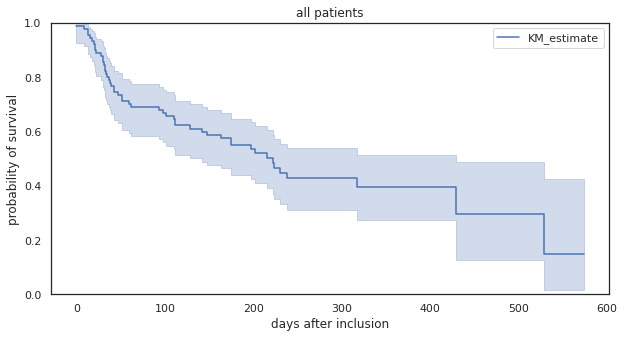

In [407]:
#plot all patients
kmf.plot()
plt.ylim(0,1)
plt.title('all patients')
plt.xlabel('days after inclusion')
plt.ylabel('probability of survival')

In [408]:
#split data
patients_vacc = long_term_ae_grade3[long_term_ae_grade3['vaccinated']]
patients_novacc = long_term_ae_grade3[long_term_ae_grade3['vaccinated']==False]
print('all patients:', long_term_ae_grade3.shape[0])
print('vaccinated patients', patients_vacc.shape[0])
print('unvaccinated patients', patients_novacc.shape[0])

all patients: 90
vaccinated patients 64
unvaccinated patients 26


In [409]:
#fit the parameter values
kmf_high = KaplanMeierFitter()
kmf_low = KaplanMeierFitter()

kmf_high.fit(durations = patients_vacc[os_time_column], event_observed = patients_vacc[os_status_column],label='vac')
kmf_low.fit(durations = patients_novacc[os_time_column], event_observed = patients_novacc[os_status_column],label='novacc')

<lifelines.KaplanMeierFitter:"novacc", fitted with 26 total observations, 6 right-censored observations>

In [410]:
#variables for logrank
Time_A = patients_vacc[os_time_column]
Event_A = patients_vacc[os_status_column]

Time_B = patients_novacc[os_time_column]
Event_B = patients_novacc[os_status_column]

In [411]:
#logrank
from lifelines.statistics import logrank_test

results = logrank_test(Time_A, Time_B, event_observed_A=Event_A, event_observed_B=Event_B)
results.print_summary()
print('P value is:', results.p_value)

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          18.73 <0.005     16.02

P value is: 1.5047888131226484e-05


saved to:1.5047888131226484e-05timeto_grade3_AE.svg


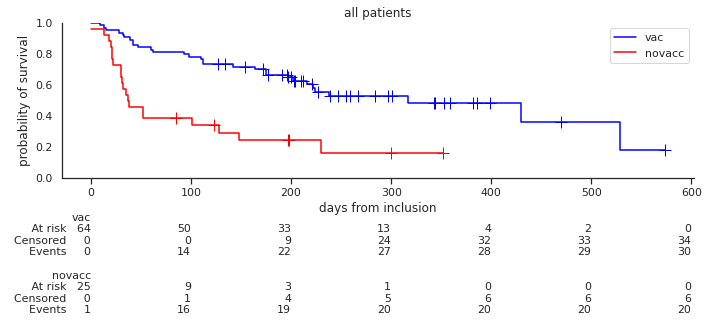

In [412]:
#plot all patients
save_name = 'timeto_grade3_AE.svg'
X = np.linspace(-6, 6, 1024)
fig, ax = plt.subplots()
plt.ylim(0, 1)
#plt.xlim(0,600)
kmf_high.plot(ci_show=False, color='blue',show_censors=True)
kmf_low.plot(ci_show=False, color='red',show_censors=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
plt.title('all patients')
plt.xlabel('days from inclusion')
plt.ylabel('probability of survival')

from lifelines.plotting import add_at_risk_counts
add_at_risk_counts(kmf_high, kmf_low, ax=ax)
plt.tight_layout()

save_path_complete = figure_save_path + str(results.p_value)+save_name
print('saved to:'+ str(results.p_value)+save_name)
plt.savefig(save_path_complete)
kmf_high.event_table.to_csv(figure_source_path+save_name[:-4]+'vacc.csv')
kmf_low.event_table.to_csv(figure_source_path+save_name[:-4]+'unvacc.csv')

In [413]:
#save event tables:
save_path_complete = DATA_DIR + save_name[:-4]+'_vacc'+'.csv'
kmf_high.event_table.to_csv(save_path_complete)
print(save_path_complete[-40:])

_COVID-19/data/timeto_grade3_AE_vacc.csv


In [414]:
#save event tables:
save_path_complete = DATA_DIR + save_name[:-4]+'_unvacc'+'.csv'
kmf_low.event_table.to_csv(save_path_complete)
print(save_path_complete[-40:])

OVID-19/data/timeto_grade3_AE_unvacc.csv


# all AE time to event

In [415]:
#this section with code adapted from https://medium.com/towards-artificial-intelligence/survival-analysis-with-python-tutorial-how-what-when-and-why-19a5cfb3c312
import lifelines
from lifelines import KaplanMeierFitter
from lifelines import CoxPHFitter

In [416]:
landmark = '05/17/2021'
os_time_column = 'time'
os_status_column = 'status'
subset_column_label = 'vaccinated'
save_name = 'all_AE_timetoevent_allpatients.svg'

In [417]:
#prepare AE data (restrict to grade 3 and covnert into time to event formar)
long_term_ae = long_term_ae[~long_term_ae['Patient_ID'].isna()]
patient_table = patient_table[~patient_table.index.isna()]
long_term_ae_grade3 = pd.DataFrame()

for i in set(patient_table.index):
    long_term_ae_subset = long_term_ae[long_term_ae['Patient_ID']==i]
    long_term_ae_subset_grade_ls = long_term_ae_subset['CTCAE_grade'] >= 0
    long_term_ae_subset_grade3 = long_term_ae_subset[long_term_ae_subset['CTCAE_grade'] >= 0]
    if True in list(set(long_term_ae_subset_grade_ls)):
        long_term_ae_subset_grade3_earliest = min(long_term_ae_subset_grade3['Date_AE']) #get first grade 3 AE
        long_term_ae_subset_grade3_status = 1
    else:
        long_term_ae_subset_grade3_earliest = patient_table.loc[list(set(long_term_ae_subset['Patient_ID']))[0]]['last_follow_up']
        long_term_ae_subset_grade3_status = 0

    
    long_term_ae_grade3.loc[i,'date']= long_term_ae_subset_grade3_earliest
    long_term_ae_grade3.loc[i,'status']= long_term_ae_subset_grade3_status
    
long_term_ae_grade3

,date,status
LIK08H,2021-03-26,1.0
RWCFP8,2021-07-27,1.0
F81VCA,2020-10-12,1.0
QLWN64,2021-06-16,1.0
QFE9E8,2021-03-16,1.0
...,...,...
2DP8J8,2021-03-08,1.0
C1ABPH,2020-10-02,1.0
VNW7NT,2021-05-25,1.0
NQ46IB,2021-07-24,1.0


In [418]:
#match vaccination status
long_term_ae_grade3['vaccinated'] = long_term_ae_grade3.index.map(patient_table['vaccinated'].to_dict())
long_term_ae_grade3['date_inclusion'] = long_term_ae_grade3.index.map(patient_table['date_inclusion'].to_dict())
long_term_ae_grade3['time'] = [x.days for x in list(pd.to_datetime(long_term_ae_grade3['date']) - pd.to_datetime(long_term_ae_grade3['date_inclusion']))]
long_term_ae_grade3

,date,status,vaccinated,date_inclusion,time
LIK08H,2021-03-26,1.0,True,2021-01-21,64
RWCFP8,2021-07-27,1.0,False,2021-07-20,7
F81VCA,2020-10-12,1.0,True,2020-09-14,28
QLWN64,2021-06-16,1.0,True,2021-03-10,98
QFE9E8,2021-03-16,1.0,True,2021-03-11,5
...,...,...,...,...,...
2DP8J8,2021-03-08,1.0,False,2021-02-08,28
C1ABPH,2020-10-02,1.0,False,2020-09-25,7
VNW7NT,2021-05-25,1.0,False,2021-05-03,22
NQ46IB,2021-07-24,1.0,True,2020-06-18,401


In [419]:
#create an object for kaplan-meier-fitter
kmf= KaplanMeierFitter()

In [420]:
kmf.fit(durations = long_term_ae_grade3[os_time_column].astype(float), event_observed = long_term_ae_grade3[os_status_column].astype(float))

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 90 total observations, 3 right-censored observations>

In [421]:
#generate event table
kmf.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
-30.0,1,1,0,90,90
-3.0,1,1,0,0,89
0.0,3,3,0,0,88
1.0,1,1,0,0,85
4.0,1,1,0,0,84
5.0,2,2,0,0,83
6.0,2,2,0,0,81
7.0,2,2,0,0,79
8.0,2,2,0,0,77


Text(0, 0.5, 'probability of survival')

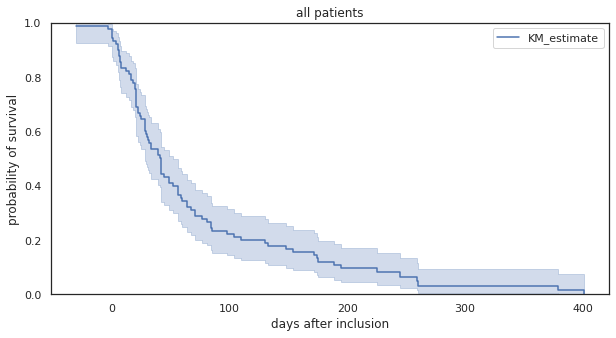

In [422]:
#plot all patients
kmf.plot()
plt.ylim(0,1)
plt.title('all patients')
plt.xlabel('days after inclusion')
plt.ylabel('probability of survival')

In [423]:
#split data
patients_vacc = long_term_ae_grade3[long_term_ae_grade3['vaccinated']]
patients_novacc = long_term_ae_grade3[long_term_ae_grade3['vaccinated']==False]
print('all patients:', long_term_ae_grade3.shape[0])
print('vaccinated patients', patients_vacc.shape[0])
print('unvaccinated patients', patients_novacc.shape[0])

all patients: 90
vaccinated patients 64
unvaccinated patients 26


In [424]:
#fit the parameter values
kmf_high = KaplanMeierFitter()
kmf_low = KaplanMeierFitter()

kmf_high.fit(durations = patients_vacc[os_time_column], event_observed = patients_vacc[os_status_column],label='vac')
kmf_low.fit(durations = patients_novacc[os_time_column], event_observed = patients_novacc[os_status_column],label='novacc')

<lifelines.KaplanMeierFitter:"novacc", fitted with 26 total observations, 0 right-censored observations>

In [425]:
#variables for logrank
Time_A = patients_vacc[os_time_column]
Event_A = patients_vacc[os_status_column]

Time_B = patients_novacc[os_time_column]
Event_B = patients_novacc[os_status_column]

In [426]:
#logrank
from lifelines.statistics import logrank_test

results = logrank_test(Time_A, Time_B, event_observed_A=Event_A, event_observed_B=Event_B)
results.print_summary()
print('P value is:', results.p_value)

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          19.42 <0.005     16.54

P value is: 1.0475761018388364e-05


saved to:1.0475761018388364e-05timeto_any_AE.svg


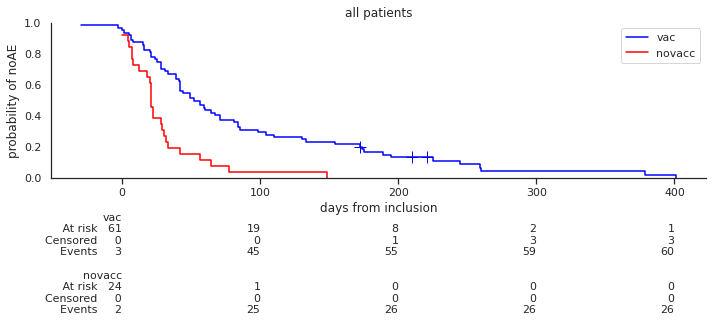

In [427]:
#plot all patients
save_name = 'timeto_any_AE.svg'
X = np.linspace(-6, 6, 1024)
fig, ax = plt.subplots()
plt.ylim(0, 1)
#plt.xlim(0,600)
kmf_high.plot(ci_show=False, color='blue',show_censors=True)
kmf_low.plot(ci_show=False, color='red',show_censors=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
plt.title('all patients')
plt.xlabel('days from inclusion')
plt.ylabel('probability of noAE')

from lifelines.plotting import add_at_risk_counts
add_at_risk_counts(kmf_high, kmf_low, ax=ax)
plt.tight_layout()

save_path_complete = figure_save_path + str(results.p_value)+save_name
print('saved to:'+ str(results.p_value)+save_name)
plt.savefig(save_path_complete)
kmf_high.event_table.to_csv(figure_source_path+save_name[:-4]+'vacc.csv')
kmf_low.event_table.to_csv(figure_source_path+save_name[:-4]+'unvacc.csv')

In [428]:
#save event tables:
save_path_complete = DATA_DIR + save_name[:-4]+'_vacc'+'.csv'
kmf_high.event_table.to_csv(save_path_complete)
print(save_path_complete[-40:])

ATE_COVID-19/data/timeto_any_AE_vacc.csv


In [429]:
#save event tables:
save_path_complete = DATA_DIR + save_name[:-4]+'_unvacc'+'.csv'
kmf_low.event_table.to_csv(save_path_complete)
print(save_path_complete[-40:])

E_COVID-19/data/timeto_any_AE_unvacc.csv


# all AE before vacc

In [430]:
#this section with code adapted from https://medium.com/towards-artificial-intelligence/survival-analysis-with-python-tutorial-how-what-when-and-why-19a5cfb3c312
import lifelines
from lifelines import KaplanMeierFitter
from lifelines import CoxPHFitter

In [431]:
os_time_column = 'time'
os_status_column = 'status'
subset_column_label = 'vaccinated'

In [432]:
#prepare AE data (restrict to grade 3 and covnert into time to event formar)
long_term_ae = long_term_ae[~long_term_ae['Patient_ID'].isna()]
patient_table = patient_table[~patient_table.index.isna()]
long_term_ae_grade3 = pd.DataFrame()

for i in set(patient_table.index):
    long_term_ae_subset = long_term_ae[long_term_ae['Patient_ID']==i]
    long_term_ae_subset_grade_ls = long_term_ae_subset['CTCAE_grade'] >= 0
    long_term_ae_subset_grade3 = long_term_ae_subset[long_term_ae_subset['CTCAE_grade'] >= 0]
    if True in list(set(long_term_ae_subset_grade_ls)):
        long_term_ae_subset_grade3_earliest = min(long_term_ae_subset_grade3['Date_AE']) #get first grade 3 AE
        long_term_ae_subset_grade3_status = 1
    else:
        long_term_ae_subset_grade3_earliest = patient_table.loc[list(set(long_term_ae_subset['Patient_ID']))[0]]['last_follow_up']
        long_term_ae_subset_grade3_status = 0

    
    long_term_ae_grade3.loc[i,'date']= long_term_ae_subset_grade3_earliest
    long_term_ae_grade3.loc[i,'status']= long_term_ae_subset_grade3_status
    
long_term_ae_grade3

,date,status
LIK08H,2021-03-26,1.0
RWCFP8,2021-07-27,1.0
F81VCA,2020-10-12,1.0
QLWN64,2021-06-16,1.0
QFE9E8,2021-03-16,1.0
...,...,...
2DP8J8,2021-03-08,1.0
C1ABPH,2020-10-02,1.0
VNW7NT,2021-05-25,1.0
NQ46IB,2021-07-24,1.0


In [433]:
#match vaccination status
long_term_ae_grade3['vaccinated'] = long_term_ae_grade3.index.map(patient_table['vaccinated'].to_dict())
long_term_ae_grade3['date_inclusion'] = long_term_ae_grade3.index.map(patient_table['date_inclusion'].to_dict())
long_term_ae_grade3['First_dose_date'] = long_term_ae_grade3.index.map(patient_table['First_dose_date'].to_dict())
long_term_ae_grade3['time'] = [x.days for x in list(pd.to_datetime(long_term_ae_grade3['date']) - pd.to_datetime(long_term_ae_grade3['date_inclusion']))]
long_term_ae_grade3['time_from_vacc'] = [x.days for x in list(pd.to_datetime(long_term_ae_grade3['date']) - pd.to_datetime(long_term_ae_grade3['First_dose_date']))]
long_term_ae_grade3['time_vacc_after_inc'] = [x.days for x in list(pd.to_datetime(long_term_ae_grade3['First_dose_date']) - pd.to_datetime(long_term_ae_grade3['date_inclusion']))]

long_term_ae_grade3

,date,status,vaccinated,date_inclusion,First_dose_date,time,time_from_vacc,time_vacc_after_inc
LIK08H,2021-03-26,1.0,True,2021-01-21,2021-03-05,64,21.0,43.0
RWCFP8,2021-07-27,1.0,False,2021-07-20,NaT,7,NaN,NaN
F81VCA,2020-10-12,1.0,True,2020-09-14,2021-04-14,28,-184.0,212.0
QLWN64,2021-06-16,1.0,True,2021-03-10,2021-04-18,98,59.0,39.0
QFE9E8,2021-03-16,1.0,True,2021-03-11,2021-03-14,5,2.0,3.0
...,...,...,...,...,...,...,...,...
2DP8J8,2021-03-08,1.0,False,2021-02-08,NaT,28,NaN,NaN
C1ABPH,2020-10-02,1.0,False,2020-09-25,NaT,7,NaN,NaN
VNW7NT,2021-05-25,1.0,False,2021-05-03,NaT,22,NaN,NaN
NQ46IB,2021-07-24,1.0,True,2020-06-18,2021-04-26,401,89.0,312.0


In [434]:
#remove unvacc patients
long_term_ae_grade3 = long_term_ae_grade3[long_term_ae_grade3['vaccinated']==True]
long_term_ae_grade3

,date,status,vaccinated,date_inclusion,First_dose_date,time,time_from_vacc,time_vacc_after_inc
LIK08H,2021-03-26,1.0,True,2021-01-21,2021-03-05,64,21.0,43.0
F81VCA,2020-10-12,1.0,True,2020-09-14,2021-04-14,28,-184.0,212.0
QLWN64,2021-06-16,1.0,True,2021-03-10,2021-04-18,98,59.0,39.0
QFE9E8,2021-03-16,1.0,True,2021-03-11,2021-03-14,5,2.0,3.0
J7CXX9,2021-03-03,1.0,True,2020-11-19,2021-04-15,104,-43.0,147.0
...,...,...,...,...,...,...,...,...
19U0MP,2021-05-26,1.0,True,2021-05-20,2021-04-29,6,27.0,-21.0
E61BKL,2020-11-05,1.0,True,2020-08-13,2021-01-20,84,-76.0,160.0
FWO178,2021-05-03,1.0,True,2021-03-22,2021-03-23,42,41.0,1.0
NQ46IB,2021-07-24,1.0,True,2020-06-18,2021-04-26,401,89.0,312.0


In [435]:
#for all patients with first AE happening after vacc set 
for i in long_term_ae_grade3.index:
    if long_term_ae_grade3.loc[i,'time_from_vacc']>0:
        long_term_ae_grade3.loc[i,'time'] = long_term_ae_grade3.loc[i,'time_vacc_after_inc'] 
        long_term_ae_grade3.loc[i,'status'] = 0

long_term_ae_grade3

,date,status,vaccinated,date_inclusion,First_dose_date,time,time_from_vacc,time_vacc_after_inc
LIK08H,2021-03-26,0.0,True,2021-01-21,2021-03-05,43,21.0,43.0
F81VCA,2020-10-12,1.0,True,2020-09-14,2021-04-14,28,-184.0,212.0
QLWN64,2021-06-16,0.0,True,2021-03-10,2021-04-18,39,59.0,39.0
QFE9E8,2021-03-16,0.0,True,2021-03-11,2021-03-14,3,2.0,3.0
J7CXX9,2021-03-03,1.0,True,2020-11-19,2021-04-15,104,-43.0,147.0
...,...,...,...,...,...,...,...,...
19U0MP,2021-05-26,0.0,True,2021-05-20,2021-04-29,-21,27.0,-21.0
E61BKL,2020-11-05,1.0,True,2020-08-13,2021-01-20,84,-76.0,160.0
FWO178,2021-05-03,0.0,True,2021-03-22,2021-03-23,1,41.0,1.0
NQ46IB,2021-07-24,0.0,True,2020-06-18,2021-04-26,312,89.0,312.0


In [436]:
#remove patients with 1st vacc before inclusion
long_term_ae_grade3 = long_term_ae_grade3[long_term_ae_grade3['time']>=0]

In [437]:
#create an object for kaplan-meier-fitter
kmf= KaplanMeierFitter()

In [438]:
kmf.fit(durations = long_term_ae_grade3[os_time_column].astype(float), event_observed = long_term_ae_grade3[os_status_column].astype(float))

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 57 total observations, 30 right-censored observations>

In [439]:
#generate event table
kmf.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,1,1,0,57,57
1.0,2,1,1,0,56
3.0,1,0,1,0,54
6.0,2,1,1,0,53
9.0,1,0,1,0,51
11.0,1,0,1,0,50
12.0,1,0,1,0,49
15.0,1,1,0,0,48
16.0,2,1,1,0,47


saved to:1.0475761018388364e-05any_AE_before_vacc.svg


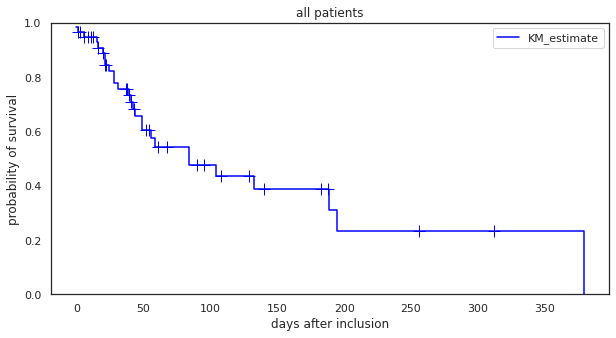

In [440]:
#plot all patients
save_name = 'any_AE_before_vacc.svg'
kmf.plot(ci_show=False, color='blue',show_censors=True)
plt.ylim(0,1)
plt.title('all patients')
plt.xlabel('days after inclusion')
plt.ylabel('probability of survival')
save_path_complete = figure_save_path + str(results.p_value)+save_name
print('saved to:'+ str(results.p_value)+save_name)
plt.savefig(save_path_complete)
kmf.event_table.to_csv(figure_source_path+save_name[:-4]+'before_vacc.csv')

# grade 3 AE before vacc

In [441]:
#this section with code adapted from https://medium.com/towards-artificial-intelligence/survival-analysis-with-python-tutorial-how-what-when-and-why-19a5cfb3c312
import lifelines
from lifelines import KaplanMeierFitter
from lifelines import CoxPHFitter

In [442]:
os_time_column = 'time'
os_status_column = 'status'
subset_column_label = 'vaccinated'

In [443]:
#prepare AE data (restrict to grade 3 and covnert into time to event formar)
long_term_ae = long_term_ae[~long_term_ae['Patient_ID'].isna()]
patient_table = patient_table[~patient_table.index.isna()]
long_term_ae_grade3 = pd.DataFrame()

for i in set(patient_table.index):
    long_term_ae_subset = long_term_ae[long_term_ae['Patient_ID']==i]
    long_term_ae_subset_grade_ls = long_term_ae_subset['CTCAE_grade'] >= 3
    long_term_ae_subset_grade3 = long_term_ae_subset[long_term_ae_subset['CTCAE_grade'] >= 3]
    if True in list(set(long_term_ae_subset_grade_ls)):
        long_term_ae_subset_grade3_earliest = min(long_term_ae_subset_grade3['Date_AE']) #get first grade 3 AE
        long_term_ae_subset_grade3_status = 1
    else:
        long_term_ae_subset_grade3_earliest = patient_table.loc[list(set(long_term_ae_subset['Patient_ID']))[0]]['last_follow_up']
        long_term_ae_subset_grade3_status = 0

    
    long_term_ae_grade3.loc[i,'date']= long_term_ae_subset_grade3_earliest
    long_term_ae_grade3.loc[i,'status']= long_term_ae_subset_grade3_status
    
long_term_ae_grade3

,date,status
LIK08H,2021-08-31,1.0
RWCFP8,2021-08-27,1.0
F81VCA,2021-10-01,0.0
QLWN64,2021-06-16,1.0
QFE9E8,2021-10-01,0.0
...,...,...
2DP8J8,2021-09-26,1.0
C1ABPH,2021-01-04,1.0
VNW7NT,2021-06-02,1.0
NQ46IB,2021-10-01,0.0


In [444]:
#match vaccination status
long_term_ae_grade3['vaccinated'] = long_term_ae_grade3.index.map(patient_table['vaccinated'].to_dict())
long_term_ae_grade3['date_inclusion'] = long_term_ae_grade3.index.map(patient_table['date_inclusion'].to_dict())
long_term_ae_grade3['First_dose_date'] = long_term_ae_grade3.index.map(patient_table['First_dose_date'].to_dict())
long_term_ae_grade3['time'] = [x.days for x in list(pd.to_datetime(long_term_ae_grade3['date']) - pd.to_datetime(long_term_ae_grade3['date_inclusion']))]
long_term_ae_grade3['time_from_vacc'] = [x.days for x in list(pd.to_datetime(long_term_ae_grade3['date']) - pd.to_datetime(long_term_ae_grade3['First_dose_date']))]
long_term_ae_grade3['time_vacc_after_inc'] = [x.days for x in list(pd.to_datetime(long_term_ae_grade3['First_dose_date']) - pd.to_datetime(long_term_ae_grade3['date_inclusion']))]

long_term_ae_grade3

,date,status,vaccinated,date_inclusion,First_dose_date,time,time_from_vacc,time_vacc_after_inc
LIK08H,2021-08-31,1.0,True,2021-01-21,2021-03-05,222,179.0,43.0
RWCFP8,2021-08-27,1.0,False,2021-07-20,NaT,38,NaN,NaN
F81VCA,2021-10-01,0.0,True,2020-09-14,2021-04-14,382,170.0,212.0
QLWN64,2021-06-16,1.0,True,2021-03-10,2021-04-18,98,59.0,39.0
QFE9E8,2021-10-01,0.0,True,2021-03-11,2021-03-14,204,201.0,3.0
...,...,...,...,...,...,...,...,...
2DP8J8,2021-09-26,1.0,False,2021-02-08,NaT,230,NaN,NaN
C1ABPH,2021-01-04,1.0,False,2020-09-25,NaT,101,NaN,NaN
VNW7NT,2021-06-02,1.0,False,2021-05-03,NaT,30,NaN,NaN
NQ46IB,2021-10-01,0.0,True,2020-06-18,2021-04-26,470,158.0,312.0


In [445]:
#remove unvacc patients
long_term_ae_grade3 = long_term_ae_grade3[long_term_ae_grade3['vaccinated']==True]
long_term_ae_grade3

,date,status,vaccinated,date_inclusion,First_dose_date,time,time_from_vacc,time_vacc_after_inc
LIK08H,2021-08-31,1.0,True,2021-01-21,2021-03-05,222,179.0,43.0
F81VCA,2021-10-01,0.0,True,2020-09-14,2021-04-14,382,170.0,212.0
QLWN64,2021-06-16,1.0,True,2021-03-10,2021-04-18,98,59.0,39.0
QFE9E8,2021-10-01,0.0,True,2021-03-11,2021-03-14,204,201.0,3.0
J7CXX9,2021-06-04,1.0,True,2020-11-19,2021-04-15,197,50.0,147.0
...,...,...,...,...,...,...,...,...
19U0MP,2021-10-01,0.0,True,2021-05-20,2021-04-29,134,155.0,-21.0
E61BKL,2020-12-03,1.0,True,2020-08-13,2021-01-20,112,-48.0,160.0
FWO178,2021-05-03,1.0,True,2021-03-22,2021-03-23,42,41.0,1.0
NQ46IB,2021-10-01,0.0,True,2020-06-18,2021-04-26,470,158.0,312.0


In [446]:
#for all patients with first AE happening after vacc set 
for i in long_term_ae_grade3.index:
    if long_term_ae_grade3.loc[i,'time_from_vacc']>0:
        long_term_ae_grade3.loc[i,'time'] = long_term_ae_grade3.loc[i,'time_vacc_after_inc'] 
        long_term_ae_grade3.loc[i,'status'] = 0

long_term_ae_grade3

,date,status,vaccinated,date_inclusion,First_dose_date,time,time_from_vacc,time_vacc_after_inc
LIK08H,2021-08-31,0.0,True,2021-01-21,2021-03-05,43,179.0,43.0
F81VCA,2021-10-01,0.0,True,2020-09-14,2021-04-14,212,170.0,212.0
QLWN64,2021-06-16,0.0,True,2021-03-10,2021-04-18,39,59.0,39.0
QFE9E8,2021-10-01,0.0,True,2021-03-11,2021-03-14,3,201.0,3.0
J7CXX9,2021-06-04,0.0,True,2020-11-19,2021-04-15,147,50.0,147.0
...,...,...,...,...,...,...,...,...
19U0MP,2021-10-01,0.0,True,2021-05-20,2021-04-29,-21,155.0,-21.0
E61BKL,2020-12-03,1.0,True,2020-08-13,2021-01-20,112,-48.0,160.0
FWO178,2021-05-03,0.0,True,2021-03-22,2021-03-23,1,41.0,1.0
NQ46IB,2021-10-01,0.0,True,2020-06-18,2021-04-26,312,158.0,312.0


In [447]:
#remove patients with 1st vacc before inclusion
long_term_ae_grade3 = long_term_ae_grade3[long_term_ae_grade3['time']>=0]

In [448]:
#create an object for kaplan-meier-fitter
kmf= KaplanMeierFitter()

In [449]:
kmf.fit(durations = long_term_ae_grade3[os_time_column].astype(float), event_observed = long_term_ae_grade3[os_status_column].astype(float))

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 57 total observations, 49 right-censored observations>

In [450]:
#generate event table
kmf.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,57,57
1.0,1,0,1,0,57
3.0,1,0,1,0,56
6.0,1,0,1,0,55
9.0,2,1,1,0,54
11.0,1,0,1,0,52
12.0,1,0,1,0,51
15.0,1,1,0,0,50
16.0,1,0,1,0,49


saved to:1.0475761018388364e-05grade3_AE_before_vacc.svg


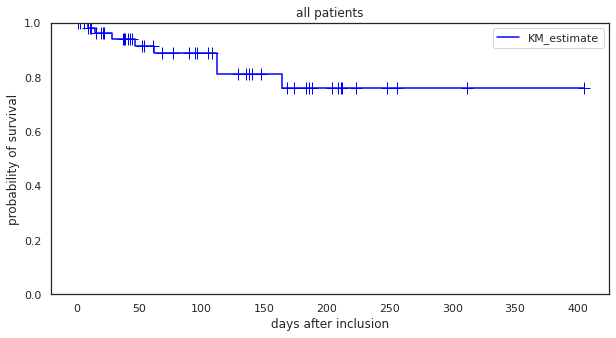

In [451]:
#plot all patients
save_name = 'grade3_AE_before_vacc.svg'
kmf.plot(ci_show=False, color='blue',show_censors=True)
plt.ylim(0,1)
plt.title('all patients')
plt.xlabel('days after inclusion')
plt.ylabel('probability of survival')
save_path_complete = figure_save_path + str(results.p_value)+save_name
print('saved to:'+ str(results.p_value)+save_name)
plt.savefig(save_path_complete)
kmf.event_table.to_csv(figure_source_path+save_name[:-4]+'before_vacc.csv')

# Grade 3 AE time to event (from 1st dose)

In [452]:
#this section with code adapted from https://medium.com/towards-artificial-intelligence/survival-analysis-with-python-tutorial-how-what-when-and-why-19a5cfb3c312
import lifelines
from lifelines import KaplanMeierFitter
from lifelines import CoxPHFitter

In [453]:
landmark = '05/17/2021'
os_time_column = 'time'
os_status_column = 'status'
subset_column_label = 'vaccinated'
save_name = 'grade3_AE_timetoevent_from-vacc1stdose_allpatients.svg'

In [454]:
long_term_ae_subset_grade3

,Unnamed: 0.1,Unnamed: 0,Patient_ID,Long_Term_AE_1,Date_AE,CTCAE_grade,IrAE.RS,virtual_first_vacc


In [455]:
#prepare AE data (restrict to grade 3 and covnert into time to event formar)
long_term_ae = long_term_ae[~long_term_ae['Patient_ID'].isna()]
patient_table = patient_table[~patient_table.index.isna()]
long_term_ae_grade3 = pd.DataFrame()

for i in set(patient_table.index):
    long_term_ae_subset = long_term_ae[long_term_ae['Patient_ID']==i]
    long_term_ae_subset_grade_ls = long_term_ae_subset['CTCAE_grade'] >= 3
    long_term_ae_subset_grade3 = long_term_ae_subset[long_term_ae_subset['CTCAE_grade'] >= 3]
    if True in list(set(long_term_ae_subset_grade_ls)):
        long_term_ae_subset_grade3_earliest = min(long_term_ae_subset_grade3['Date_AE']) #get first grade 3 AE
        long_term_ae_subset_grade3_status = 1
    else:
        long_term_ae_subset_grade3_earliest = patient_table.loc[list(set(long_term_ae_subset['Patient_ID']))[0]]['last_follow_up']
        long_term_ae_subset_grade3_status = 0

    
    long_term_ae_grade3.loc[i,'date']= long_term_ae_subset_grade3_earliest
    long_term_ae_grade3.loc[i,'status']= long_term_ae_subset_grade3_status
    
long_term_ae_grade3

,date,status
LIK08H,2021-08-31,1.0
RWCFP8,2021-08-27,1.0
F81VCA,2021-10-01,0.0
QLWN64,2021-06-16,1.0
QFE9E8,2021-10-01,0.0
...,...,...
2DP8J8,2021-09-26,1.0
C1ABPH,2021-01-04,1.0
VNW7NT,2021-06-02,1.0
NQ46IB,2021-10-01,0.0


In [456]:
#med time first vacc from incl.
patient_table_vacc = patient_table[patient_table['vaccinated']==True]
days_until_vacc = [x.days for x in list(pd.to_datetime(patient_table_vacc['First_dose_date'])- pd.to_datetime(patient_table_vacc['date_inclusion']))]
print('median days until 1st vacc',np.median(days_until_vacc)) 
print('min days until 1st vacc',np.min(days_until_vacc)) 
print('max days until 1st vacc',np.max(days_until_vacc)) 

median days until 1st vacc 90.5
min days until 1st vacc -52
max days until 1st vacc 405


In [457]:
#match vaccination status
long_term_ae_grade3['vaccinated'] = long_term_ae_grade3.index.map(patient_table['vaccinated'].to_dict())
#restrict to vacc
long_term_ae_grade3 = long_term_ae_grade3[long_term_ae_grade3['vaccinated']==True]
long_term_ae_grade3['date_vaccination'] = long_term_ae_grade3.index.map(patient_table['First_dose_date'].to_dict())
long_term_ae_grade3['time'] = [x.days for x in list(pd.to_datetime(long_term_ae_grade3['date']) - pd.to_datetime(long_term_ae_grade3['date_vaccination']))]
long_term_ae_grade3

,date,status,vaccinated,date_vaccination,time
LIK08H,2021-08-31,1.0,True,2021-03-05,179
F81VCA,2021-10-01,0.0,True,2021-04-14,170
QLWN64,2021-06-16,1.0,True,2021-04-18,59
QFE9E8,2021-10-01,0.0,True,2021-03-14,201
J7CXX9,2021-06-04,1.0,True,2021-04-15,50
...,...,...,...,...,...
19U0MP,2021-10-01,0.0,True,2021-04-29,155
E61BKL,2020-12-03,1.0,True,2021-01-20,-48
FWO178,2021-05-03,1.0,True,2021-03-23,41
NQ46IB,2021-10-01,0.0,True,2021-04-26,158


In [458]:
#create an object for kaplan-meier-fitter
kmf= KaplanMeierFitter()

In [459]:
kmf.fit(durations = long_term_ae_grade3[os_time_column].astype(float), event_observed = long_term_ae_grade3[os_status_column].astype(float))

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 64 total observations, 34 right-censored observations>

In [460]:
#generate event table
kmf.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
-203.0,2,2,0,64,64
-153.0,1,1,0,0,62
-135.0,1,1,0,0,61
-106.0,1,1,0,0,60
-97.0,1,1,0,0,59
-48.0,1,1,0,0,58
-29.0,1,1,0,0,57
4.0,1,1,0,0,56
5.0,1,1,0,0,55


In [461]:
kmf.event_table.to_csv(figure_source_path+'vaccinated_timefrom_1stvacc_grade3AE.csv')

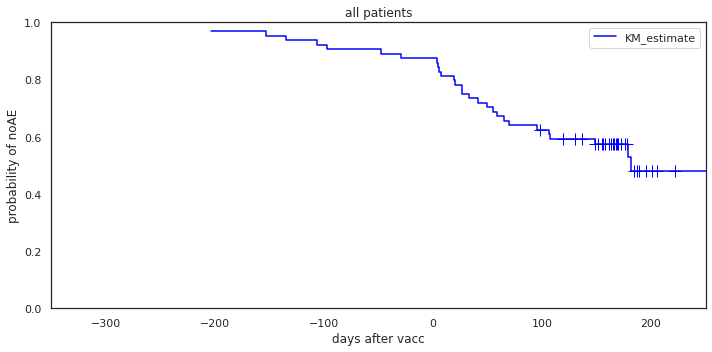

In [462]:
#plot all patients
fig, ax = plt.subplots()
kmf.plot(ci_show=False, color='blue',show_censors=True)
plt.ylim(0,1)
plt.xlim(-350,250)
plt.title('all patients')
plt.xlabel('days after vacc')
plt.ylabel('probability of noAE')
from lifelines.plotting import add_at_risk_counts
#add_at_risk_counts(kmf, ax=ax)
plt.tight_layout()
save_path_complete = figure_save_path + 'vaccinated_time_from_1st_grade3AE.svg'
plt.savefig(save_path_complete)

# Any AE time to event (from 1st dose)

In [463]:
#this section with code adapted from https://medium.com/towards-artificial-intelligence/survival-analysis-with-python-tutorial-how-what-when-and-why-19a5cfb3c312
import lifelines
from lifelines import KaplanMeierFitter
from lifelines import CoxPHFitter

In [464]:
landmark = '05/17/2021'
os_time_column = 'time'
os_status_column = 'status'
subset_column_label = 'vaccinated'
save_name = 'any_AE_timetoevent_from-vacc1stdose_allpatients.svg'

In [465]:
#prepare AE data (restrict to grade 3 and covnert into time to event formar)
long_term_ae = long_term_ae[~long_term_ae['Patient_ID'].isna()]
patient_table = patient_table[~patient_table.index.isna()]
long_term_ae_grade3 = pd.DataFrame()

for i in set(patient_table.index):
    long_term_ae_subset = long_term_ae[long_term_ae['Patient_ID']==i]
    long_term_ae_subset_grade_ls = long_term_ae_subset['CTCAE_grade'] >= 0
    long_term_ae_subset_grade3 = long_term_ae_subset[long_term_ae_subset['CTCAE_grade'] >= 0]
    if True in list(set(long_term_ae_subset_grade_ls)):
        long_term_ae_subset_grade3_earliest = min(long_term_ae_subset_grade3['Date_AE']) #get first grade 3 AE
        long_term_ae_subset_grade3_status = 1
    else:
        long_term_ae_subset_grade3_earliest = patient_table.loc[list(set(long_term_ae_subset['Patient_ID']))[0]]['last_follow_up']
        long_term_ae_subset_grade3_status = 0

    
    long_term_ae_grade3.loc[i,'date']= long_term_ae_subset_grade3_earliest
    long_term_ae_grade3.loc[i,'status']= long_term_ae_subset_grade3_status
    
long_term_ae_grade3

,date,status
LIK08H,2021-03-26,1.0
RWCFP8,2021-07-27,1.0
F81VCA,2020-10-12,1.0
QLWN64,2021-06-16,1.0
QFE9E8,2021-03-16,1.0
...,...,...
2DP8J8,2021-03-08,1.0
C1ABPH,2020-10-02,1.0
VNW7NT,2021-05-25,1.0
NQ46IB,2021-07-24,1.0


In [466]:
#med time first vacc from incl.
patient_table_vacc = patient_table[patient_table['vaccinated']==True]
days_until_vacc = [x.days for x in list(pd.to_datetime(patient_table_vacc['First_dose_date'])- pd.to_datetime(patient_table_vacc['date_inclusion']))]
print('median days until 1st vacc',np.median(days_until_vacc)) 
print('min days until 1st vacc',np.min(days_until_vacc)) 
print('max days until 1st vacc',np.max(days_until_vacc)) 

median days until 1st vacc 90.5
min days until 1st vacc -52
max days until 1st vacc 405


In [467]:
#match vaccination status
long_term_ae_grade3['vaccinated'] = long_term_ae_grade3.index.map(patient_table['vaccinated'].to_dict())
#restrict to vacc
long_term_ae_grade3 = long_term_ae_grade3[long_term_ae_grade3['vaccinated']==True]
long_term_ae_grade3['date_vaccination'] = long_term_ae_grade3.index.map(patient_table['First_dose_date'].to_dict())
long_term_ae_grade3['time'] = [x.days for x in list(pd.to_datetime(long_term_ae_grade3['date']) - pd.to_datetime(long_term_ae_grade3['date_vaccination']))]
long_term_ae_grade3

,date,status,vaccinated,date_vaccination,time
LIK08H,2021-03-26,1.0,True,2021-03-05,21
F81VCA,2020-10-12,1.0,True,2021-04-14,-184
QLWN64,2021-06-16,1.0,True,2021-04-18,59
QFE9E8,2021-03-16,1.0,True,2021-03-14,2
J7CXX9,2021-03-03,1.0,True,2021-04-15,-43
...,...,...,...,...,...
19U0MP,2021-05-26,1.0,True,2021-04-29,27
E61BKL,2020-11-05,1.0,True,2021-01-20,-76
FWO178,2021-05-03,1.0,True,2021-03-23,41
NQ46IB,2021-07-24,1.0,True,2021-04-26,89


In [468]:
#remove nan
long_term_ae_grade3[~long_term_ae_grade3[os_time_column].isna()]

,date,status,vaccinated,date_vaccination,time
LIK08H,2021-03-26,1.0,True,2021-03-05,21
F81VCA,2020-10-12,1.0,True,2021-04-14,-184
QLWN64,2021-06-16,1.0,True,2021-04-18,59
QFE9E8,2021-03-16,1.0,True,2021-03-14,2
J7CXX9,2021-03-03,1.0,True,2021-04-15,-43
...,...,...,...,...,...
19U0MP,2021-05-26,1.0,True,2021-04-29,27
E61BKL,2020-11-05,1.0,True,2021-01-20,-76
FWO178,2021-05-03,1.0,True,2021-03-23,41
NQ46IB,2021-07-24,1.0,True,2021-04-26,89


In [469]:
#create an object for kaplan-meier-fitter
kmf= KaplanMeierFitter()

In [470]:
kmf.fit(durations = long_term_ae_grade3[os_time_column].astype(int), event_observed = long_term_ae_grade3[os_status_column].astype(int))

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 64 total observations, 3 right-censored observations>

In [471]:
#generate event table
kmf.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
-308.0,1,1,0,64,64
-266.0,1,1,0,0,63
-192.0,1,1,0,0,62
-190.0,1,1,0,0,61
-184.0,1,1,0,0,60
-162.0,2,2,0,0,59
-156.0,1,1,0,0,57
-155.0,1,1,0,0,56
-153.0,1,1,0,0,55


In [472]:
kmf.event_table.to_csv(figure_source_path+'vaccinated_timefrom_1stvacc_anyAE.csv')

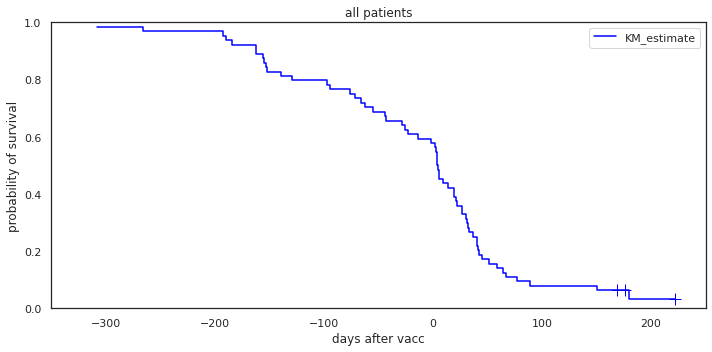

In [473]:
#plot all patients
fig,ax=plt.subplots()
kmf.plot(ci_show=False, color='blue',show_censors=True)
plt.ylim(0,1)
plt.xlim(-350,250)
plt.title('all patients')
plt.xlabel('days after vacc')
plt.ylabel('probability of survival')
from lifelines.plotting import add_at_risk_counts
#add_at_risk_counts(kmf_high, kmf_low, ax=ax)
plt.tight_layout()
save_path_complete = figure_save_path + 'vaccinated_time_from_1st_anyAE.svg'
plt.savefig(save_path_complete)

# Grade 3 AE time to event (from 2nd dose)

In [474]:
#this section with code adapted from https://medium.com/towards-artificial-intelligence/survival-analysis-with-python-tutorial-how-what-when-and-why-19a5cfb3c312
import lifelines
from lifelines import KaplanMeierFitter
from lifelines import CoxPHFitter

In [475]:
landmark = '05/17/2021'
os_time_column = 'time'
os_status_column = 'status'
subset_column_label = 'vaccinated'
save_name = 'grade3_AE_timetoevent_from-vacc2nddose_allpatients.svg'

In [476]:
#prepare AE data (restrict to grade 3 and covnert into time to event formar)
long_term_ae = long_term_ae[~long_term_ae['Patient_ID'].isna()]
patient_table = patient_table[~patient_table.index.isna()]
long_term_ae_grade3 = pd.DataFrame()

for i in set(patient_table.index):
    long_term_ae_subset = long_term_ae[long_term_ae['Patient_ID']==i]
    long_term_ae_subset_grade_ls = long_term_ae_subset['CTCAE_grade'] >= 3
    long_term_ae_subset_grade3 = long_term_ae_subset[long_term_ae_subset['CTCAE_grade'] >= 3]
    if True in list(set(long_term_ae_subset_grade_ls)):
        long_term_ae_subset_grade3_earliest = min(long_term_ae_subset_grade3['Date_AE']) #get first grade 3 AE
        long_term_ae_subset_grade3_status = 1
    else:
        long_term_ae_subset_grade3_earliest = patient_table.loc[list(set(long_term_ae_subset['Patient_ID']))[0]]['last_follow_up']
        long_term_ae_subset_grade3_status = 0

    
    long_term_ae_grade3.loc[i,'date']= long_term_ae_subset_grade3_earliest
    long_term_ae_grade3.loc[i,'status']= long_term_ae_subset_grade3_status
    
long_term_ae_grade3

,date,status
LIK08H,2021-08-31,1.0
RWCFP8,2021-08-27,1.0
F81VCA,2021-10-01,0.0
QLWN64,2021-06-16,1.0
QFE9E8,2021-10-01,0.0
...,...,...
2DP8J8,2021-09-26,1.0
C1ABPH,2021-01-04,1.0
VNW7NT,2021-06-02,1.0
NQ46IB,2021-10-01,0.0


In [477]:
#med time first vacc from incl.
patient_table_vacc = patient_table[patient_table['vaccinated']==True]
days_until_vacc = [x.days for x in list(pd.to_datetime(patient_table_vacc['Second_dose_date'])- pd.to_datetime(patient_table_vacc['date_inclusion']))]
print('median days until 1st vacc',np.median(days_until_vacc)) 
print('min days until 1st vacc',np.min(days_until_vacc)) 
print('max days until 1st vacc',np.max(days_until_vacc)) 

median days until 1st vacc nan
min days until 1st vacc nan
max days until 1st vacc nan


In [478]:
#match vaccination status
long_term_ae_grade3['vaccinated'] = long_term_ae_grade3.index.map(patient_table['vaccinated'].to_dict())
#restrict to vacc
long_term_ae_grade3 = long_term_ae_grade3[long_term_ae_grade3['vaccinated']==True]
long_term_ae_grade3['date_vaccination'] = long_term_ae_grade3.index.map(patient_table['Second_dose_date'].to_dict())
long_term_ae_grade3['time'] = [x.days for x in list(pd.to_datetime(long_term_ae_grade3['date']) - pd.to_datetime(long_term_ae_grade3['date_vaccination']))]
long_term_ae_grade3

,date,status,vaccinated,date_vaccination,time
LIK08H,2021-08-31,1.0,True,2021-03-26,158.0
F81VCA,2021-10-01,0.0,True,2021-05-19,135.0
QLWN64,2021-06-16,1.0,True,2021-05-30,17.0
QFE9E8,2021-10-01,0.0,True,2021-04-06,178.0
J7CXX9,2021-06-04,1.0,True,2021-06-08,-4.0
...,...,...,...,...,...
19U0MP,2021-10-01,0.0,True,2021-06-08,115.0
E61BKL,2020-12-03,1.0,True,2021-02-15,-74.0
FWO178,2021-05-03,1.0,True,NaT,NaN
NQ46IB,2021-10-01,0.0,True,2021-05-17,137.0


In [479]:
#remove nans
long_term_ae_grade3 = long_term_ae_grade3[~long_term_ae_grade3['time'].isna()]

In [480]:
#create an object for kaplan-meier-fitter
kmf= KaplanMeierFitter()

In [481]:
kmf.fit(durations = long_term_ae_grade3[os_time_column].astype(float), event_observed = long_term_ae_grade3[os_status_column].astype(float))

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 60 total observations, 34 right-censored observations>

In [482]:
#generate event table
kmf.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
-245.0,1,1,0,60,60
-228.0,1,1,0,0,59
-227.0,1,1,0,0,58
-177.0,1,1,0,0,57
-128.0,1,1,0,0,56
-122.0,1,1,0,0,55
-119.0,1,1,0,0,54
-74.0,1,1,0,0,53
-71.0,1,1,0,0,52


In [483]:
kmf.event_table.to_csv(figure_source_path+'vaccinated_timefrom_2ndvacc_grade3AE.csv')

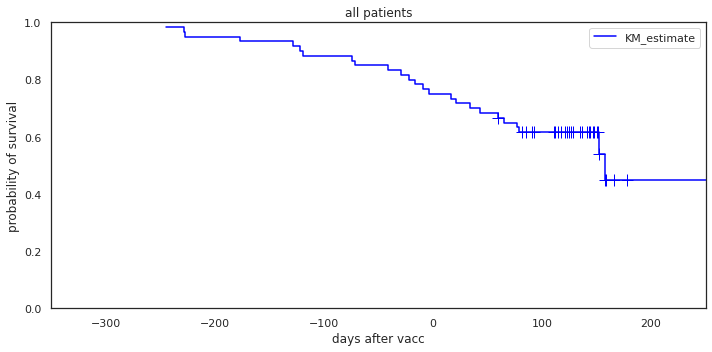

In [484]:
#plot all patients
kmf.plot(ci_show=False, color='blue',show_censors=True)
plt.ylim(0,1)
plt.xlim(-350,250)
plt.title('all patients')
plt.xlabel('days after vacc')
plt.ylabel('probability of survival')
from lifelines.plotting import add_at_risk_counts
#add_at_risk_counts(kmf_high, kmf_low, ax=ax)
plt.tight_layout()
save_path_complete = figure_save_path + 'vaccinated_time_from_2nd_grade3AE.svg'
plt.savefig(save_path_complete)

# Any AE time to event (from 2nd dose)

In [485]:
#this section with code adapted from https://medium.com/towards-artificial-intelligence/survival-analysis-with-python-tutorial-how-what-when-and-why-19a5cfb3c312
import lifelines
from lifelines import KaplanMeierFitter
from lifelines import CoxPHFitter

In [486]:
landmark = '05/17/2021'
os_time_column = 'time'
os_status_column = 'status'
subset_column_label = 'vaccinated'
save_name = 'any_AE_timetoevent_from-vacc2nddose_allpatients.svg'

In [487]:
#prepare AE data (restrict to grade 3 and covnert into time to event formar)
long_term_ae = long_term_ae[~long_term_ae['Patient_ID'].isna()]
patient_table = patient_table[~patient_table.index.isna()]
long_term_ae_grade3 = pd.DataFrame()

for i in set(patient_table.index):
    long_term_ae_subset = long_term_ae[long_term_ae['Patient_ID']==i]
    long_term_ae_subset_grade_ls = long_term_ae_subset['CTCAE_grade'] >= 0
    long_term_ae_subset_grade3 = long_term_ae_subset[long_term_ae_subset['CTCAE_grade'] >= 0]
    if True in list(set(long_term_ae_subset_grade_ls)):
        long_term_ae_subset_grade3_earliest = min(long_term_ae_subset_grade3['Date_AE']) #get first grade 3 AE
        long_term_ae_subset_grade3_status = 1
    else:
        long_term_ae_subset_grade3_earliest = patient_table.loc[list(set(long_term_ae_subset['Patient_ID']))[0]]['last_follow_up']
        long_term_ae_subset_grade3_status = 0

    
    long_term_ae_grade3.loc[i,'date']= long_term_ae_subset_grade3_earliest
    long_term_ae_grade3.loc[i,'status']= long_term_ae_subset_grade3_status
    
long_term_ae_grade3

,date,status
LIK08H,2021-03-26,1.0
RWCFP8,2021-07-27,1.0
F81VCA,2020-10-12,1.0
QLWN64,2021-06-16,1.0
QFE9E8,2021-03-16,1.0
...,...,...
2DP8J8,2021-03-08,1.0
C1ABPH,2020-10-02,1.0
VNW7NT,2021-05-25,1.0
NQ46IB,2021-07-24,1.0


In [488]:
#match vaccination status
long_term_ae_grade3['vaccinated'] = long_term_ae_grade3.index.map(patient_table['vaccinated'].to_dict())
#restrict to vacc
long_term_ae_grade3 = long_term_ae_grade3[long_term_ae_grade3['vaccinated']==True]
long_term_ae_grade3['date_vaccination'] = long_term_ae_grade3.index.map(patient_table['Second_dose_date'].to_dict())
long_term_ae_grade3['time'] = [x.days for x in list(pd.to_datetime(long_term_ae_grade3['date']) - pd.to_datetime(long_term_ae_grade3['date_vaccination']))]
long_term_ae_grade3

,date,status,vaccinated,date_vaccination,time
LIK08H,2021-03-26,1.0,True,2021-03-26,0.0
F81VCA,2020-10-12,1.0,True,2021-05-19,-219.0
QLWN64,2021-06-16,1.0,True,2021-05-30,17.0
QFE9E8,2021-03-16,1.0,True,2021-04-06,-21.0
J7CXX9,2021-03-03,1.0,True,2021-06-08,-97.0
...,...,...,...,...,...
19U0MP,2021-05-26,1.0,True,2021-06-08,-13.0
E61BKL,2020-11-05,1.0,True,2021-02-15,-102.0
FWO178,2021-05-03,1.0,True,NaT,NaN
NQ46IB,2021-07-24,1.0,True,2021-05-17,68.0


In [489]:
#remove nans
long_term_ae_grade3 = long_term_ae_grade3[~long_term_ae_grade3['time'].isna()]

In [490]:
#create an object for kaplan-meier-fitter
kmf= KaplanMeierFitter()

In [491]:
kmf.fit(durations = long_term_ae_grade3[os_time_column].astype(float), event_observed = long_term_ae_grade3[os_status_column].astype(float))

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 60 total observations, 3 right-censored observations>

In [492]:
#generate event table
kmf.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
-332.0,1,1,0,60,60
-308.0,1,1,0,0,59
-231.0,1,1,0,0,58
-222.0,2,2,0,0,57
-219.0,1,1,0,0,55
-204.0,1,1,0,0,54
-200.0,1,1,0,0,53
-195.0,1,1,0,0,52
-193.0,1,1,0,0,51


In [493]:
kmf.event_table.to_csv(figure_source_path+'vaccinated_timefrom_2ndvacc_anyAE.csv')

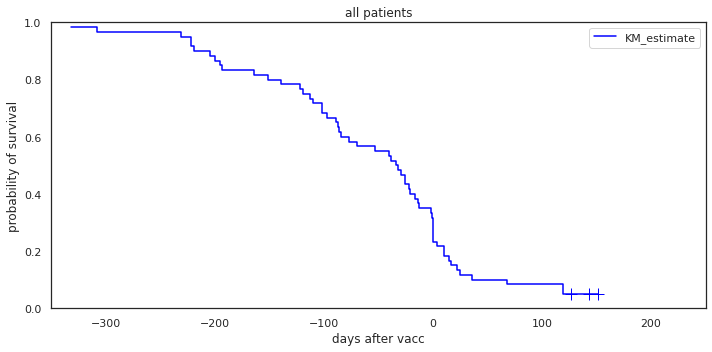

In [494]:
#plot all patients
kmf.plot(ci_show=False, color='blue',show_censors=True)
plt.ylim(0,1)
plt.xlim(-350,250)
plt.title('all patients')
plt.xlabel('days after vacc')
plt.ylabel('probability of survival')
from lifelines.plotting import add_at_risk_counts
add_at_risk_counts(kmf, ax=ax)
plt.tight_layout()
save_path_complete = figure_save_path + 'vaccinated_time_from_2nd_anyAE.svg'
plt.savefig(save_path_complete)

# Estimate CRS frequency

In [495]:
from scipy.stats import beta

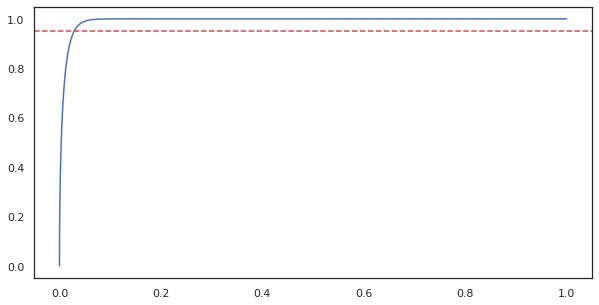

0.029006029006029003

In [496]:
x = np.linspace(0,1,1000000)
outs = beta.cdf(x, a= 0.5, b= 65.5)
plt.plot(x, outs)
plt.axhline(0.95, c= 'r', linestyle ='--')
plt.show()
max(x[outs<0.95])

In [497]:
import statsmodels.stats.proportion
statsmodels.stats.proportion.proportion_confint(19,64,alpha=0.05, method='jeffrey')

(0.19575072736576407, 0.4159043113317798)

In [498]:
statsmodels.stats.proportion.proportion_confint(14,35,alpha=0.05, method='beta')

(0.23870811045334153, 0.5788822781179002)

In [499]:
## iter_list = [5,
3,
1,
1,
1,
3,
1,
1,
2,
2,
0,
4,
0,
1,
1,
3,
1,
0,
1,
0,
0,
0,
1,
1,
1,
1,
0,
1,
1,
1,
1,
1]

CI_list = []
for i in iter_list:
    a = statsmodels.stats.proportion.proportion_confint(i,26,alpha=0.05, method='beta')
    a = [x*100 for x in a]
    CI_list.append(a)
    
dict(zip(iter_list,CI_list))

SyntaxError: unmatched ']' (2656361470.py, line 32)